## ⚙️ Import Libraries

In [40]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


In [41]:
!pip install segmentation-models-pytorch


/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


## ⏳ Load the Data (no outlier)

In [42]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from skimage.util import random_noise
from scipy.ndimage import rotate

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)


# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
# Load dataset
data = np.load("/kaggle/input/cleean2-data/cleaned_data.npz")
X_train = data["training_set_filtered"]
y_train = data["masks_filtered"]
X_test = data["test_set"]




Using device: cuda


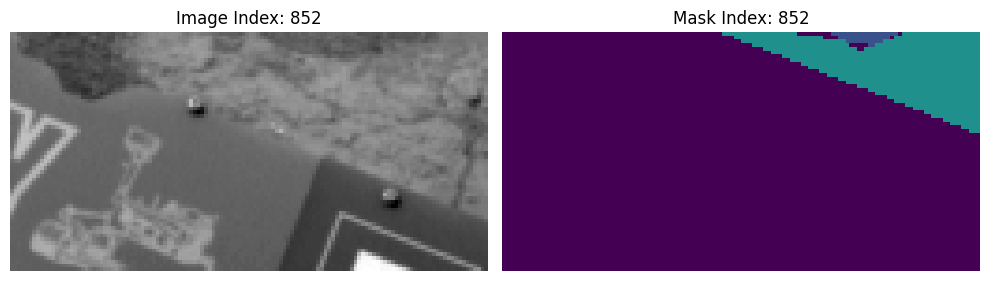

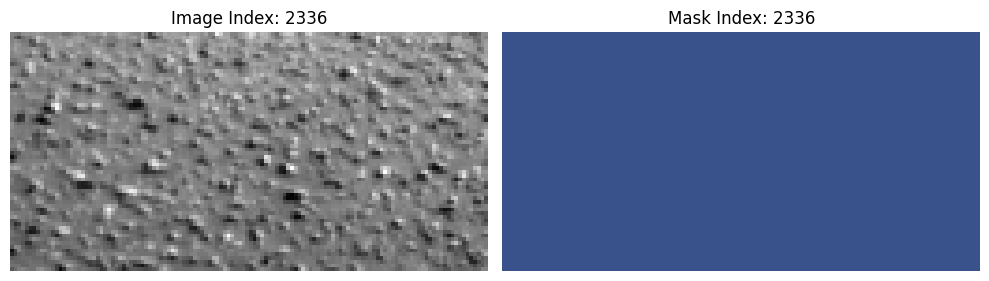

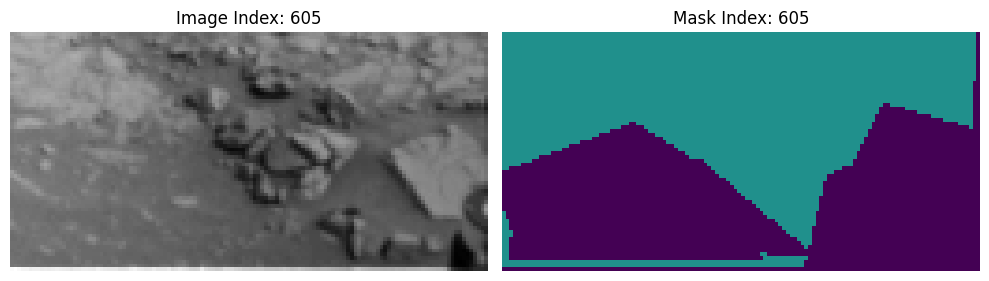

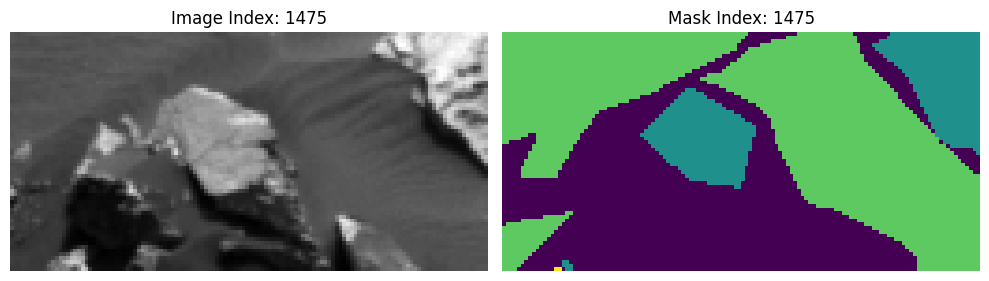

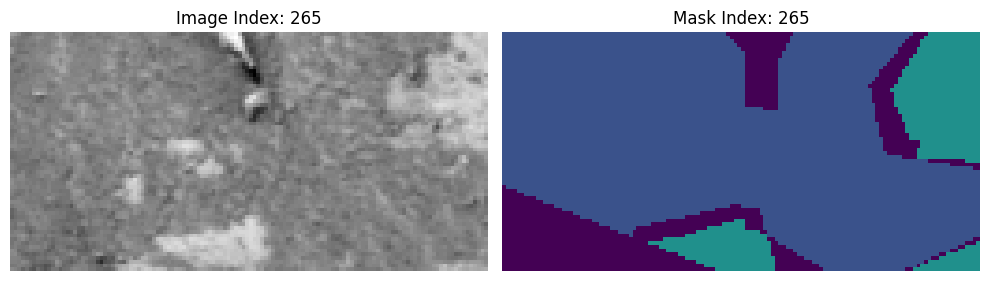

In [43]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis",vmin=0,vmax=4)
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## PYTORCH

In [44]:
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader, Dataset
from sklearn.model_selection import train_test_split
import segmentation_models_pytorch as smp
from skimage.util import random_noise
from scipy.ndimage import rotate
from sklearn.metrics import jaccard_score
import torch
import torch.nn as nn

# Set seed for reproducibility
np.random.seed(42)
torch.manual_seed(42)

In [45]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
from scipy.ndimage import rotate
import matplotlib.pyplot as plt
from skimage.util import random_noise

# Define hyperparameters
hyperparams = {
    "model": {
        "architecture": "Unet",
        "encoder_name": "mobilenet_v2",
        "encoder_weights": None,
        "input_channels": 1,
        "num_classes": 5,
    },
    "training": {
        "batch_size": 32,
        "learning_rate": 1e-4,
        "num_epochs":250,
    },
    "loss_function": {
        "type": "WeightedCrossEntropy",
    },
    "data": {
        "augmentation": {
            "rotation_angle": 20,
            "noise_amount": 0.03,
        },
    },
}



In [46]:
# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

"""X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=200, random_state=42
)"""

# Add channel dimension and normalize
X_train = X_train[..., np.newaxis] / 255.0
X_val = X_val[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0



Using device: cuda


In [47]:
# Dataset class
class SegmentationDataset(Dataset):
    def __init__(self, images, masks=None, augmentations=None):
        self.images = images
        self.masks = masks
        self.augmentations = augmentations

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx] if self.masks is not None else None

        if self.augmentations:
            image, mask = self.augmentations(image, mask)

        image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)  # (C, H, W)
        mask = torch.tensor(mask, dtype=torch.long) if mask is not None else None
        return (image, mask) if mask is not None else image



In [48]:
from skimage.util import random_noise
from scipy.ndimage import rotate
import numpy as np

# Define individual augmentation functions
def rotate_image_and_mask(image, mask, angle):
    image = rotate(image, angle, reshape=False, mode="constant", order=1)
    mask = rotate(mask, angle, reshape=False, mode="constant", order=0)
    return image, mask

def add_noise_to_image(image, mask, noise_amount):
    image = random_noise(image, mode="s&p", amount=noise_amount)
    return np.clip(image, 0, 1), mask

def invert_image_and_mask(image, mask):
    image = 1.0 - image
    return image, mask

def flip_horizontal(image, mask):
    image = np.fliplr(image)
    mask = np.fliplr(mask)
    return image, mask

def flip_vertical(image, mask):
    image = np.flipud(image)
    mask = np.flipud(mask)
    return image, mask

# Apply augmentations and update X_train and y_train
def apply_augmentations_and_update(X_train, y_train):
    augmented_images = []
    augmented_masks = []

    """augmentations = {
        "rotation": lambda img, msk: rotate_image_and_mask(img, msk, angle=np.random.uniform(-20, 20)),
        "noise": lambda img, msk: add_noise_to_image(img, msk, noise_amount=0.03),
        "invert": invert_image_and_mask,
        "horizontal_flip": flip_horizontal,
        "vertical_flip": flip_vertical,
    }

    # Apply each augmentation and collect augmented data
    for aug_name, aug_function in augmentations.items():
        print(f"Applying {aug_name} augmentation...")
        for image, mask in zip(X_train, y_train):
            aug_image, aug_mask = aug_function(image, mask)
            augmented_images.append(aug_image)
            augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Update X_train and y_train by concatenating augmented data
    X_train = np.concatenate([X_train, augmented_images], axis=0)
    y_train = np.concatenate([y_train, augmented_masks], axis=0)"""

    print(f"Updated X_train shape: {X_train.shape}")
    print(f"Updated y_train shape: {y_train.shape}")
    return X_train, y_train

# Apply augmentations and update datasets
X_train, y_train = apply_augmentations_and_update(X_train, y_train)

# DataLoaders
train_dataset = SegmentationDataset(X_train, y_train)
val_dataset = SegmentationDataset(X_val, y_val)
train_loader = DataLoader(train_dataset, batch_size=hyperparams["training"]["batch_size"], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)


Updated X_train shape: (2004, 64, 128, 1)
Updated y_train shape: (2004, 64, 128)


In [49]:
import numpy as np

def compute_class_weights(masks, num_classes):
    masks_flat = masks.astype(np.int64).reshape(-1)  # Ensure integer type for bincount
    pixel_counts = np.bincount(masks_flat, minlength=num_classes)
    total_pixels = pixel_counts.sum()
    weights = total_pixels / (pixel_counts + 1e-6)  # Avoid division by zero
    return weights / weights.sum()

# Example usage
class_weights = compute_class_weights(y_train, hyperparams["model"]["num_classes"])
print("Computed class weights:", class_weights)


Computed class weights: [0.00524455 0.00377298 0.00531845 0.00705449 0.97860952]


In [50]:
import torch
import numpy as np

def calculate_mean_iou(y_true, y_pred, num_classes, ignore_class=0):
    """
    Calculate mean IoU and per-class IoU.

    Args:
        y_true (torch.Tensor): Ground truth masks of shape (N, H, W).
        y_pred (torch.Tensor): Predicted masks of shape (N, H, W).
        num_classes (int): Total number of classes.
        ignore_class (int): Class to ignore in IoU calculations.

    Returns:
        float: Mean IoU.
        dict: Per-class IoU.
    """
    ious = []
    class_ious = {}

    for c in range(num_classes):
        if c == ignore_class:
            continue

        y_true_c = (y_true == c).int()
        y_pred_c = (y_pred == c).int()

        intersection = (y_true_c & y_pred_c).sum().item()
        union = (y_true_c | y_pred_c).sum().item()

        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)
        class_ious[c] = iou

    mean_iou = np.mean(ious) if ious else 0.0
    return mean_iou, class_ious


In [51]:
class_weights = compute_class_weights(y_train, num_classes=5)
print("Class Weights (Alpha):", class_weights)


Class Weights (Alpha): [0.00524455 0.00377298 0.00531845 0.00705449 0.97860952]


In [52]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=None, size_average=True):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = torch.tensor(alpha, dtype=torch.float32).to(device) if alpha is not None else None
        self.size_average = size_average

    def forward(self, inputs, targets):
        if inputs.dim() > 2:
            inputs = inputs.view(inputs.size(0), inputs.size(1), -1)  # N,C,H,W -> N,C,H*W
            inputs = inputs.transpose(1, 2)                          # N,C,H*W -> N,H*W,C
            inputs = inputs.contiguous().view(-1, inputs.size(2))   # N,H*W,C -> N*H*W,C
        targets = targets.view(-1, 1)

        logpt = F.log_softmax(inputs, dim=1)
        logpt = logpt.gather(1, targets).squeeze(1)
        pt = logpt.exp()

        if self.alpha is not None:
            at = self.alpha.gather(0, targets.view(-1))
            logpt = logpt * at

        loss = -1 * (1 - pt) ** self.gamma * logpt
        return loss.mean() if self.size_average else loss.sum()

focal_loss = FocalLoss(
    gamma=2,  # Adjust this to focus on harder samples
    alpha=class_weights,  # Use computed class weights
    size_average=True
)


/opt/conda/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:60: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 1/250, Train Loss: 0.4401, Val Loss: 0.0664, Mean IoU: 0.1197
Class 0 IoU: 0.0940
Class 1 IoU: 0.1407
Class 2 IoU: 0.2397
Class 3 IoU: 0.0043


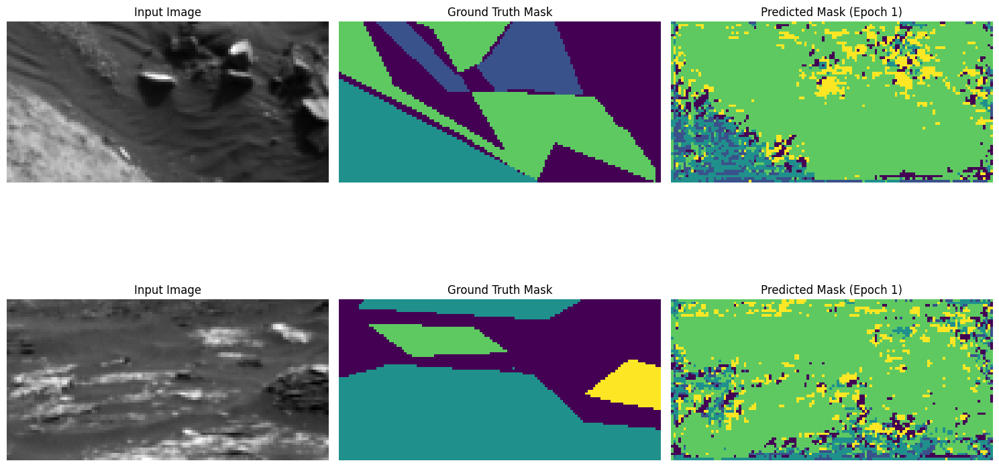

Model saved with new best Mean IoU: 0.1197
Epoch 2/250, Train Loss: 0.3548, Val Loss: 0.0420, Mean IoU: 0.2172
Class 0 IoU: 0.2063
Class 1 IoU: 0.2207
Class 2 IoU: 0.4348
Class 3 IoU: 0.0068


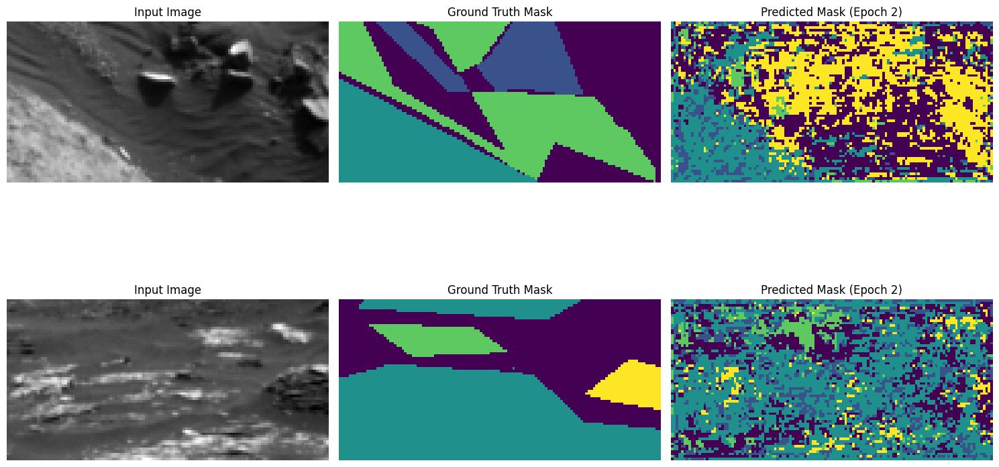

Model saved with new best Mean IoU: 0.2172
Epoch 3/250, Train Loss: 0.3120, Val Loss: 0.0396, Mean IoU: 0.2351
Class 0 IoU: 0.2364
Class 1 IoU: 0.2302
Class 2 IoU: 0.4661
Class 3 IoU: 0.0079


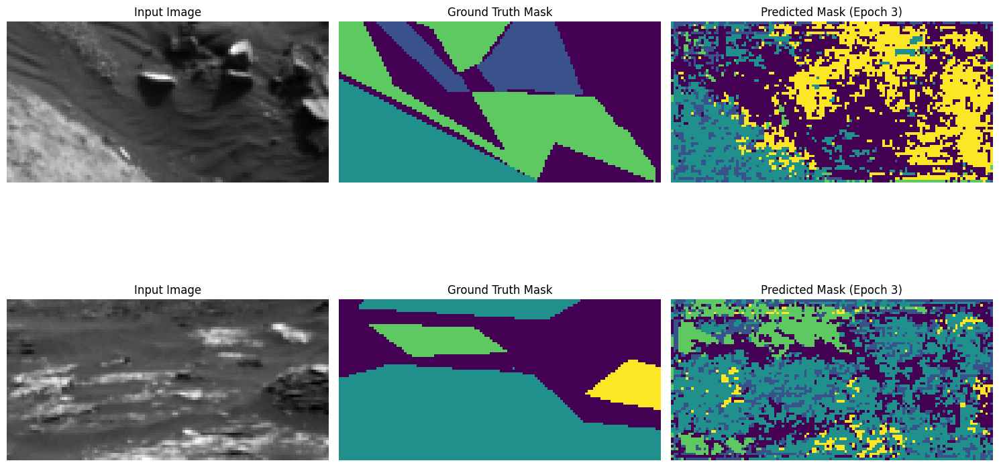

Model saved with new best Mean IoU: 0.2351
Epoch 4/250, Train Loss: 0.2909, Val Loss: 0.0390, Mean IoU: 0.2408
Class 0 IoU: 0.2482
Class 1 IoU: 0.2345
Class 2 IoU: 0.4728
Class 3 IoU: 0.0079


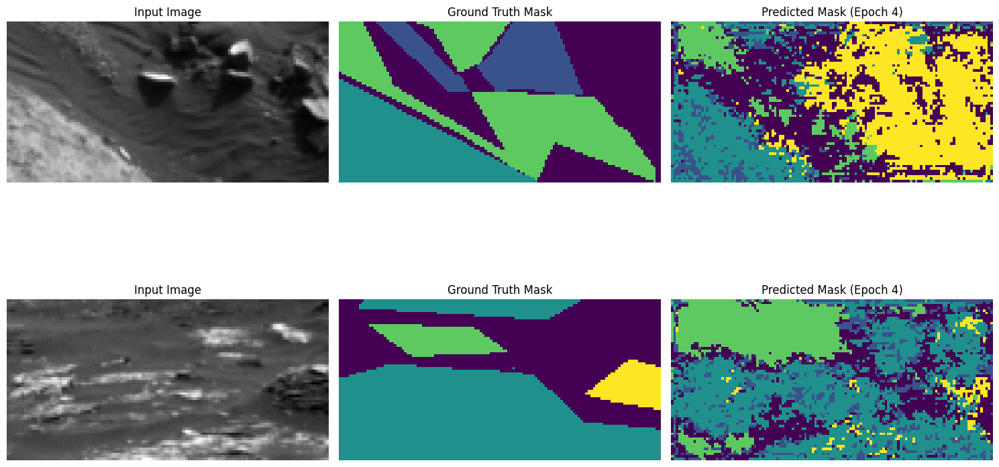

Model saved with new best Mean IoU: 0.2408
Epoch 5/250, Train Loss: 0.2697, Val Loss: 0.0369, Mean IoU: 0.2330
Class 0 IoU: 0.2262
Class 1 IoU: 0.2447
Class 2 IoU: 0.4516
Class 3 IoU: 0.0096


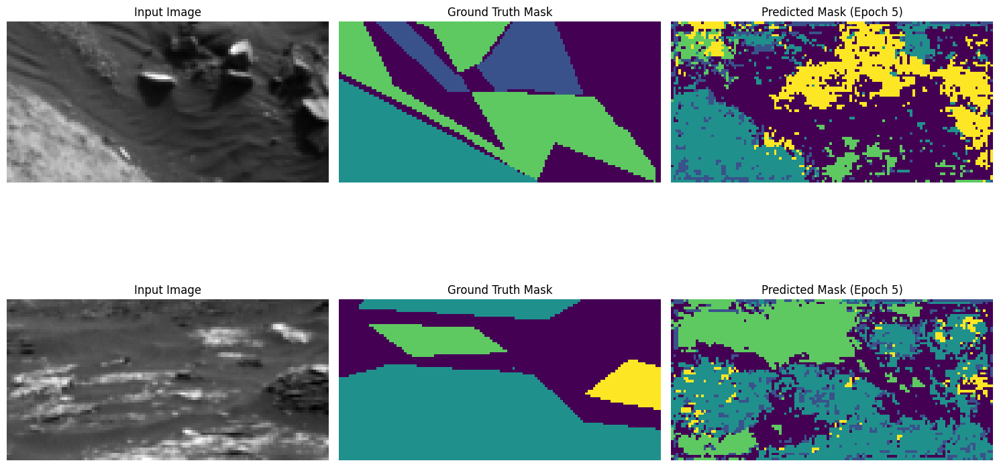

Epoch 6/250, Train Loss: 0.2517, Val Loss: 0.0346, Mean IoU: 0.2452
Class 0 IoU: 0.2320
Class 1 IoU: 0.2612
Class 2 IoU: 0.4734
Class 3 IoU: 0.0141


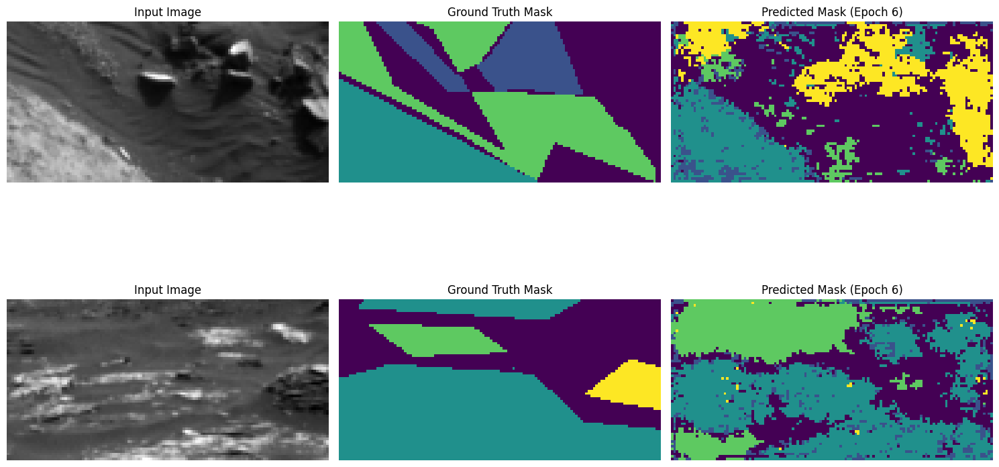

Model saved with new best Mean IoU: 0.2452
Epoch 7/250, Train Loss: 0.2412, Val Loss: 0.0378, Mean IoU: 0.2622
Class 0 IoU: 0.2713
Class 1 IoU: 0.2613
Class 2 IoU: 0.5042
Class 3 IoU: 0.0121


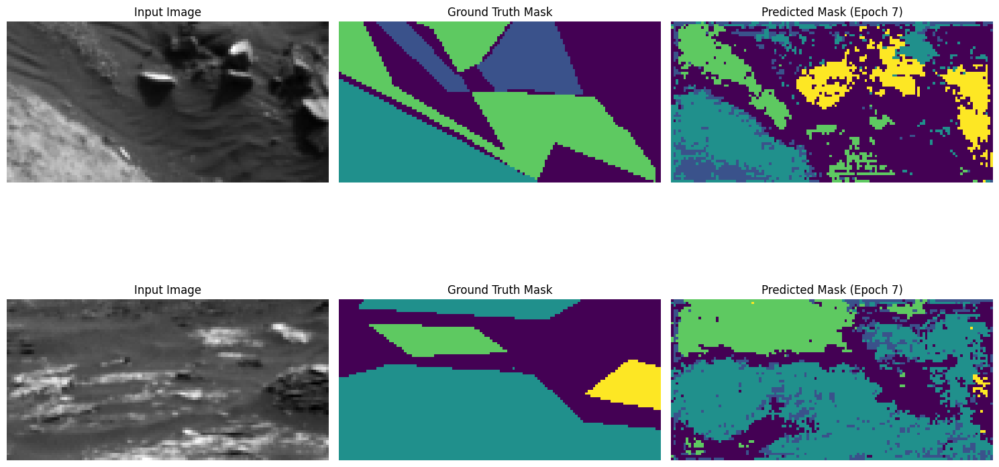

Model saved with new best Mean IoU: 0.2622
Epoch 8/250, Train Loss: 0.2293, Val Loss: 0.0371, Mean IoU: 0.2601
Class 0 IoU: 0.2757
Class 1 IoU: 0.2560
Class 2 IoU: 0.4959
Class 3 IoU: 0.0126


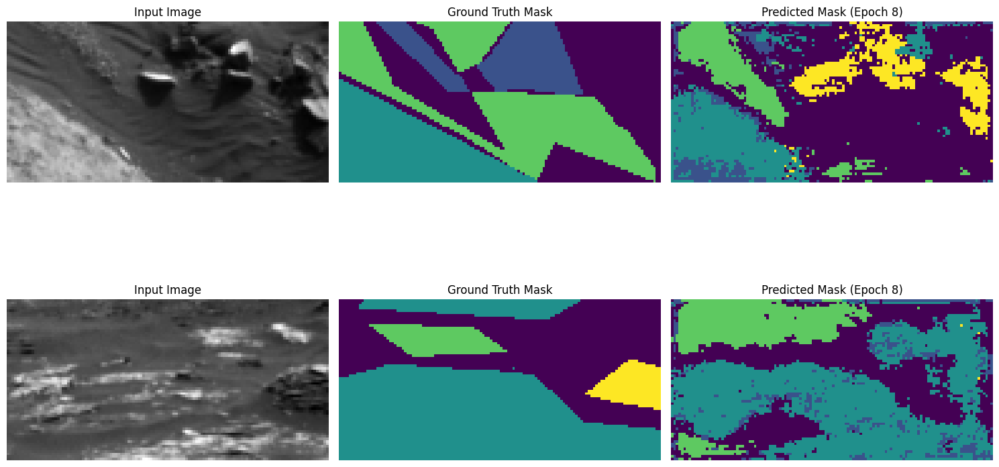

Epoch 9/250, Train Loss: 0.2180, Val Loss: 0.0381, Mean IoU: 0.2652
Class 0 IoU: 0.2773
Class 1 IoU: 0.2733
Class 2 IoU: 0.4985
Class 3 IoU: 0.0116


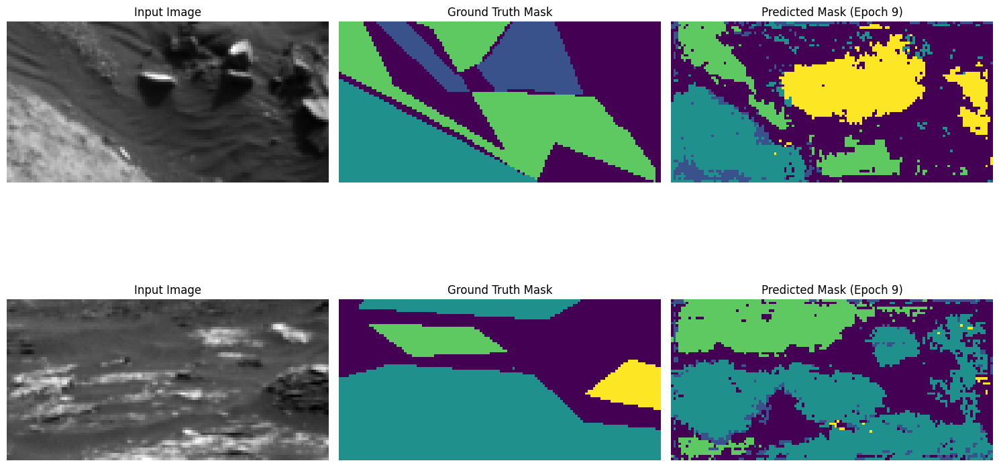

Model saved with new best Mean IoU: 0.2652
Epoch 10/250, Train Loss: 0.2102, Val Loss: 0.0373, Mean IoU: 0.2635
Class 0 IoU: 0.2825
Class 1 IoU: 0.2656
Class 2 IoU: 0.4917
Class 3 IoU: 0.0140


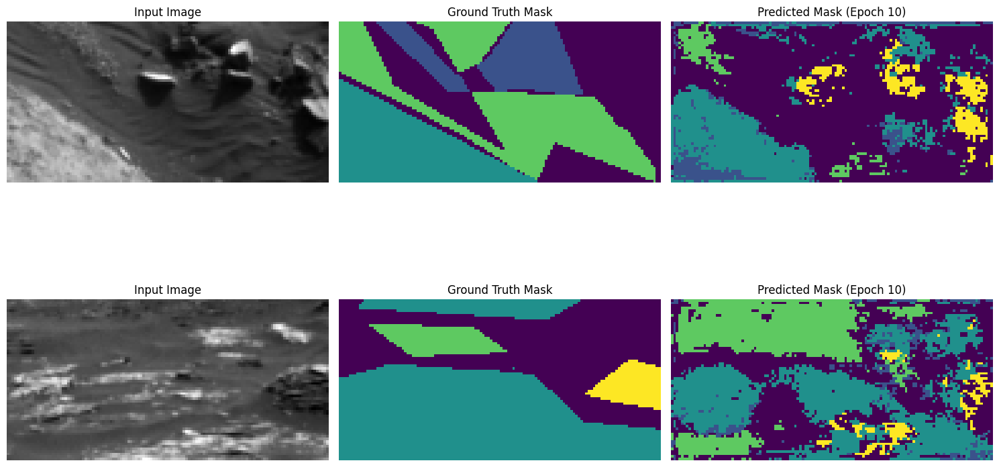

Epoch 11/250, Train Loss: 0.2079, Val Loss: 0.0348, Mean IoU: 0.2757
Class 0 IoU: 0.2971
Class 1 IoU: 0.2726
Class 2 IoU: 0.5057
Class 3 IoU: 0.0272


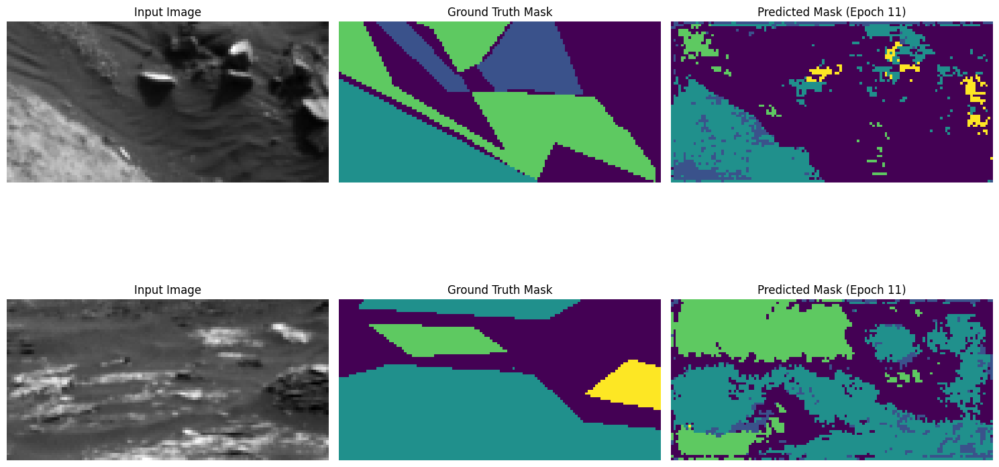

Model saved with new best Mean IoU: 0.2757
Epoch 12/250, Train Loss: 0.1993, Val Loss: 0.0415, Mean IoU: 0.2790
Class 0 IoU: 0.3197
Class 1 IoU: 0.2701
Class 2 IoU: 0.5135
Class 3 IoU: 0.0129


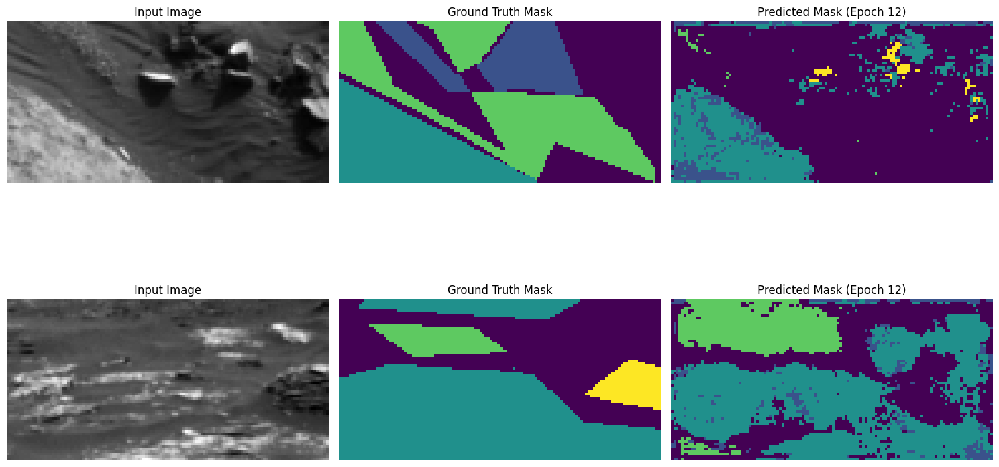

Model saved with new best Mean IoU: 0.2790
Epoch 13/250, Train Loss: 0.1996, Val Loss: 0.0320, Mean IoU: 0.2789
Class 0 IoU: 0.3055
Class 1 IoU: 0.2754
Class 2 IoU: 0.5152
Class 3 IoU: 0.0195


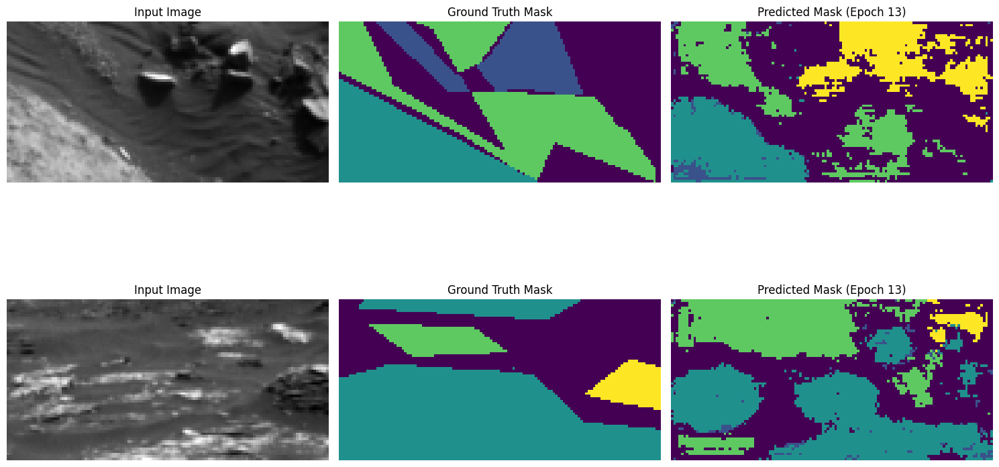

Epoch 14/250, Train Loss: 0.2065, Val Loss: 0.0312, Mean IoU: 0.2764
Class 0 IoU: 0.3331
Class 1 IoU: 0.2396
Class 2 IoU: 0.5154
Class 3 IoU: 0.0176


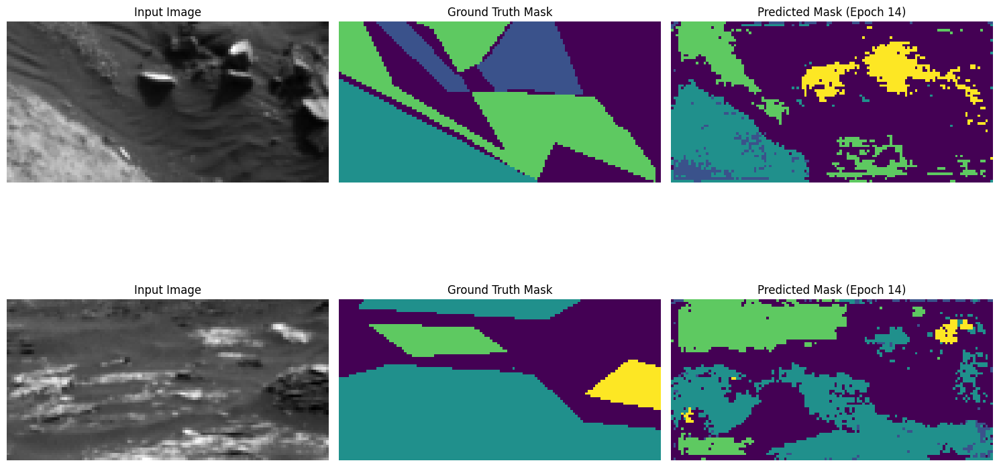

Epoch 15/250, Train Loss: 0.1926, Val Loss: 0.0300, Mean IoU: 0.2948
Class 0 IoU: 0.3420
Class 1 IoU: 0.2932
Class 2 IoU: 0.5223
Class 3 IoU: 0.0217


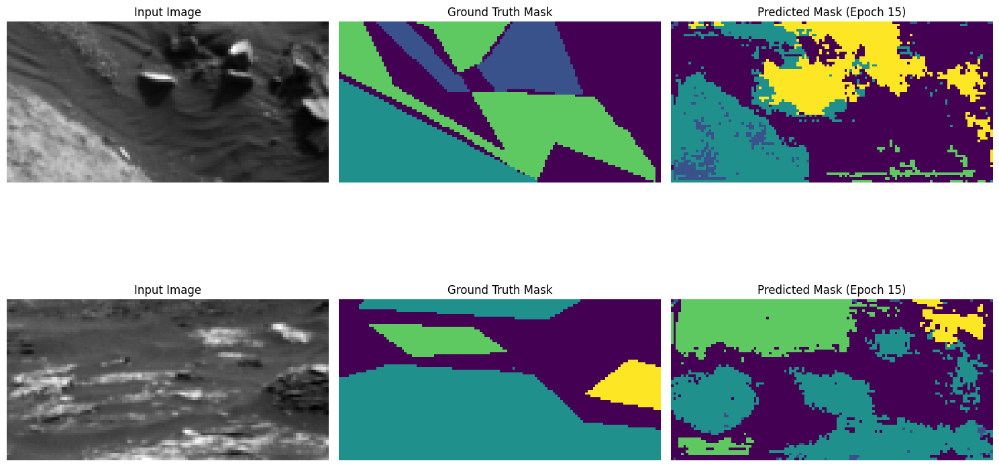

Model saved with new best Mean IoU: 0.2948
Epoch 16/250, Train Loss: 0.1777, Val Loss: 0.0309, Mean IoU: 0.2994
Class 0 IoU: 0.3553
Class 1 IoU: 0.2889
Class 2 IoU: 0.5244
Class 3 IoU: 0.0291


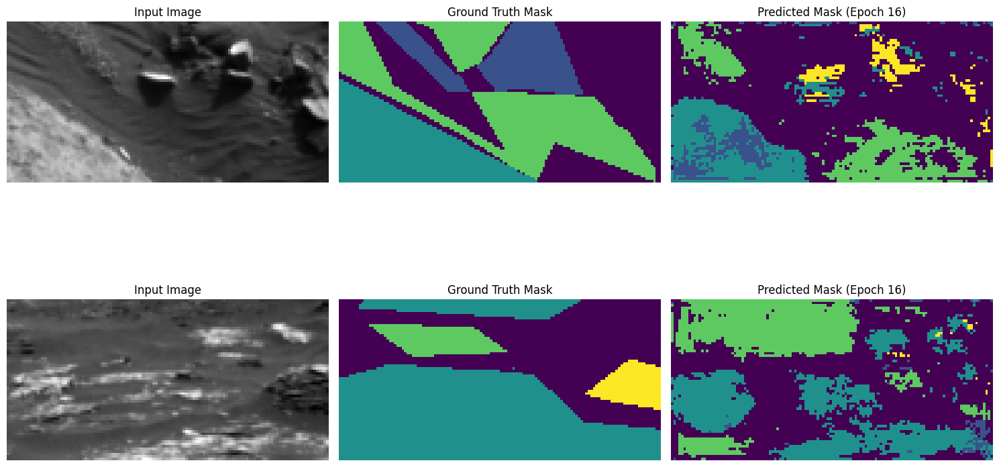

Model saved with new best Mean IoU: 0.2994
Epoch 17/250, Train Loss: 0.1713, Val Loss: 0.0353, Mean IoU: 0.3107
Class 0 IoU: 0.3844
Class 1 IoU: 0.2927
Class 2 IoU: 0.5203
Class 3 IoU: 0.0456


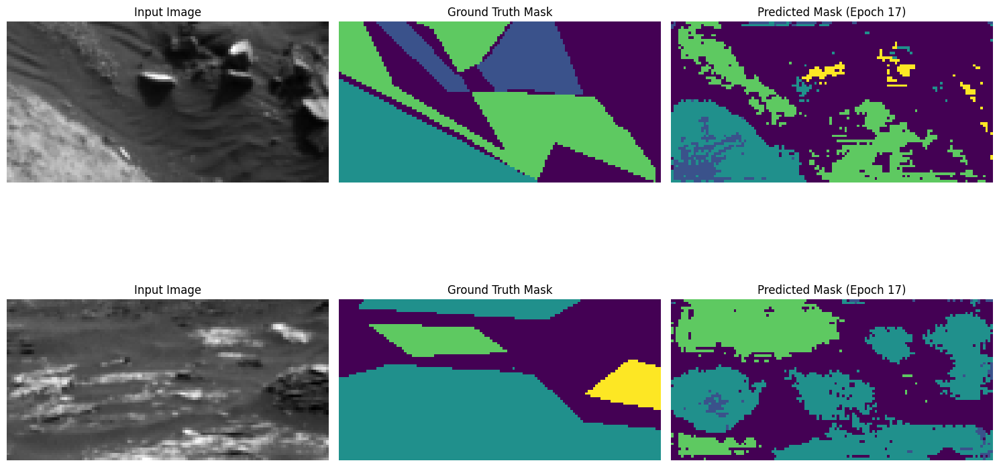

Model saved with new best Mean IoU: 0.3107
Epoch 18/250, Train Loss: 0.1666, Val Loss: 0.0336, Mean IoU: 0.3065
Class 0 IoU: 0.3615
Class 1 IoU: 0.3062
Class 2 IoU: 0.5124
Class 3 IoU: 0.0459


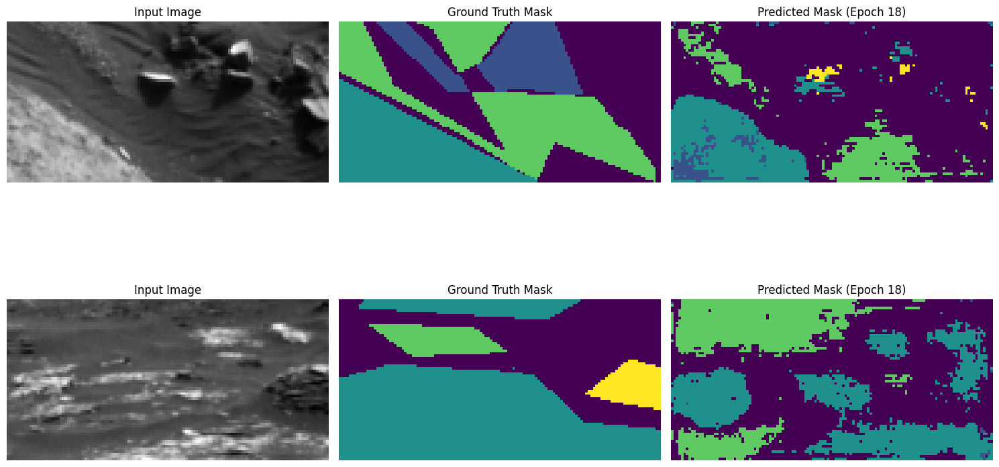

Epoch 19/250, Train Loss: 0.1584, Val Loss: 0.0362, Mean IoU: 0.3232
Class 0 IoU: 0.3959
Class 1 IoU: 0.3042
Class 2 IoU: 0.5257
Class 3 IoU: 0.0671


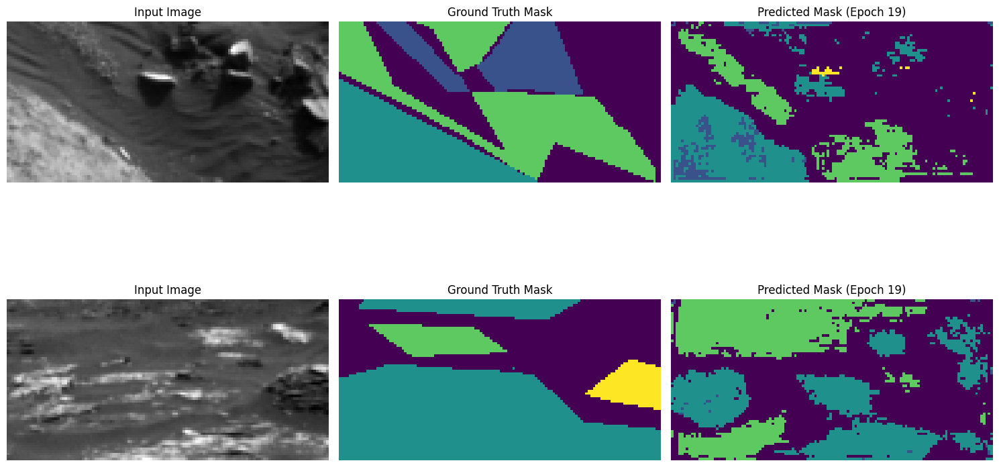

Model saved with new best Mean IoU: 0.3232
Epoch 20/250, Train Loss: 0.1562, Val Loss: 0.0343, Mean IoU: 0.3091
Class 0 IoU: 0.3744
Class 1 IoU: 0.2875
Class 2 IoU: 0.5180
Class 3 IoU: 0.0565


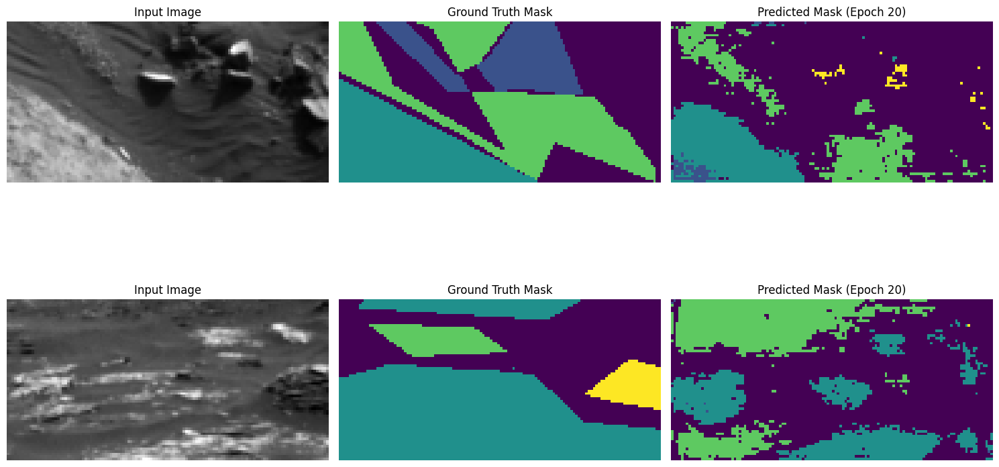

Epoch 21/250, Train Loss: 0.1540, Val Loss: 0.0350, Mean IoU: 0.3008
Class 0 IoU: 0.3810
Class 1 IoU: 0.2865
Class 2 IoU: 0.5192
Class 3 IoU: 0.0163


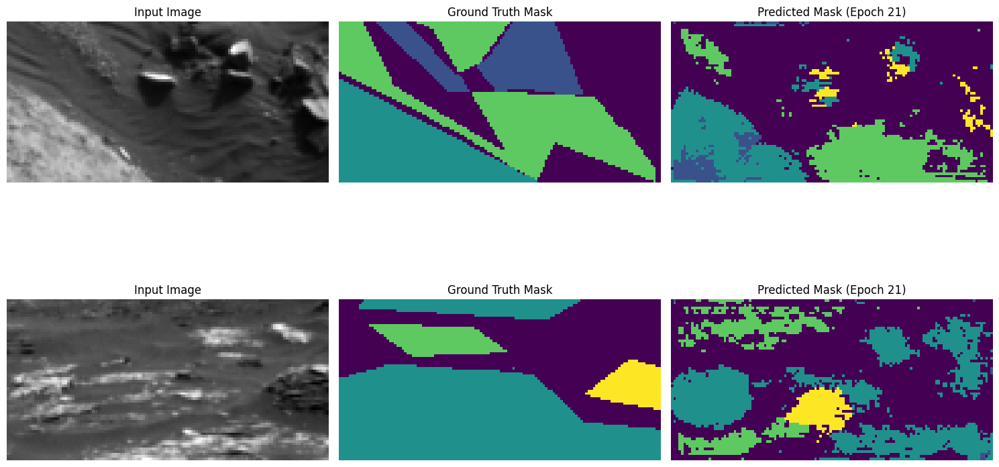

Epoch 22/250, Train Loss: 0.1575, Val Loss: 0.0408, Mean IoU: 0.2799
Class 0 IoU: 0.3462
Class 1 IoU: 0.2606
Class 2 IoU: 0.5059
Class 3 IoU: 0.0068


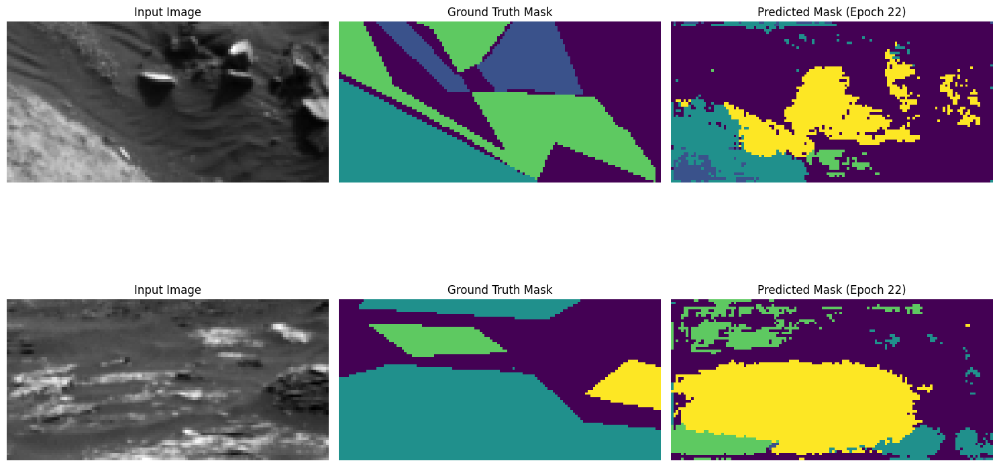

Epoch 23/250, Train Loss: 0.1576, Val Loss: 0.0408, Mean IoU: 0.2938
Class 0 IoU: 0.3941
Class 1 IoU: 0.3060
Class 2 IoU: 0.4645
Class 3 IoU: 0.0104


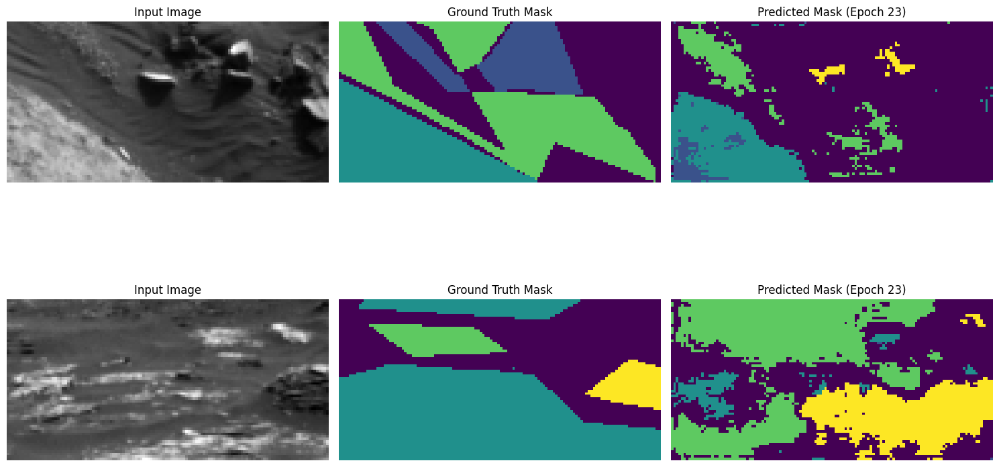

Epoch 24/250, Train Loss: 0.1548, Val Loss: 0.0367, Mean IoU: 0.3123
Class 0 IoU: 0.3870
Class 1 IoU: 0.3001
Class 2 IoU: 0.5212
Class 3 IoU: 0.0411


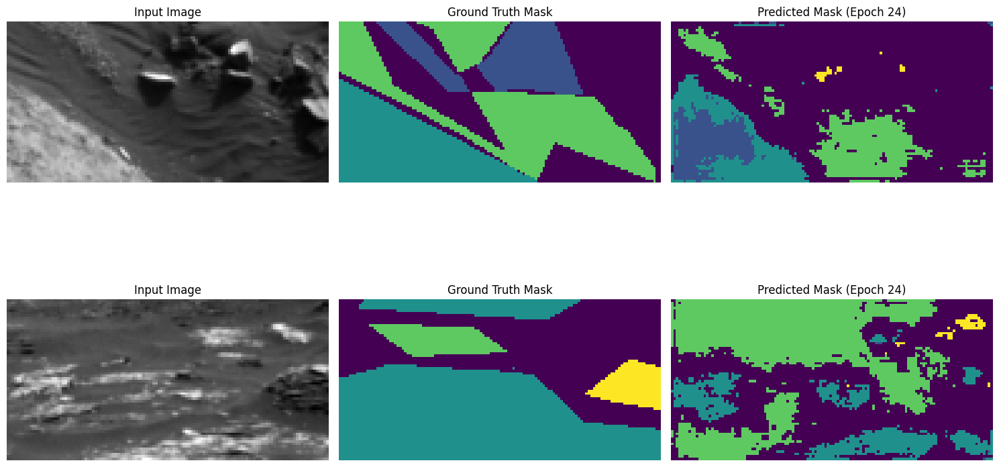

Epoch 25/250, Train Loss: 0.1482, Val Loss: 0.0461, Mean IoU: 0.2961
Class 0 IoU: 0.3964
Class 1 IoU: 0.2744
Class 2 IoU: 0.5046
Class 3 IoU: 0.0091


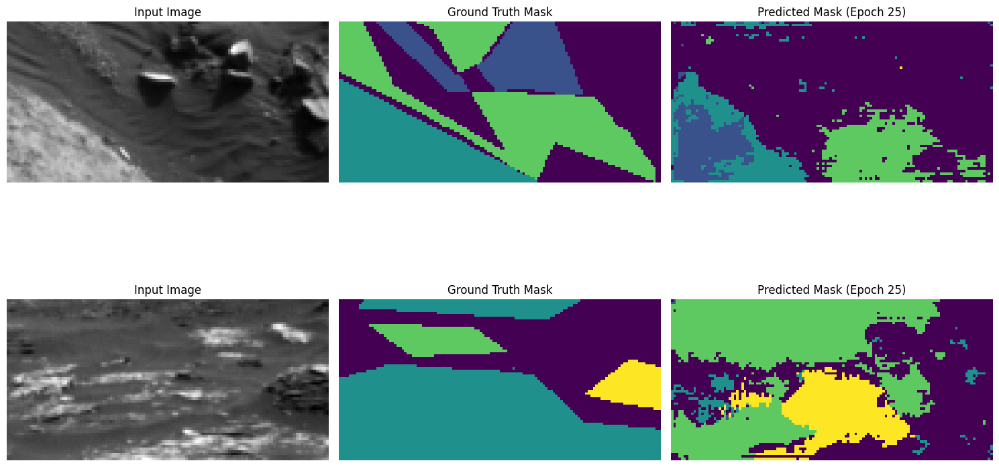

Epoch 26/250, Train Loss: 0.1529, Val Loss: 0.0385, Mean IoU: 0.3014
Class 0 IoU: 0.3790
Class 1 IoU: 0.2838
Class 2 IoU: 0.5086
Class 3 IoU: 0.0344


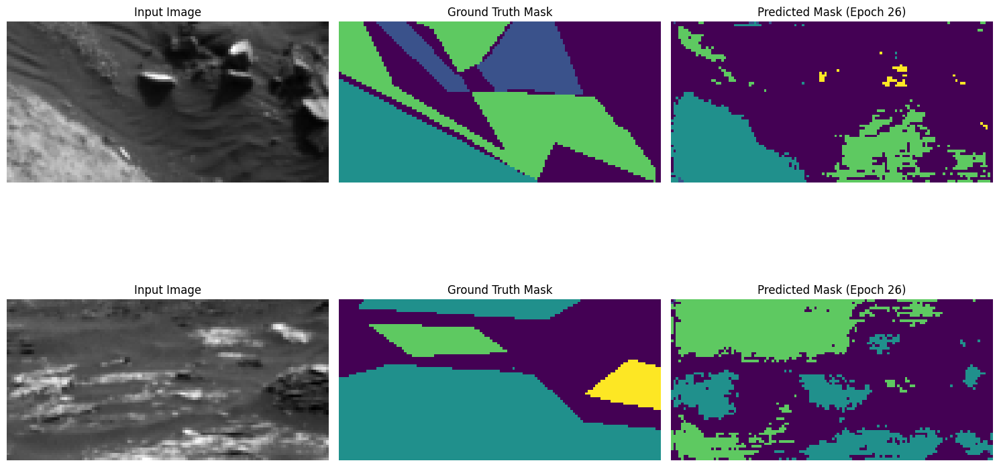

Epoch 27/250, Train Loss: 0.1517, Val Loss: 0.0411, Mean IoU: 0.3158
Class 0 IoU: 0.4131
Class 1 IoU: 0.3001
Class 2 IoU: 0.5182
Class 3 IoU: 0.0320


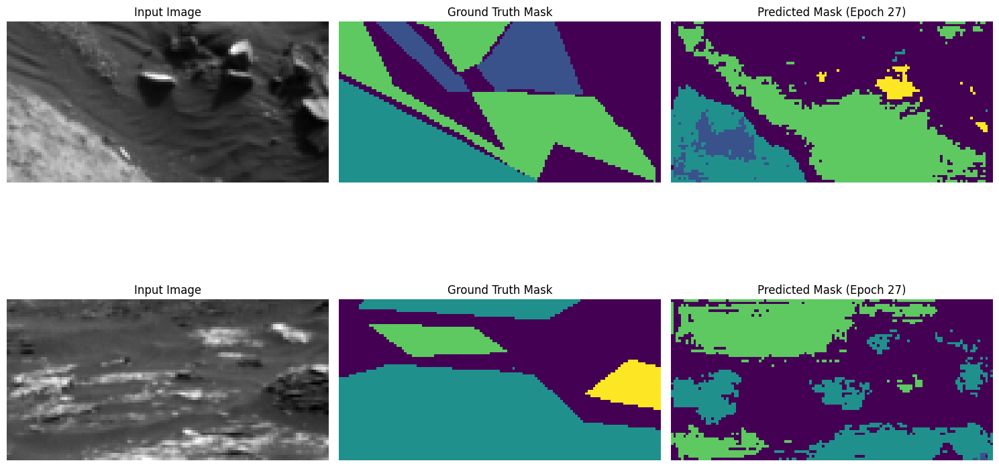

Epoch 28/250, Train Loss: 0.1407, Val Loss: 0.0385, Mean IoU: 0.3279
Class 0 IoU: 0.4200
Class 1 IoU: 0.3054
Class 2 IoU: 0.5208
Class 3 IoU: 0.0655


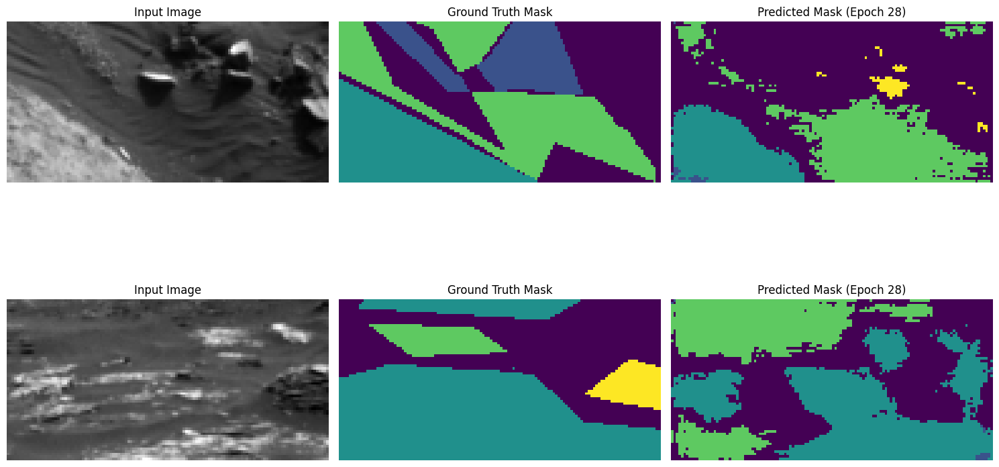

Model saved with new best Mean IoU: 0.3279
Epoch 29/250, Train Loss: 0.1368, Val Loss: 0.0426, Mean IoU: 0.3141
Class 0 IoU: 0.3930
Class 1 IoU: 0.3068
Class 2 IoU: 0.5181
Class 3 IoU: 0.0387


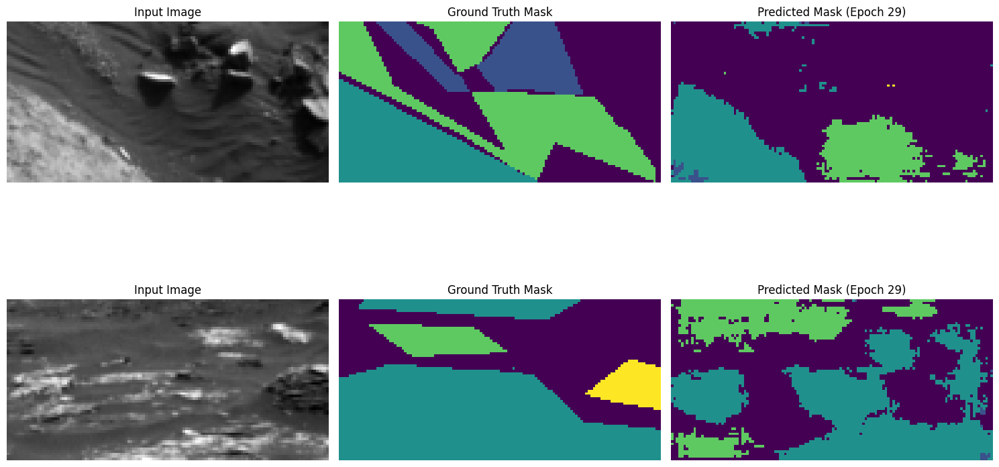

Epoch 30/250, Train Loss: 0.1307, Val Loss: 0.0462, Mean IoU: 0.3185
Class 0 IoU: 0.4151
Class 1 IoU: 0.2833
Class 2 IoU: 0.5069
Class 3 IoU: 0.0686


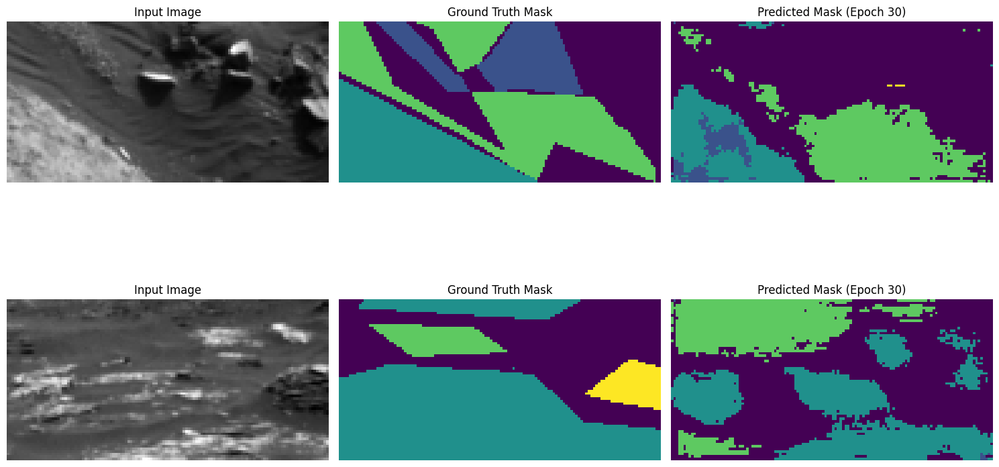

Epoch 31/250, Train Loss: 0.1262, Val Loss: 0.0512, Mean IoU: 0.3224
Class 0 IoU: 0.4471
Class 1 IoU: 0.3032
Class 2 IoU: 0.5214
Class 3 IoU: 0.0178


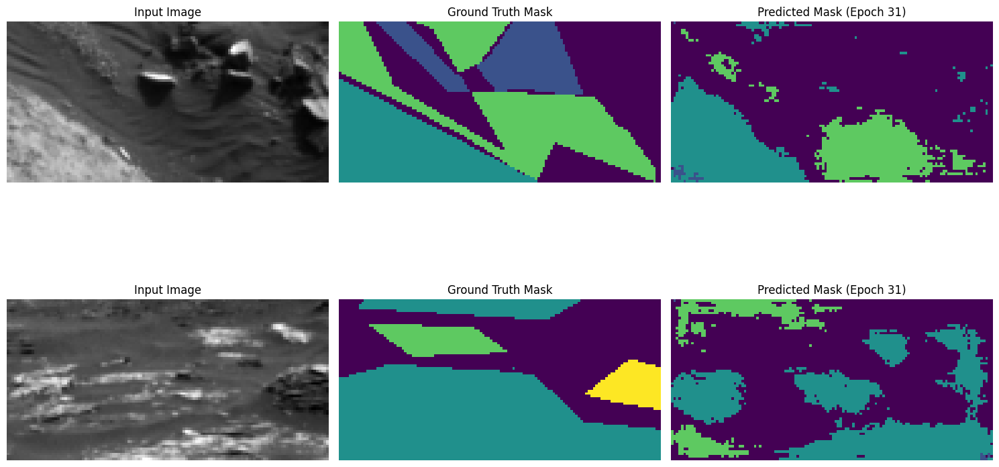

Epoch 32/250, Train Loss: 0.1273, Val Loss: 0.0452, Mean IoU: 0.3369
Class 0 IoU: 0.4513
Class 1 IoU: 0.2973
Class 2 IoU: 0.5366
Class 3 IoU: 0.0623


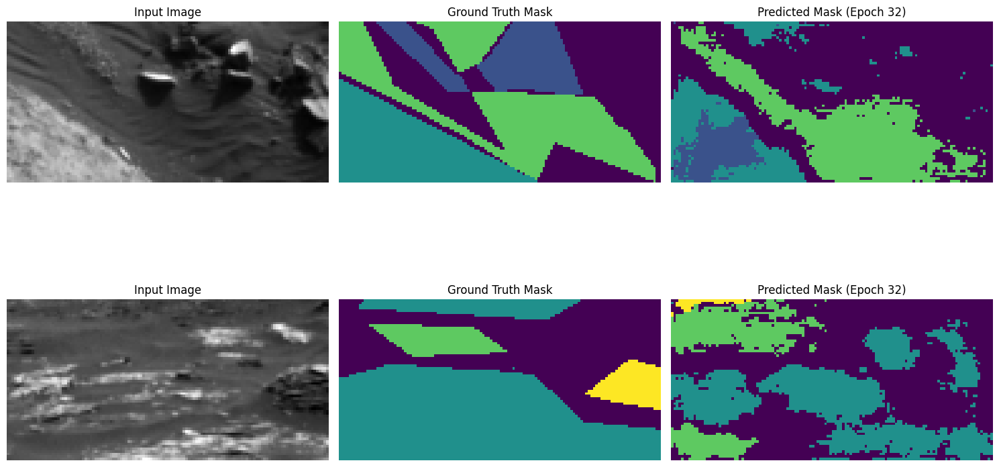

Model saved with new best Mean IoU: 0.3369
Epoch 33/250, Train Loss: 0.1219, Val Loss: 0.0514, Mean IoU: 0.3342
Class 0 IoU: 0.4360
Class 1 IoU: 0.3086
Class 2 IoU: 0.5321
Class 3 IoU: 0.0601


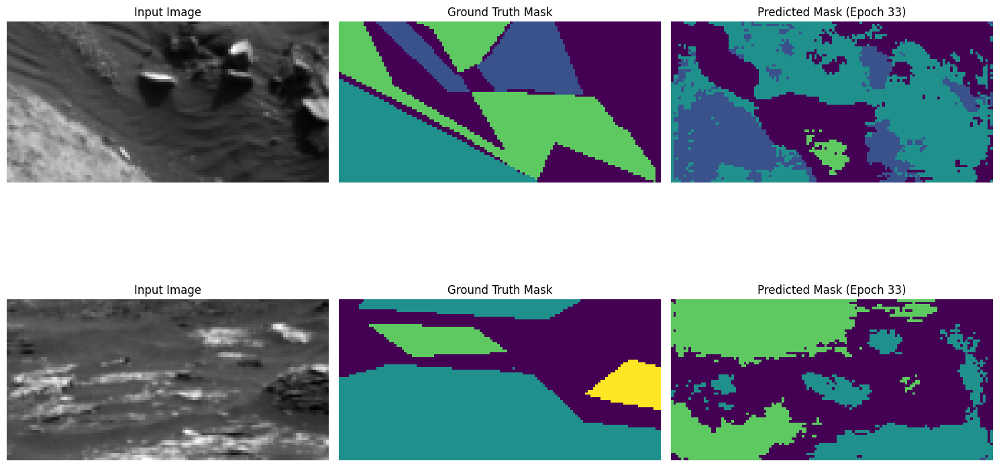

Epoch 34/250, Train Loss: 0.1199, Val Loss: 0.0452, Mean IoU: 0.3308
Class 0 IoU: 0.4274
Class 1 IoU: 0.3087
Class 2 IoU: 0.5307
Class 3 IoU: 0.0562


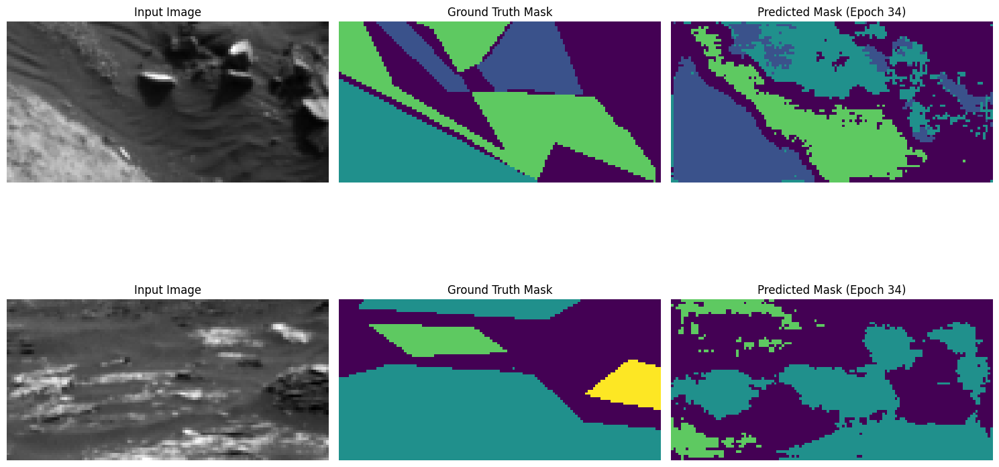

Epoch 35/250, Train Loss: 0.1144, Val Loss: 0.0478, Mean IoU: 0.3296
Class 0 IoU: 0.4233
Class 1 IoU: 0.3189
Class 2 IoU: 0.5257
Class 3 IoU: 0.0506


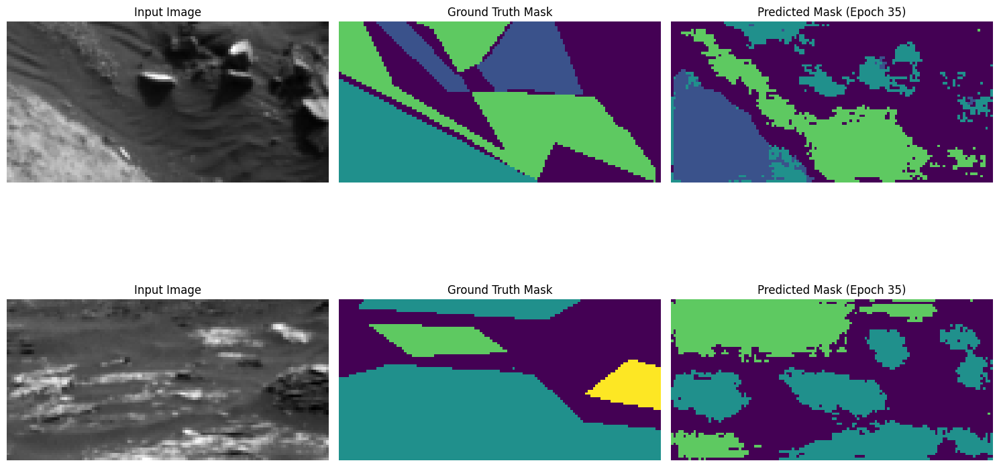

Epoch 36/250, Train Loss: 0.1117, Val Loss: 0.0468, Mean IoU: 0.3292
Class 0 IoU: 0.4423
Class 1 IoU: 0.2876
Class 2 IoU: 0.5145
Class 3 IoU: 0.0725


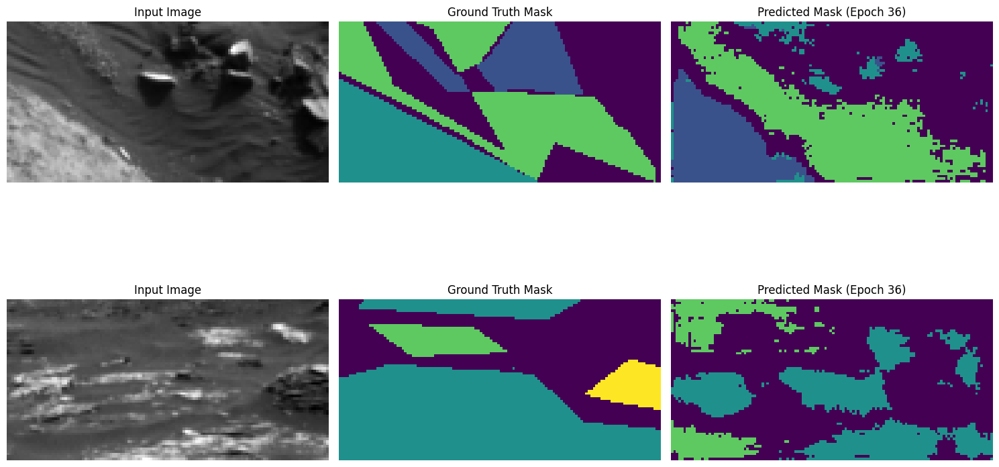

Epoch 37/250, Train Loss: 0.1201, Val Loss: 0.0505, Mean IoU: 0.3104
Class 0 IoU: 0.4240
Class 1 IoU: 0.2827
Class 2 IoU: 0.5262
Class 3 IoU: 0.0088


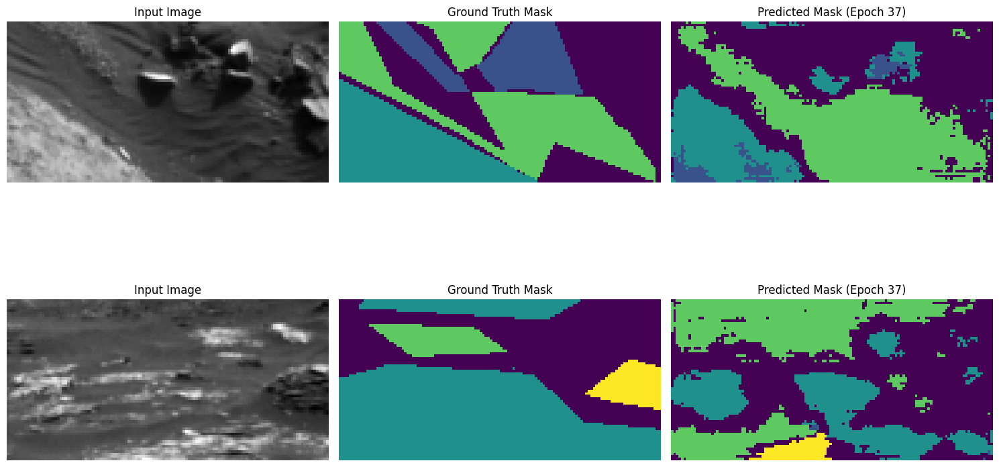

Epoch 38/250, Train Loss: 0.1238, Val Loss: 0.0488, Mean IoU: 0.3287
Class 0 IoU: 0.4303
Class 1 IoU: 0.3062
Class 2 IoU: 0.5475
Class 3 IoU: 0.0308


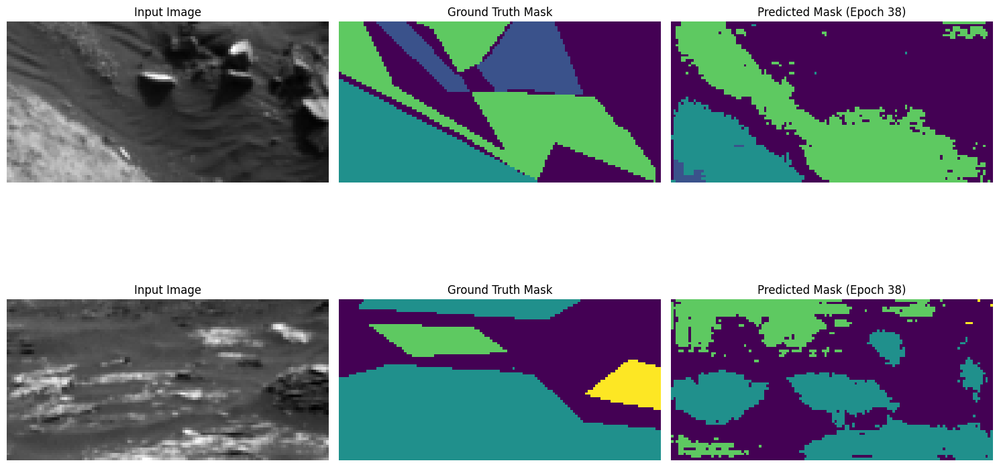

Epoch 39/250, Train Loss: 0.1230, Val Loss: 0.0469, Mean IoU: 0.3226
Class 0 IoU: 0.4309
Class 1 IoU: 0.3044
Class 2 IoU: 0.5193
Class 3 IoU: 0.0357


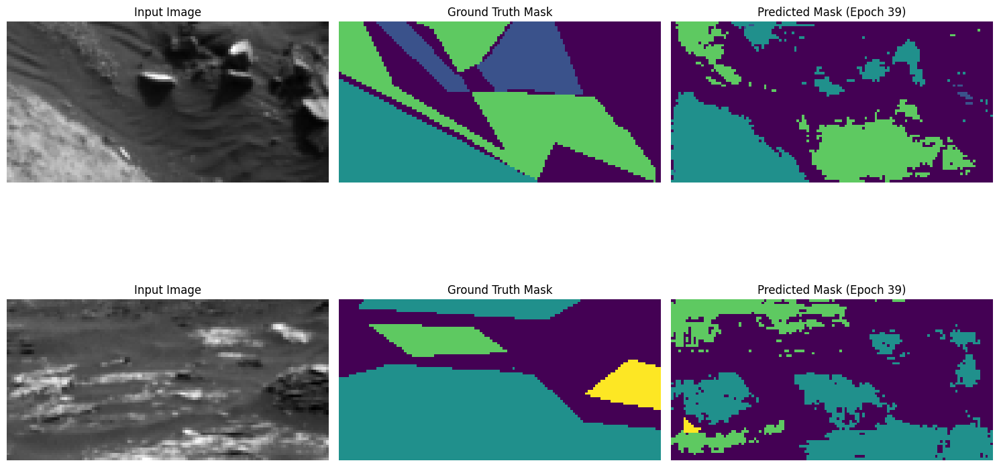

Epoch 40/250, Train Loss: 0.1105, Val Loss: 0.0480, Mean IoU: 0.3206
Class 0 IoU: 0.4367
Class 1 IoU: 0.2857
Class 2 IoU: 0.5349
Class 3 IoU: 0.0252


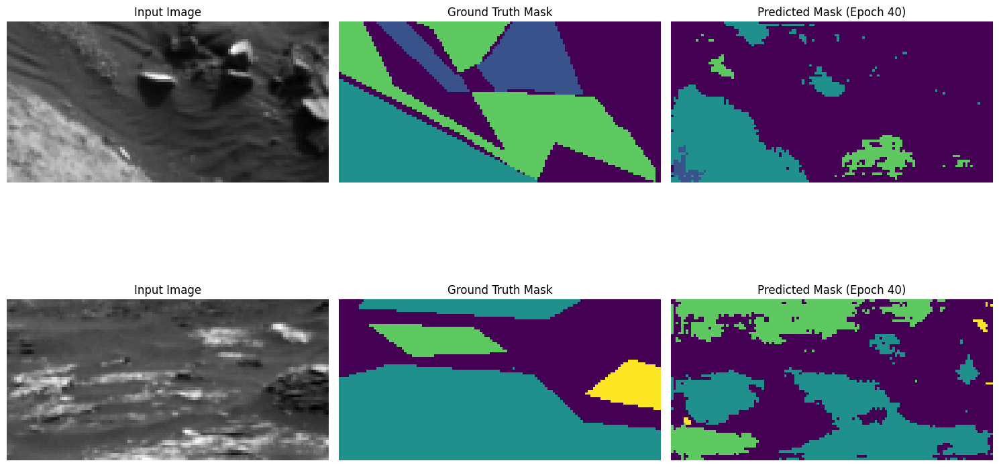

Epoch 41/250, Train Loss: 0.1160, Val Loss: 0.0483, Mean IoU: 0.3188
Class 0 IoU: 0.4352
Class 1 IoU: 0.2729
Class 2 IoU: 0.5338
Class 3 IoU: 0.0333


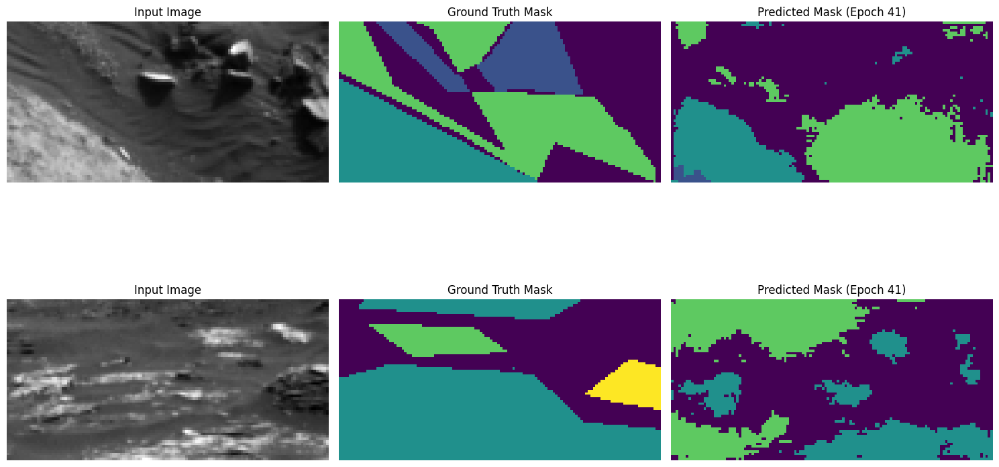

Epoch 42/250, Train Loss: 0.1147, Val Loss: 0.0475, Mean IoU: 0.3123
Class 0 IoU: 0.4028
Class 1 IoU: 0.3022
Class 2 IoU: 0.5311
Class 3 IoU: 0.0131


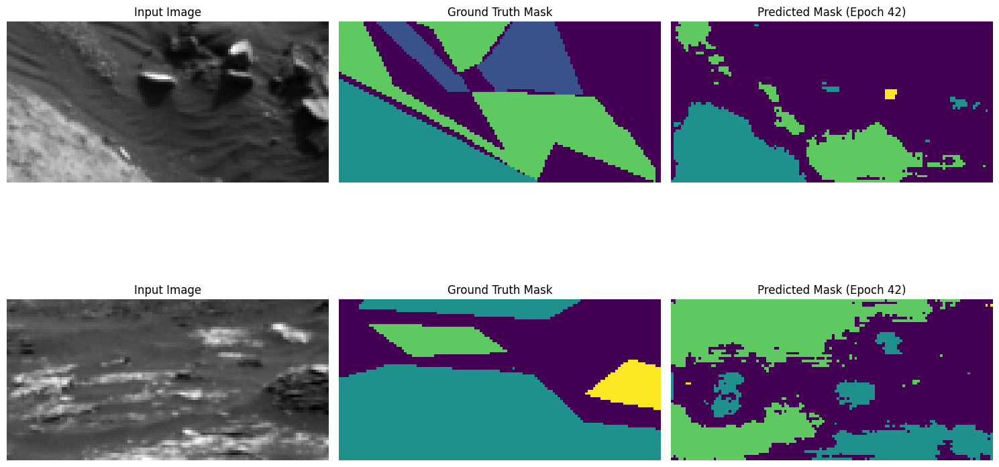

Epoch 43/250, Train Loss: 0.1165, Val Loss: 0.0444, Mean IoU: 0.3147
Class 0 IoU: 0.4056
Class 1 IoU: 0.2827
Class 2 IoU: 0.5461
Class 3 IoU: 0.0242


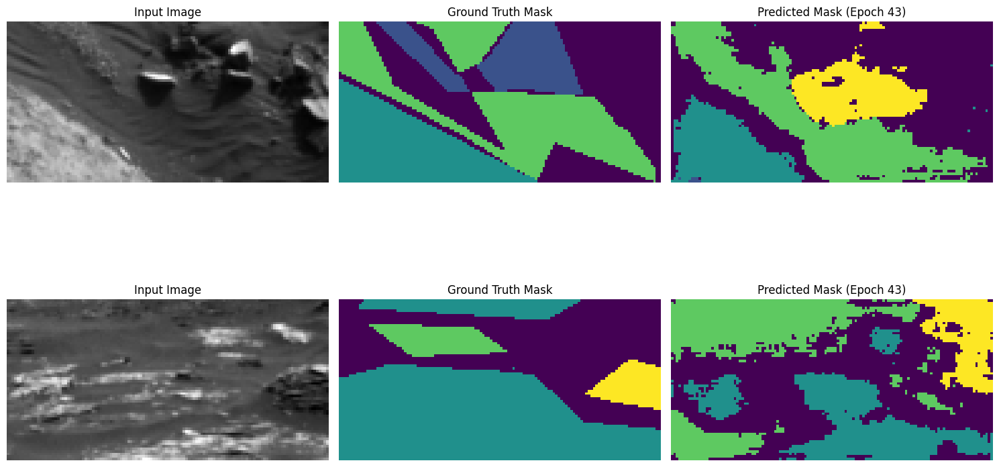

Epoch 44/250, Train Loss: 0.1073, Val Loss: 0.0540, Mean IoU: 0.3205
Class 0 IoU: 0.4357
Class 1 IoU: 0.3074
Class 2 IoU: 0.5247
Class 3 IoU: 0.0143


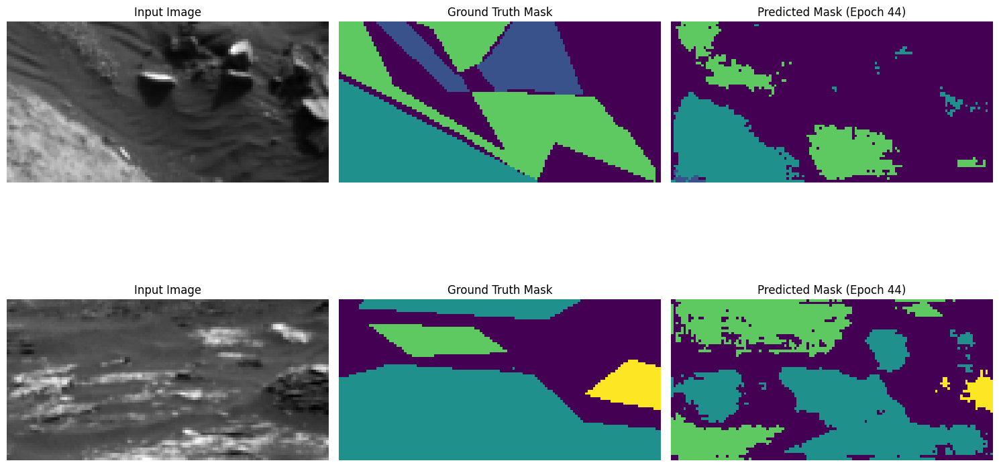

Epoch 45/250, Train Loss: 0.1125, Val Loss: 0.0506, Mean IoU: 0.3219
Class 0 IoU: 0.4621
Class 1 IoU: 0.2823
Class 2 IoU: 0.5371
Class 3 IoU: 0.0060


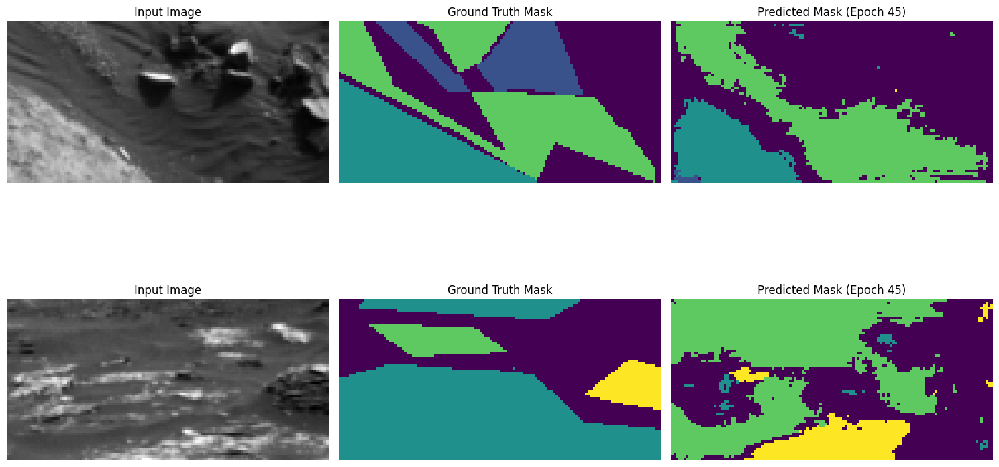

Epoch 46/250, Train Loss: 0.1088, Val Loss: 0.0446, Mean IoU: 0.3336
Class 0 IoU: 0.4452
Class 1 IoU: 0.3246
Class 2 IoU: 0.5414
Class 3 IoU: 0.0233


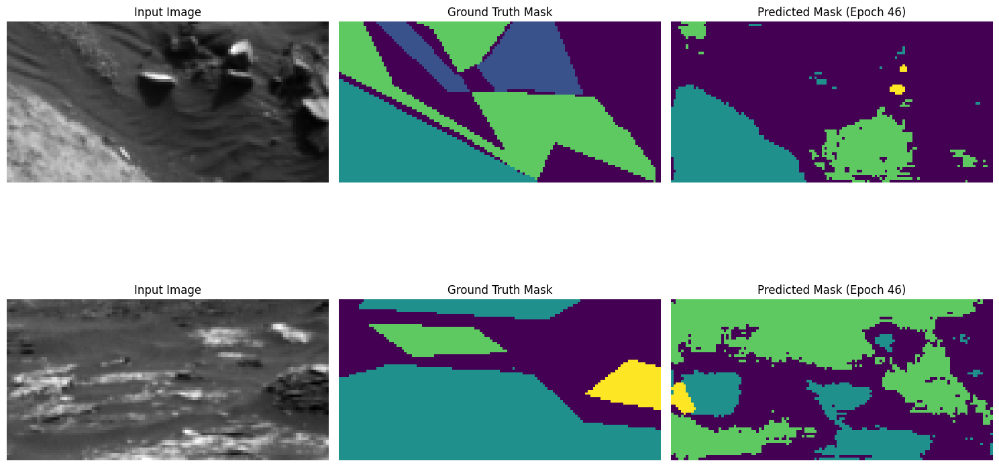

Epoch 47/250, Train Loss: 0.1017, Val Loss: 0.0442, Mean IoU: 0.3271
Class 0 IoU: 0.4343
Class 1 IoU: 0.3101
Class 2 IoU: 0.5299
Class 3 IoU: 0.0342


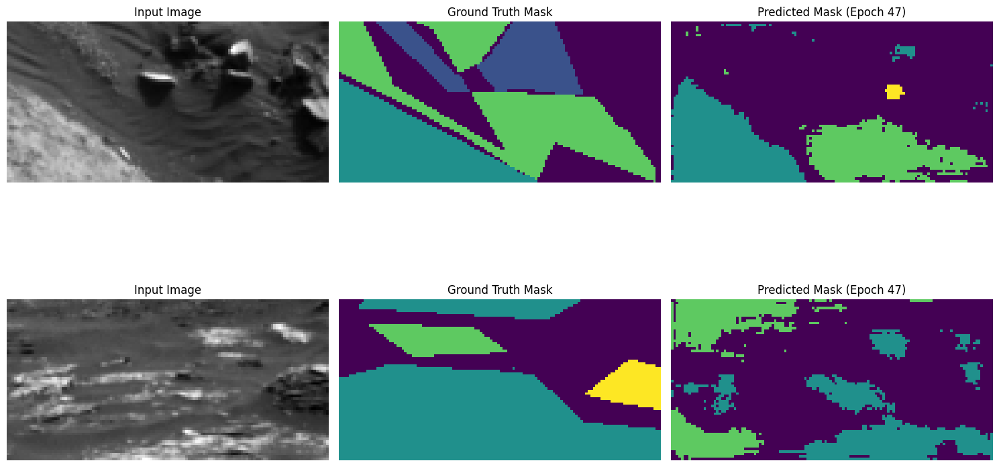

Epoch 48/250, Train Loss: 0.0973, Val Loss: 0.0548, Mean IoU: 0.3125
Class 0 IoU: 0.4048
Class 1 IoU: 0.3002
Class 2 IoU: 0.5334
Class 3 IoU: 0.0115


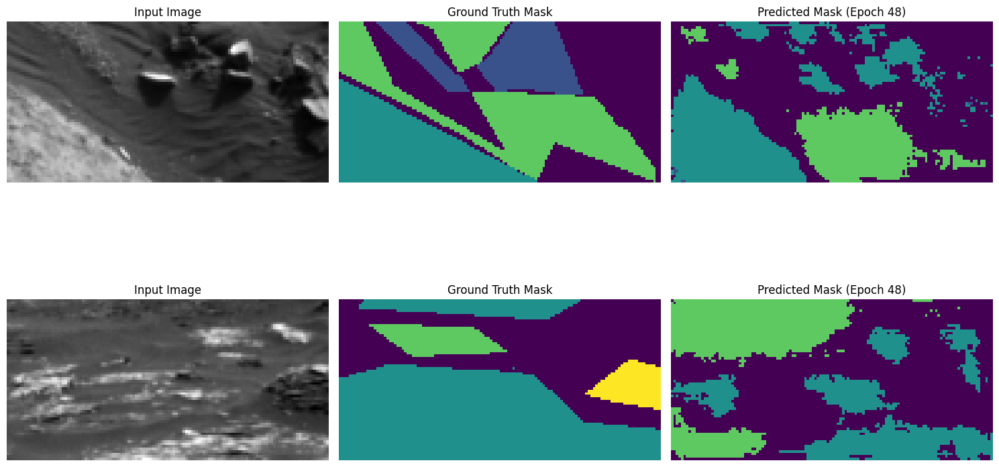

Epoch 49/250, Train Loss: 0.0910, Val Loss: 0.0554, Mean IoU: 0.3301
Class 0 IoU: 0.4443
Class 1 IoU: 0.3095
Class 2 IoU: 0.5537
Class 3 IoU: 0.0129


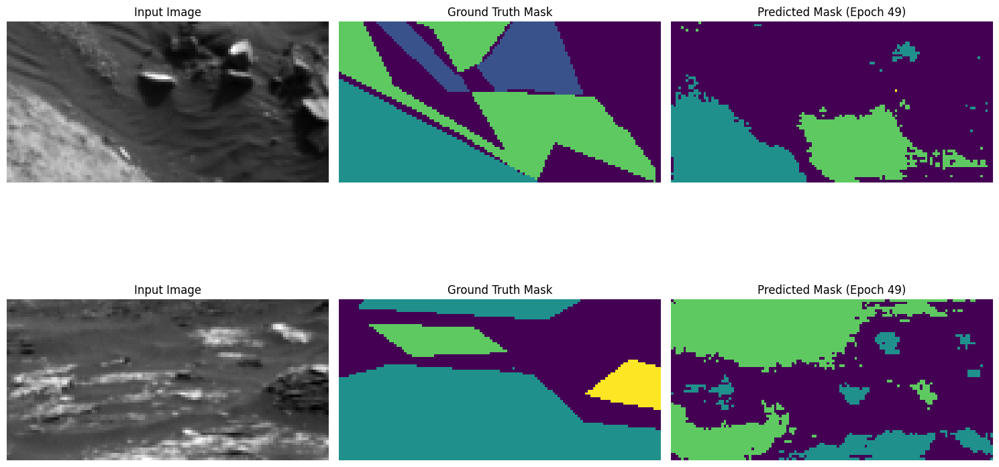

Epoch 50/250, Train Loss: 0.0899, Val Loss: 0.0500, Mean IoU: 0.3242
Class 0 IoU: 0.4215
Class 1 IoU: 0.2973
Class 2 IoU: 0.5426
Class 3 IoU: 0.0353


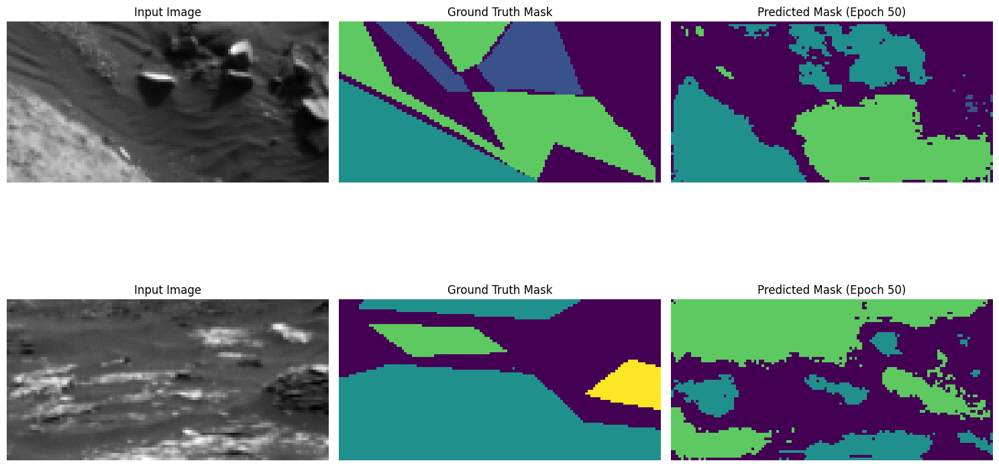

Epoch 51/250, Train Loss: 0.0915, Val Loss: 0.0543, Mean IoU: 0.3129
Class 0 IoU: 0.4048
Class 1 IoU: 0.2995
Class 2 IoU: 0.5355
Class 3 IoU: 0.0116


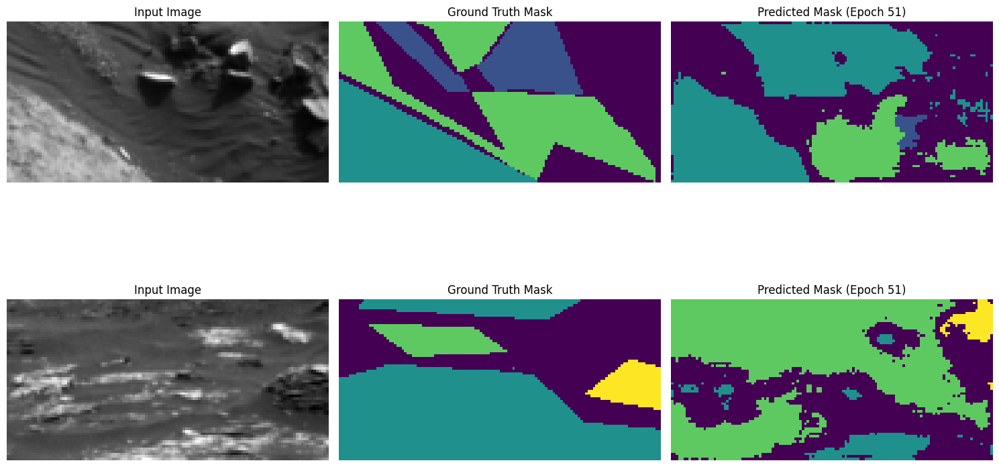

Epoch 52/250, Train Loss: 0.0954, Val Loss: 0.0564, Mean IoU: 0.3284
Class 0 IoU: 0.4295
Class 1 IoU: 0.3068
Class 2 IoU: 0.5363
Class 3 IoU: 0.0410


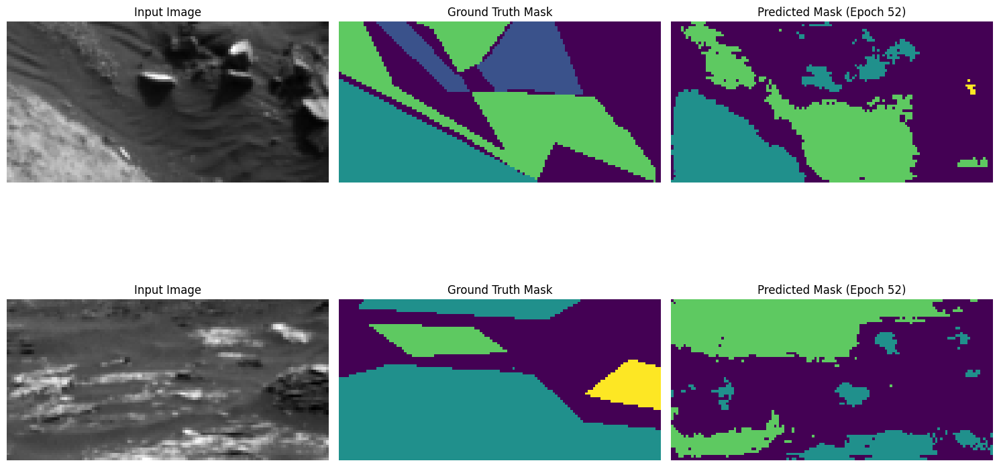

Epoch 53/250, Train Loss: 0.0914, Val Loss: 0.0612, Mean IoU: 0.3146
Class 0 IoU: 0.4044
Class 1 IoU: 0.3101
Class 2 IoU: 0.5296
Class 3 IoU: 0.0142


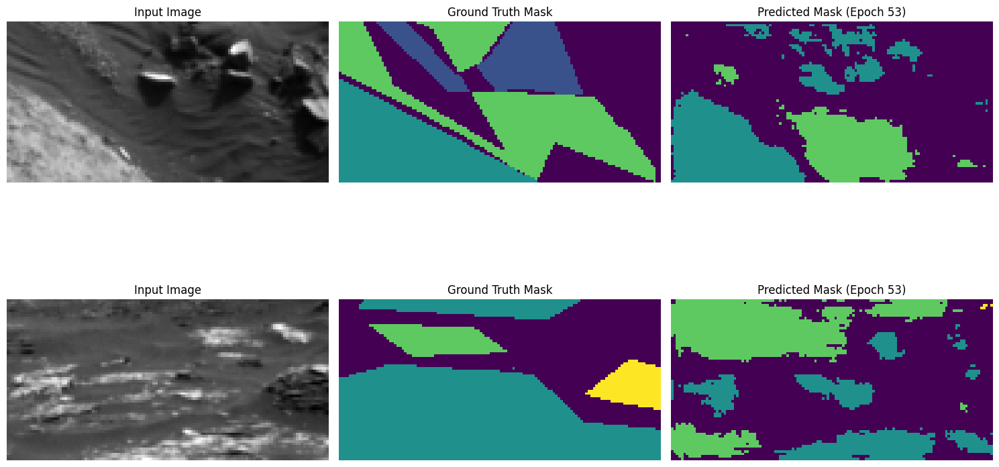

Epoch 54/250, Train Loss: 0.1014, Val Loss: 0.0441, Mean IoU: 0.3296
Class 0 IoU: 0.4373
Class 1 IoU: 0.2984
Class 2 IoU: 0.5408
Class 3 IoU: 0.0418


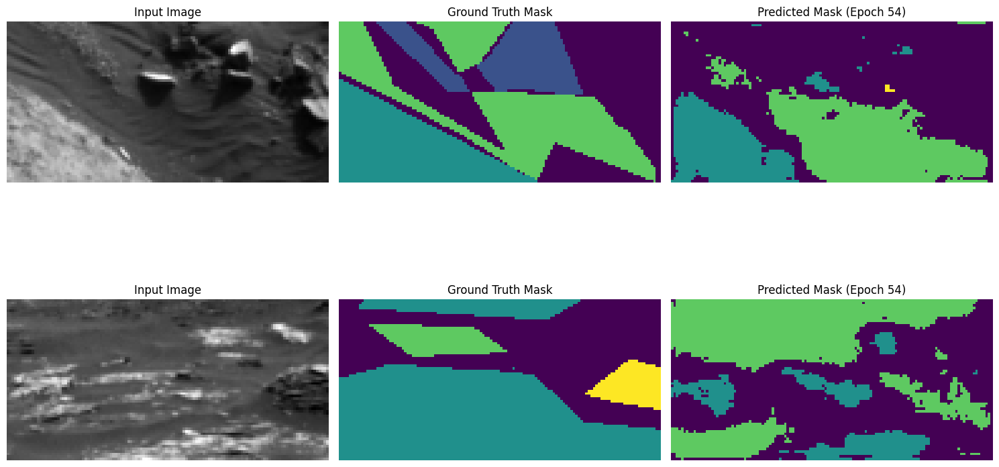

Epoch 55/250, Train Loss: 0.0986, Val Loss: 0.0537, Mean IoU: 0.3287
Class 0 IoU: 0.4469
Class 1 IoU: 0.3013
Class 2 IoU: 0.5501
Class 3 IoU: 0.0166


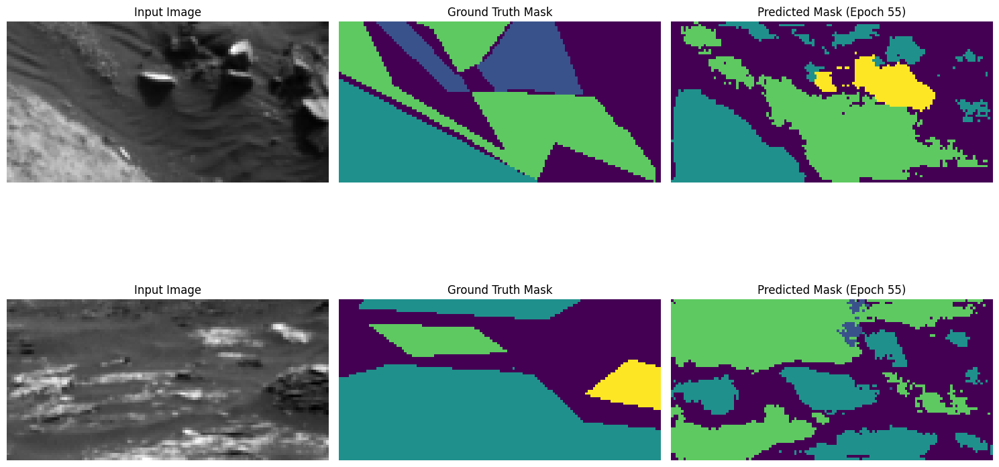

Epoch 56/250, Train Loss: 0.0973, Val Loss: 0.0480, Mean IoU: 0.3295
Class 0 IoU: 0.4532
Class 1 IoU: 0.2643
Class 2 IoU: 0.5513
Class 3 IoU: 0.0492


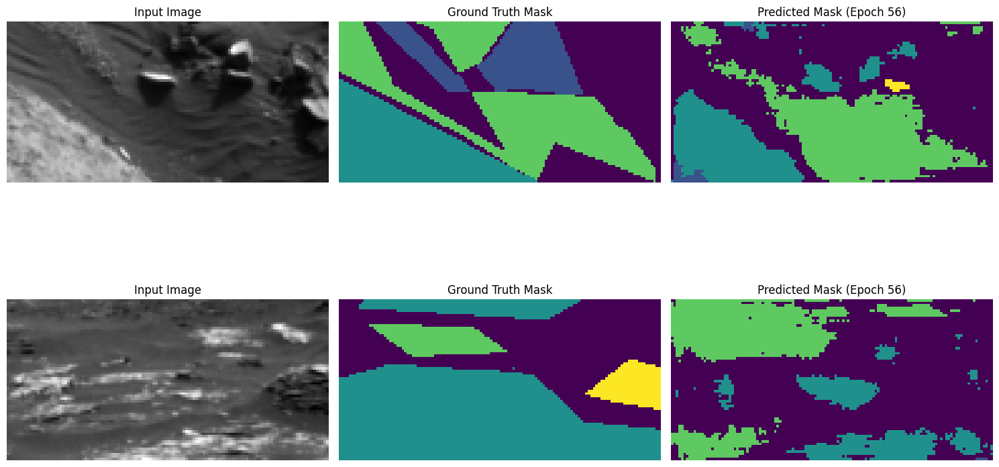

Epoch 57/250, Train Loss: 0.1529, Val Loss: 0.0402, Mean IoU: 0.2826
Class 0 IoU: 0.3500
Class 1 IoU: 0.2686
Class 2 IoU: 0.5025
Class 3 IoU: 0.0092


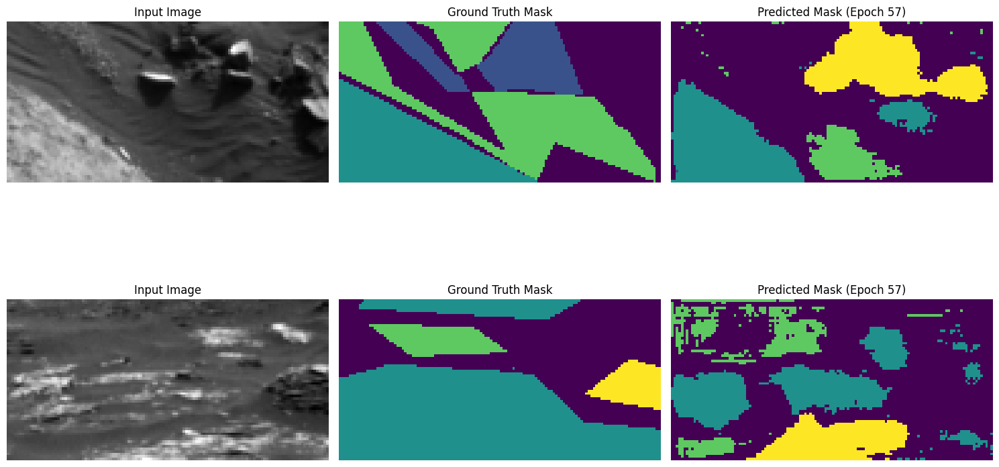

Epoch 58/250, Train Loss: 0.1571, Val Loss: 0.0385, Mean IoU: 0.3130
Class 0 IoU: 0.4321
Class 1 IoU: 0.2777
Class 2 IoU: 0.5220
Class 3 IoU: 0.0204


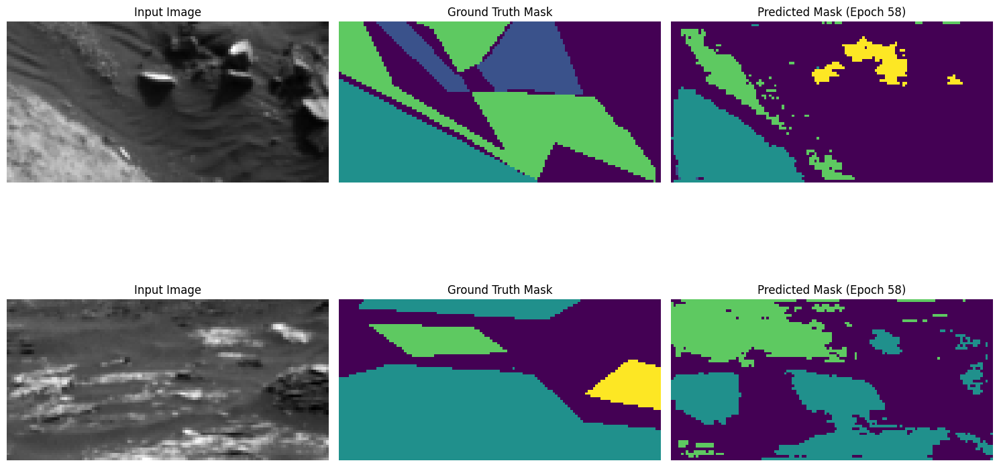

Epoch 59/250, Train Loss: 0.1229, Val Loss: 0.0384, Mean IoU: 0.3241
Class 0 IoU: 0.4349
Class 1 IoU: 0.2903
Class 2 IoU: 0.5415
Class 3 IoU: 0.0297


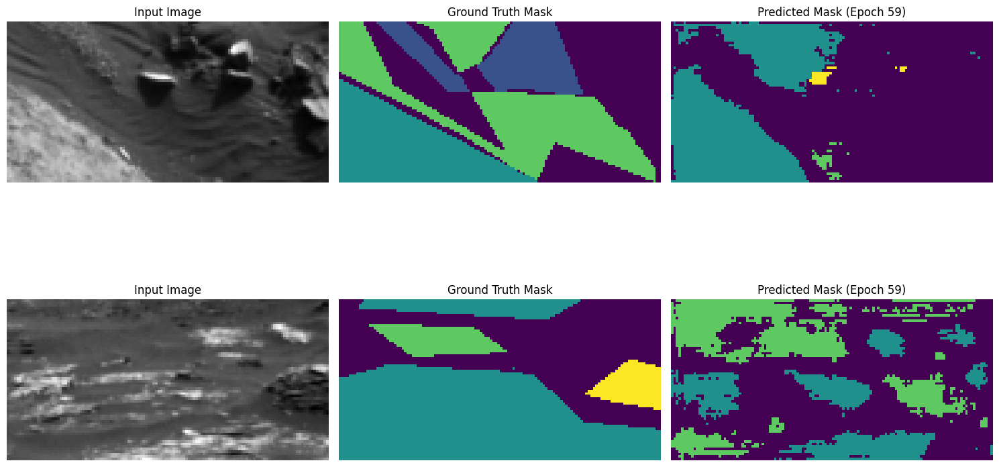

Epoch 60/250, Train Loss: 0.1247, Val Loss: 0.0396, Mean IoU: 0.2972
Class 0 IoU: 0.3978
Class 1 IoU: 0.2610
Class 2 IoU: 0.5129
Class 3 IoU: 0.0170


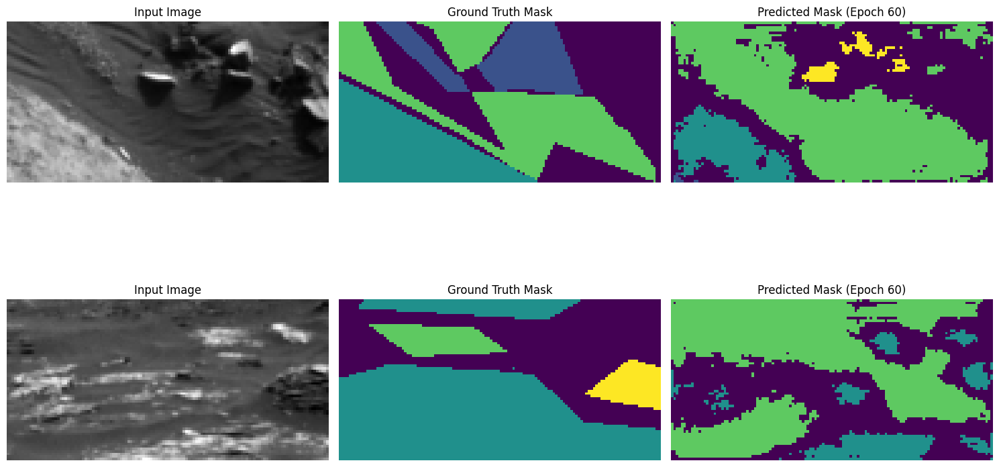

Epoch 61/250, Train Loss: 0.1132, Val Loss: 0.0373, Mean IoU: 0.3224
Class 0 IoU: 0.4363
Class 1 IoU: 0.2929
Class 2 IoU: 0.5337
Class 3 IoU: 0.0265


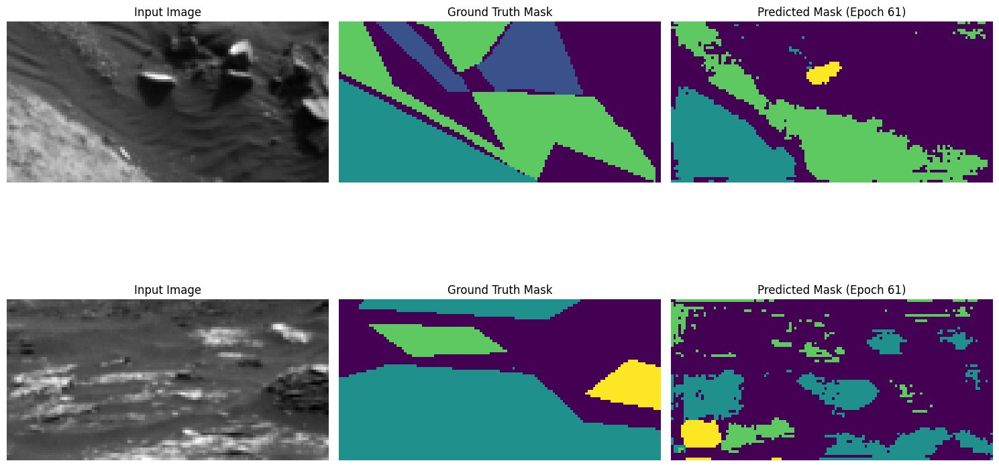

Epoch 62/250, Train Loss: 0.0980, Val Loss: 0.0385, Mean IoU: 0.3295
Class 0 IoU: 0.4336
Class 1 IoU: 0.2725
Class 2 IoU: 0.5457
Class 3 IoU: 0.0662


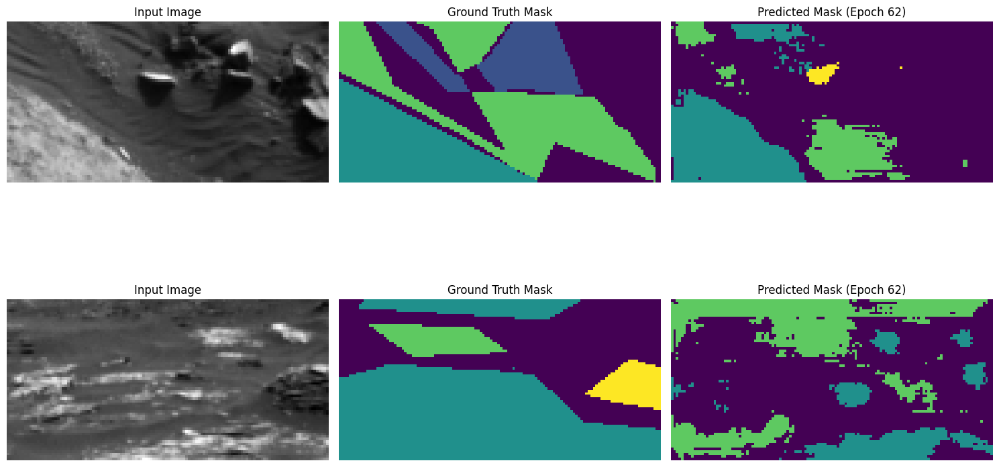

Epoch 63/250, Train Loss: 0.0922, Val Loss: 0.0384, Mean IoU: 0.3358
Class 0 IoU: 0.4351
Class 1 IoU: 0.2973
Class 2 IoU: 0.5427
Class 3 IoU: 0.0681


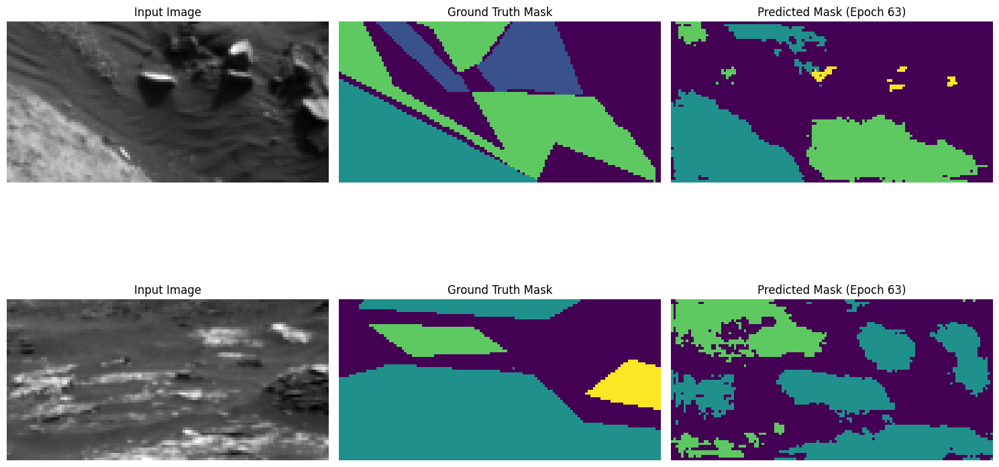

Epoch 64/250, Train Loss: 0.0884, Val Loss: 0.0429, Mean IoU: 0.3306
Class 0 IoU: 0.4309
Class 1 IoU: 0.2860
Class 2 IoU: 0.5343
Class 3 IoU: 0.0713


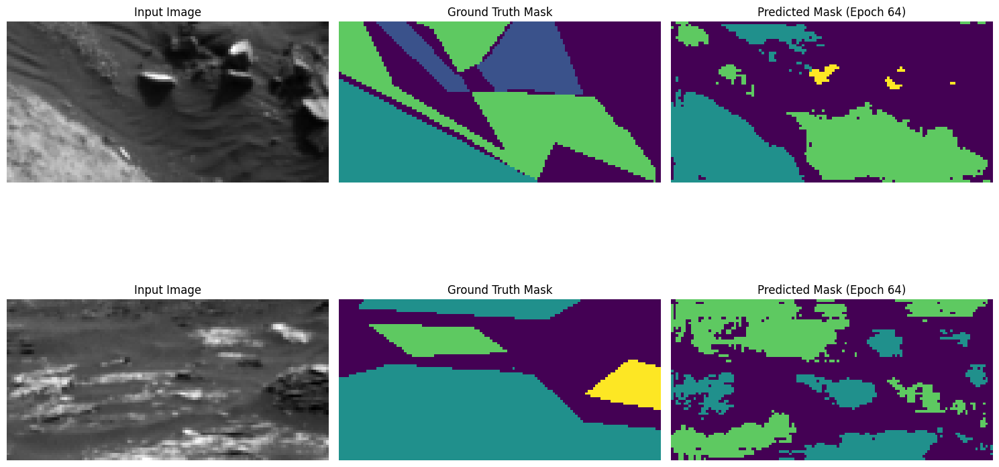

Epoch 65/250, Train Loss: 0.0882, Val Loss: 0.0419, Mean IoU: 0.3332
Class 0 IoU: 0.4472
Class 1 IoU: 0.2862
Class 2 IoU: 0.5358
Class 3 IoU: 0.0637


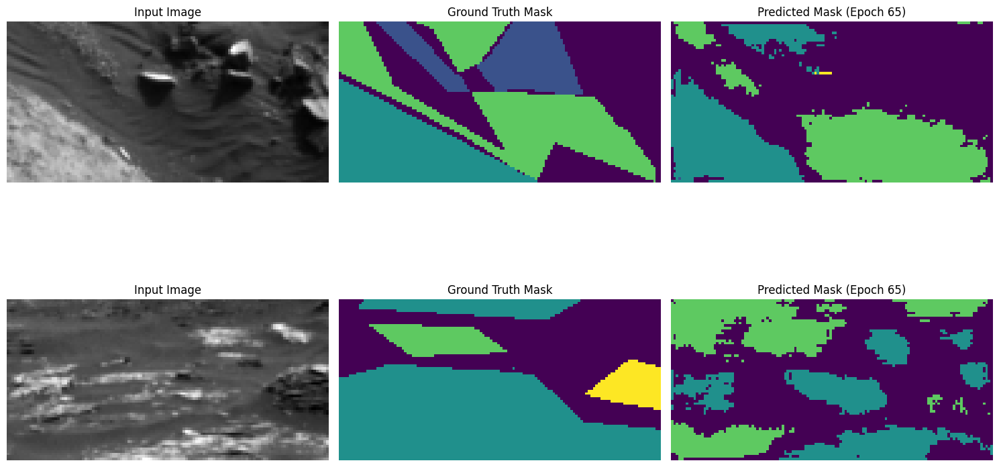

Epoch 66/250, Train Loss: 0.0859, Val Loss: 0.0465, Mean IoU: 0.3371
Class 0 IoU: 0.4736
Class 1 IoU: 0.2700
Class 2 IoU: 0.5483
Class 3 IoU: 0.0563


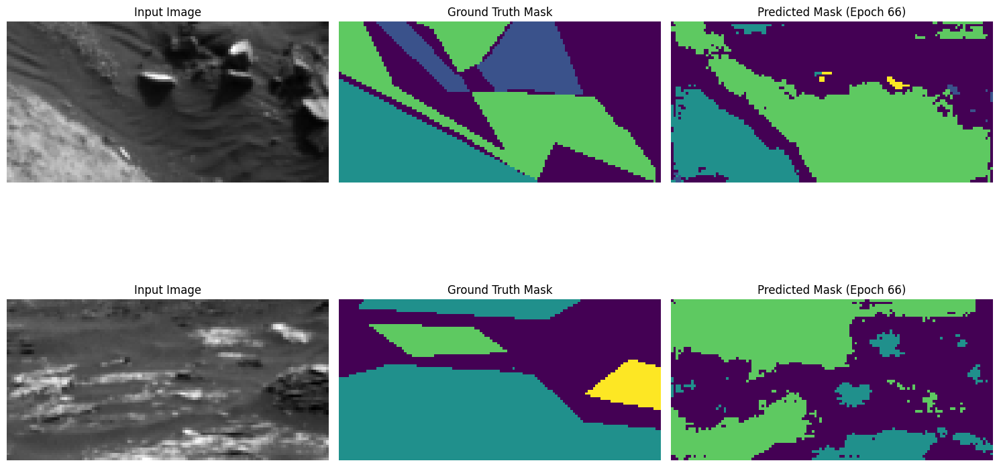

Model saved with new best Mean IoU: 0.3371
Epoch 67/250, Train Loss: 0.0852, Val Loss: 0.0517, Mean IoU: 0.3207
Class 0 IoU: 0.4177
Class 1 IoU: 0.2764
Class 2 IoU: 0.5479
Class 3 IoU: 0.0409


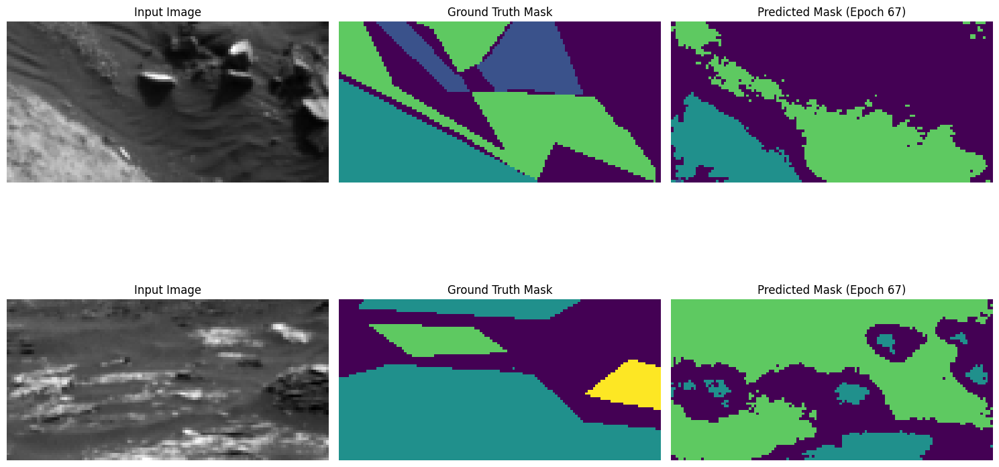

Epoch 68/250, Train Loss: 0.0823, Val Loss: 0.0450, Mean IoU: 0.3273
Class 0 IoU: 0.4231
Class 1 IoU: 0.2827
Class 2 IoU: 0.5551
Class 3 IoU: 0.0485


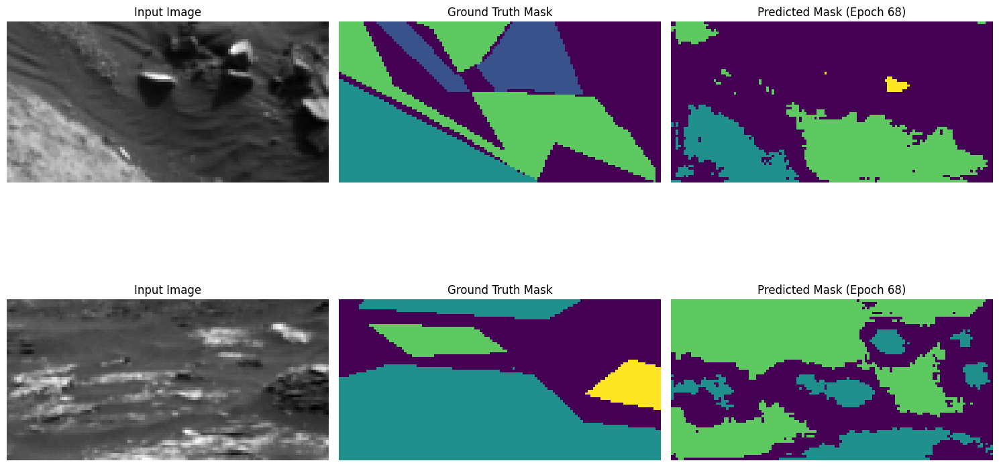

Epoch 69/250, Train Loss: 0.0778, Val Loss: 0.0461, Mean IoU: 0.3413
Class 0 IoU: 0.4777
Class 1 IoU: 0.2714
Class 2 IoU: 0.5491
Class 3 IoU: 0.0670


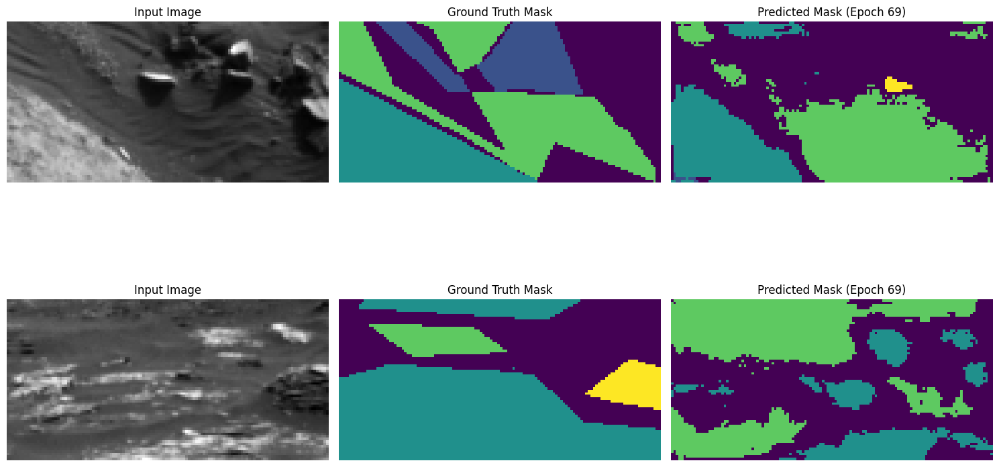

Model saved with new best Mean IoU: 0.3413
Epoch 70/250, Train Loss: 0.0760, Val Loss: 0.0473, Mean IoU: 0.3288
Class 0 IoU: 0.4312
Class 1 IoU: 0.2852
Class 2 IoU: 0.5455
Class 3 IoU: 0.0533


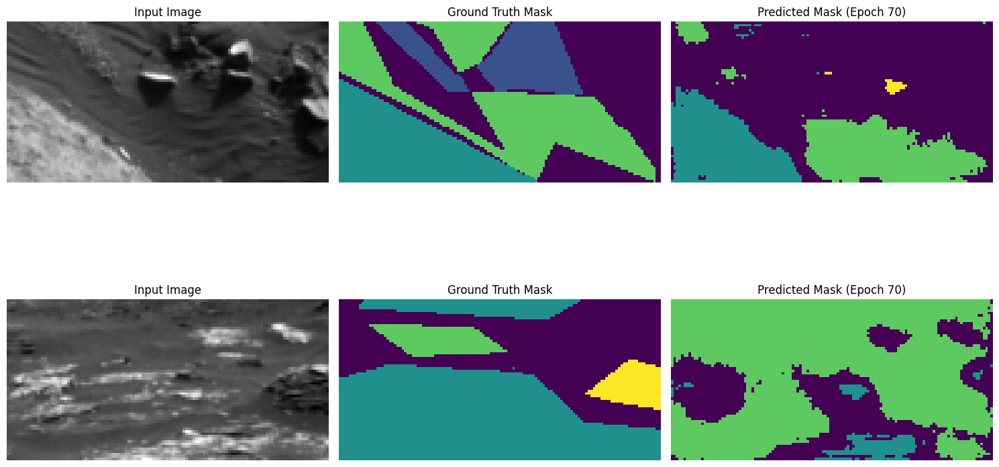

Epoch 71/250, Train Loss: 0.0756, Val Loss: 0.0459, Mean IoU: 0.3437
Class 0 IoU: 0.4517
Class 1 IoU: 0.3056
Class 2 IoU: 0.5450
Class 3 IoU: 0.0726


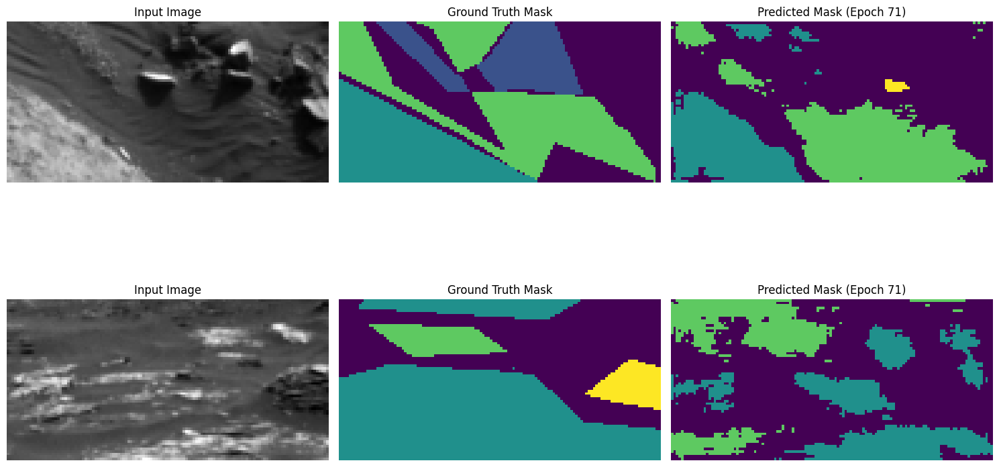

Model saved with new best Mean IoU: 0.3437
Epoch 72/250, Train Loss: 0.0817, Val Loss: 0.0452, Mean IoU: 0.3374
Class 0 IoU: 0.4314
Class 1 IoU: 0.3027
Class 2 IoU: 0.5470
Class 3 IoU: 0.0684


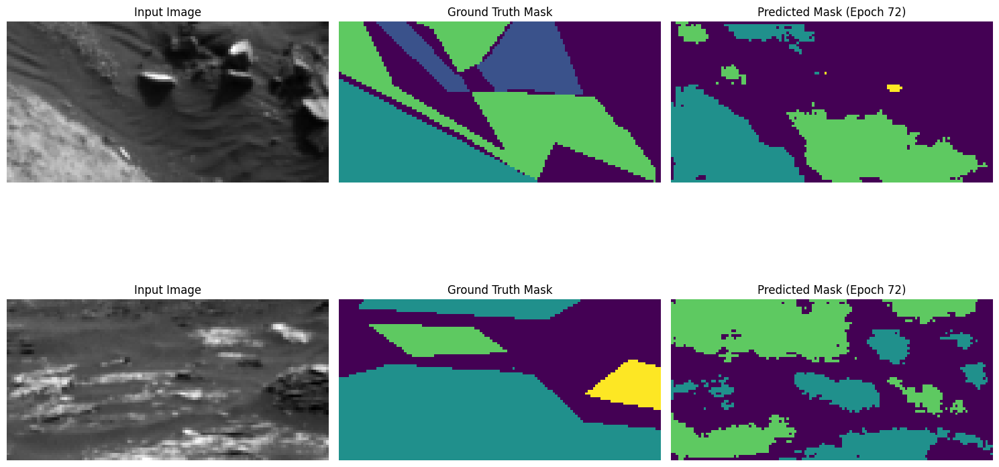

Epoch 73/250, Train Loss: 0.0758, Val Loss: 0.0479, Mean IoU: 0.3310
Class 0 IoU: 0.4261
Class 1 IoU: 0.2884
Class 2 IoU: 0.5517
Class 3 IoU: 0.0576


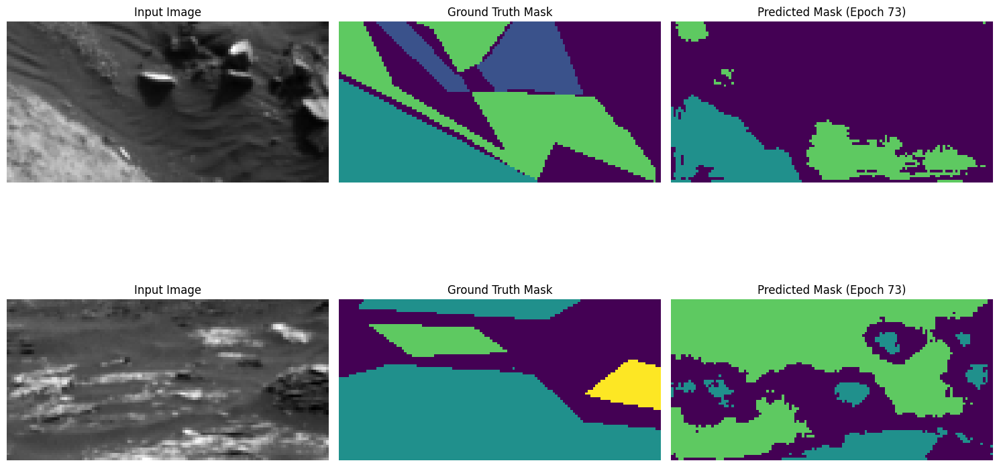

Epoch 74/250, Train Loss: 0.0741, Val Loss: 0.0452, Mean IoU: 0.3434
Class 0 IoU: 0.4523
Class 1 IoU: 0.3029
Class 2 IoU: 0.5483
Class 3 IoU: 0.0702


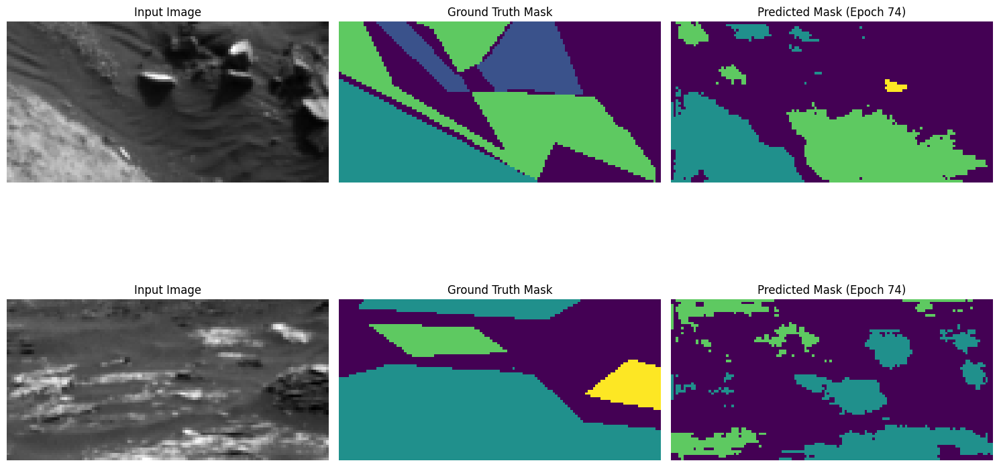

Epoch 75/250, Train Loss: 0.0789, Val Loss: 0.0461, Mean IoU: 0.3360
Class 0 IoU: 0.4504
Class 1 IoU: 0.2931
Class 2 IoU: 0.5393
Class 3 IoU: 0.0614


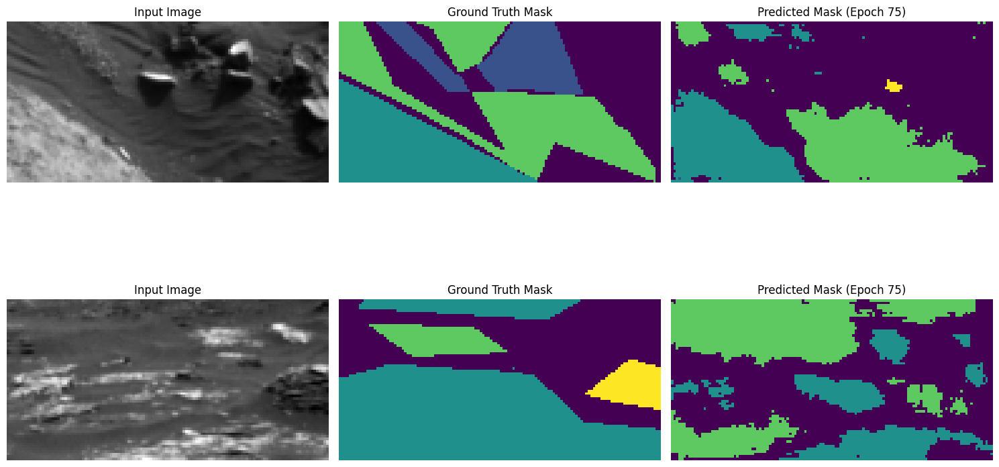

Epoch 76/250, Train Loss: 0.0746, Val Loss: 0.0465, Mean IoU: 0.3301
Class 0 IoU: 0.4353
Class 1 IoU: 0.2820
Class 2 IoU: 0.5404
Class 3 IoU: 0.0628


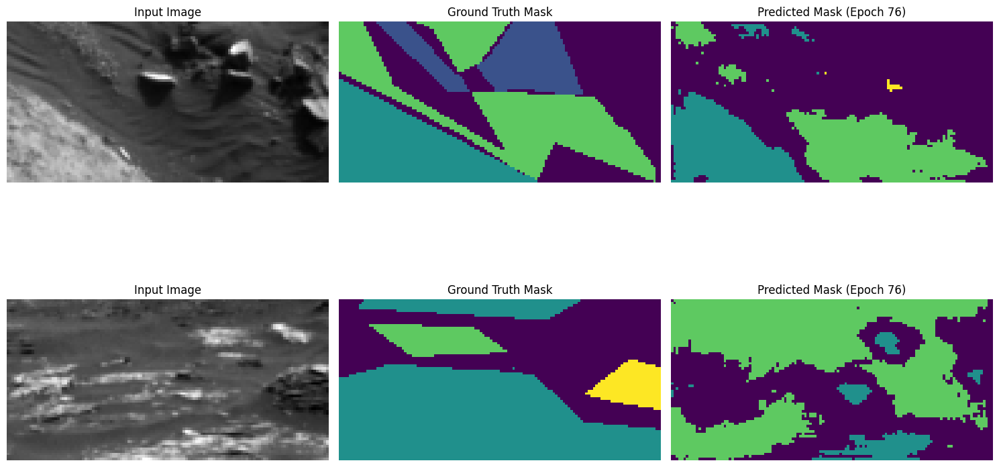

Epoch 77/250, Train Loss: 0.0755, Val Loss: 0.0450, Mean IoU: 0.3427
Class 0 IoU: 0.4569
Class 1 IoU: 0.2988
Class 2 IoU: 0.5421
Class 3 IoU: 0.0729


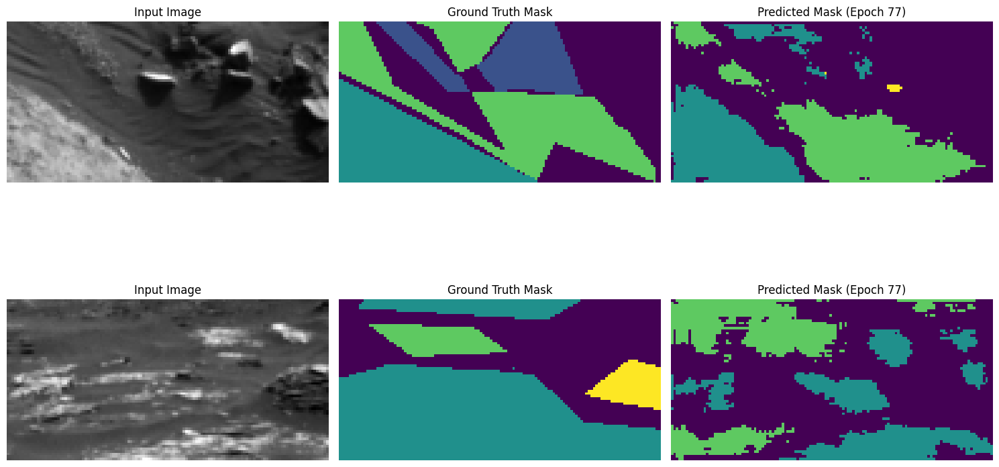

Epoch 78/250, Train Loss: 0.0693, Val Loss: 0.0444, Mean IoU: 0.3402
Class 0 IoU: 0.4497
Class 1 IoU: 0.2922
Class 2 IoU: 0.5503
Class 3 IoU: 0.0685


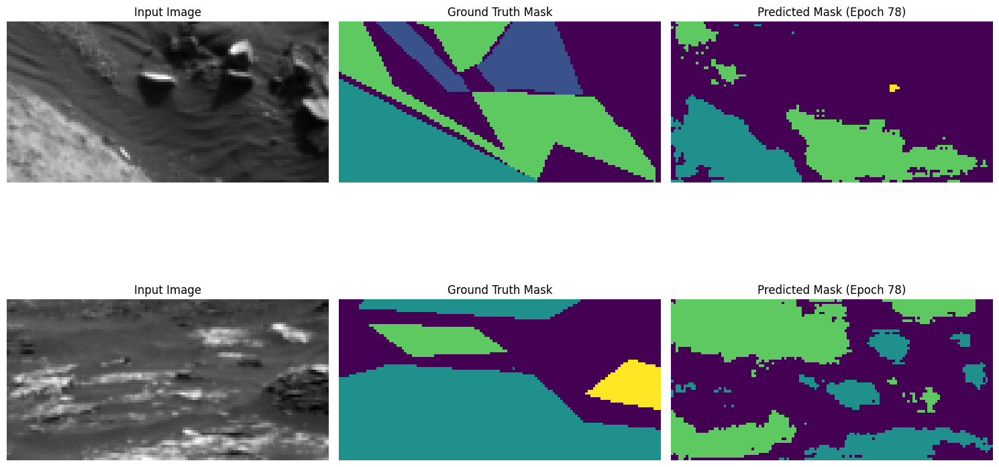

Epoch 79/250, Train Loss: 0.0701, Val Loss: 0.0478, Mean IoU: 0.3372
Class 0 IoU: 0.4545
Class 1 IoU: 0.2913
Class 2 IoU: 0.5388
Class 3 IoU: 0.0643


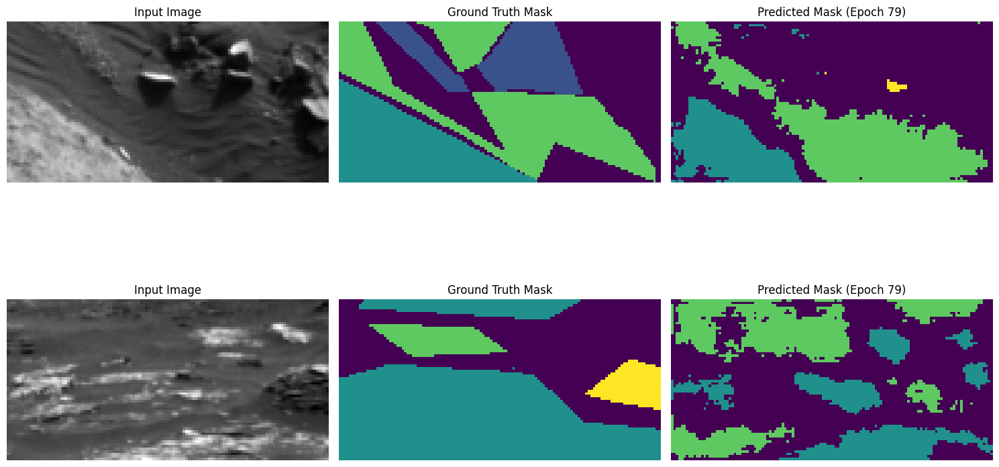

Epoch 80/250, Train Loss: 0.0731, Val Loss: 0.0510, Mean IoU: 0.3209
Class 0 IoU: 0.4293
Class 1 IoU: 0.2699
Class 2 IoU: 0.5384
Class 3 IoU: 0.0462


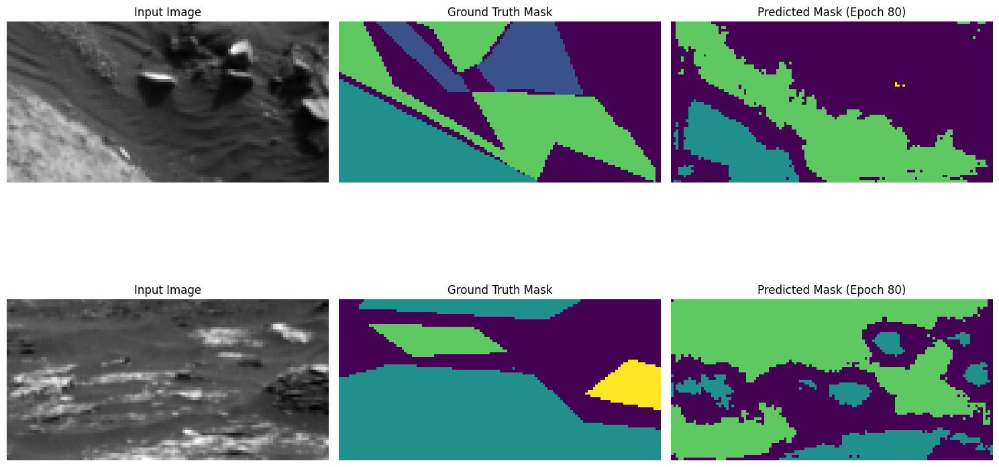

Epoch 81/250, Train Loss: 0.0715, Val Loss: 0.0488, Mean IoU: 0.3336
Class 0 IoU: 0.4473
Class 1 IoU: 0.2800
Class 2 IoU: 0.5518
Class 3 IoU: 0.0555


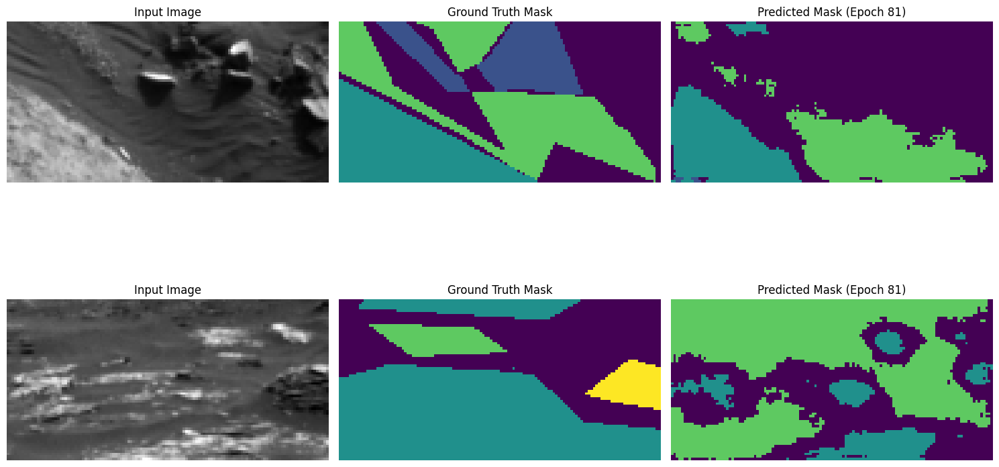

Epoch 82/250, Train Loss: 0.0707, Val Loss: 0.0461, Mean IoU: 0.3395
Class 0 IoU: 0.4600
Class 1 IoU: 0.2901
Class 2 IoU: 0.5419
Class 3 IoU: 0.0660


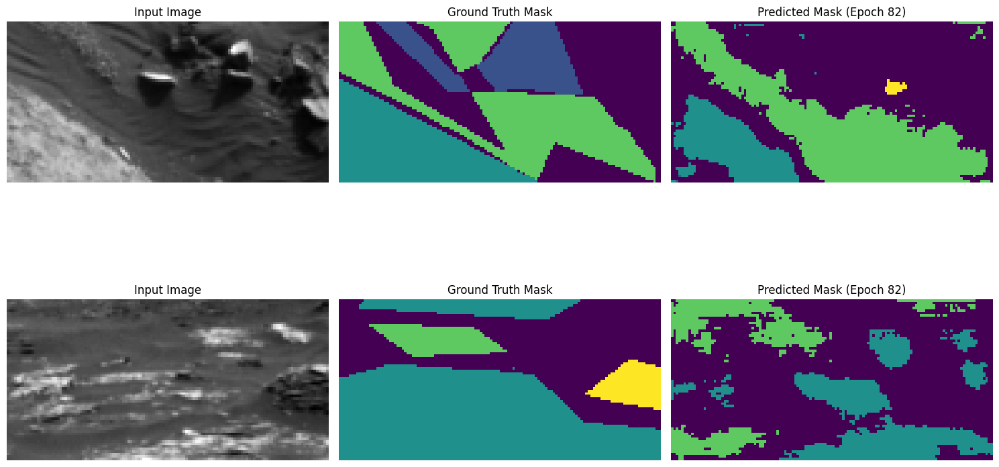

Epoch 83/250, Train Loss: 0.0710, Val Loss: 0.0485, Mean IoU: 0.3398
Class 0 IoU: 0.4646
Class 1 IoU: 0.2933
Class 2 IoU: 0.5357
Class 3 IoU: 0.0658


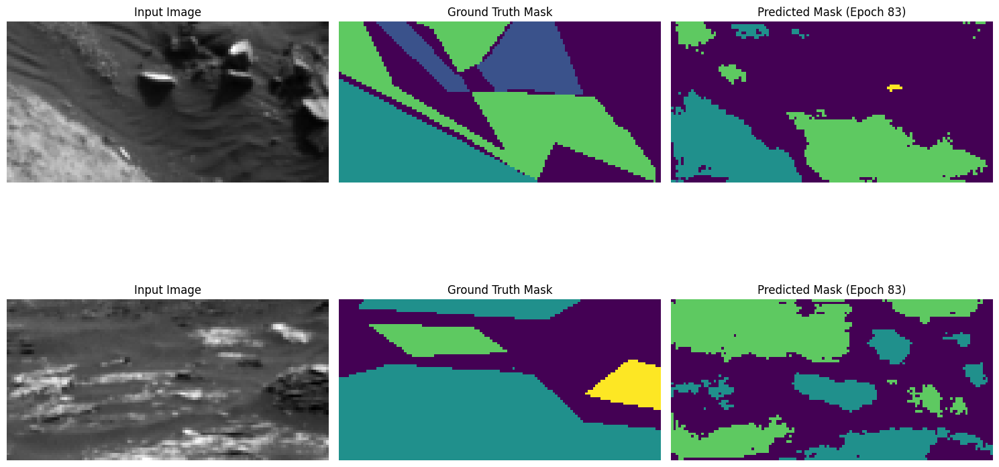

Epoch 84/250, Train Loss: 0.0714, Val Loss: 0.0490, Mean IoU: 0.3323
Class 0 IoU: 0.4308
Class 1 IoU: 0.3062
Class 2 IoU: 0.5338
Class 3 IoU: 0.0584


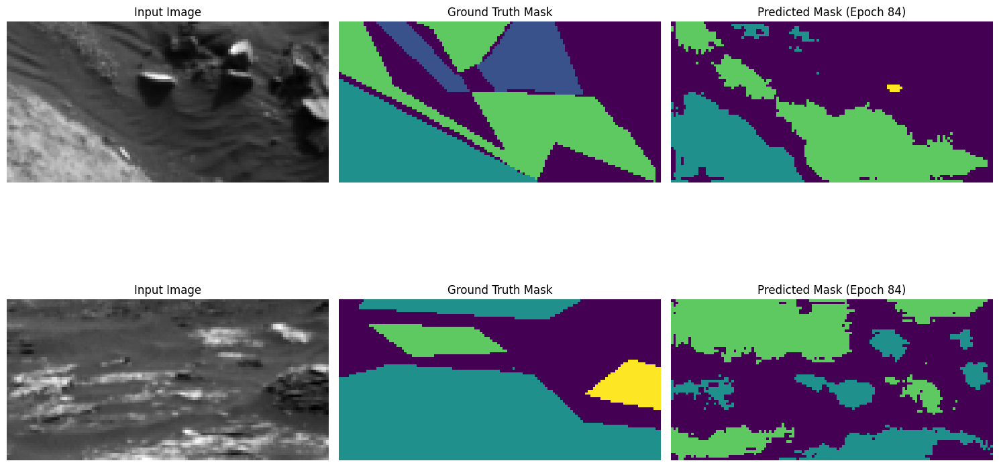

Epoch 85/250, Train Loss: 0.0713, Val Loss: 0.0522, Mean IoU: 0.3310
Class 0 IoU: 0.4392
Class 1 IoU: 0.2803
Class 2 IoU: 0.5495
Class 3 IoU: 0.0550


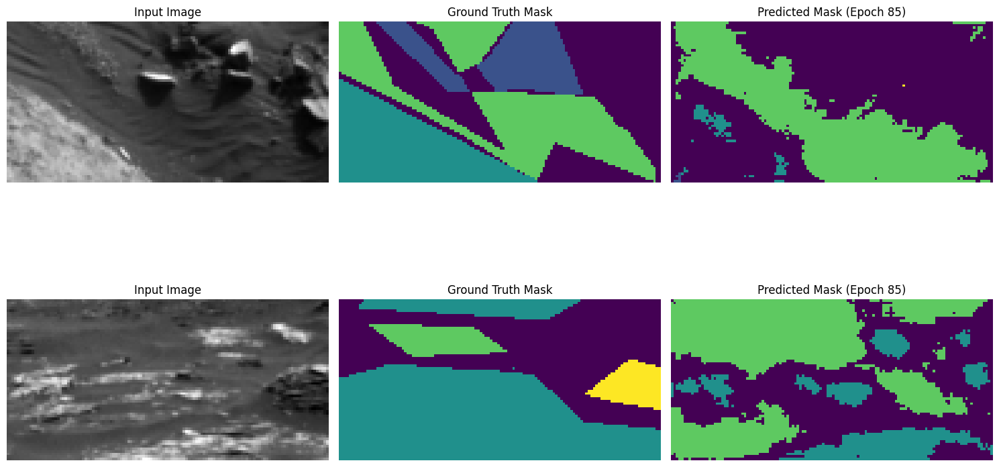

Epoch 86/250, Train Loss: 0.0702, Val Loss: 0.0500, Mean IoU: 0.3274
Class 0 IoU: 0.4361
Class 1 IoU: 0.2838
Class 2 IoU: 0.5427
Class 3 IoU: 0.0472


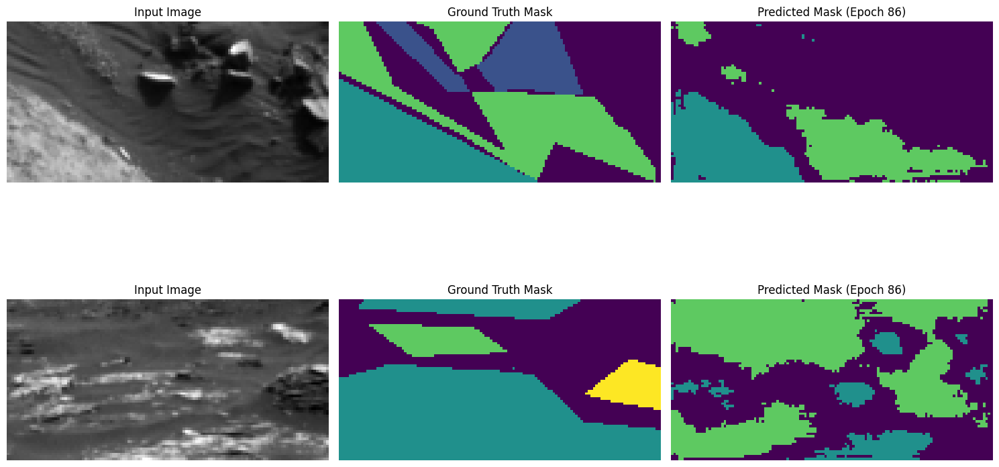

Epoch 87/250, Train Loss: 0.0727, Val Loss: 0.0475, Mean IoU: 0.3313
Class 0 IoU: 0.4393
Class 1 IoU: 0.2735
Class 2 IoU: 0.5481
Class 3 IoU: 0.0644


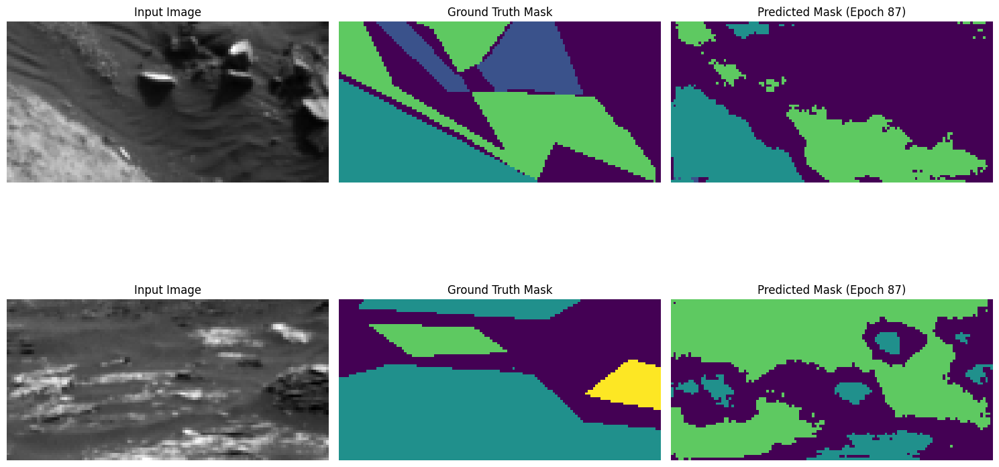

Epoch 88/250, Train Loss: 0.0692, Val Loss: 0.0511, Mean IoU: 0.3228
Class 0 IoU: 0.4293
Class 1 IoU: 0.2772
Class 2 IoU: 0.5377
Class 3 IoU: 0.0469


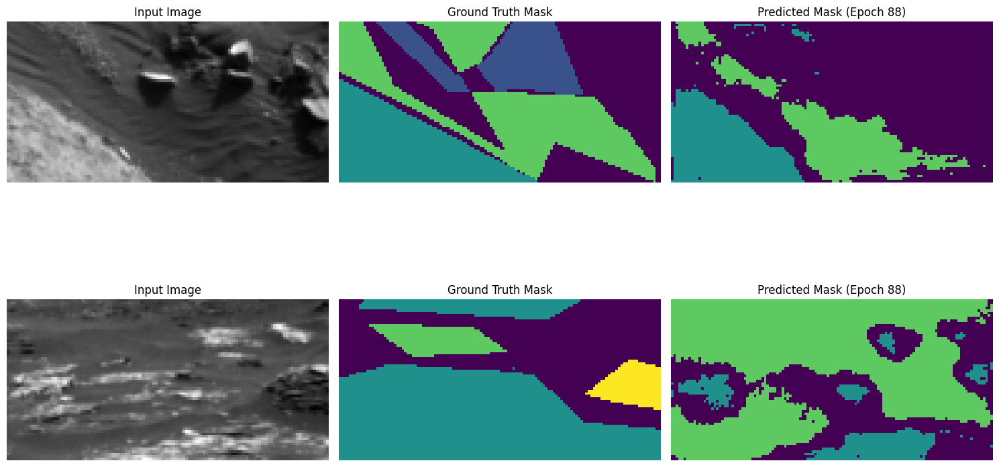

Epoch 89/250, Train Loss: 0.0703, Val Loss: 0.0495, Mean IoU: 0.3284
Class 0 IoU: 0.4249
Class 1 IoU: 0.2848
Class 2 IoU: 0.5469
Class 3 IoU: 0.0568


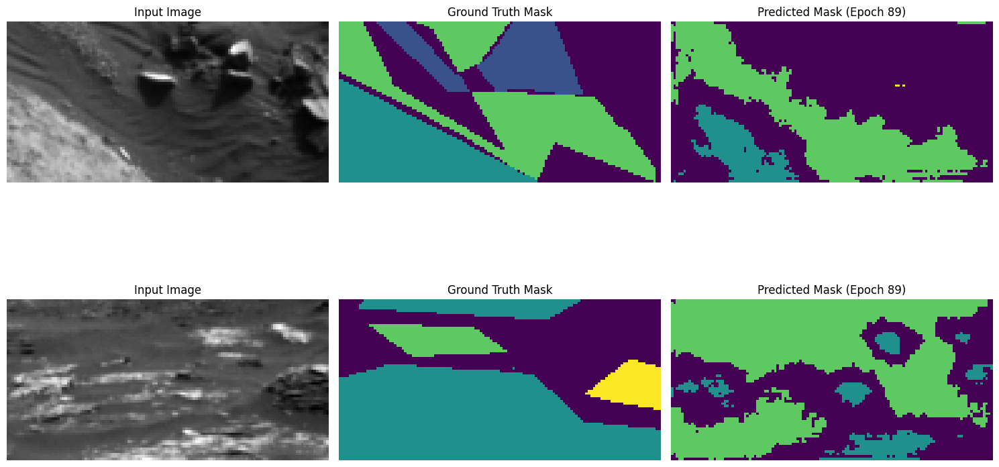

Epoch 90/250, Train Loss: 0.0646, Val Loss: 0.0516, Mean IoU: 0.3339
Class 0 IoU: 0.4643
Class 1 IoU: 0.2874
Class 2 IoU: 0.5388
Class 3 IoU: 0.0451


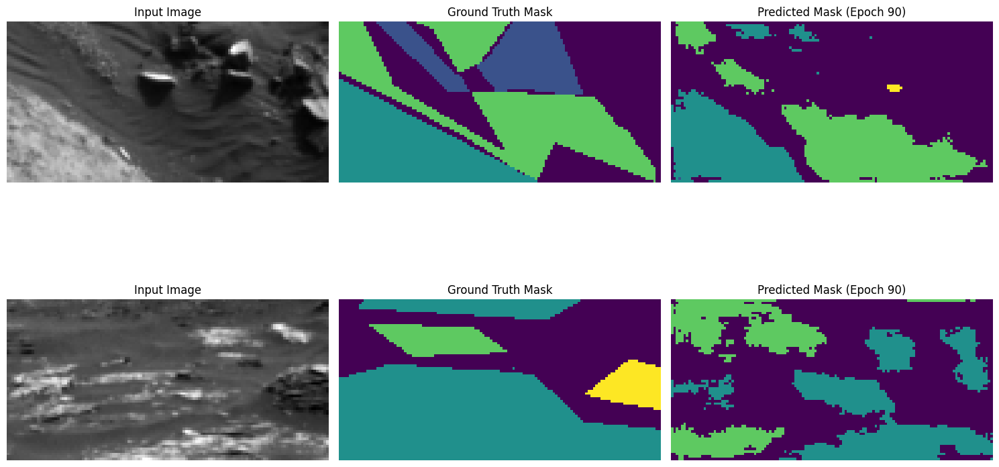

Epoch 91/250, Train Loss: 0.0663, Val Loss: 0.0489, Mean IoU: 0.3350
Class 0 IoU: 0.4438
Class 1 IoU: 0.3035
Class 2 IoU: 0.5226
Class 3 IoU: 0.0700


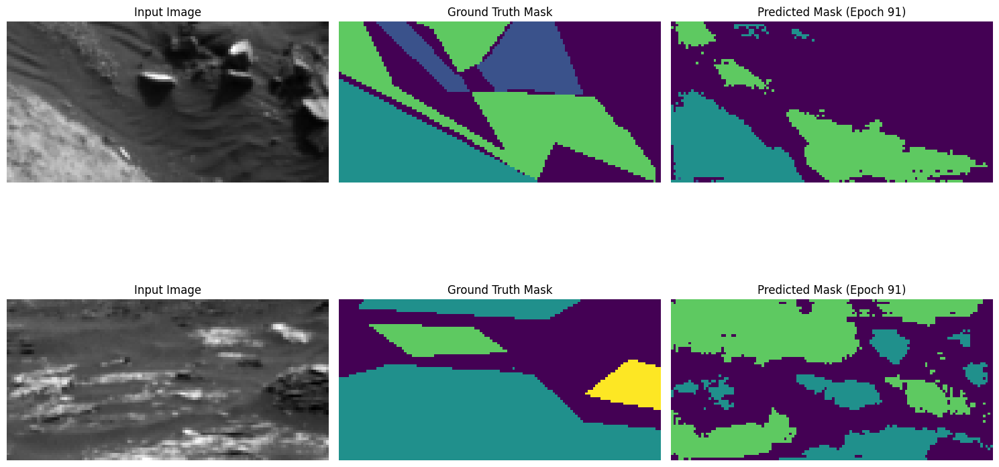

Epoch 92/250, Train Loss: 0.0677, Val Loss: 0.0505, Mean IoU: 0.3395
Class 0 IoU: 0.4580
Class 1 IoU: 0.3069
Class 2 IoU: 0.5290
Class 3 IoU: 0.0643


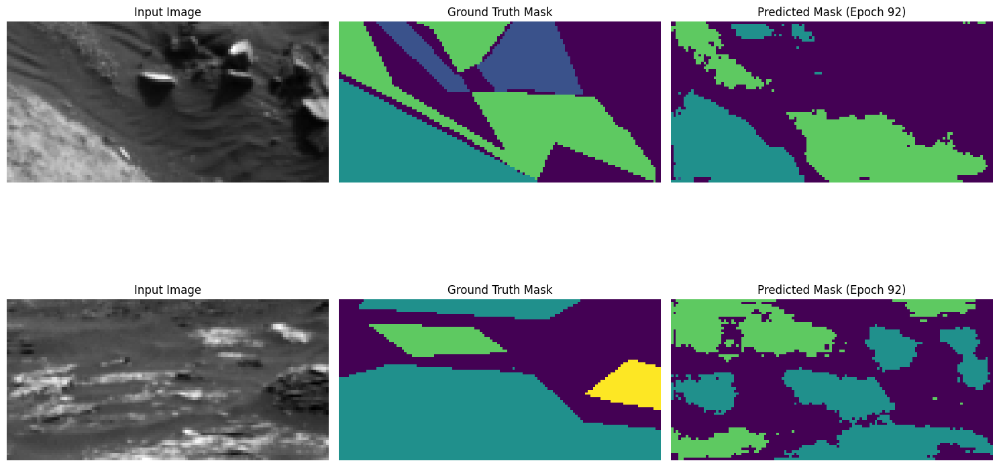

Epoch 93/250, Train Loss: 0.0710, Val Loss: 0.0483, Mean IoU: 0.3371
Class 0 IoU: 0.4474
Class 1 IoU: 0.3051
Class 2 IoU: 0.5259
Class 3 IoU: 0.0700


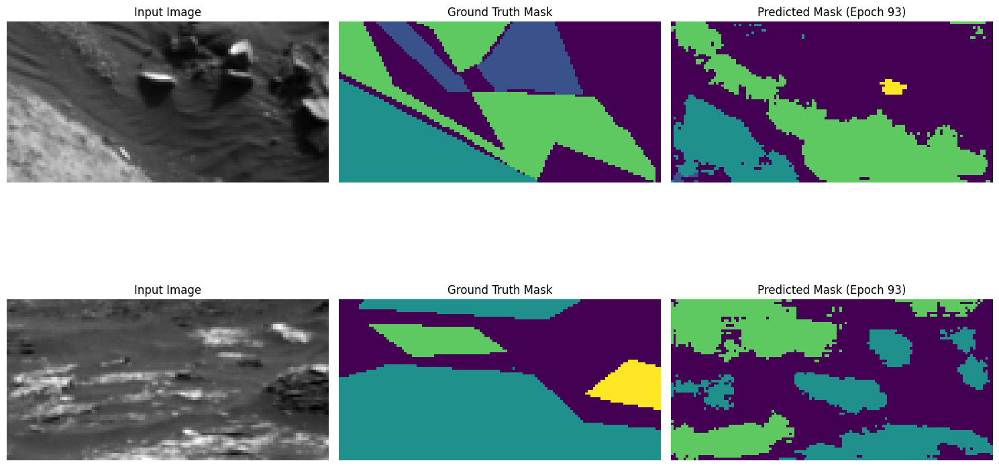

Epoch 94/250, Train Loss: 0.0640, Val Loss: 0.0480, Mean IoU: 0.3296
Class 0 IoU: 0.4268
Class 1 IoU: 0.2980
Class 2 IoU: 0.5167
Class 3 IoU: 0.0769


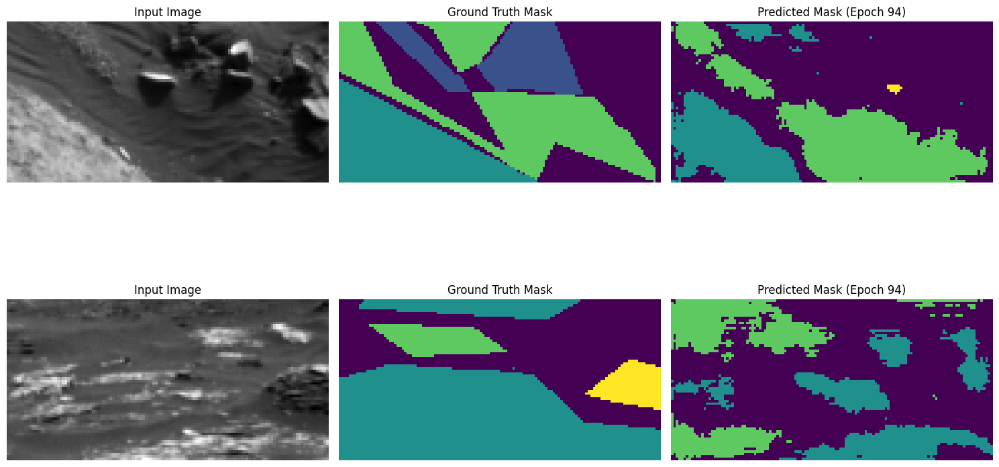

Epoch 95/250, Train Loss: 0.0676, Val Loss: 0.0528, Mean IoU: 0.3275
Class 0 IoU: 0.4496
Class 1 IoU: 0.2885
Class 2 IoU: 0.5248
Class 3 IoU: 0.0473


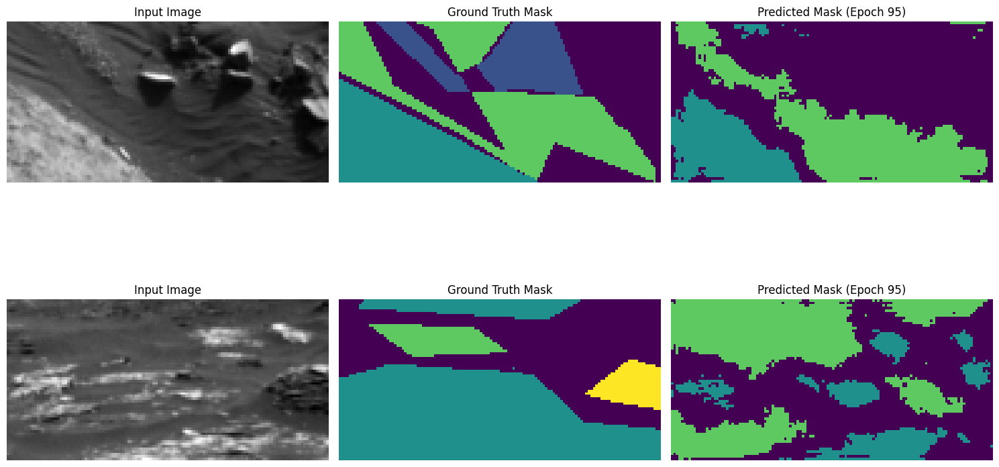

Epoch 96/250, Train Loss: 0.0644, Val Loss: 0.0503, Mean IoU: 0.3378
Class 0 IoU: 0.4532
Class 1 IoU: 0.2940
Class 2 IoU: 0.5399
Class 3 IoU: 0.0642


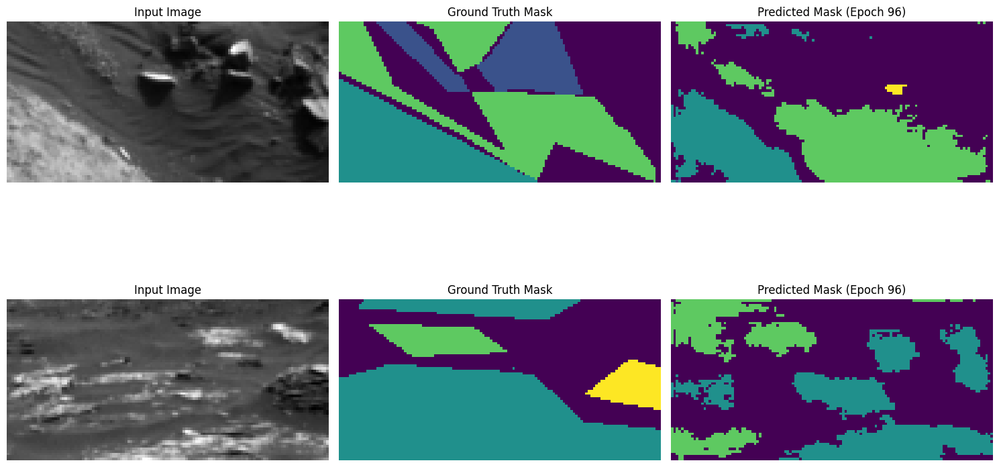

Epoch 97/250, Train Loss: 0.0659, Val Loss: 0.0571, Mean IoU: 0.3208
Class 0 IoU: 0.4322
Class 1 IoU: 0.2923
Class 2 IoU: 0.5276
Class 3 IoU: 0.0309


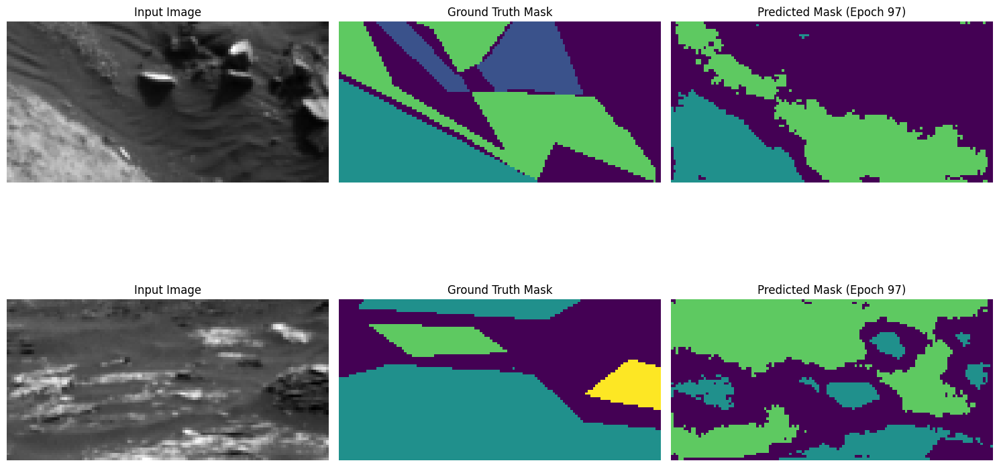

Epoch 98/250, Train Loss: 0.0680, Val Loss: 0.0550, Mean IoU: 0.3318
Class 0 IoU: 0.4564
Class 1 IoU: 0.2969
Class 2 IoU: 0.5230
Class 3 IoU: 0.0506


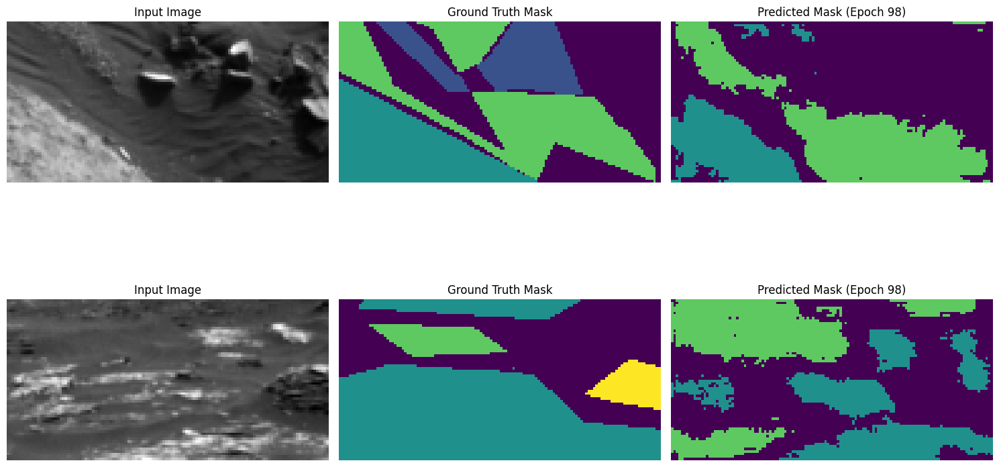

Epoch 99/250, Train Loss: 0.0697, Val Loss: 0.0545, Mean IoU: 0.3262
Class 0 IoU: 0.4307
Class 1 IoU: 0.2801
Class 2 IoU: 0.5427
Class 3 IoU: 0.0514


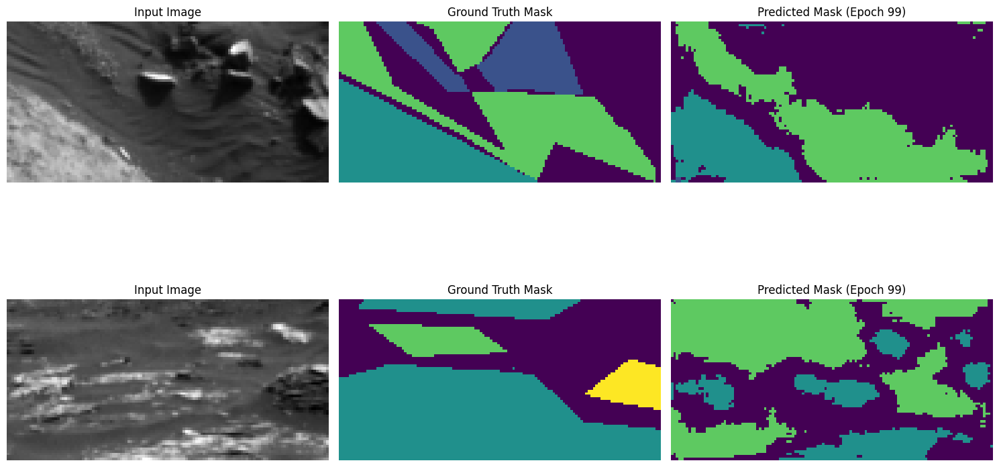

Epoch 100/250, Train Loss: 0.0645, Val Loss: 0.0596, Mean IoU: 0.3201
Class 0 IoU: 0.4415
Class 1 IoU: 0.2781
Class 2 IoU: 0.5317
Class 3 IoU: 0.0291


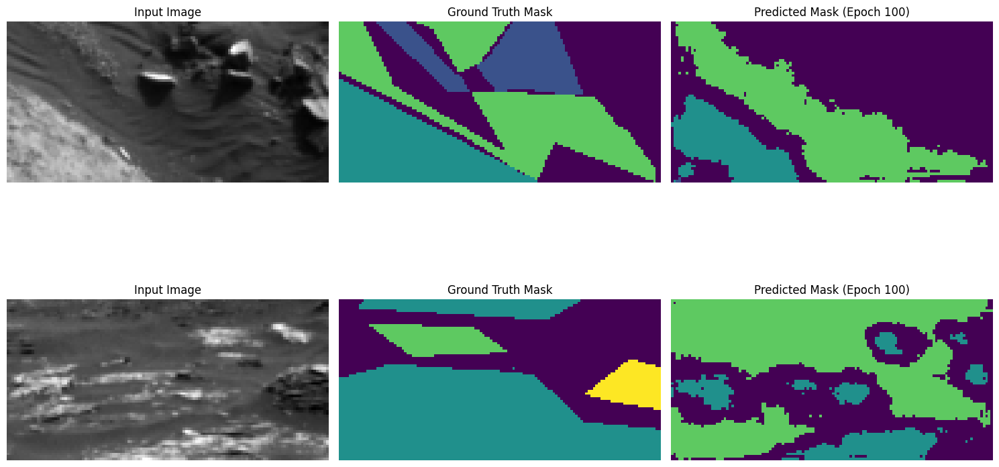

Epoch 101/250, Train Loss: 0.0646, Val Loss: 0.0551, Mean IoU: 0.3192
Class 0 IoU: 0.4402
Class 1 IoU: 0.2725
Class 2 IoU: 0.5287
Class 3 IoU: 0.0354


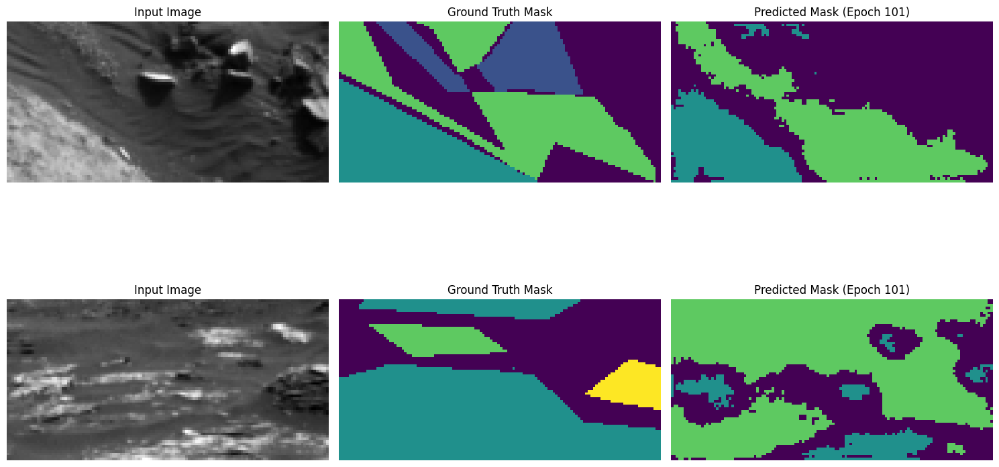

Epoch 102/250, Train Loss: 0.0647, Val Loss: 0.0522, Mean IoU: 0.3242
Class 0 IoU: 0.4207
Class 1 IoU: 0.2867
Class 2 IoU: 0.5281
Class 3 IoU: 0.0614


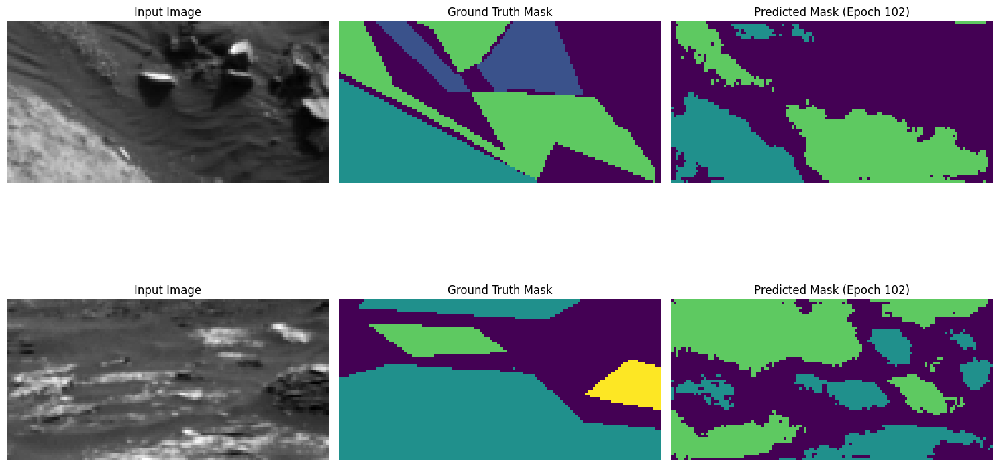

Epoch 103/250, Train Loss: 0.0666, Val Loss: 0.0583, Mean IoU: 0.3273
Class 0 IoU: 0.4552
Class 1 IoU: 0.3017
Class 2 IoU: 0.5185
Class 3 IoU: 0.0338


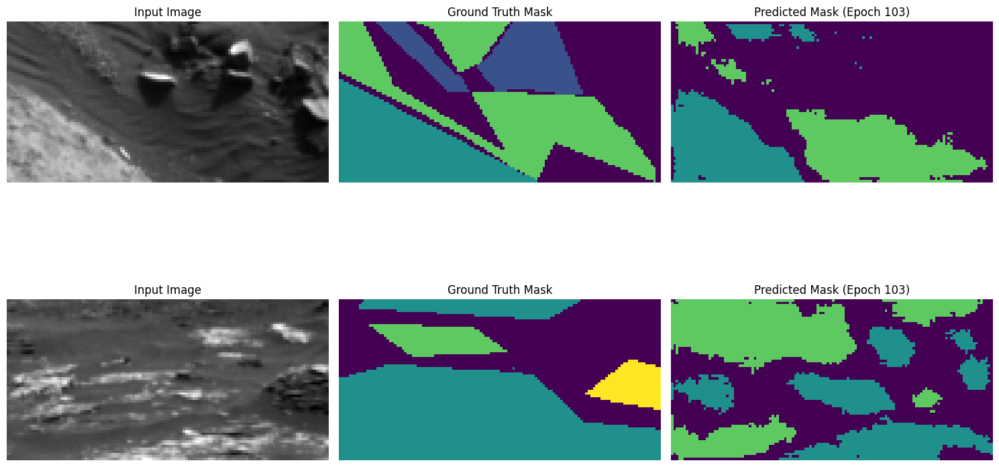

Epoch 104/250, Train Loss: 0.0629, Val Loss: 0.0522, Mean IoU: 0.3425
Class 0 IoU: 0.4749
Class 1 IoU: 0.2931
Class 2 IoU: 0.5306
Class 3 IoU: 0.0713


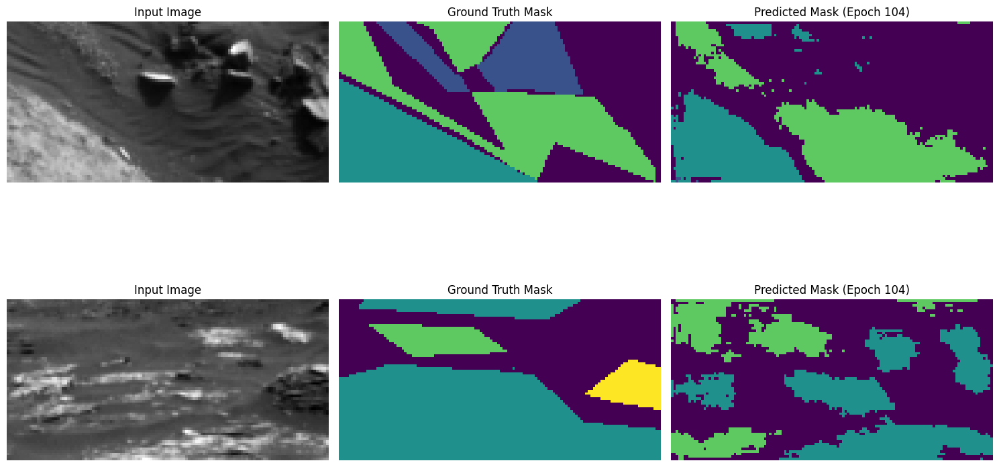

Epoch 105/250, Train Loss: 0.0652, Val Loss: 0.0542, Mean IoU: 0.3254
Class 0 IoU: 0.4383
Class 1 IoU: 0.2820
Class 2 IoU: 0.5257
Class 3 IoU: 0.0555


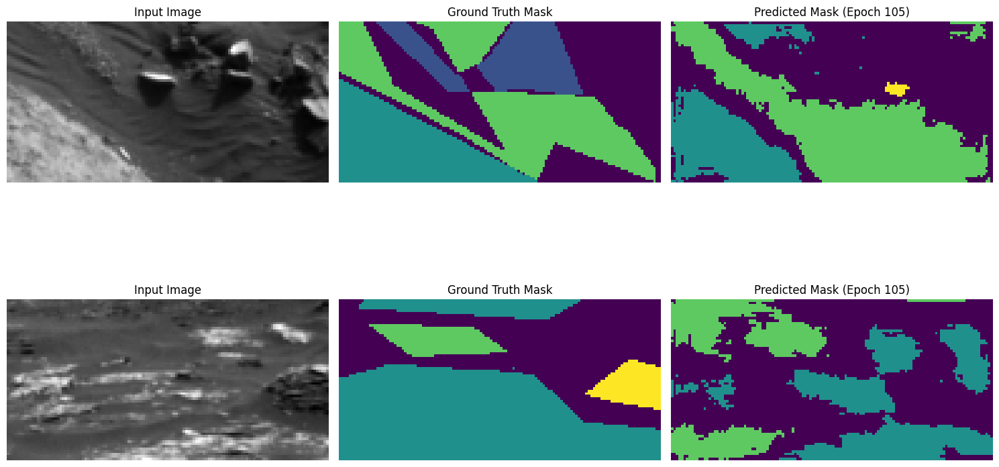

Epoch 106/250, Train Loss: 0.0672, Val Loss: 0.0596, Mean IoU: 0.3208
Class 0 IoU: 0.4315
Class 1 IoU: 0.2925
Class 2 IoU: 0.5291
Class 3 IoU: 0.0302


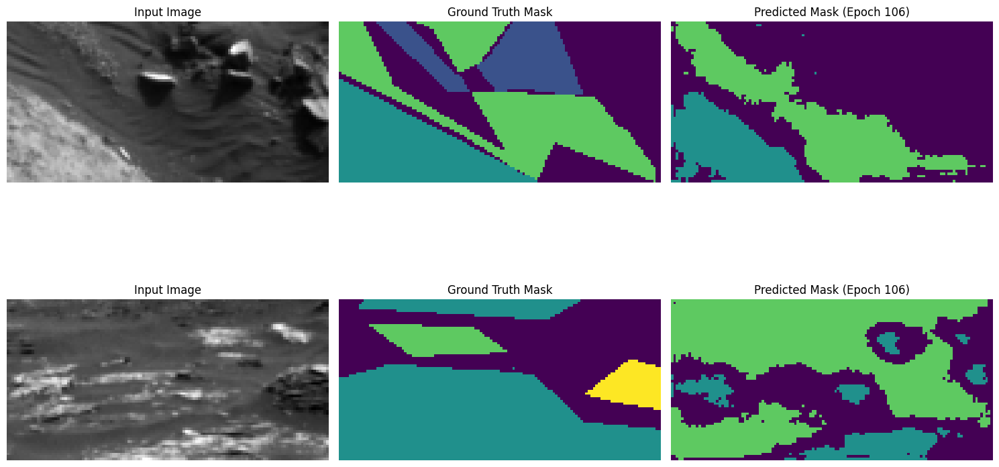

Epoch 107/250, Train Loss: 0.0665, Val Loss: 0.0546, Mean IoU: 0.3213
Class 0 IoU: 0.4202
Class 1 IoU: 0.2922
Class 2 IoU: 0.5325
Class 3 IoU: 0.0404


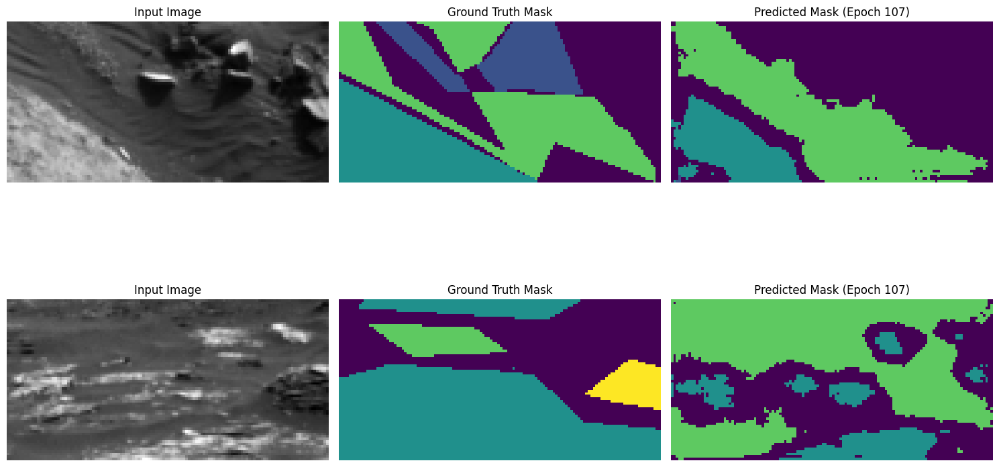

Epoch 108/250, Train Loss: 0.0619, Val Loss: 0.0629, Mean IoU: 0.3170
Class 0 IoU: 0.4493
Class 1 IoU: 0.2747
Class 2 IoU: 0.5229
Class 3 IoU: 0.0212


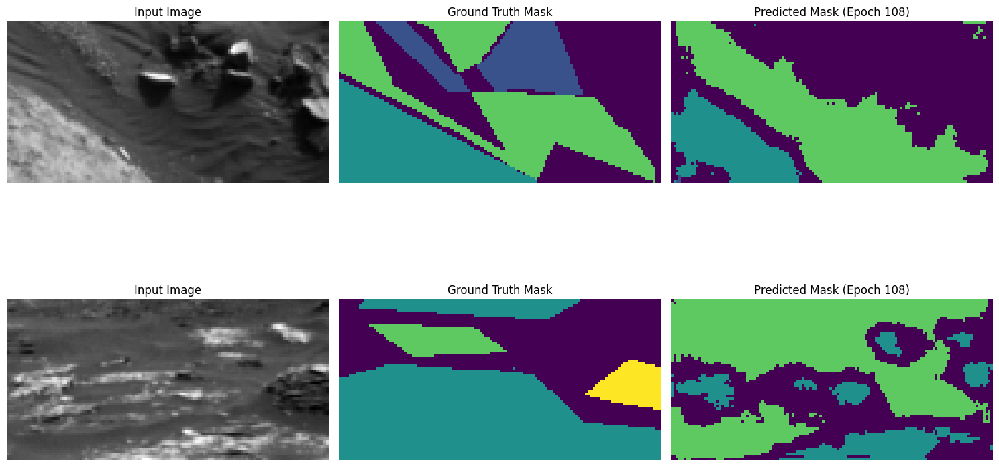

Epoch 109/250, Train Loss: 0.0626, Val Loss: 0.0518, Mean IoU: 0.3404
Class 0 IoU: 0.4519
Class 1 IoU: 0.2937
Class 2 IoU: 0.5425
Class 3 IoU: 0.0736


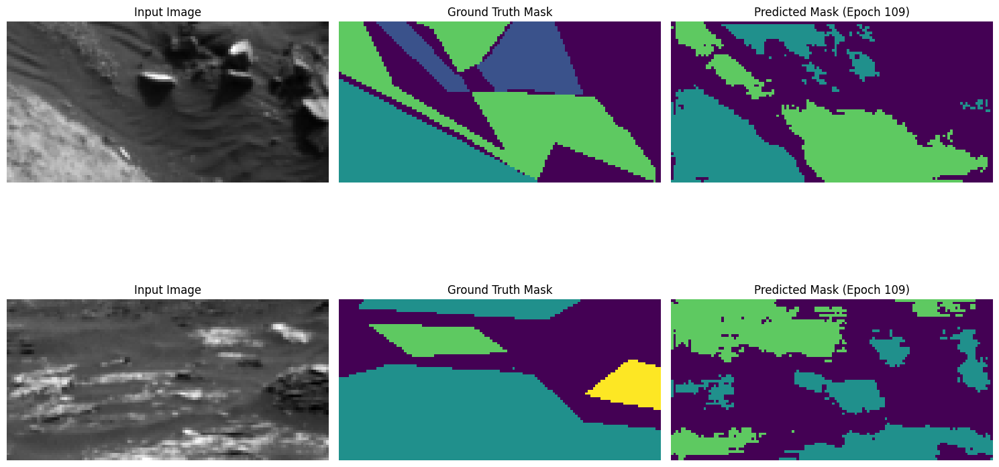

Epoch 110/250, Train Loss: 0.0659, Val Loss: 0.0599, Mean IoU: 0.3262
Class 0 IoU: 0.4531
Class 1 IoU: 0.2907
Class 2 IoU: 0.5364
Class 3 IoU: 0.0246


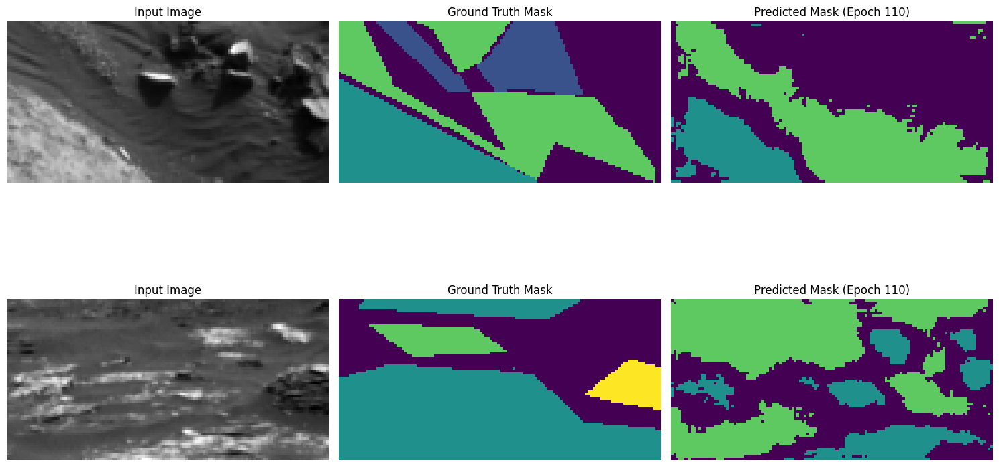

Epoch 111/250, Train Loss: 0.0653, Val Loss: 0.0515, Mean IoU: 0.3413
Class 0 IoU: 0.4559
Class 1 IoU: 0.2935
Class 2 IoU: 0.5366
Class 3 IoU: 0.0791


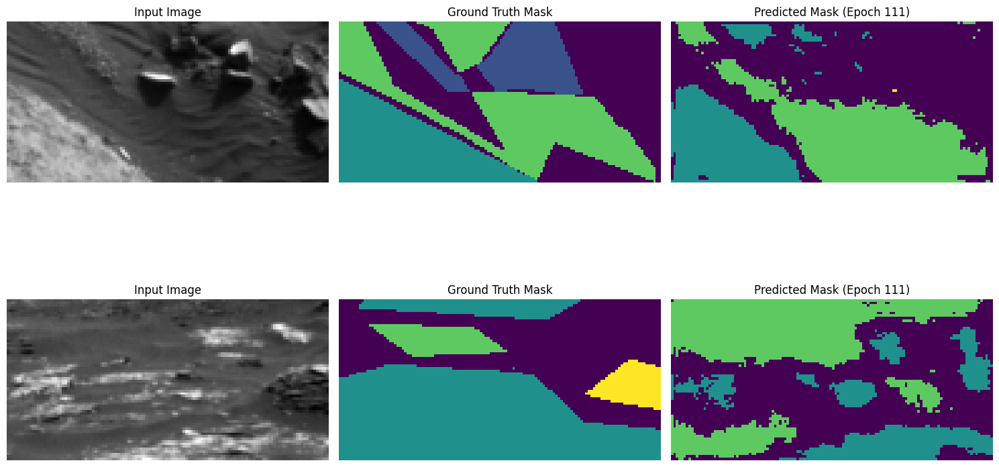

Epoch 112/250, Train Loss: 0.0594, Val Loss: 0.0493, Mean IoU: 0.3328
Class 0 IoU: 0.4203
Class 1 IoU: 0.2950
Class 2 IoU: 0.5348
Class 3 IoU: 0.0810


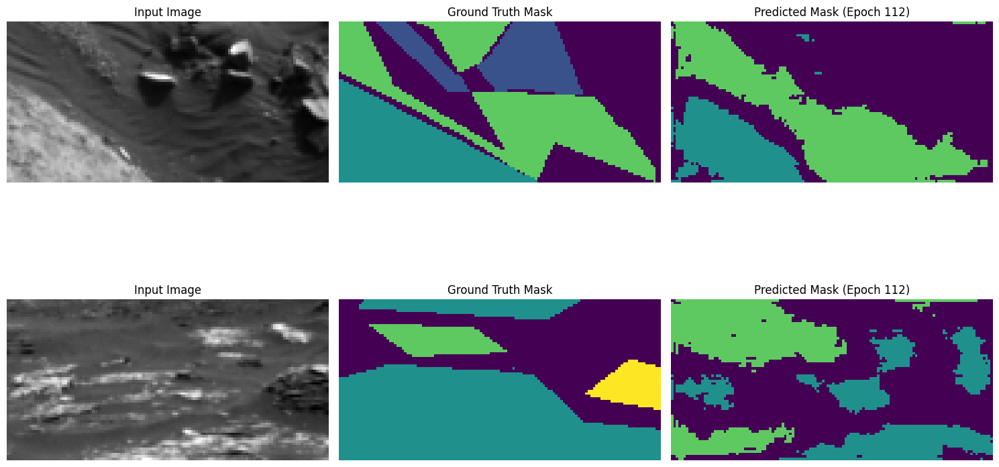

Epoch 113/250, Train Loss: 0.0615, Val Loss: 0.0557, Mean IoU: 0.3257
Class 0 IoU: 0.4391
Class 1 IoU: 0.2893
Class 2 IoU: 0.5332
Class 3 IoU: 0.0411


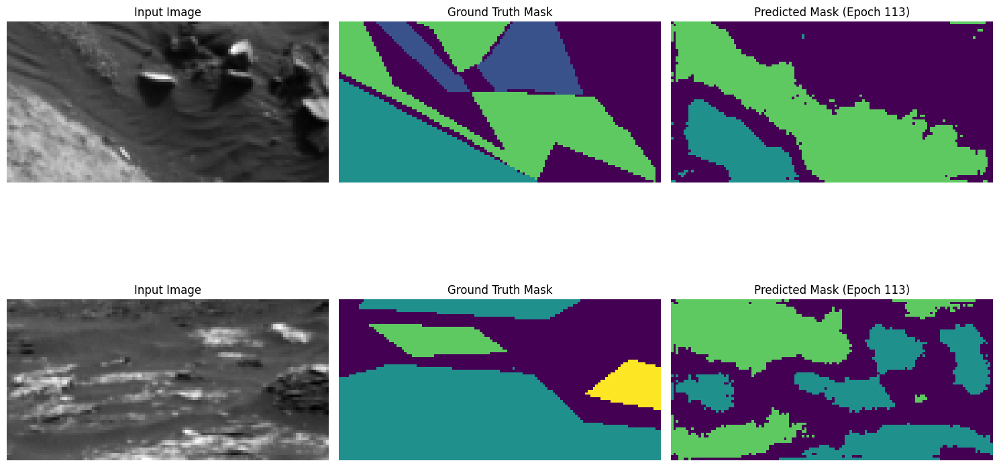

Epoch 114/250, Train Loss: 0.0674, Val Loss: 0.0561, Mean IoU: 0.3284
Class 0 IoU: 0.4528
Class 1 IoU: 0.2792
Class 2 IoU: 0.5335
Class 3 IoU: 0.0482


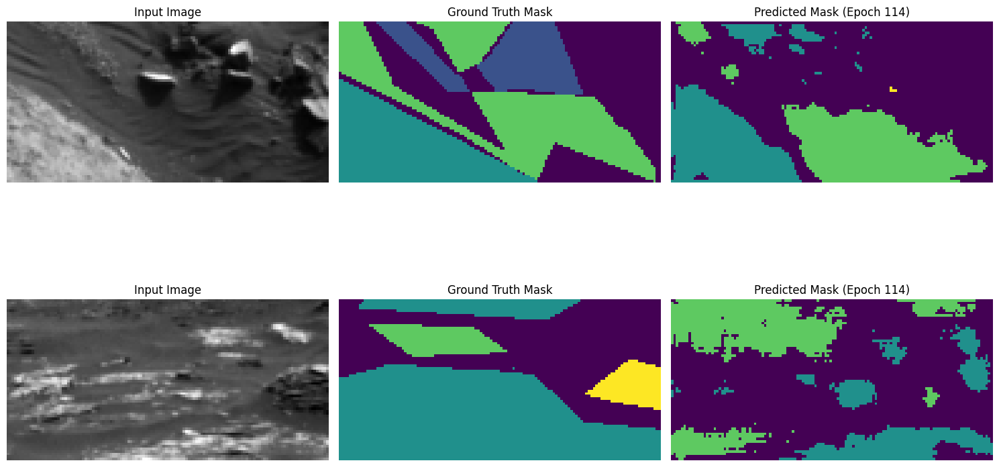

Epoch 115/250, Train Loss: 0.0662, Val Loss: 0.0569, Mean IoU: 0.3376
Class 0 IoU: 0.4698
Class 1 IoU: 0.2958
Class 2 IoU: 0.5288
Class 3 IoU: 0.0558


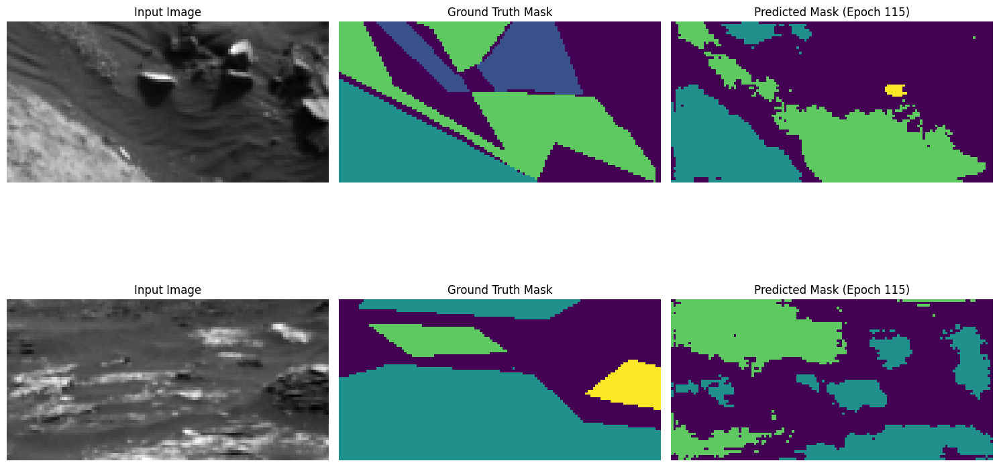

Epoch 116/250, Train Loss: 0.0616, Val Loss: 0.0577, Mean IoU: 0.3238
Class 0 IoU: 0.4377
Class 1 IoU: 0.2919
Class 2 IoU: 0.5276
Class 3 IoU: 0.0379


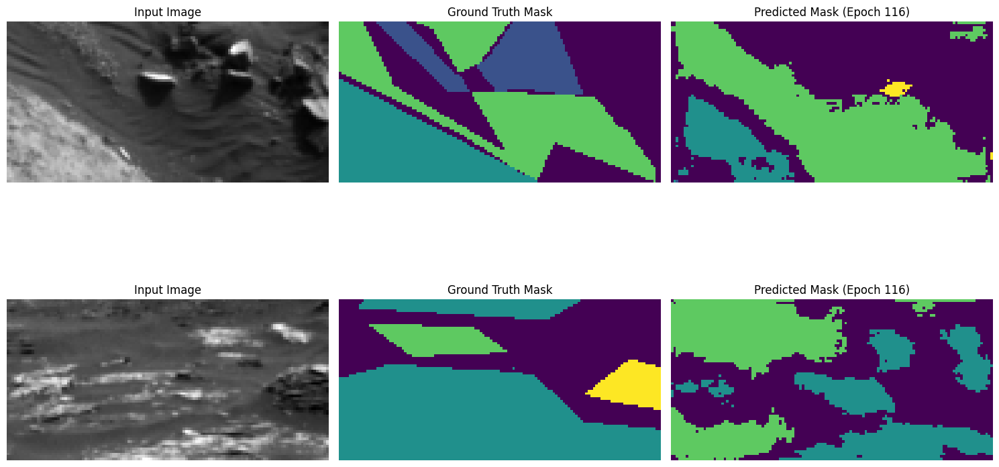

Epoch 117/250, Train Loss: 0.0628, Val Loss: 0.0585, Mean IoU: 0.3195
Class 0 IoU: 0.4183
Class 1 IoU: 0.2933
Class 2 IoU: 0.5383
Class 3 IoU: 0.0282


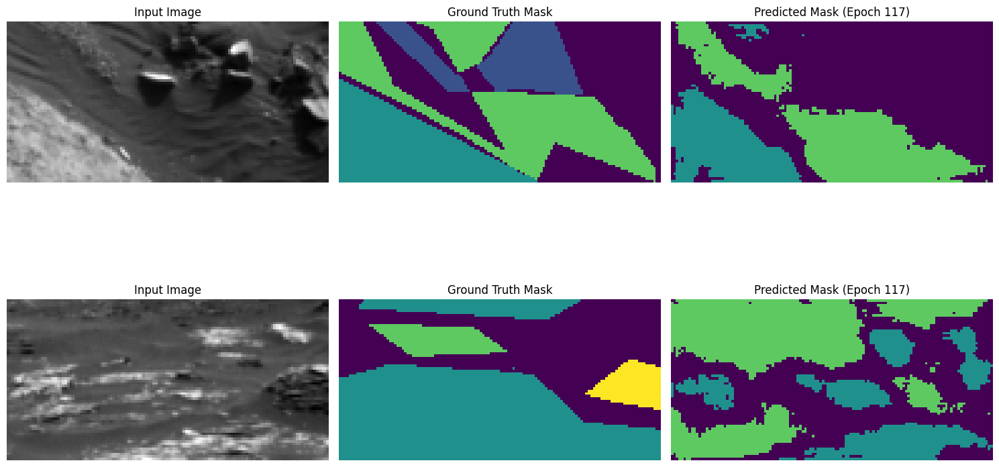

Epoch 118/250, Train Loss: 0.0568, Val Loss: 0.0580, Mean IoU: 0.3268
Class 0 IoU: 0.4498
Class 1 IoU: 0.2993
Class 2 IoU: 0.5268
Class 3 IoU: 0.0315


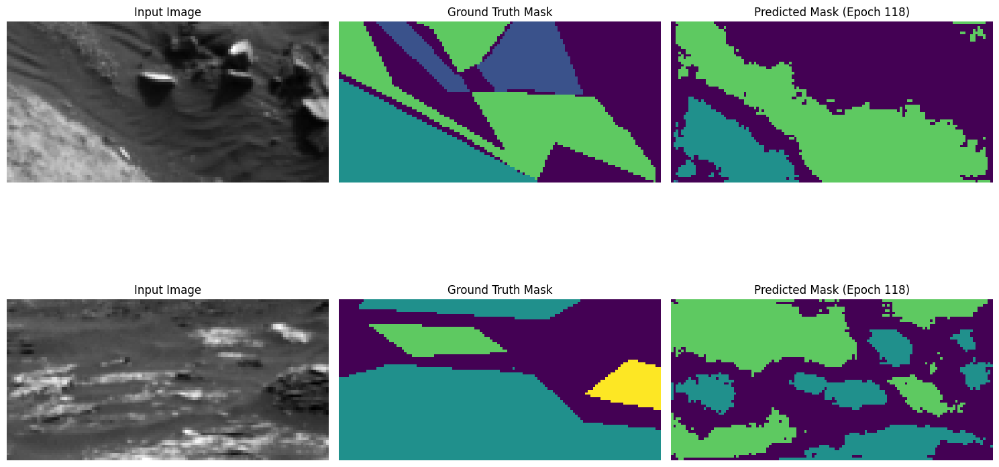

Epoch 119/250, Train Loss: 0.0588, Val Loss: 0.0603, Mean IoU: 0.3254
Class 0 IoU: 0.4416
Class 1 IoU: 0.3011
Class 2 IoU: 0.5318
Class 3 IoU: 0.0270


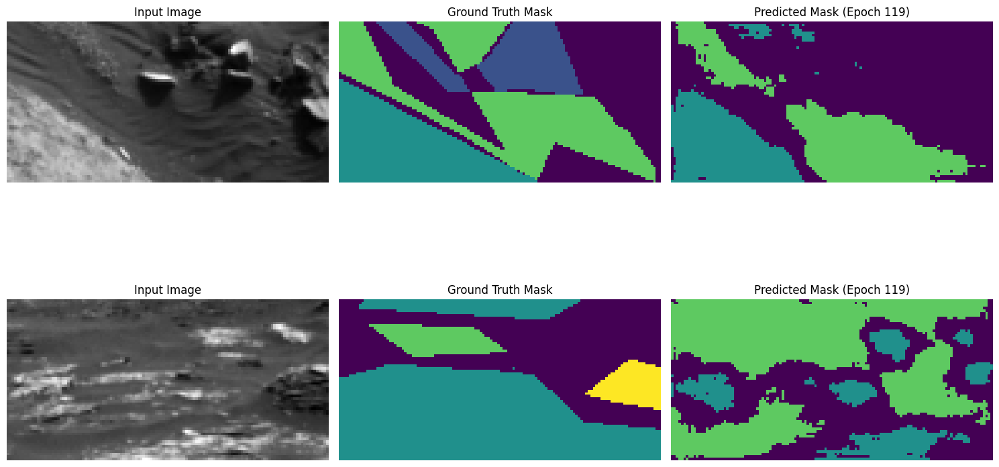

Epoch 120/250, Train Loss: 0.0588, Val Loss: 0.0579, Mean IoU: 0.3258
Class 0 IoU: 0.4440
Class 1 IoU: 0.2868
Class 2 IoU: 0.5448
Class 3 IoU: 0.0276


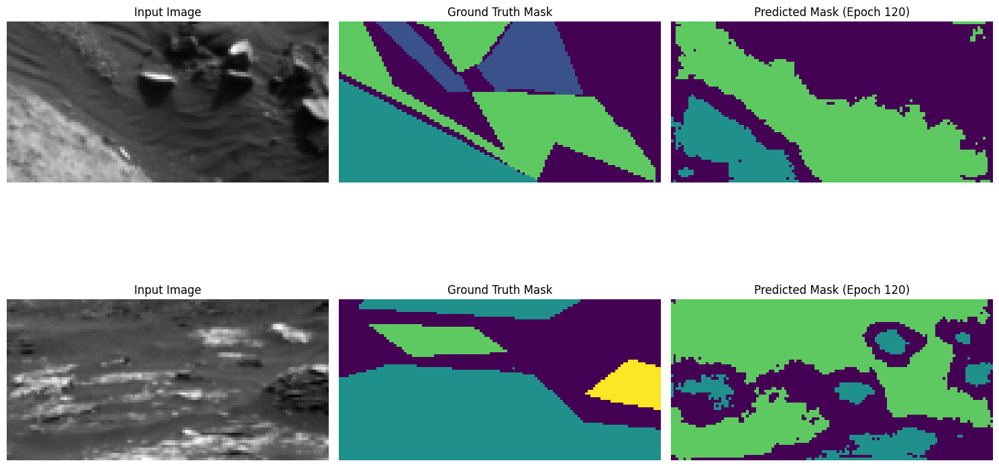

Epoch 121/250, Train Loss: 0.0606, Val Loss: 0.0603, Mean IoU: 0.3307
Class 0 IoU: 0.4685
Class 1 IoU: 0.2828
Class 2 IoU: 0.5378
Class 3 IoU: 0.0336


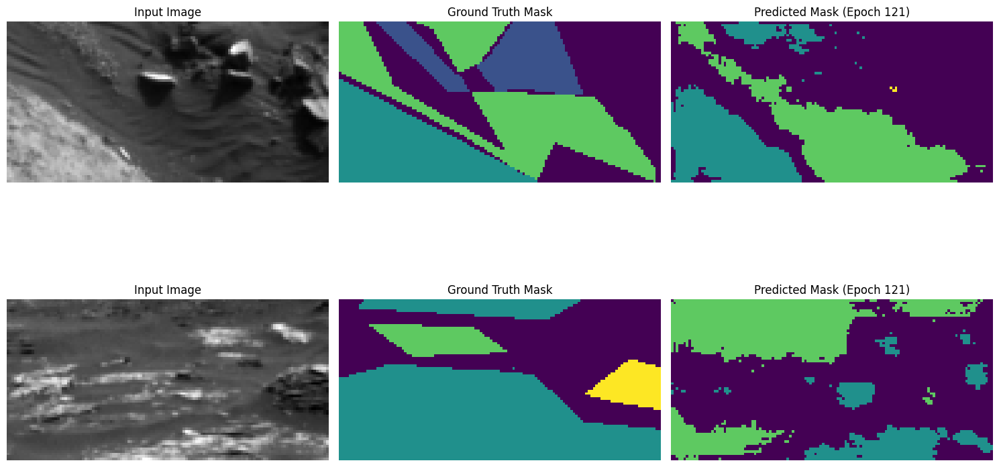

Epoch 122/250, Train Loss: 0.0600, Val Loss: 0.0569, Mean IoU: 0.3287
Class 0 IoU: 0.4441
Class 1 IoU: 0.2903
Class 2 IoU: 0.5281
Class 3 IoU: 0.0521


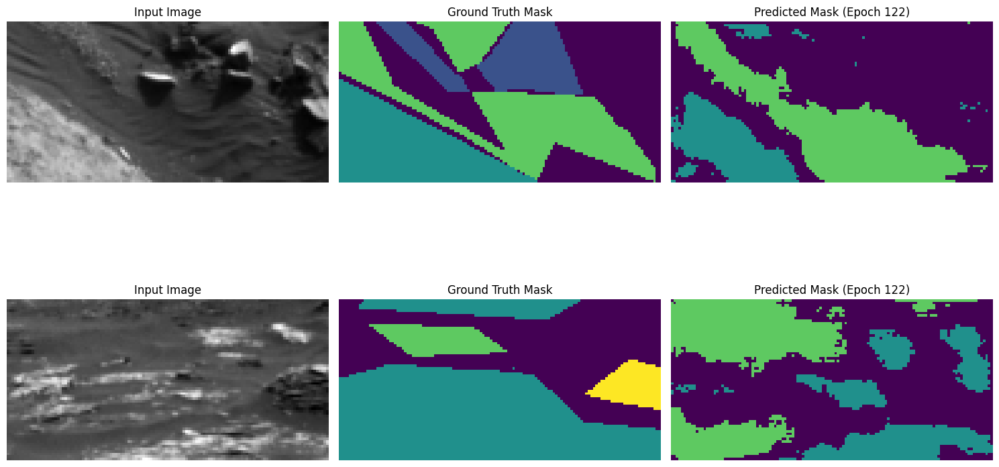

Epoch 123/250, Train Loss: 0.0618, Val Loss: 0.0595, Mean IoU: 0.3361
Class 0 IoU: 0.4814
Class 1 IoU: 0.2827
Class 2 IoU: 0.5373
Class 3 IoU: 0.0429


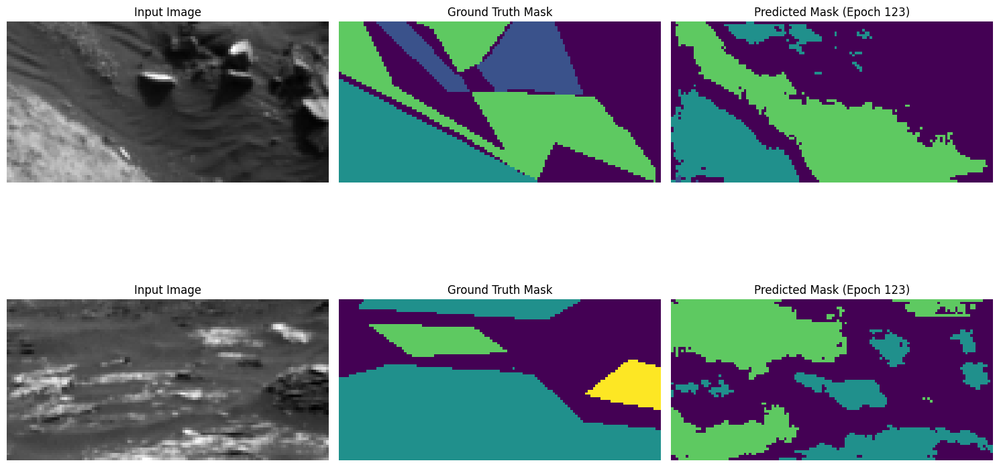

Epoch 124/250, Train Loss: 0.0601, Val Loss: 0.0570, Mean IoU: 0.3214
Class 0 IoU: 0.4306
Class 1 IoU: 0.2826
Class 2 IoU: 0.5336
Class 3 IoU: 0.0390


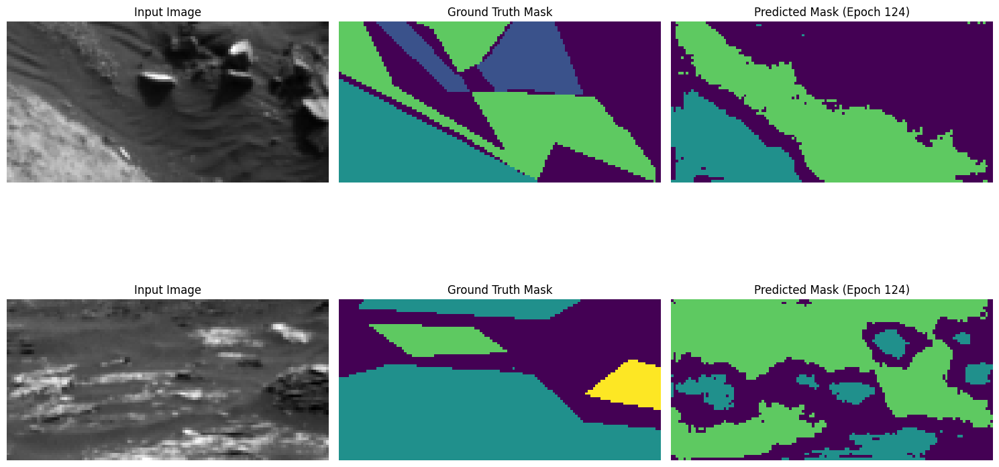

Epoch 125/250, Train Loss: 0.0607, Val Loss: 0.0603, Mean IoU: 0.3219
Class 0 IoU: 0.4281
Class 1 IoU: 0.2887
Class 2 IoU: 0.5435
Class 3 IoU: 0.0275


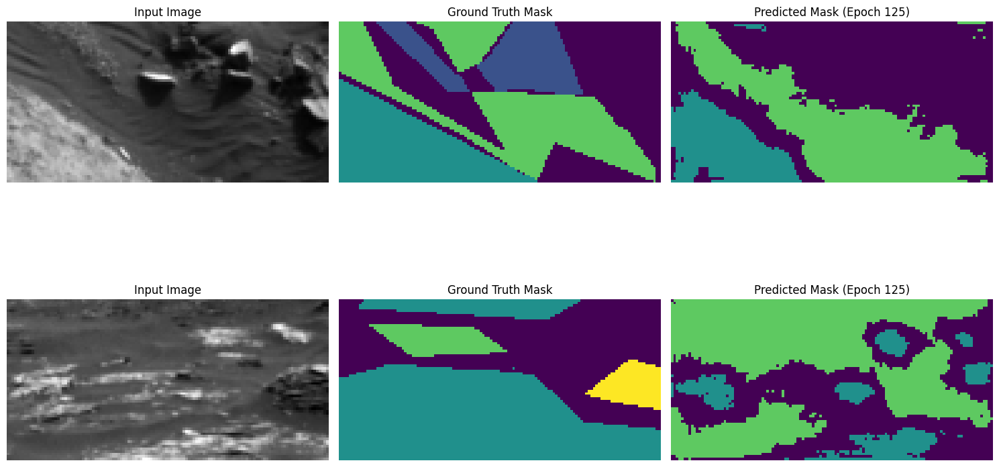

Epoch 126/250, Train Loss: 0.0598, Val Loss: 0.0572, Mean IoU: 0.3227
Class 0 IoU: 0.4282
Class 1 IoU: 0.2906
Class 2 IoU: 0.5286
Class 3 IoU: 0.0433


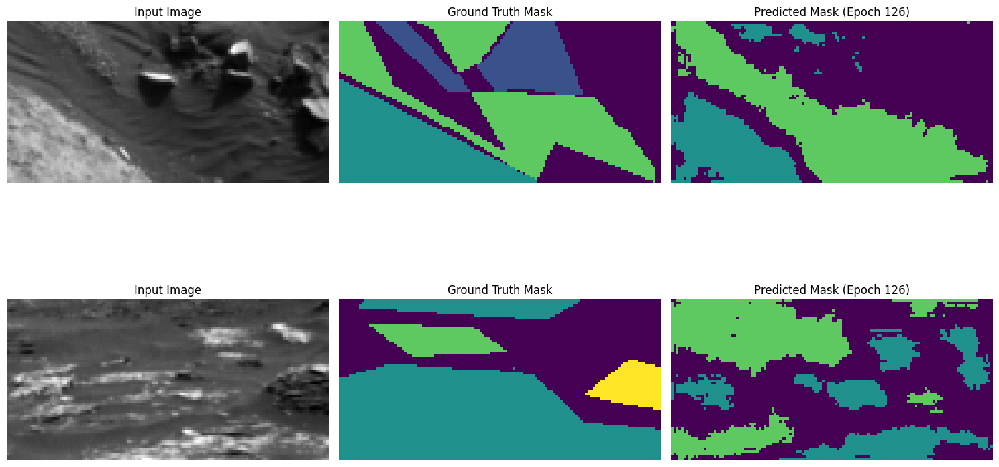

Epoch 127/250, Train Loss: 0.0566, Val Loss: 0.0634, Mean IoU: 0.3243
Class 0 IoU: 0.4502
Class 1 IoU: 0.2979
Class 2 IoU: 0.5331
Class 3 IoU: 0.0162


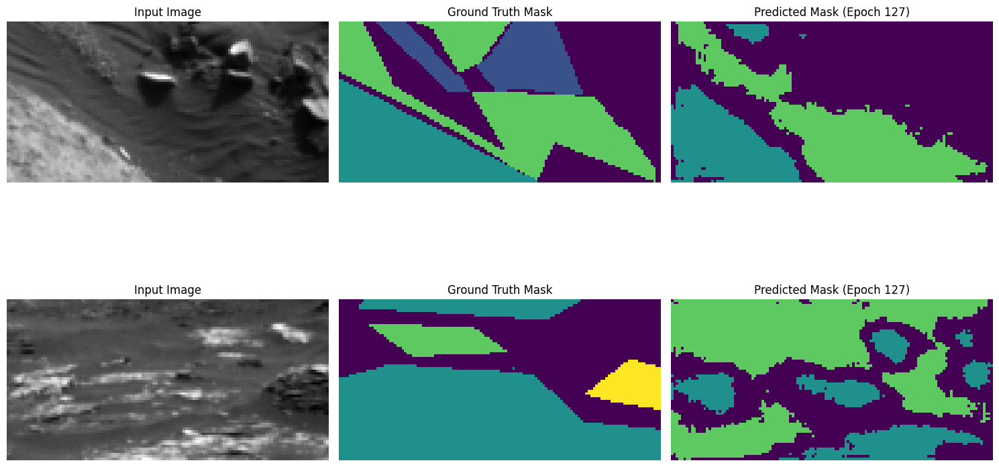

Epoch 128/250, Train Loss: 0.0609, Val Loss: 0.0632, Mean IoU: 0.3260
Class 0 IoU: 0.4620
Class 1 IoU: 0.2788
Class 2 IoU: 0.5366
Class 3 IoU: 0.0265


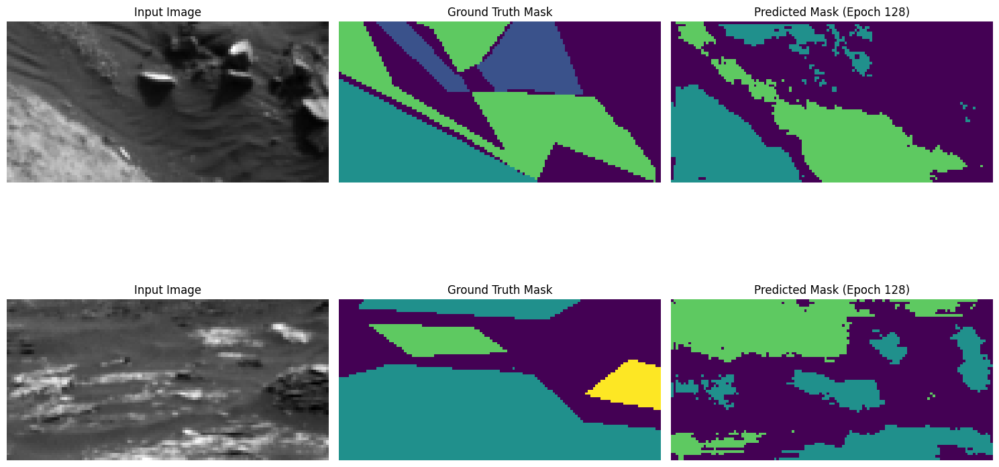

Epoch 129/250, Train Loss: 0.0638, Val Loss: 0.0600, Mean IoU: 0.3267
Class 0 IoU: 0.4497
Class 1 IoU: 0.2876
Class 2 IoU: 0.5447
Class 3 IoU: 0.0247


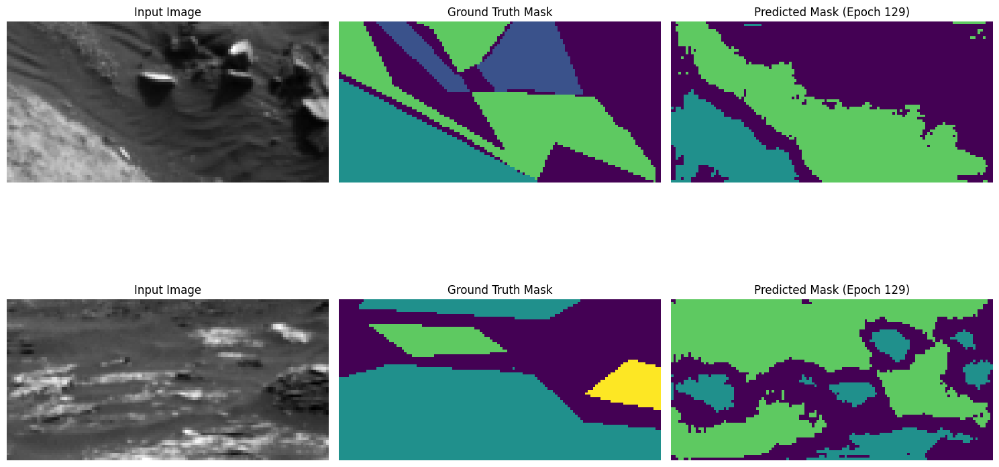

Epoch 130/250, Train Loss: 0.0575, Val Loss: 0.0610, Mean IoU: 0.3249
Class 0 IoU: 0.4489
Class 1 IoU: 0.2890
Class 2 IoU: 0.5399
Class 3 IoU: 0.0218


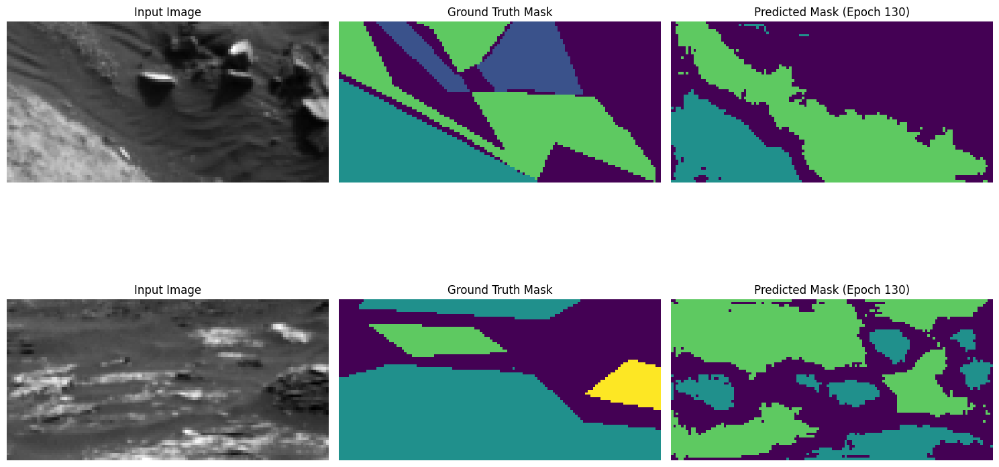

Epoch 131/250, Train Loss: 0.0629, Val Loss: 0.0588, Mean IoU: 0.3215
Class 0 IoU: 0.4411
Class 1 IoU: 0.2837
Class 2 IoU: 0.5307
Class 3 IoU: 0.0305


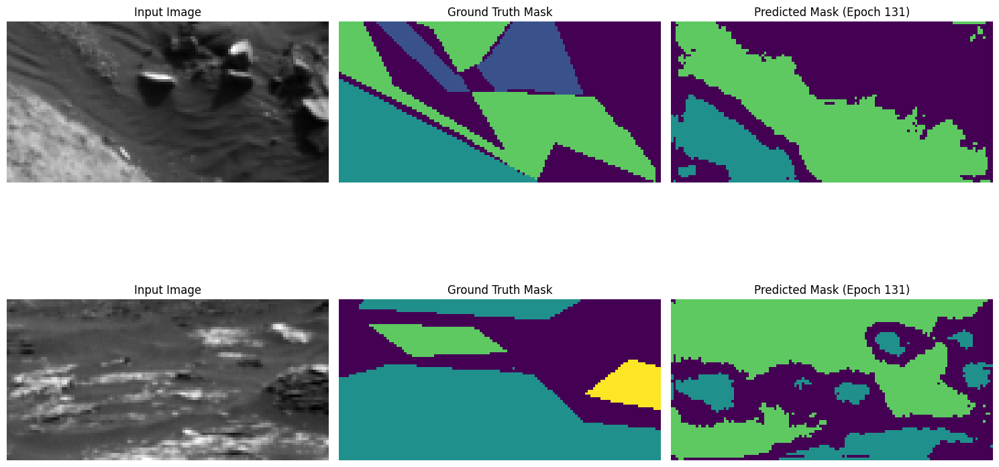

Epoch 132/250, Train Loss: 0.0595, Val Loss: 0.0587, Mean IoU: 0.3349
Class 0 IoU: 0.4617
Class 1 IoU: 0.2974
Class 2 IoU: 0.5319
Class 3 IoU: 0.0487


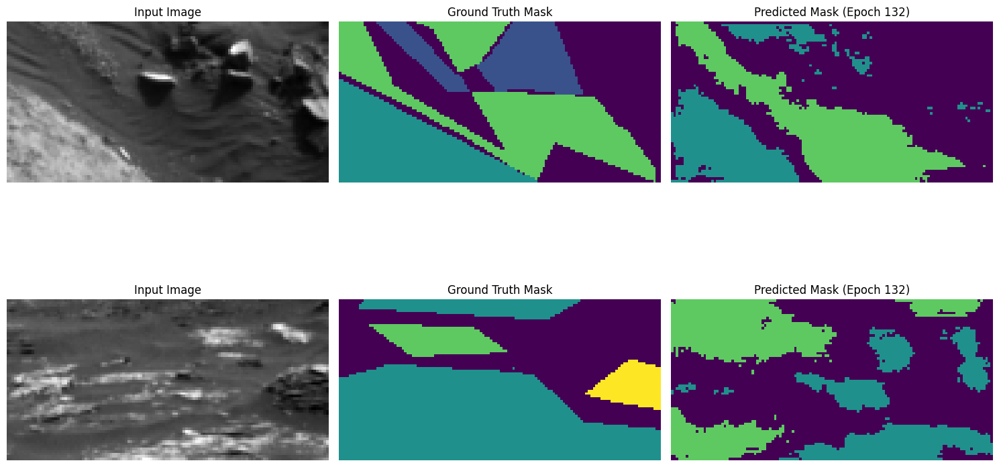

Epoch 133/250, Train Loss: 0.0625, Val Loss: 0.0596, Mean IoU: 0.3320
Class 0 IoU: 0.4584
Class 1 IoU: 0.3020
Class 2 IoU: 0.5319
Class 3 IoU: 0.0356


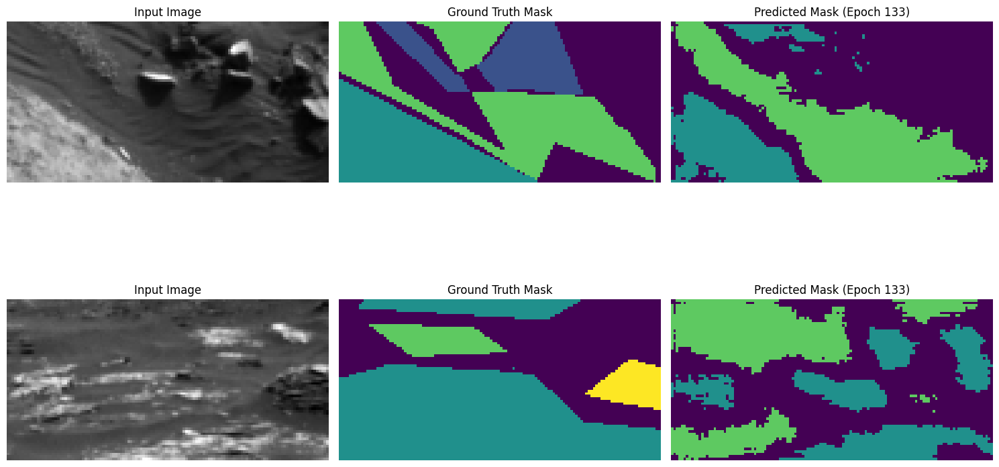

Epoch 134/250, Train Loss: 0.0585, Val Loss: 0.0607, Mean IoU: 0.3257
Class 0 IoU: 0.4496
Class 1 IoU: 0.2968
Class 2 IoU: 0.5256
Class 3 IoU: 0.0310


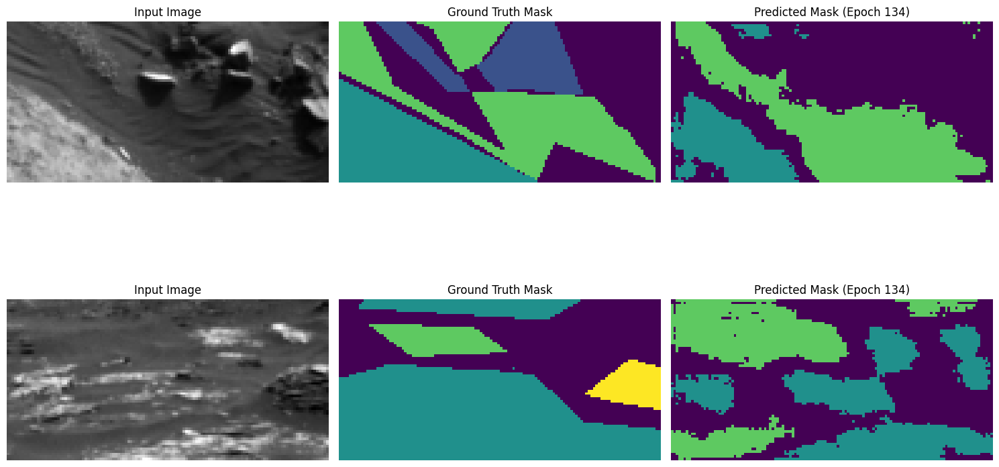

Epoch 135/250, Train Loss: 0.0587, Val Loss: 0.0595, Mean IoU: 0.3334
Class 0 IoU: 0.4607
Class 1 IoU: 0.3028
Class 2 IoU: 0.5359
Class 3 IoU: 0.0343


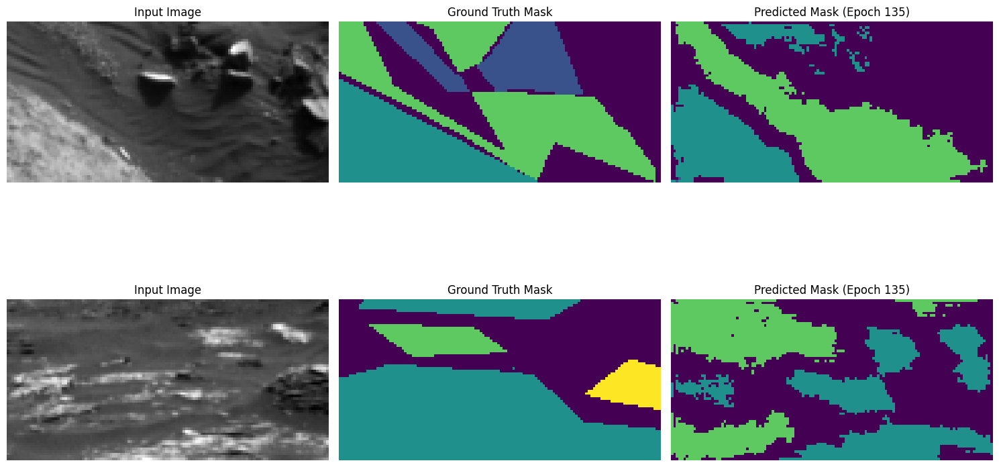

Epoch 136/250, Train Loss: 0.0608, Val Loss: 0.0587, Mean IoU: 0.3281
Class 0 IoU: 0.4436
Class 1 IoU: 0.2937
Class 2 IoU: 0.5304
Class 3 IoU: 0.0447


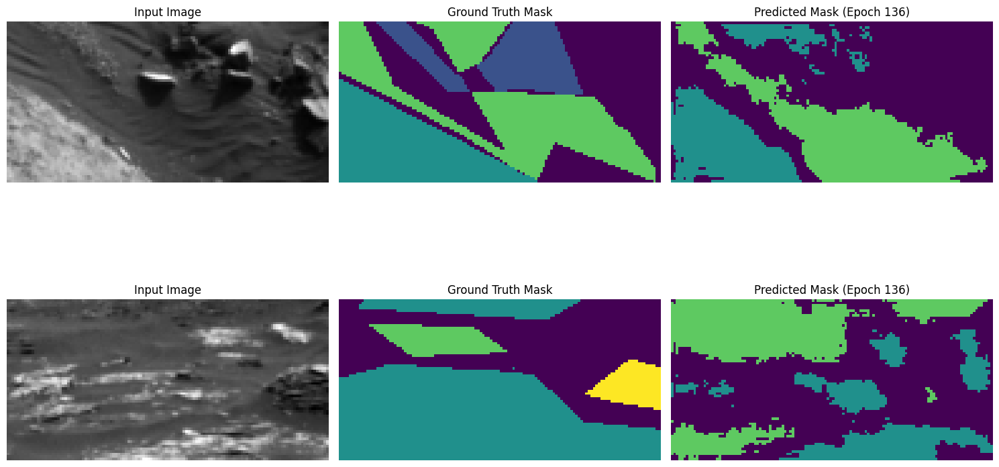

Epoch 137/250, Train Loss: 0.0561, Val Loss: 0.0604, Mean IoU: 0.3238
Class 0 IoU: 0.4544
Class 1 IoU: 0.2738
Class 2 IoU: 0.5395
Class 3 IoU: 0.0277


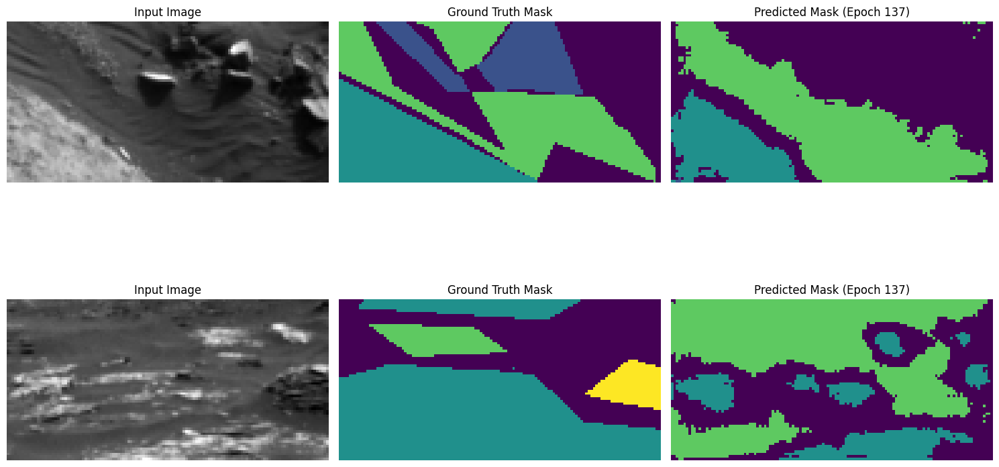

Epoch 138/250, Train Loss: 0.0648, Val Loss: 0.0561, Mean IoU: 0.3166
Class 0 IoU: 0.4042
Class 1 IoU: 0.2913
Class 2 IoU: 0.5292
Class 3 IoU: 0.0418


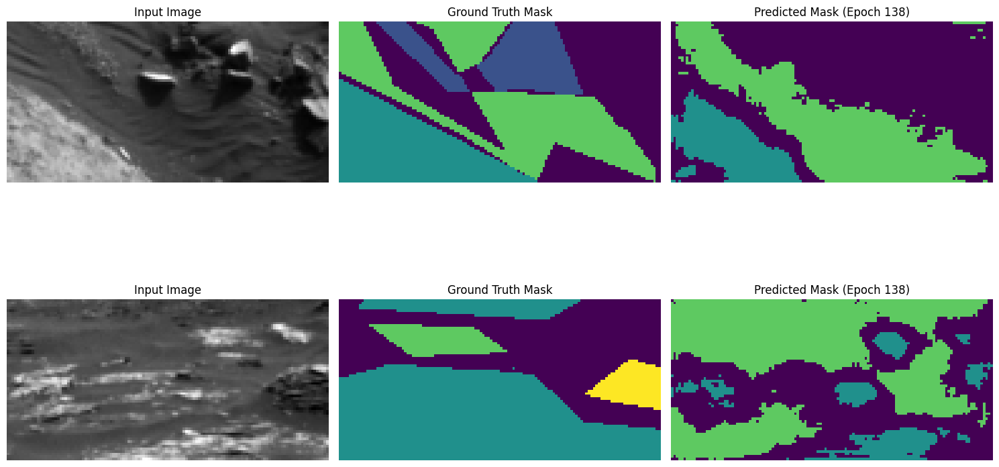

Epoch 139/250, Train Loss: 0.0622, Val Loss: 0.0610, Mean IoU: 0.3235
Class 0 IoU: 0.4391
Class 1 IoU: 0.2950
Class 2 IoU: 0.5376
Class 3 IoU: 0.0223


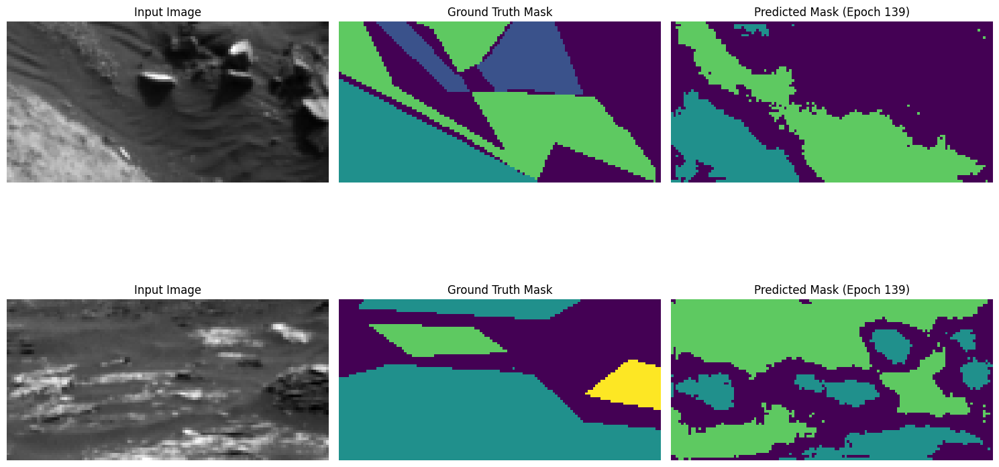

Epoch 140/250, Train Loss: 0.0562, Val Loss: 0.0556, Mean IoU: 0.3320
Class 0 IoU: 0.4413
Class 1 IoU: 0.2945
Class 2 IoU: 0.5270
Class 3 IoU: 0.0653


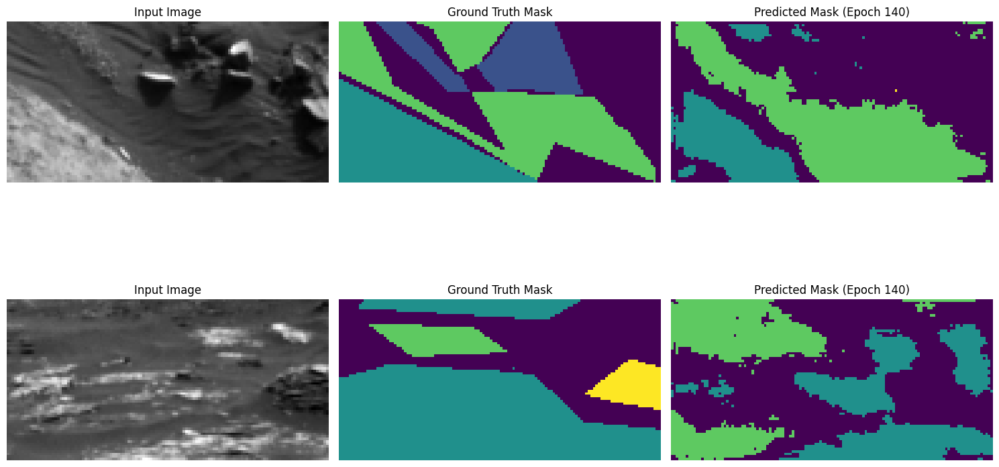

Epoch 141/250, Train Loss: 0.0571, Val Loss: 0.0585, Mean IoU: 0.3266
Class 0 IoU: 0.4447
Class 1 IoU: 0.2996
Class 2 IoU: 0.5177
Class 3 IoU: 0.0442


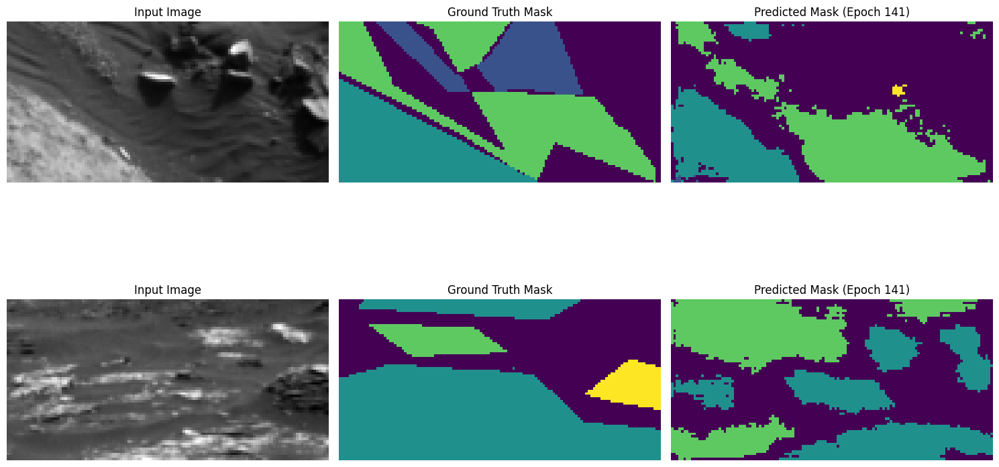

Epoch 142/250, Train Loss: 0.0603, Val Loss: 0.0566, Mean IoU: 0.3347
Class 0 IoU: 0.4471
Class 1 IoU: 0.2985
Class 2 IoU: 0.5296
Class 3 IoU: 0.0636


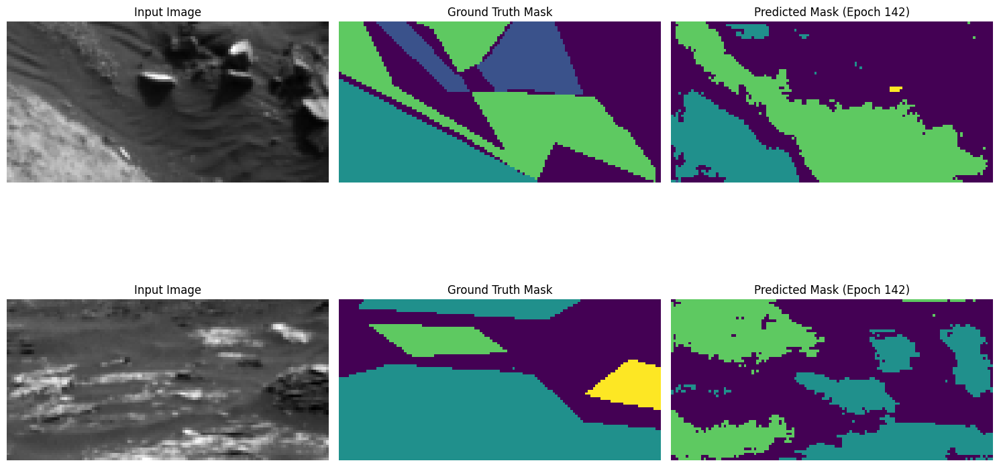

Epoch 143/250, Train Loss: 0.0607, Val Loss: 0.0564, Mean IoU: 0.3242
Class 0 IoU: 0.4392
Class 1 IoU: 0.2842
Class 2 IoU: 0.5258
Class 3 IoU: 0.0477


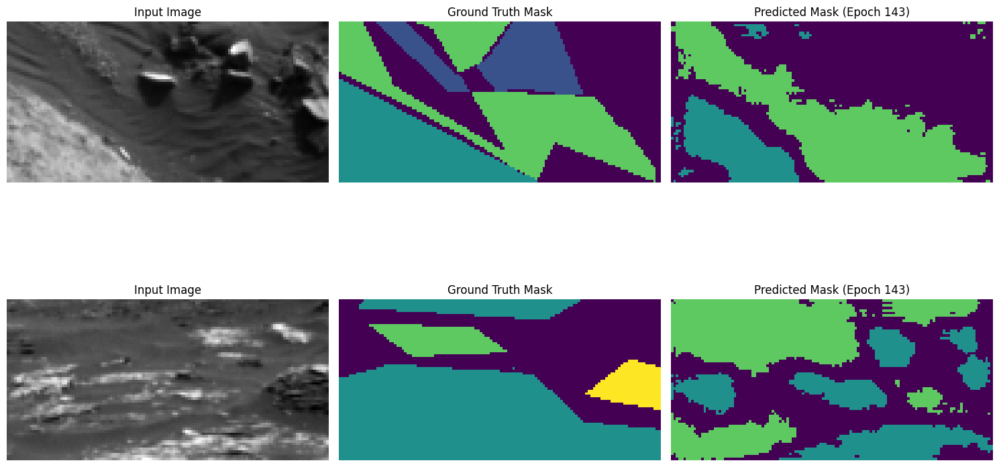

Epoch 144/250, Train Loss: 0.0596, Val Loss: 0.0565, Mean IoU: 0.3350
Class 0 IoU: 0.4634
Class 1 IoU: 0.2834
Class 2 IoU: 0.5328
Class 3 IoU: 0.0606


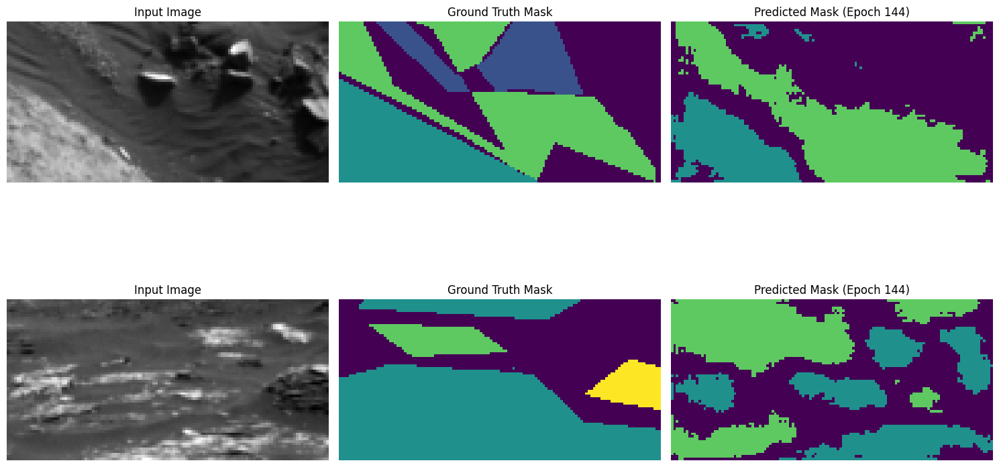

Epoch 145/250, Train Loss: 0.0567, Val Loss: 0.0588, Mean IoU: 0.3301
Class 0 IoU: 0.4555
Class 1 IoU: 0.2926
Class 2 IoU: 0.5389
Class 3 IoU: 0.0333


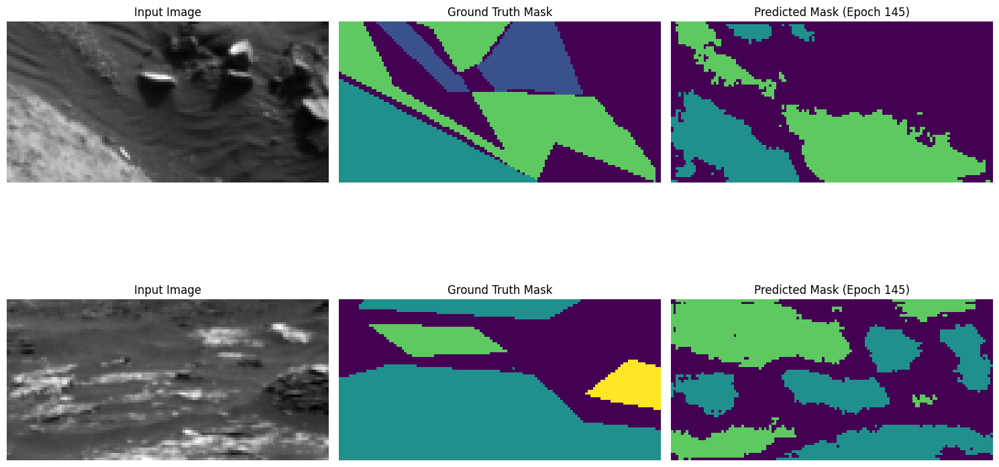

Epoch 146/250, Train Loss: 0.0589, Val Loss: 0.0575, Mean IoU: 0.3271
Class 0 IoU: 0.4340
Class 1 IoU: 0.2943
Class 2 IoU: 0.5320
Class 3 IoU: 0.0481


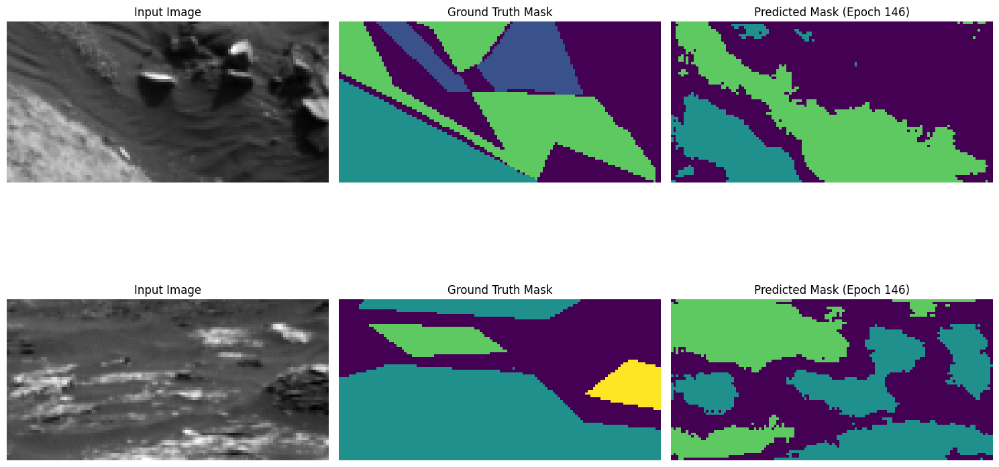

Epoch 147/250, Train Loss: 0.0570, Val Loss: 0.0624, Mean IoU: 0.3228
Class 0 IoU: 0.4567
Class 1 IoU: 0.2737
Class 2 IoU: 0.5379
Class 3 IoU: 0.0230


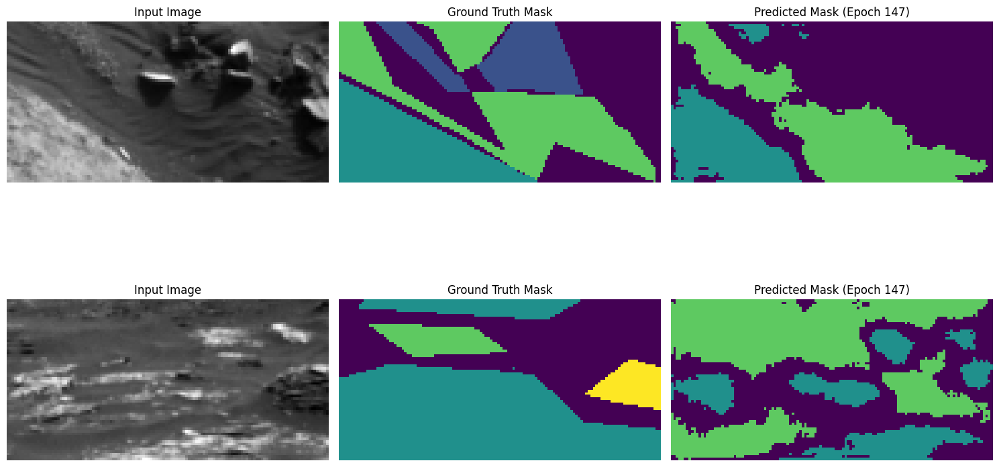

Epoch 148/250, Train Loss: 0.0546, Val Loss: 0.0602, Mean IoU: 0.3292
Class 0 IoU: 0.4533
Class 1 IoU: 0.2903
Class 2 IoU: 0.5321
Class 3 IoU: 0.0411


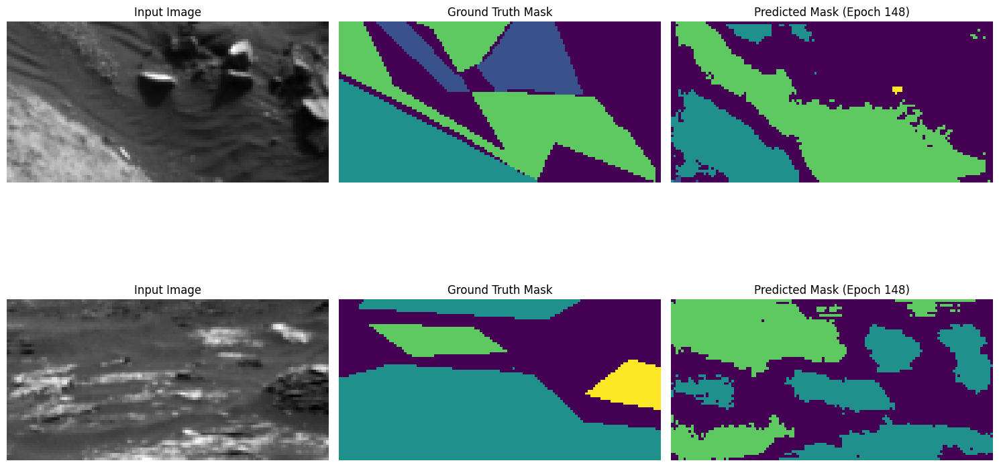

Epoch 149/250, Train Loss: 0.0579, Val Loss: 0.0598, Mean IoU: 0.3273
Class 0 IoU: 0.4491
Class 1 IoU: 0.2911
Class 2 IoU: 0.5243
Class 3 IoU: 0.0446


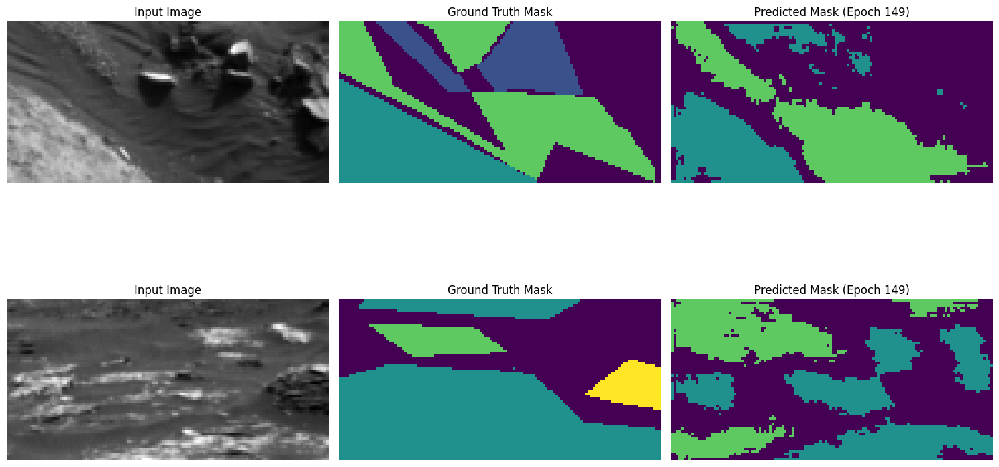

Epoch 150/250, Train Loss: 0.0573, Val Loss: 0.0611, Mean IoU: 0.3244
Class 0 IoU: 0.4563
Class 1 IoU: 0.2865
Class 2 IoU: 0.5280
Class 3 IoU: 0.0269


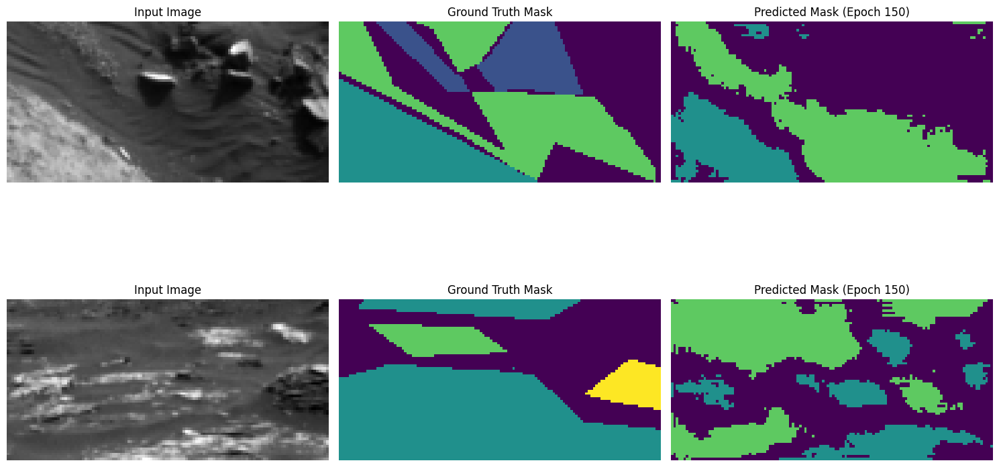

Epoch 151/250, Train Loss: 0.0612, Val Loss: 0.0591, Mean IoU: 0.3223
Class 0 IoU: 0.4335
Class 1 IoU: 0.2971
Class 2 IoU: 0.5254
Class 3 IoU: 0.0329


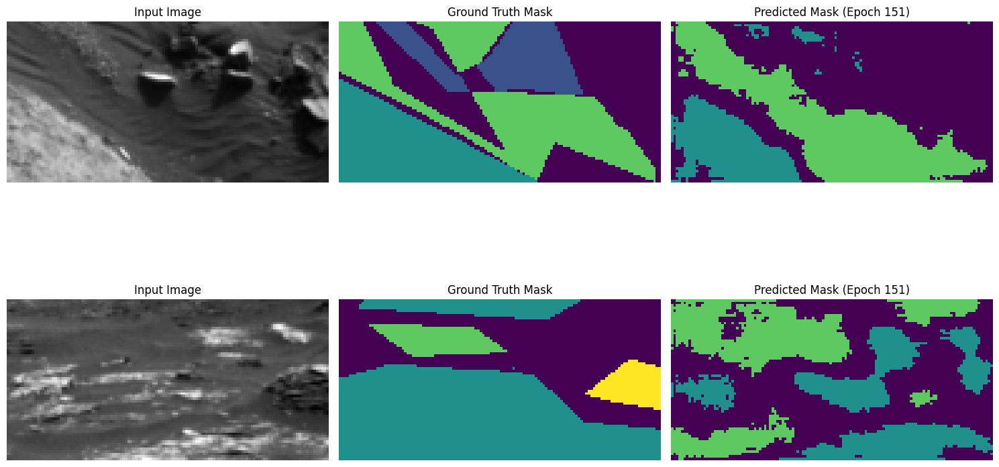

Epoch 152/250, Train Loss: 0.0558, Val Loss: 0.0619, Mean IoU: 0.3248
Class 0 IoU: 0.4575
Class 1 IoU: 0.2874
Class 2 IoU: 0.5324
Class 3 IoU: 0.0218


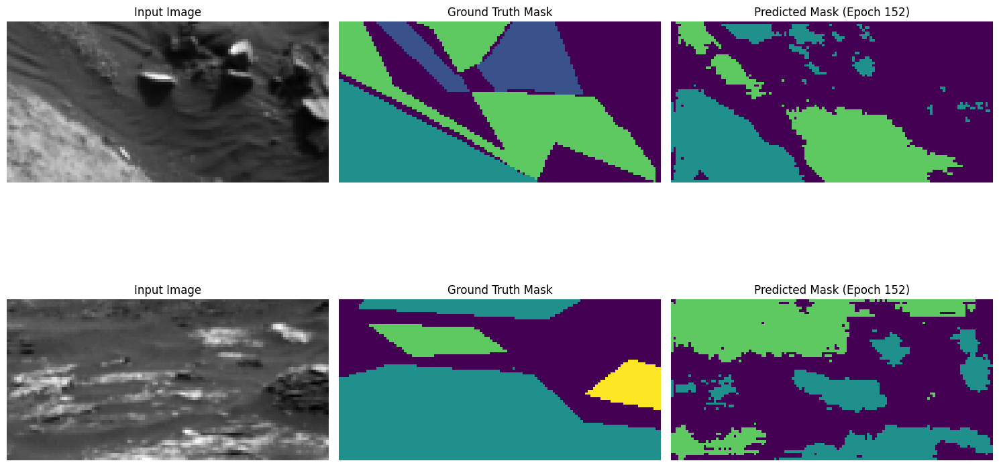

Epoch 153/250, Train Loss: 0.0584, Val Loss: 0.0598, Mean IoU: 0.3342
Class 0 IoU: 0.4501
Class 1 IoU: 0.2869
Class 2 IoU: 0.5468
Class 3 IoU: 0.0532


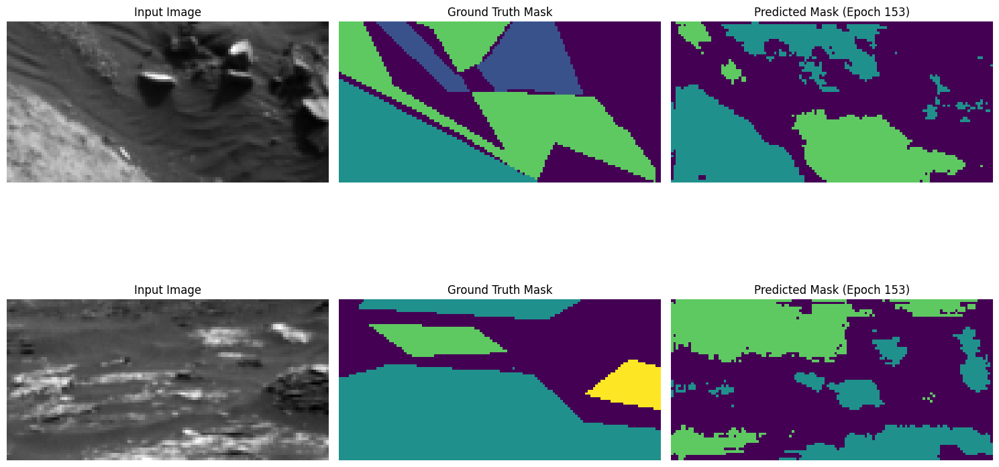

Epoch 154/250, Train Loss: 0.0576, Val Loss: 0.0570, Mean IoU: 0.3290
Class 0 IoU: 0.4338
Class 1 IoU: 0.2887
Class 2 IoU: 0.5376
Class 3 IoU: 0.0560


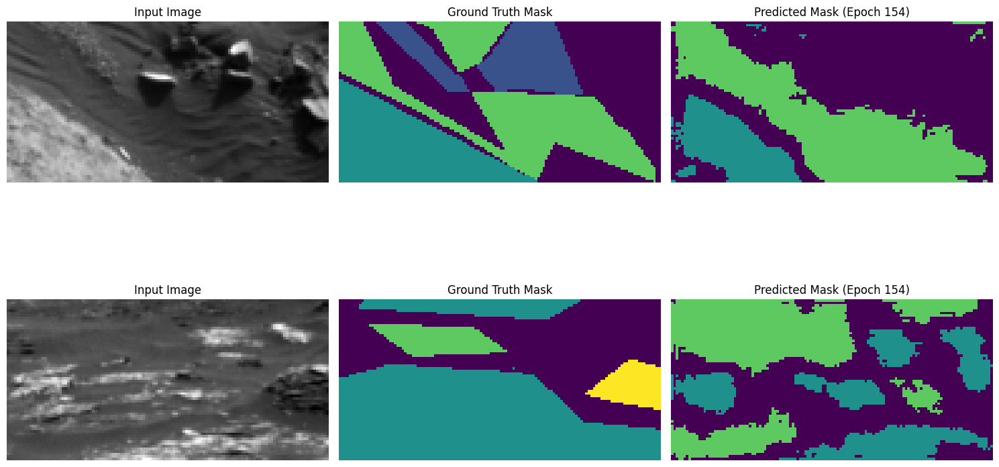

Epoch 155/250, Train Loss: 0.0593, Val Loss: 0.0599, Mean IoU: 0.3259
Class 0 IoU: 0.4474
Class 1 IoU: 0.2863
Class 2 IoU: 0.5414
Class 3 IoU: 0.0287


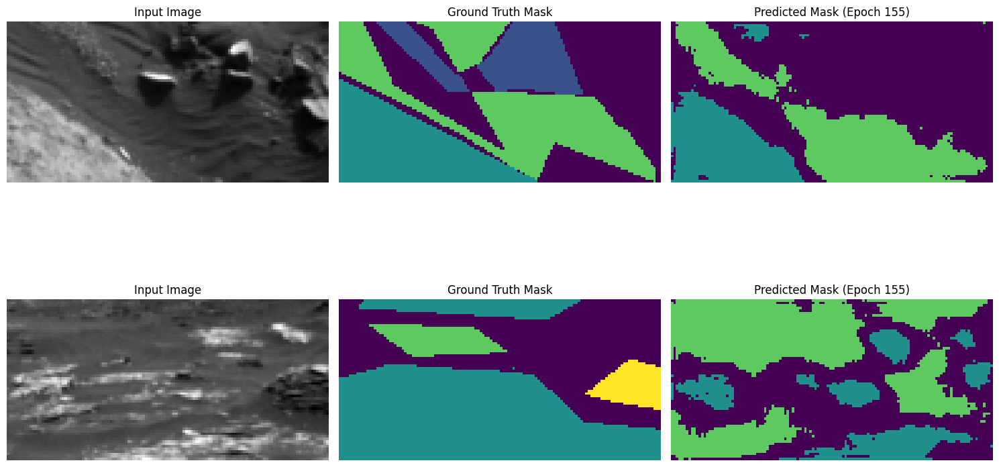

Epoch 156/250, Train Loss: 0.0573, Val Loss: 0.0572, Mean IoU: 0.3212
Class 0 IoU: 0.4272
Class 1 IoU: 0.2909
Class 2 IoU: 0.5286
Class 3 IoU: 0.0381


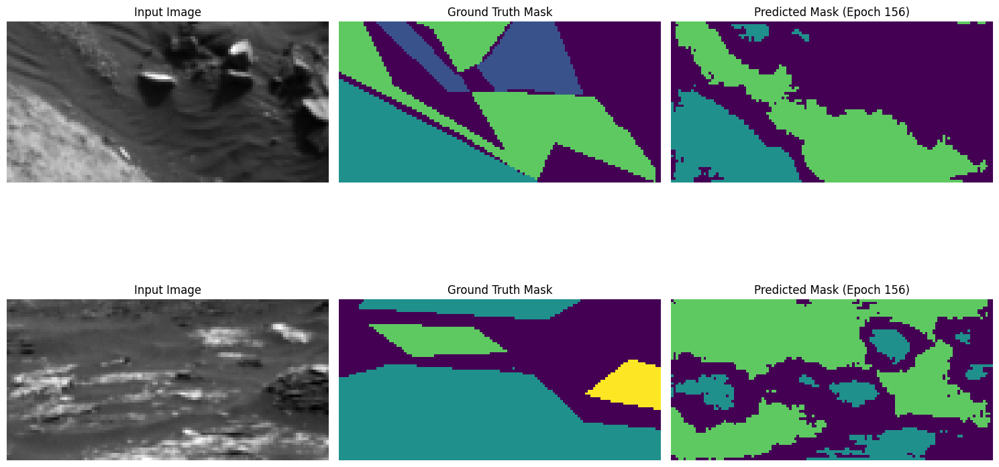

Epoch 157/250, Train Loss: 0.0585, Val Loss: 0.0583, Mean IoU: 0.3296
Class 0 IoU: 0.4461
Class 1 IoU: 0.2816
Class 2 IoU: 0.5358
Class 3 IoU: 0.0548


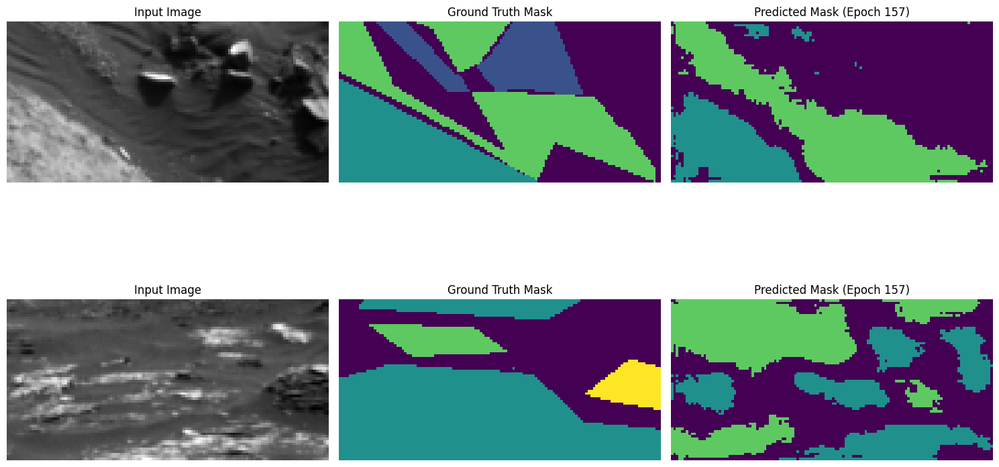

Epoch 158/250, Train Loss: 0.0575, Val Loss: 0.0600, Mean IoU: 0.3232
Class 0 IoU: 0.4387
Class 1 IoU: 0.2834
Class 2 IoU: 0.5442
Class 3 IoU: 0.0264


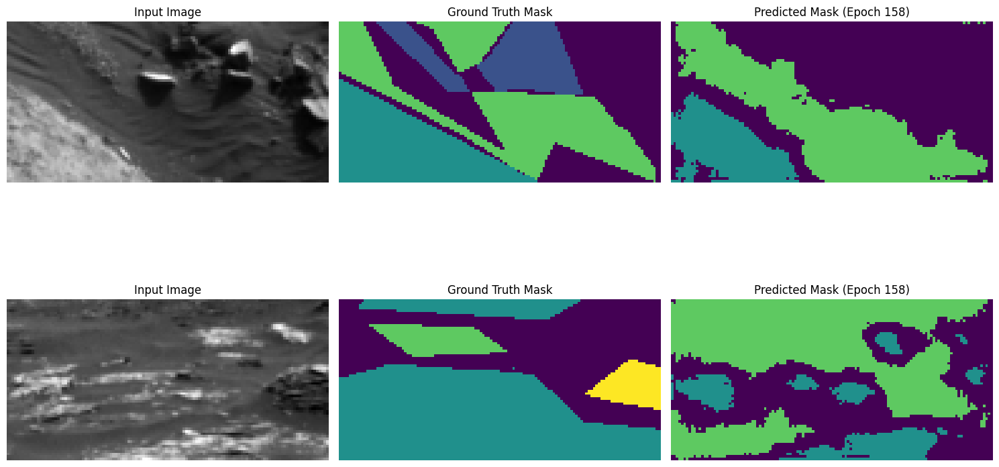

Epoch 159/250, Train Loss: 0.0609, Val Loss: 0.0630, Mean IoU: 0.3208
Class 0 IoU: 0.4411
Class 1 IoU: 0.2875
Class 2 IoU: 0.5395
Class 3 IoU: 0.0151


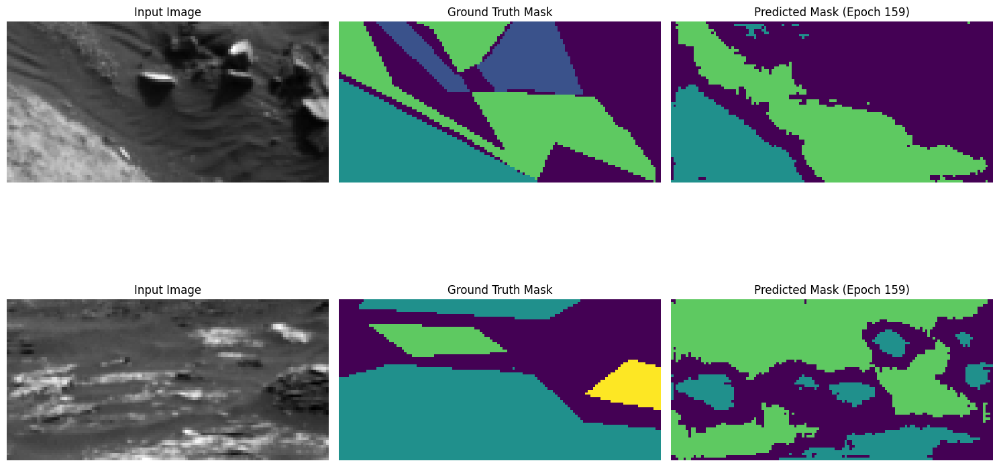

Epoch 160/250, Train Loss: 0.0605, Val Loss: 0.0611, Mean IoU: 0.3252
Class 0 IoU: 0.4605
Class 1 IoU: 0.2820
Class 2 IoU: 0.5384
Class 3 IoU: 0.0200


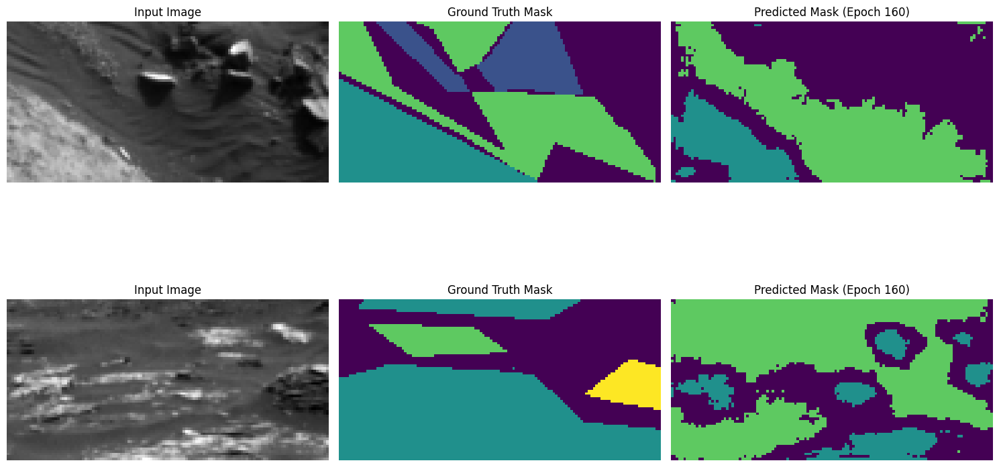

Epoch 161/250, Train Loss: 0.0607, Val Loss: 0.0588, Mean IoU: 0.3216
Class 0 IoU: 0.4246
Class 1 IoU: 0.2813
Class 2 IoU: 0.5379
Class 3 IoU: 0.0426


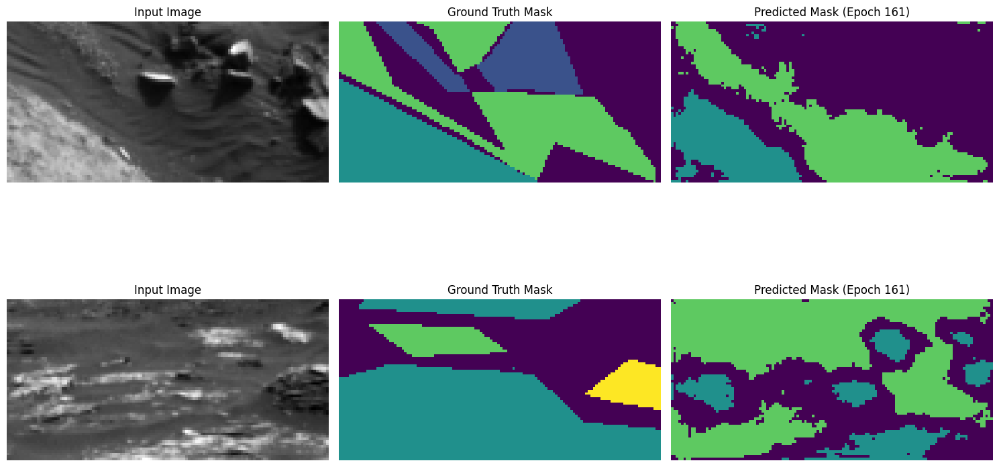

Epoch 162/250, Train Loss: 0.0557, Val Loss: 0.0619, Mean IoU: 0.3276
Class 0 IoU: 0.4535
Class 1 IoU: 0.2971
Class 2 IoU: 0.5324
Class 3 IoU: 0.0276


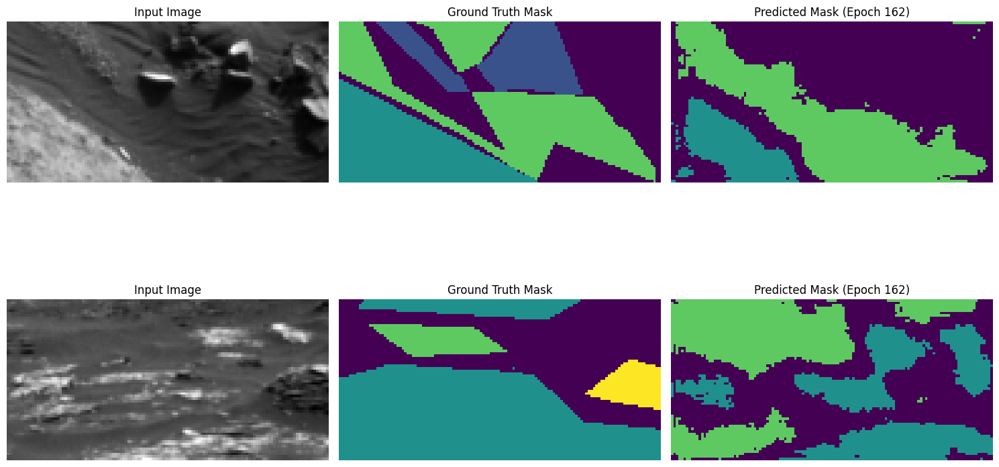

Epoch 163/250, Train Loss: 0.0550, Val Loss: 0.0590, Mean IoU: 0.3204
Class 0 IoU: 0.4491
Class 1 IoU: 0.2804
Class 2 IoU: 0.5206
Class 3 IoU: 0.0315


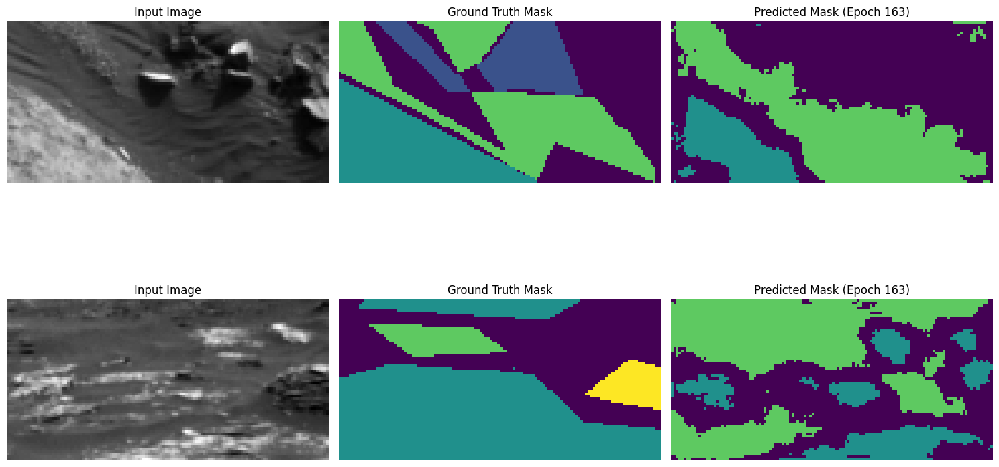

Epoch 164/250, Train Loss: 0.0571, Val Loss: 0.0598, Mean IoU: 0.3252
Class 0 IoU: 0.4590
Class 1 IoU: 0.2820
Class 2 IoU: 0.5207
Class 3 IoU: 0.0390


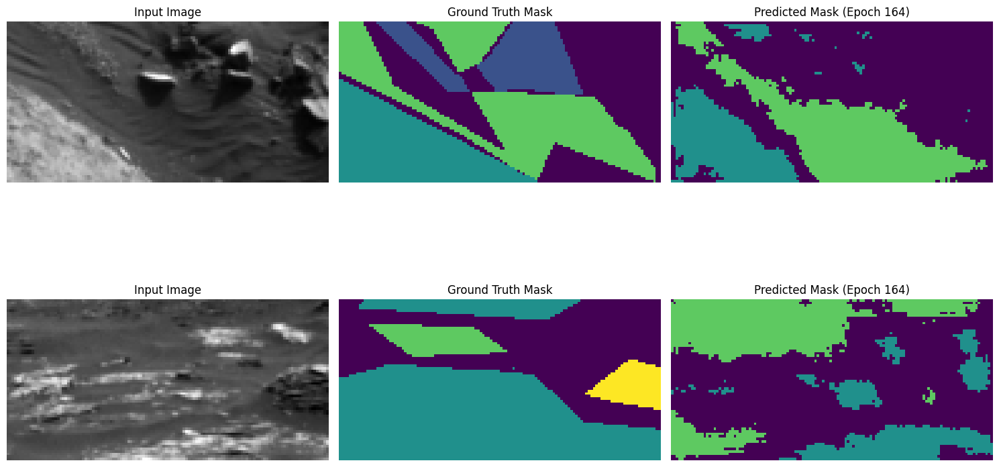

Epoch 165/250, Train Loss: 0.0598, Val Loss: 0.0658, Mean IoU: 0.3081
Class 0 IoU: 0.4212
Class 1 IoU: 0.2750
Class 2 IoU: 0.5216
Class 3 IoU: 0.0146


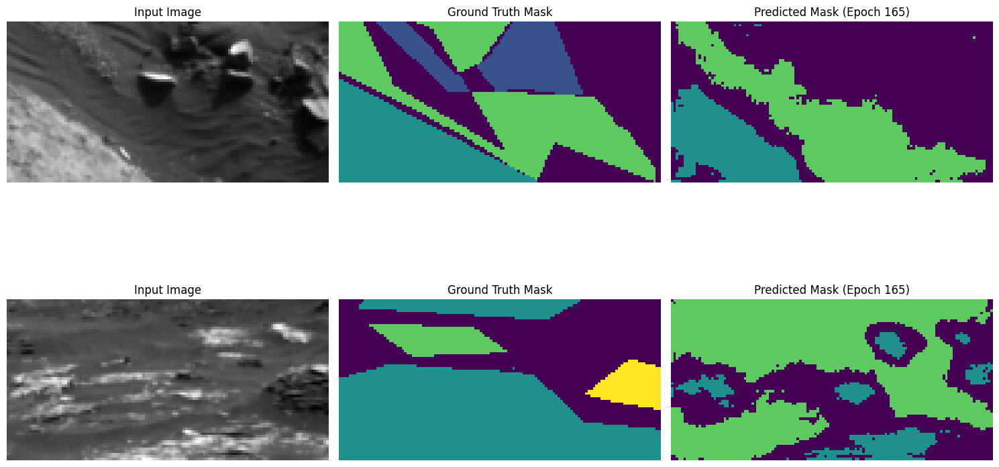

Epoch 166/250, Train Loss: 0.0589, Val Loss: 0.0622, Mean IoU: 0.3177
Class 0 IoU: 0.4424
Class 1 IoU: 0.2847
Class 2 IoU: 0.5235
Class 3 IoU: 0.0202


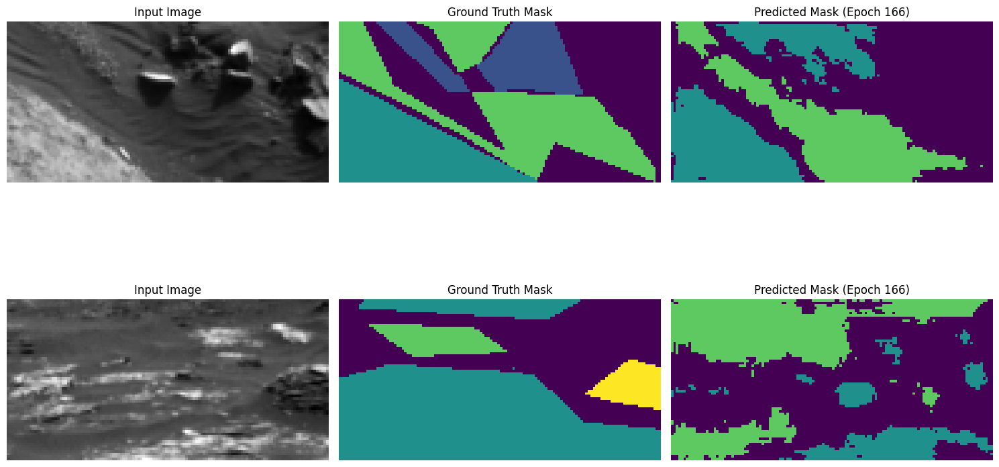

Epoch 167/250, Train Loss: 0.0554, Val Loss: 0.0616, Mean IoU: 0.3269
Class 0 IoU: 0.4583
Class 1 IoU: 0.2855
Class 2 IoU: 0.5309
Class 3 IoU: 0.0330


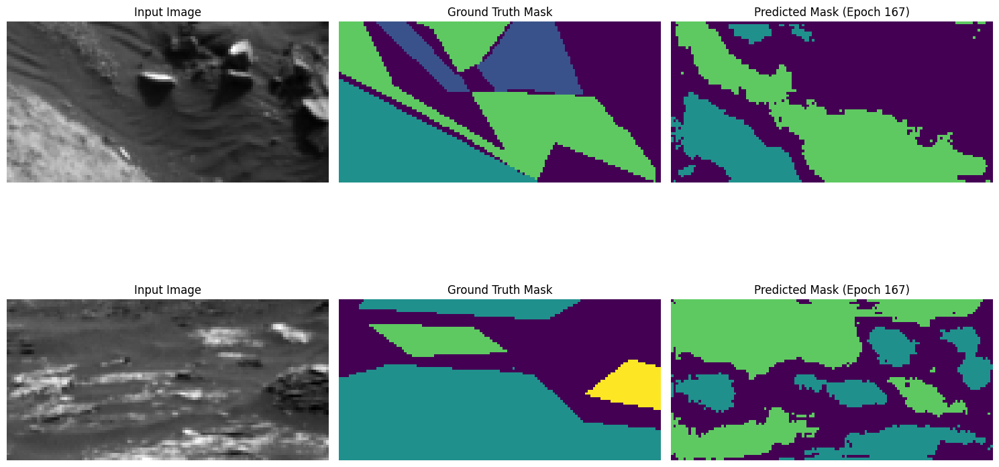

Epoch 168/250, Train Loss: 0.0567, Val Loss: 0.0597, Mean IoU: 0.3232
Class 0 IoU: 0.4490
Class 1 IoU: 0.2869
Class 2 IoU: 0.5234
Class 3 IoU: 0.0333


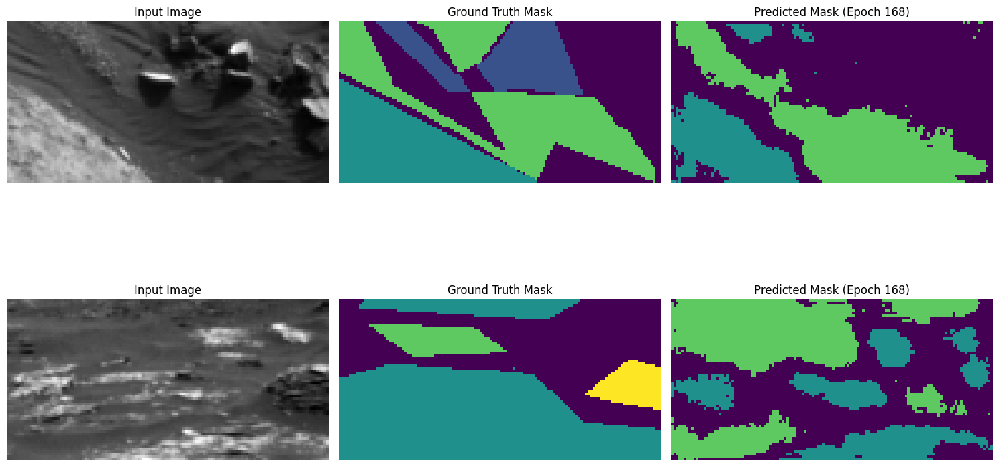

Epoch 169/250, Train Loss: 0.0574, Val Loss: 0.0609, Mean IoU: 0.3215
Class 0 IoU: 0.4396
Class 1 IoU: 0.2950
Class 2 IoU: 0.5282
Class 3 IoU: 0.0230


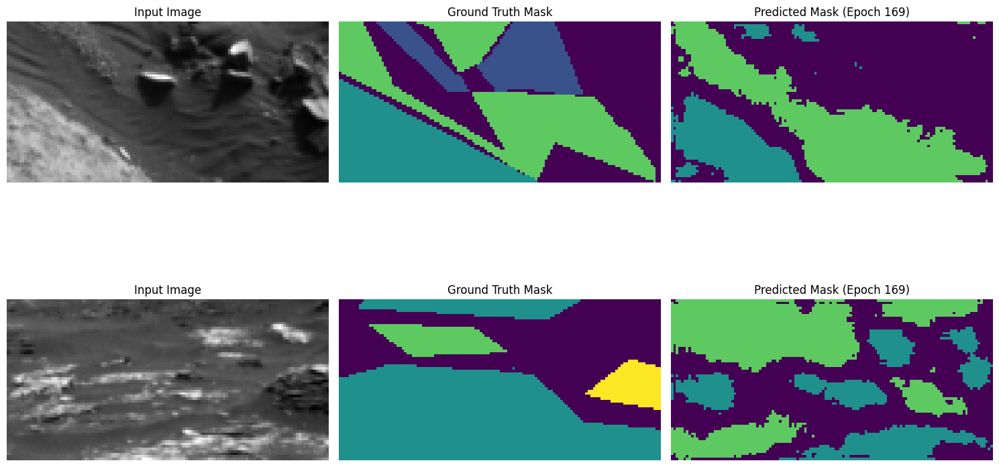

Epoch 170/250, Train Loss: 0.0593, Val Loss: 0.0593, Mean IoU: 0.3321
Class 0 IoU: 0.4591
Class 1 IoU: 0.2981
Class 2 IoU: 0.5300
Class 3 IoU: 0.0410


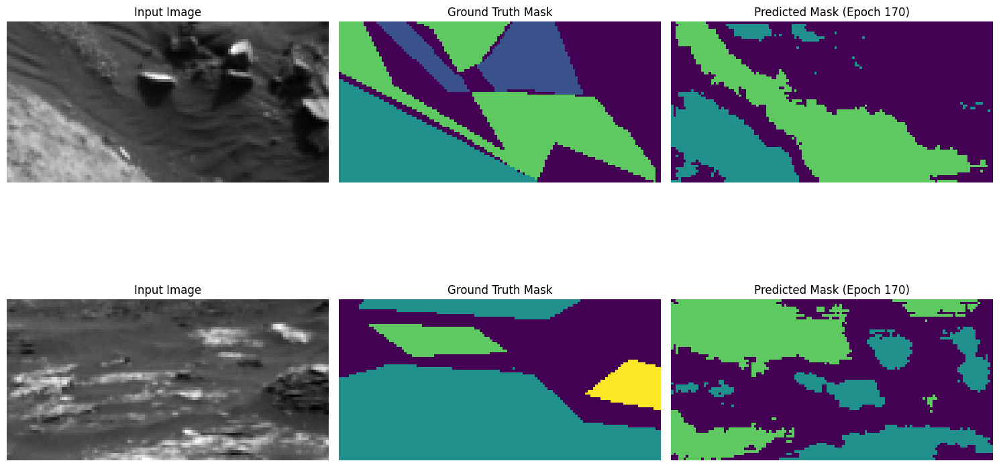

Epoch 171/250, Train Loss: 0.0605, Val Loss: 0.0624, Mean IoU: 0.3278
Class 0 IoU: 0.4677
Class 1 IoU: 0.2851
Class 2 IoU: 0.5349
Class 3 IoU: 0.0235


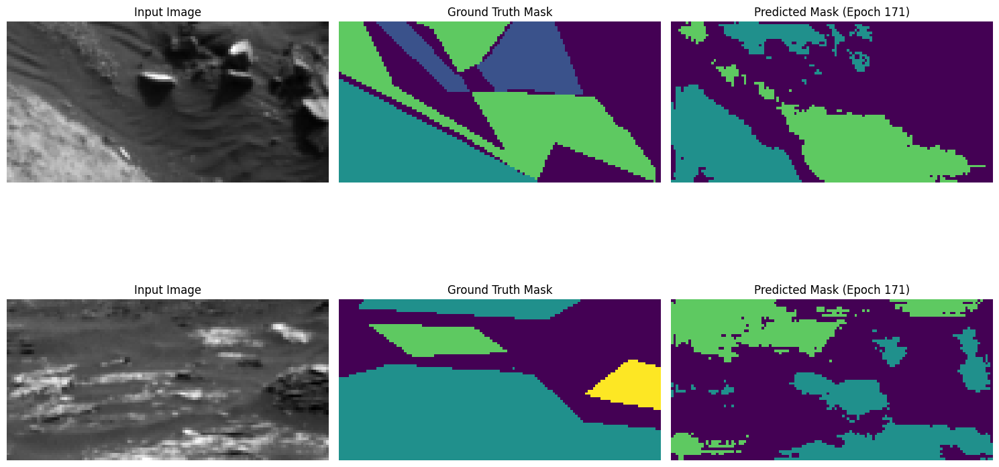

Epoch 172/250, Train Loss: 0.0574, Val Loss: 0.0612, Mean IoU: 0.3275
Class 0 IoU: 0.4588
Class 1 IoU: 0.2921
Class 2 IoU: 0.5321
Class 3 IoU: 0.0272


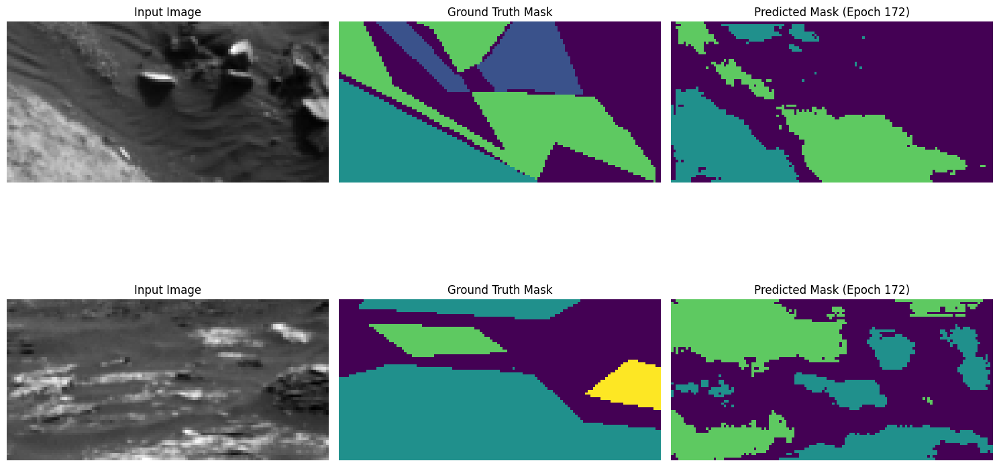

Epoch 173/250, Train Loss: 0.0593, Val Loss: 0.0585, Mean IoU: 0.3315
Class 0 IoU: 0.4652
Class 1 IoU: 0.2819
Class 2 IoU: 0.5261
Class 3 IoU: 0.0527


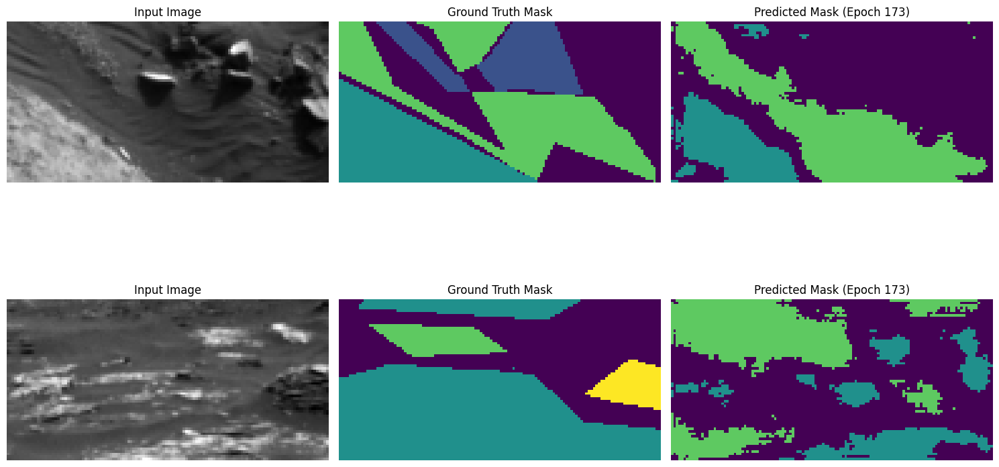

Epoch 174/250, Train Loss: 0.0622, Val Loss: 0.0596, Mean IoU: 0.3234
Class 0 IoU: 0.4237
Class 1 IoU: 0.2976
Class 2 IoU: 0.5379
Class 3 IoU: 0.0343


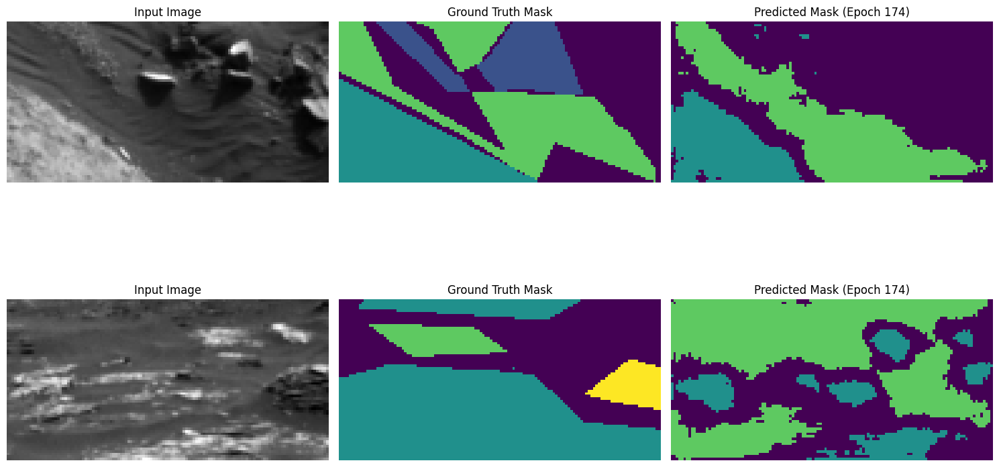

Epoch 175/250, Train Loss: 0.0549, Val Loss: 0.0585, Mean IoU: 0.3345
Class 0 IoU: 0.4548
Class 1 IoU: 0.3016
Class 2 IoU: 0.5278
Class 3 IoU: 0.0537


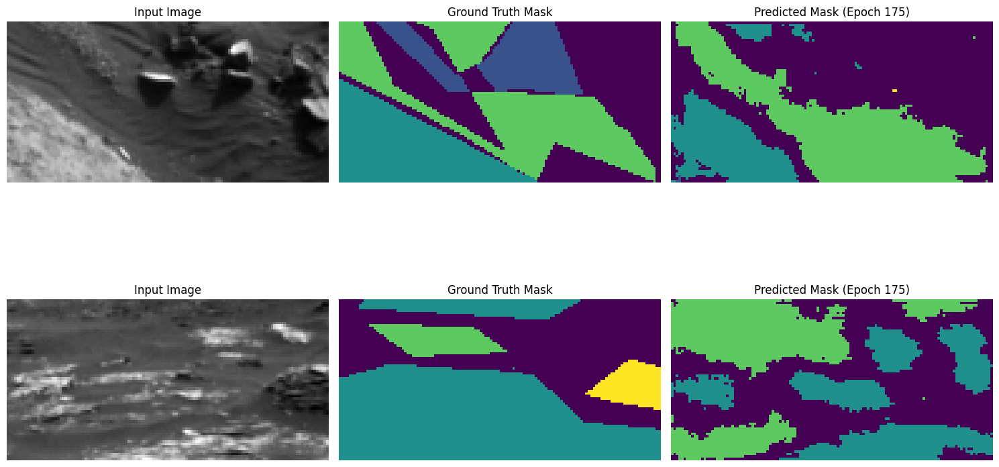

Epoch 176/250, Train Loss: 0.0558, Val Loss: 0.0632, Mean IoU: 0.3318
Class 0 IoU: 0.4537
Class 1 IoU: 0.3026
Class 2 IoU: 0.5251
Class 3 IoU: 0.0459


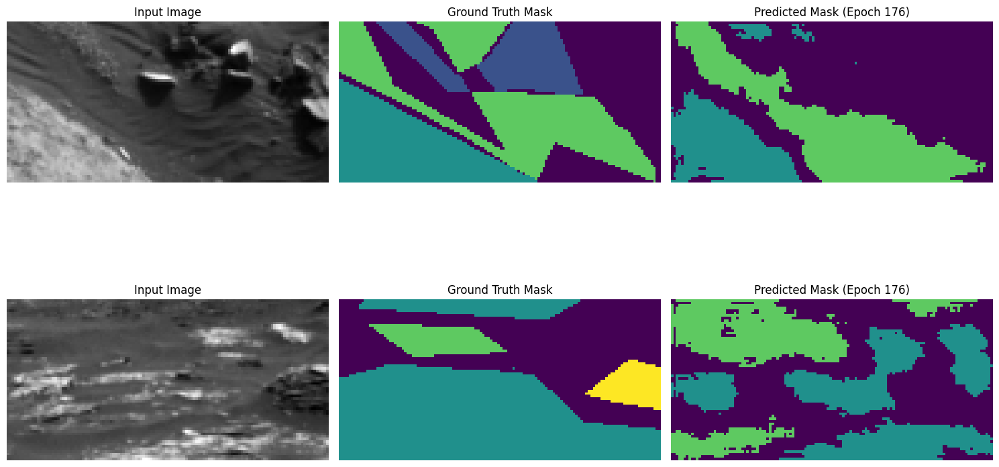

Epoch 177/250, Train Loss: 0.0602, Val Loss: 0.0574, Mean IoU: 0.3311
Class 0 IoU: 0.4465
Class 1 IoU: 0.2911
Class 2 IoU: 0.5325
Class 3 IoU: 0.0544


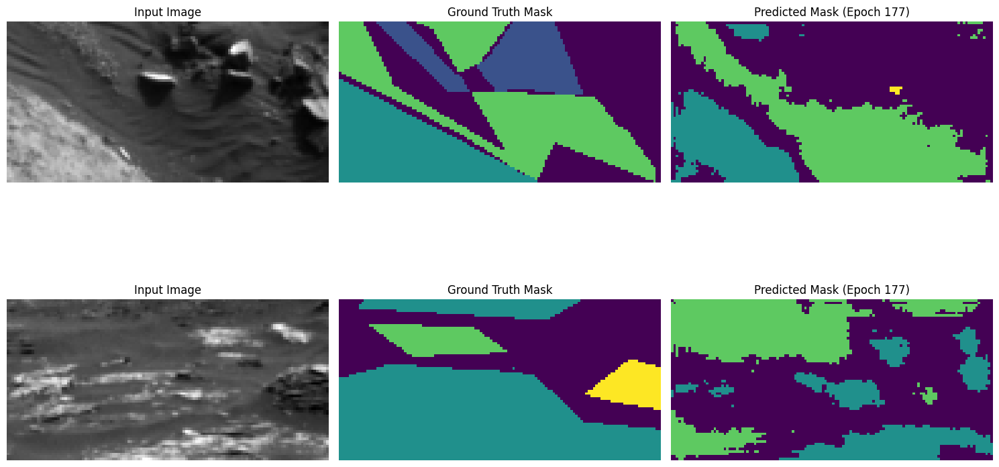

Epoch 178/250, Train Loss: 0.0608, Val Loss: 0.0629, Mean IoU: 0.3284
Class 0 IoU: 0.4574
Class 1 IoU: 0.2948
Class 2 IoU: 0.5201
Class 3 IoU: 0.0412


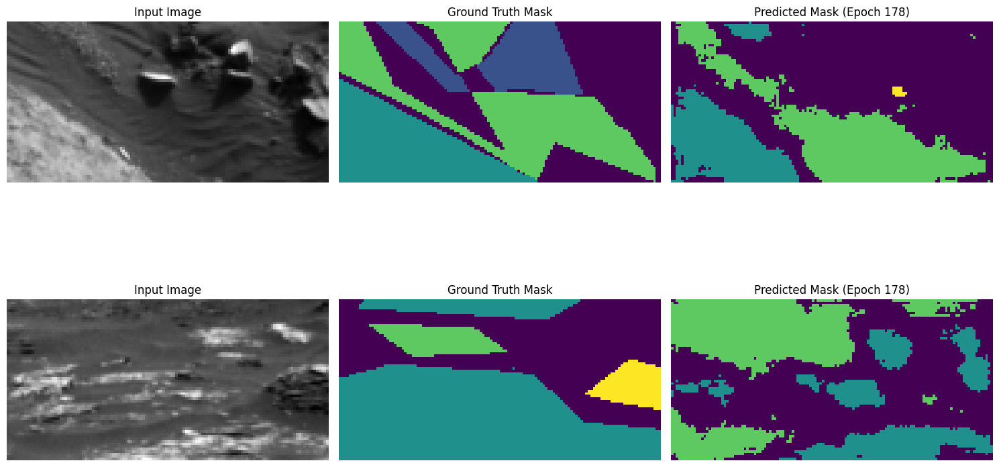

Epoch 179/250, Train Loss: 0.0571, Val Loss: 0.0607, Mean IoU: 0.3251
Class 0 IoU: 0.4439
Class 1 IoU: 0.2986
Class 2 IoU: 0.5246
Class 3 IoU: 0.0334


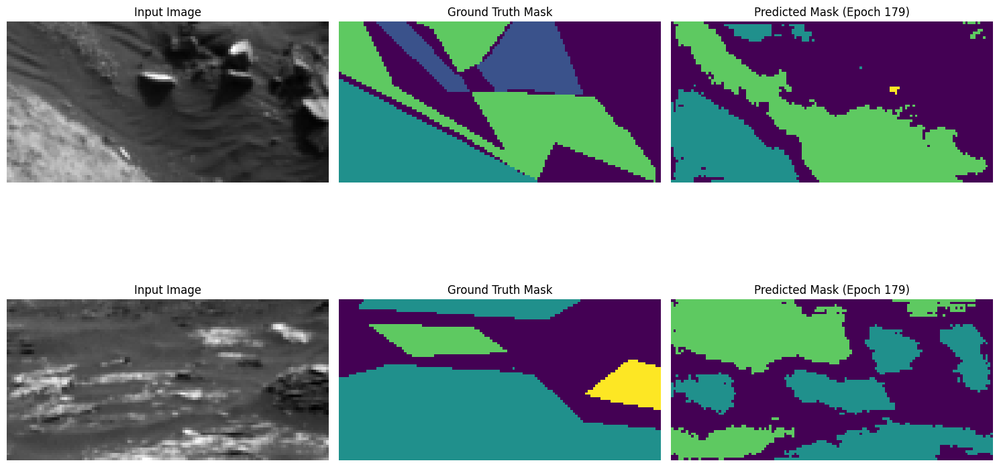

Epoch 180/250, Train Loss: 0.0598, Val Loss: 0.0614, Mean IoU: 0.3224
Class 0 IoU: 0.4333
Class 1 IoU: 0.2975
Class 2 IoU: 0.5256
Class 3 IoU: 0.0332


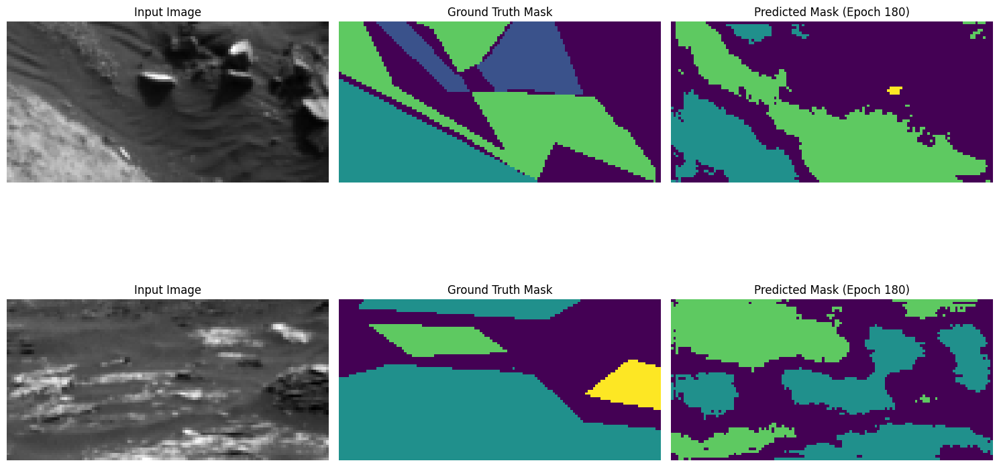

Epoch 181/250, Train Loss: 0.0557, Val Loss: 0.0609, Mean IoU: 0.3159
Class 0 IoU: 0.4181
Class 1 IoU: 0.2903
Class 2 IoU: 0.5287
Class 3 IoU: 0.0267


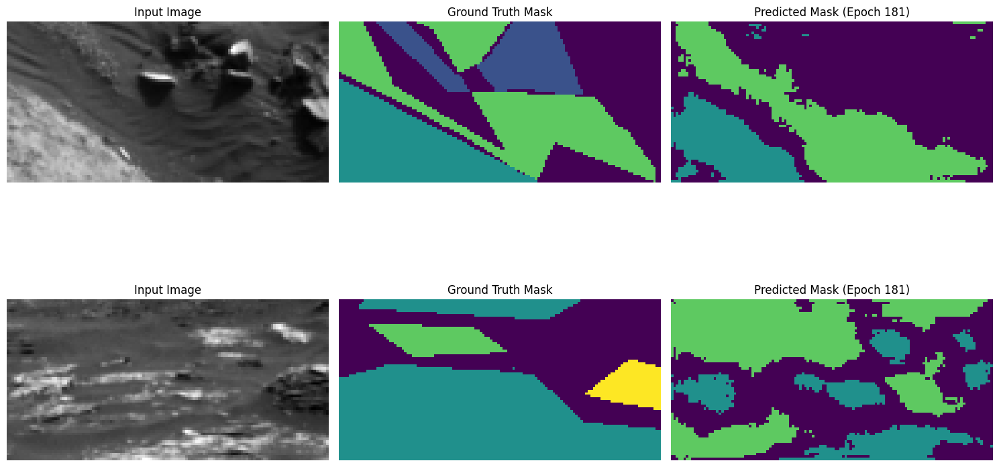

Epoch 182/250, Train Loss: 0.0572, Val Loss: 0.0637, Mean IoU: 0.3235
Class 0 IoU: 0.4488
Class 1 IoU: 0.2931
Class 2 IoU: 0.5277
Class 3 IoU: 0.0243


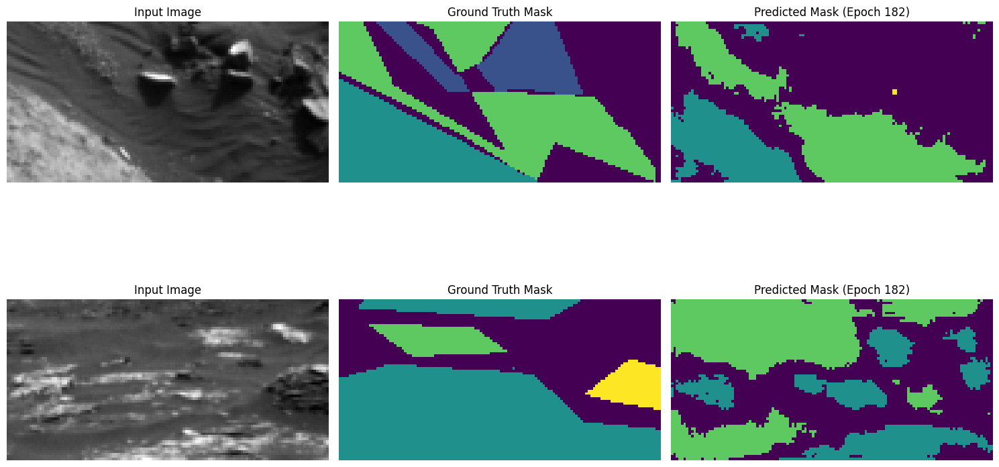

Epoch 183/250, Train Loss: 0.0606, Val Loss: 0.0612, Mean IoU: 0.3361
Class 0 IoU: 0.4796
Class 1 IoU: 0.2891
Class 2 IoU: 0.5328
Class 3 IoU: 0.0431


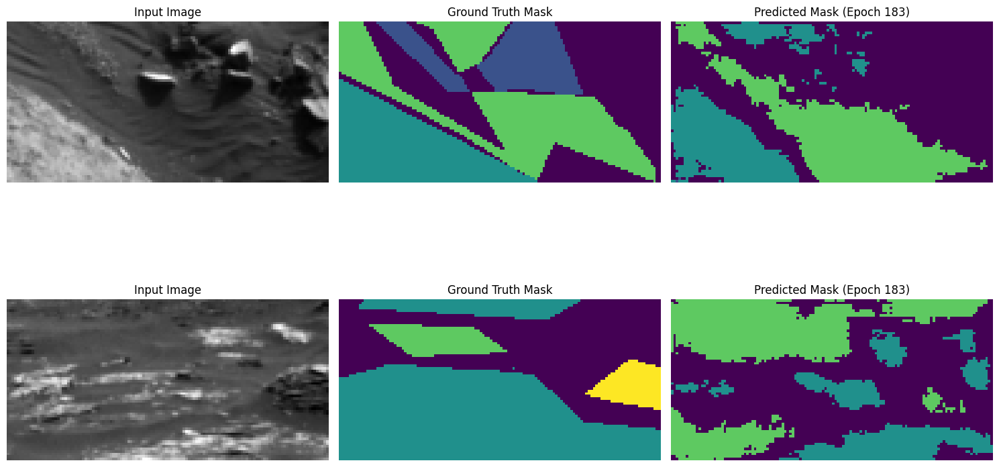

Epoch 184/250, Train Loss: 0.0564, Val Loss: 0.0576, Mean IoU: 0.3321
Class 0 IoU: 0.4440
Class 1 IoU: 0.2960
Class 2 IoU: 0.5326
Class 3 IoU: 0.0556


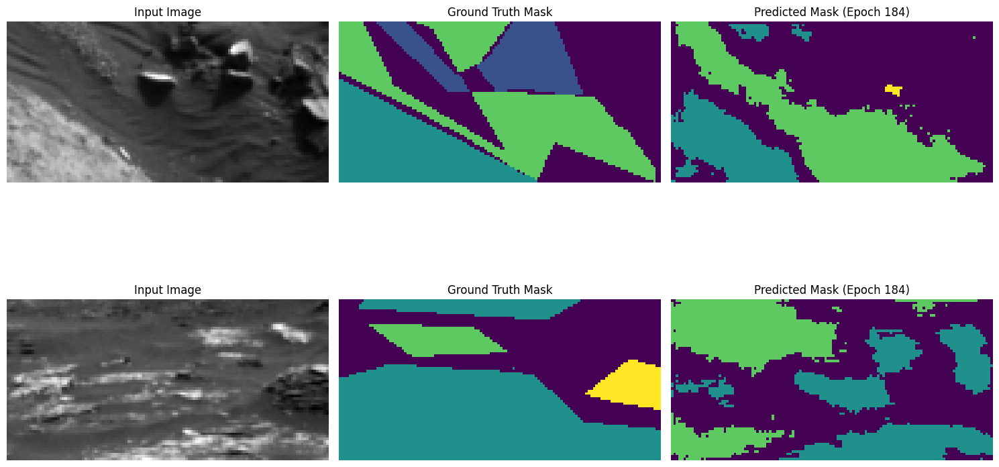

Epoch 185/250, Train Loss: 0.0571, Val Loss: 0.0624, Mean IoU: 0.3345
Class 0 IoU: 0.4756
Class 1 IoU: 0.2956
Class 2 IoU: 0.5343
Class 3 IoU: 0.0325


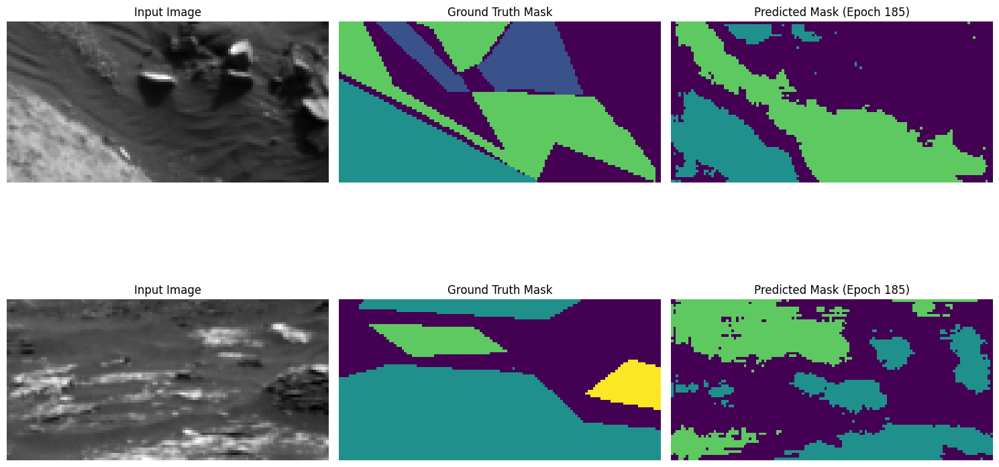

Epoch 186/250, Train Loss: 0.0600, Val Loss: 0.0581, Mean IoU: 0.3303
Class 0 IoU: 0.4410
Class 1 IoU: 0.2890
Class 2 IoU: 0.5264
Class 3 IoU: 0.0646


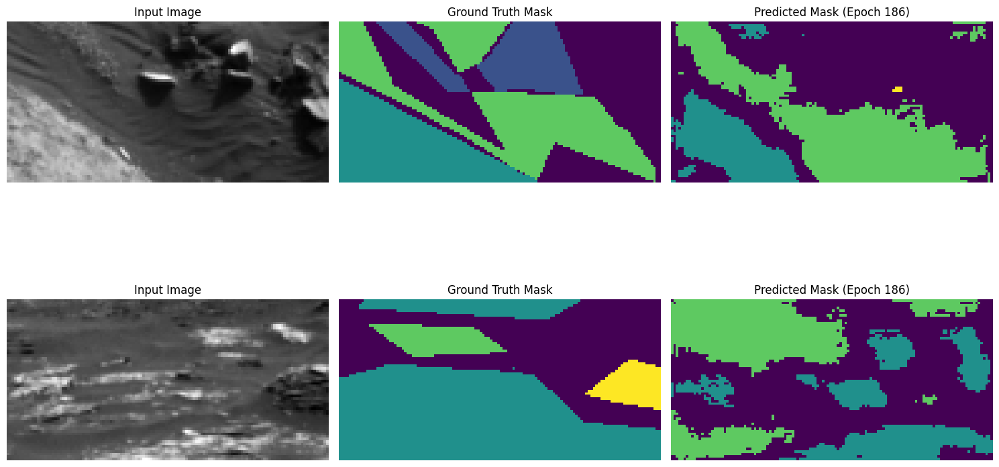

Epoch 187/250, Train Loss: 0.0564, Val Loss: 0.0594, Mean IoU: 0.3334
Class 0 IoU: 0.4519
Class 1 IoU: 0.2971
Class 2 IoU: 0.5381
Class 3 IoU: 0.0463


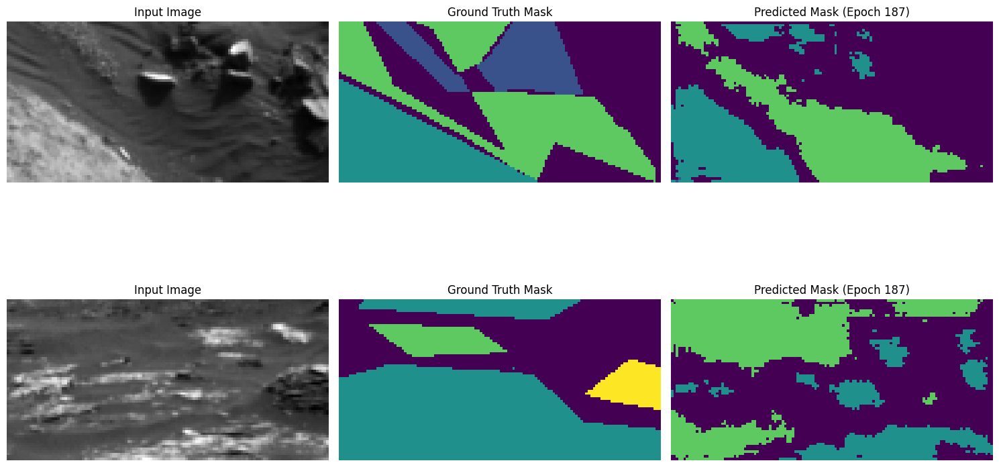

Epoch 188/250, Train Loss: 0.0574, Val Loss: 0.0606, Mean IoU: 0.3284
Class 0 IoU: 0.4493
Class 1 IoU: 0.2851
Class 2 IoU: 0.5430
Class 3 IoU: 0.0361


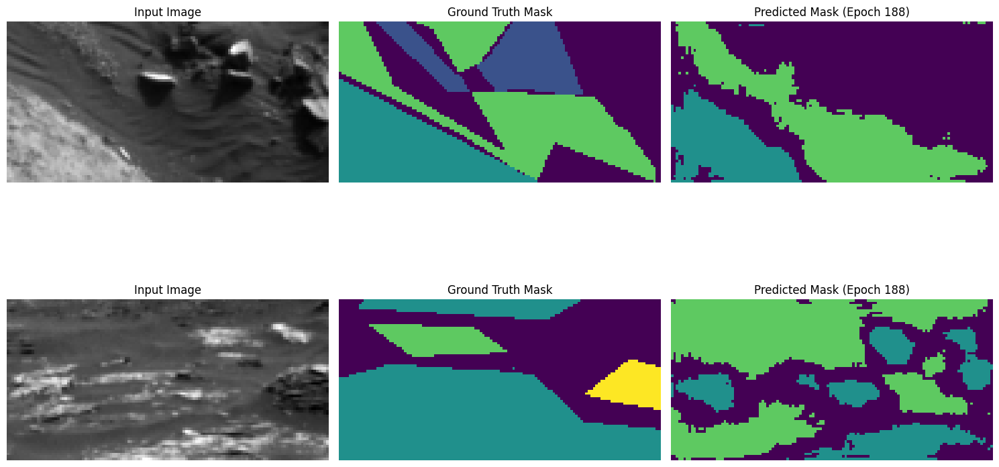

Epoch 189/250, Train Loss: 0.0585, Val Loss: 0.0606, Mean IoU: 0.3212
Class 0 IoU: 0.4281
Class 1 IoU: 0.2946
Class 2 IoU: 0.5321
Class 3 IoU: 0.0301


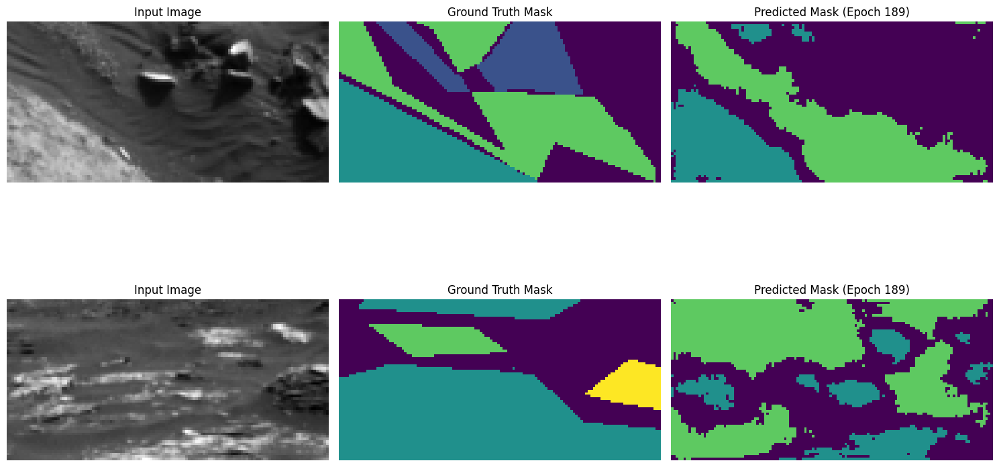

Epoch 190/250, Train Loss: 0.0599, Val Loss: 0.0648, Mean IoU: 0.3158
Class 0 IoU: 0.4305
Class 1 IoU: 0.2804
Class 2 IoU: 0.5375
Class 3 IoU: 0.0147


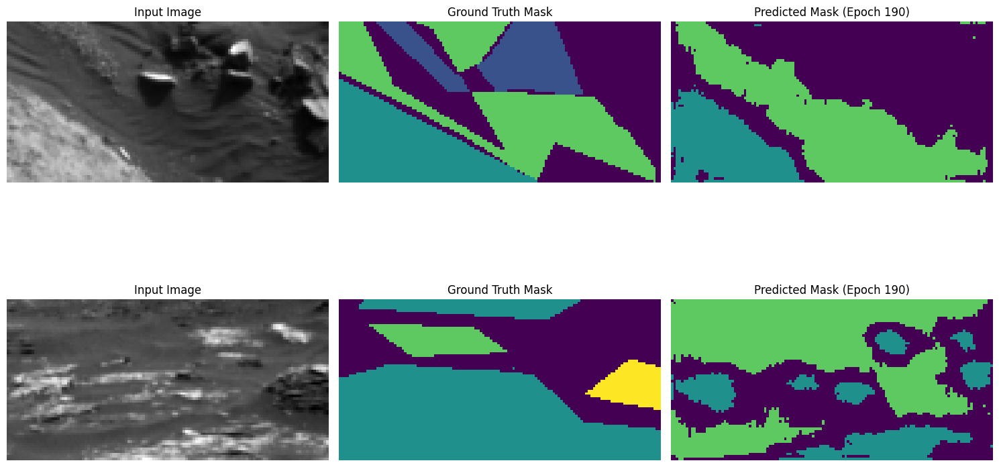

Epoch 191/250, Train Loss: 0.0555, Val Loss: 0.0615, Mean IoU: 0.3211
Class 0 IoU: 0.4349
Class 1 IoU: 0.2842
Class 2 IoU: 0.5367
Class 3 IoU: 0.0285


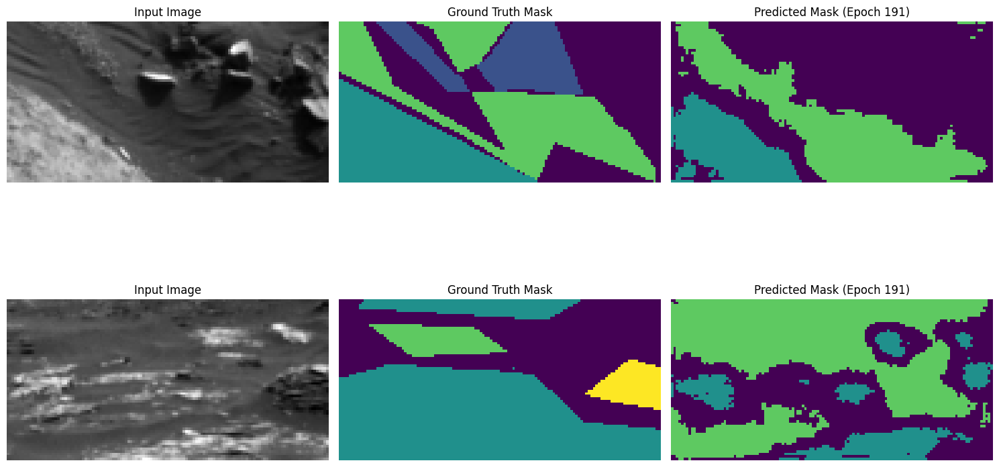

Epoch 192/250, Train Loss: 0.0538, Val Loss: 0.0604, Mean IoU: 0.3218
Class 0 IoU: 0.4324
Class 1 IoU: 0.2882
Class 2 IoU: 0.5269
Class 3 IoU: 0.0396


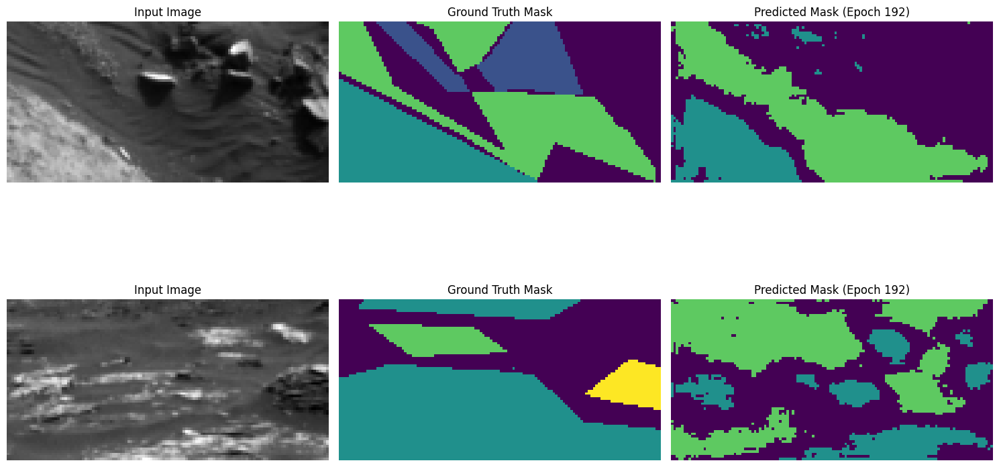

Epoch 193/250, Train Loss: 0.0577, Val Loss: 0.0656, Mean IoU: 0.3153
Class 0 IoU: 0.4419
Class 1 IoU: 0.2783
Class 2 IoU: 0.5296
Class 3 IoU: 0.0116


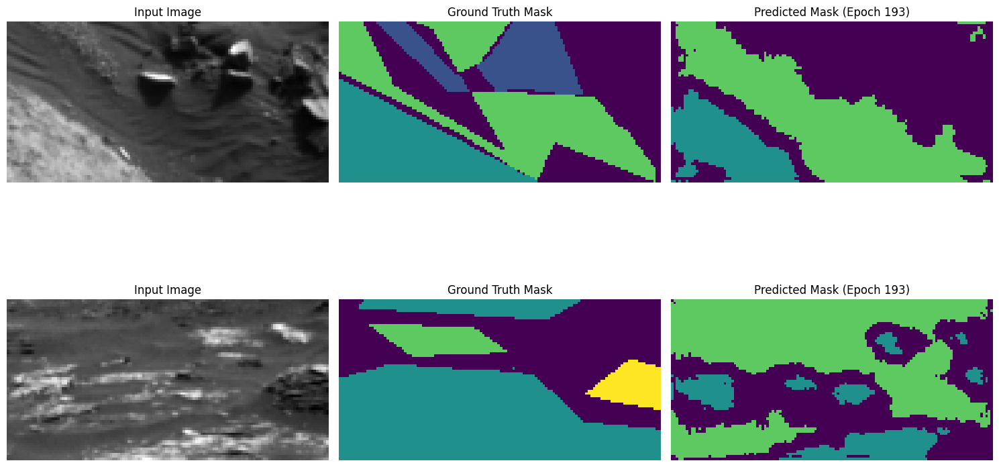

Epoch 194/250, Train Loss: 0.0599, Val Loss: 0.0624, Mean IoU: 0.3237
Class 0 IoU: 0.4489
Class 1 IoU: 0.2938
Class 2 IoU: 0.5293
Class 3 IoU: 0.0228


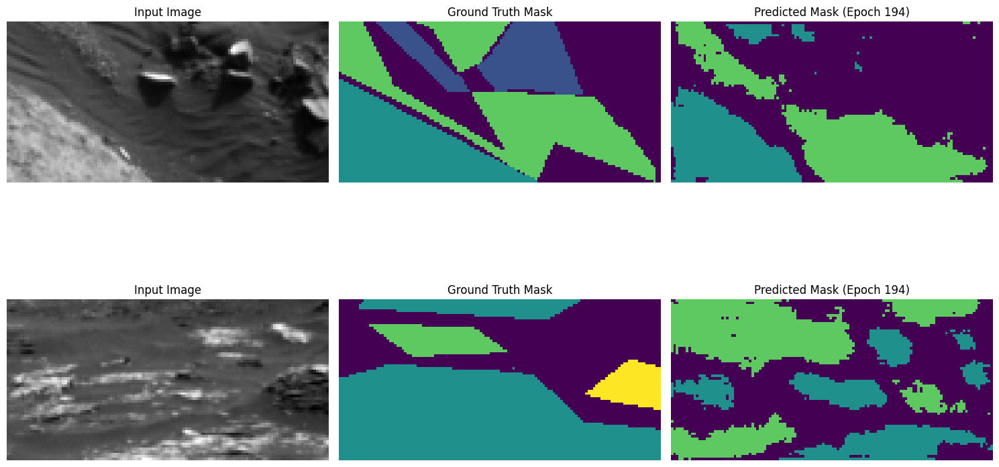

Epoch 195/250, Train Loss: 0.0563, Val Loss: 0.0596, Mean IoU: 0.3296
Class 0 IoU: 0.4505
Class 1 IoU: 0.2950
Class 2 IoU: 0.5335
Class 3 IoU: 0.0392


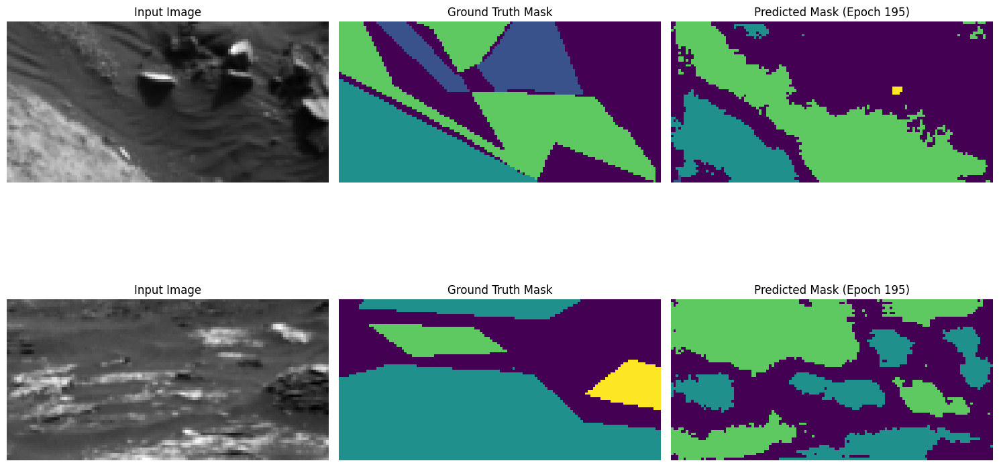

Epoch 196/250, Train Loss: 0.0556, Val Loss: 0.0597, Mean IoU: 0.3313
Class 0 IoU: 0.4503
Class 1 IoU: 0.2867
Class 2 IoU: 0.5313
Class 3 IoU: 0.0567


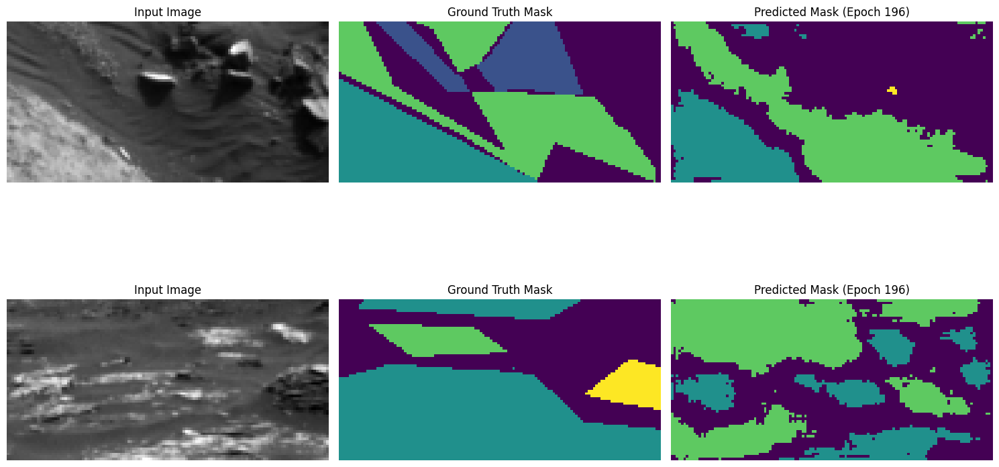

Epoch 197/250, Train Loss: 0.0567, Val Loss: 0.0562, Mean IoU: 0.3262
Class 0 IoU: 0.4261
Class 1 IoU: 0.2938
Class 2 IoU: 0.5236
Class 3 IoU: 0.0615


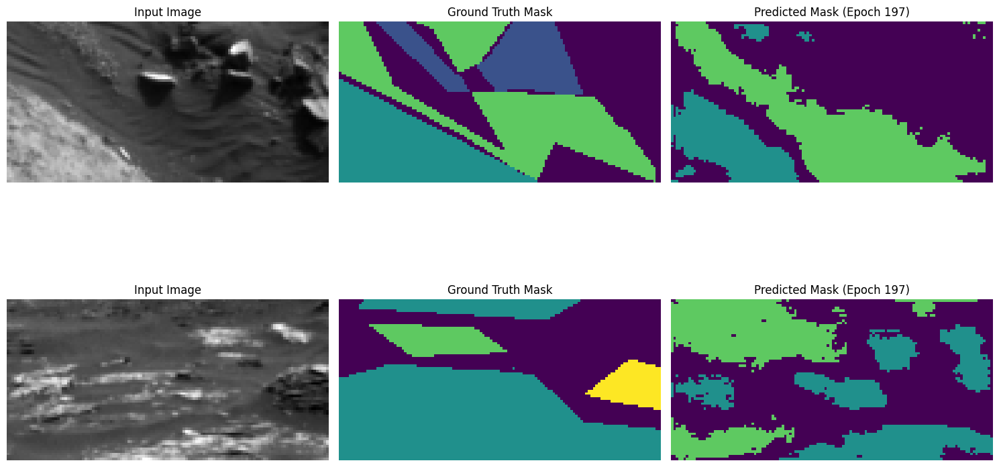

Epoch 198/250, Train Loss: 0.0549, Val Loss: 0.0581, Mean IoU: 0.3338
Class 0 IoU: 0.4662
Class 1 IoU: 0.2969
Class 2 IoU: 0.5349
Class 3 IoU: 0.0375


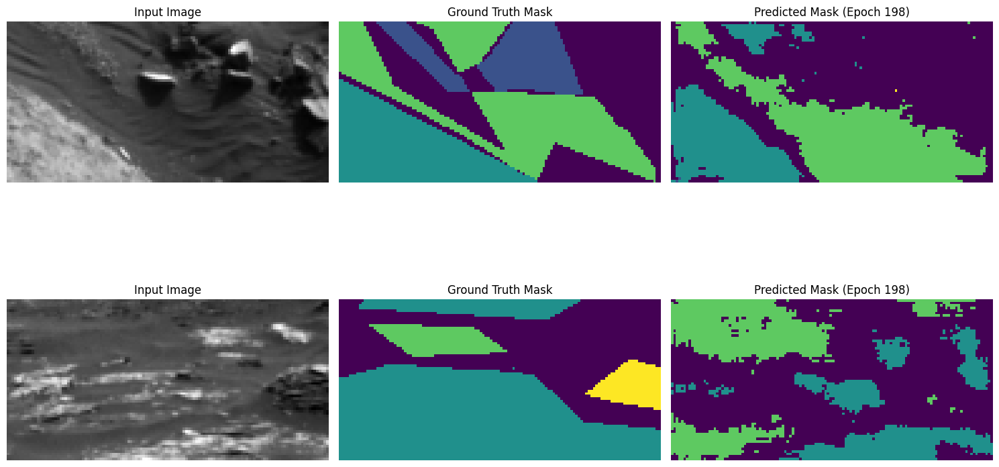

Epoch 199/250, Train Loss: 0.0560, Val Loss: 0.0602, Mean IoU: 0.3277
Class 0 IoU: 0.4456
Class 1 IoU: 0.2916
Class 2 IoU: 0.5308
Class 3 IoU: 0.0426


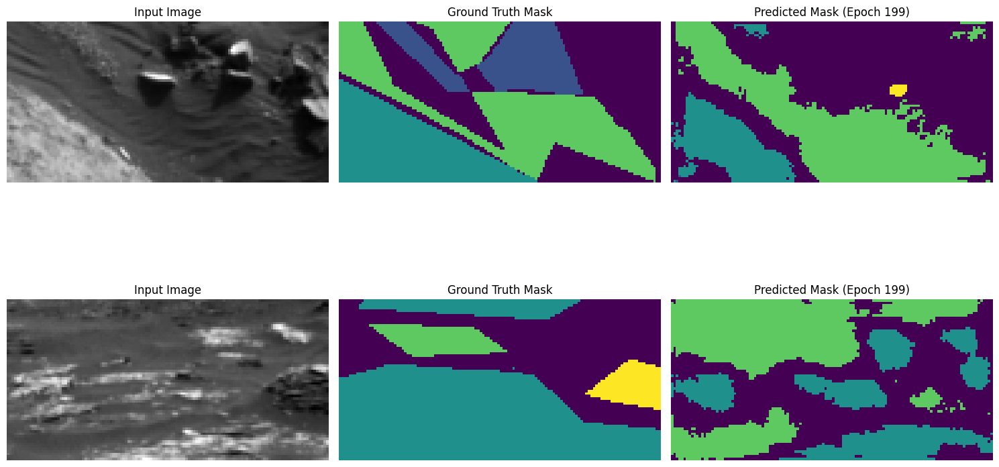

Epoch 200/250, Train Loss: 0.0563, Val Loss: 0.0598, Mean IoU: 0.3274
Class 0 IoU: 0.4543
Class 1 IoU: 0.2867
Class 2 IoU: 0.5335
Class 3 IoU: 0.0352


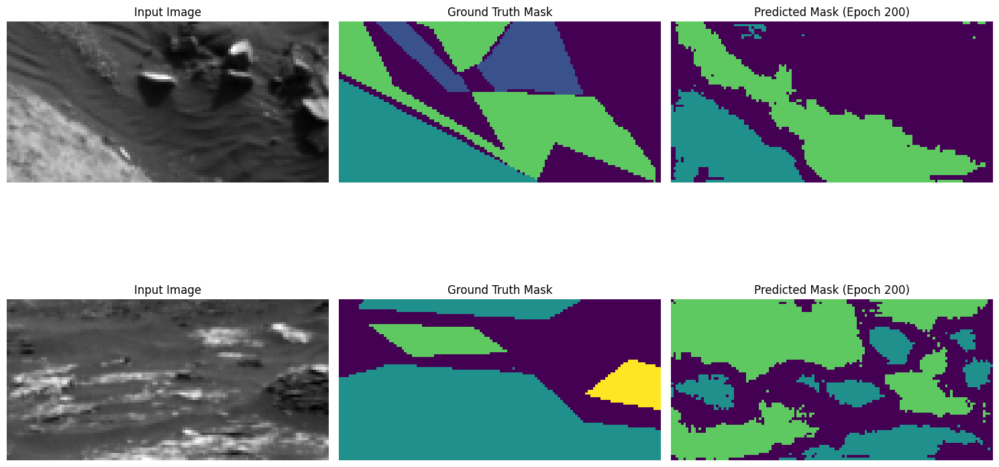

Epoch 201/250, Train Loss: 0.0540, Val Loss: 0.0616, Mean IoU: 0.3213
Class 0 IoU: 0.4285
Class 1 IoU: 0.2928
Class 2 IoU: 0.5310
Class 3 IoU: 0.0328


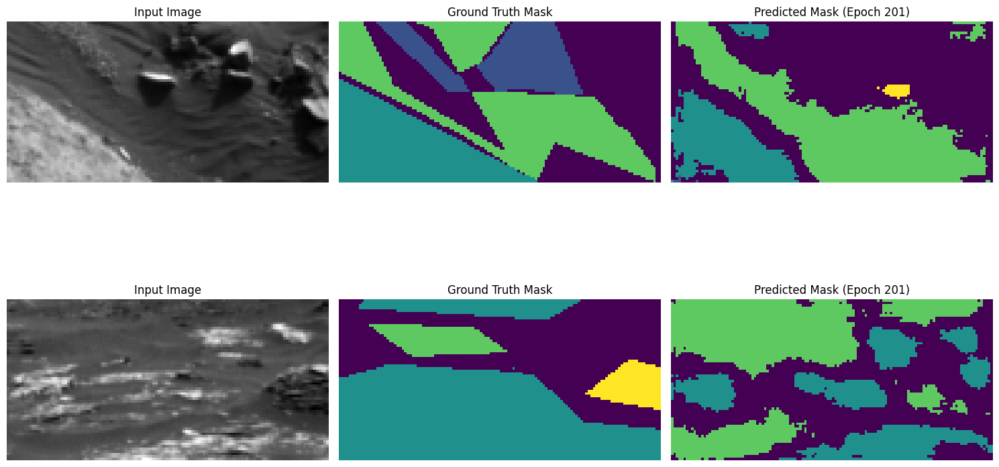

Epoch 202/250, Train Loss: 0.0551, Val Loss: 0.0619, Mean IoU: 0.3231
Class 0 IoU: 0.4257
Class 1 IoU: 0.2940
Class 2 IoU: 0.5416
Class 3 IoU: 0.0312


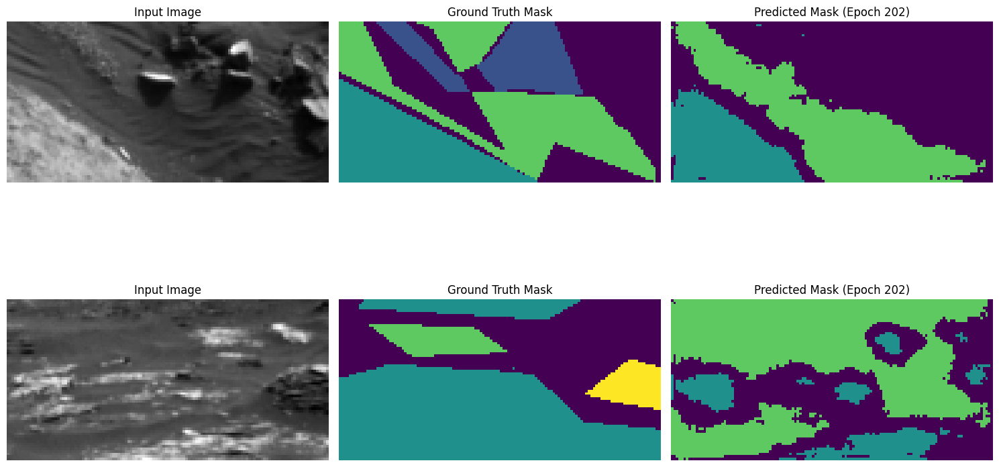

Epoch 203/250, Train Loss: 0.0562, Val Loss: 0.0649, Mean IoU: 0.3210
Class 0 IoU: 0.4499
Class 1 IoU: 0.2866
Class 2 IoU: 0.5311
Class 3 IoU: 0.0165


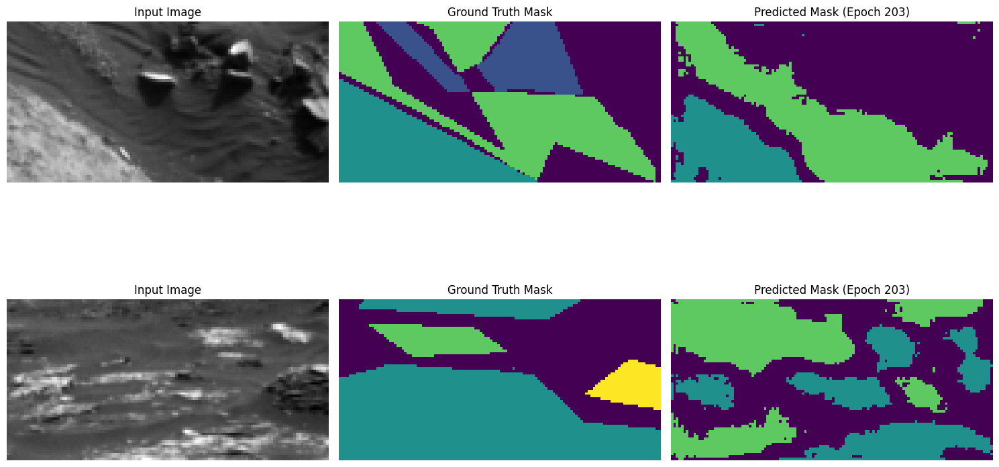

Epoch 204/250, Train Loss: 0.0602, Val Loss: 0.0598, Mean IoU: 0.3284
Class 0 IoU: 0.4558
Class 1 IoU: 0.2910
Class 2 IoU: 0.5294
Class 3 IoU: 0.0373


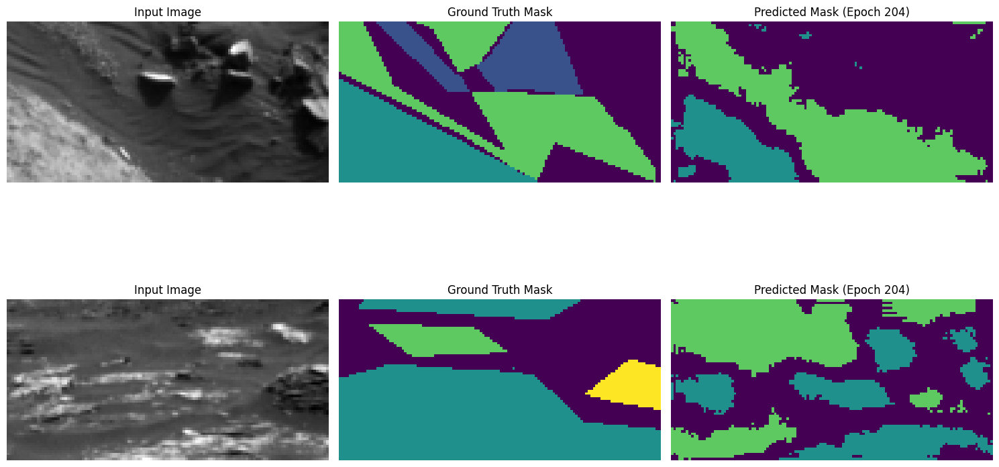

Epoch 205/250, Train Loss: 0.0568, Val Loss: 0.0579, Mean IoU: 0.3271
Class 0 IoU: 0.4320
Class 1 IoU: 0.2994
Class 2 IoU: 0.5372
Class 3 IoU: 0.0397


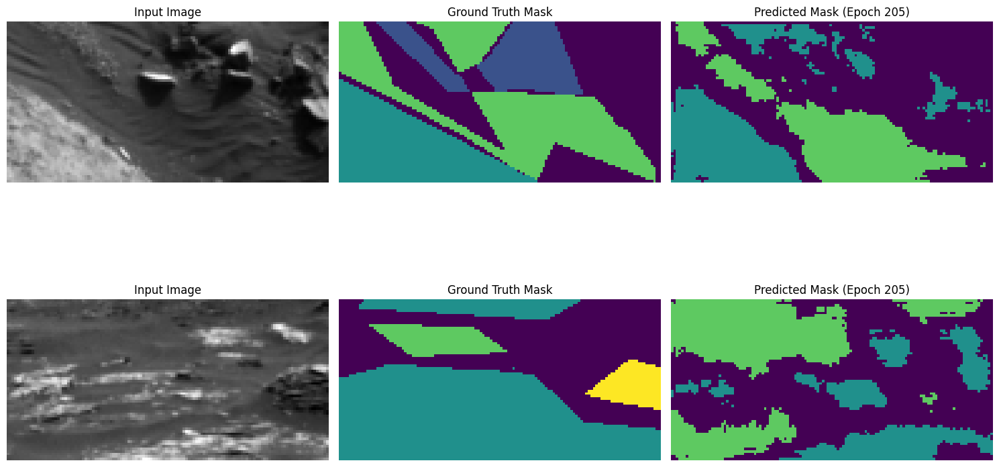

Epoch 206/250, Train Loss: 0.0599, Val Loss: 0.0637, Mean IoU: 0.3320
Class 0 IoU: 0.4725
Class 1 IoU: 0.2856
Class 2 IoU: 0.5452
Class 3 IoU: 0.0246


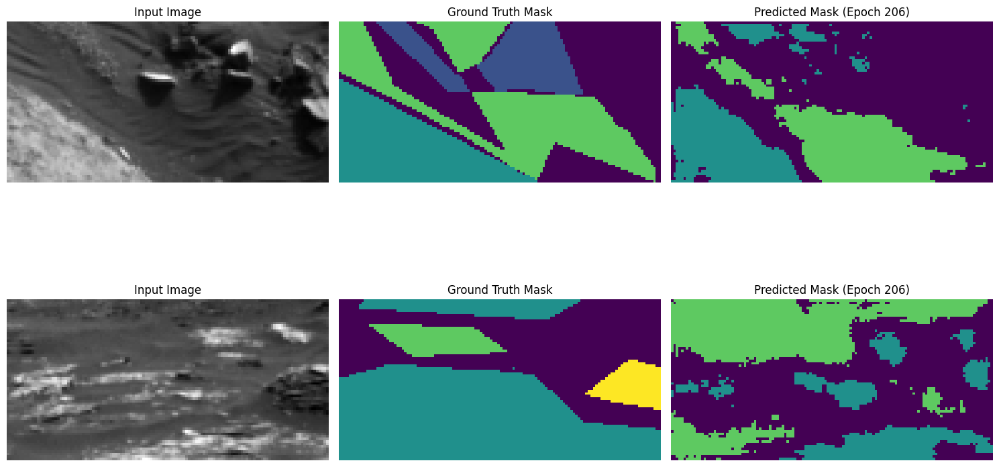

Epoch 207/250, Train Loss: 0.0559, Val Loss: 0.0622, Mean IoU: 0.3226
Class 0 IoU: 0.4494
Class 1 IoU: 0.2830
Class 2 IoU: 0.5285
Class 3 IoU: 0.0294


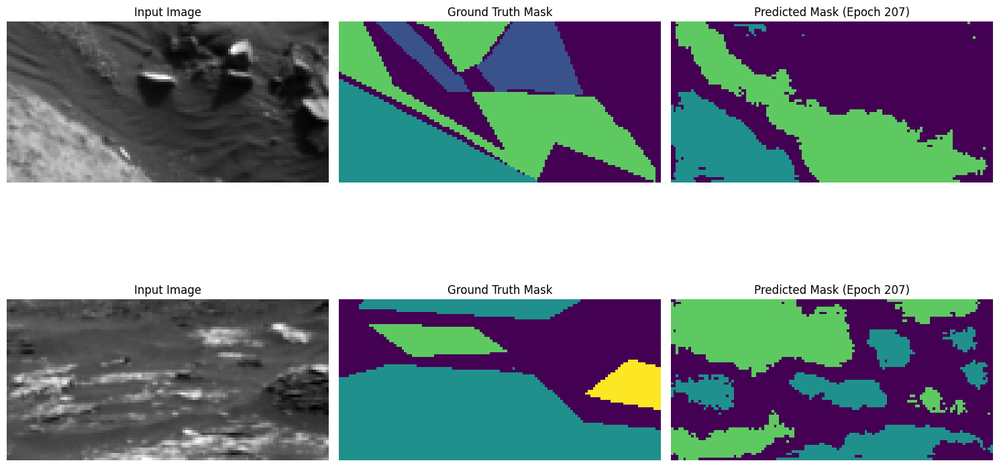

Epoch 208/250, Train Loss: 0.0616, Val Loss: 0.0604, Mean IoU: 0.3259
Class 0 IoU: 0.4374
Class 1 IoU: 0.2963
Class 2 IoU: 0.5332
Class 3 IoU: 0.0366


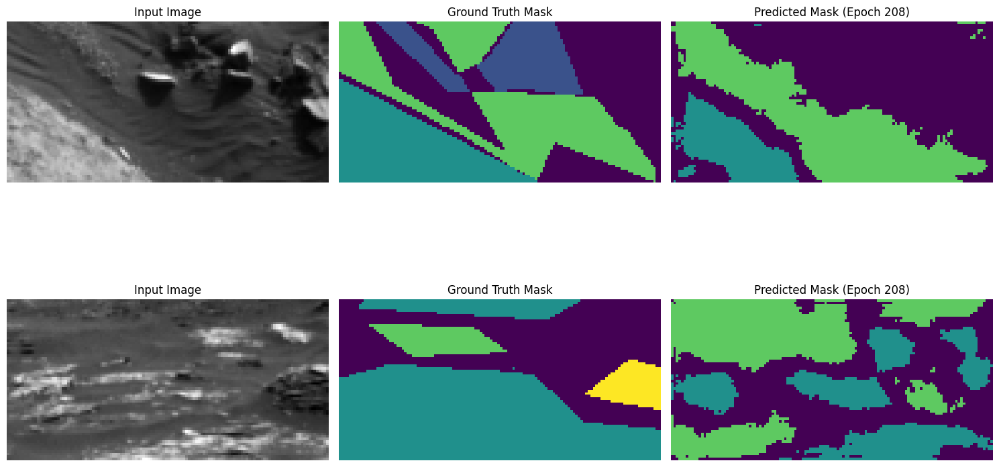

Epoch 209/250, Train Loss: 0.0574, Val Loss: 0.0644, Mean IoU: 0.3187
Class 0 IoU: 0.4426
Class 1 IoU: 0.2834
Class 2 IoU: 0.5308
Class 3 IoU: 0.0180


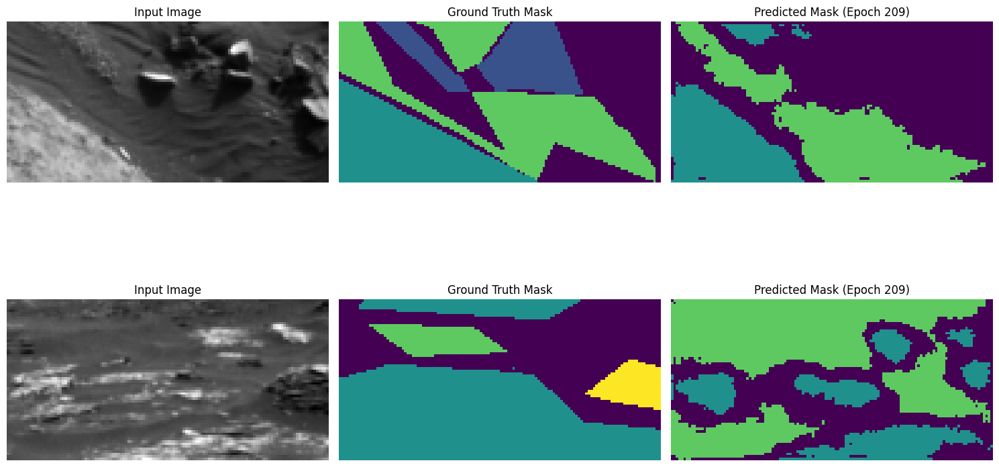

Epoch 210/250, Train Loss: 0.0560, Val Loss: 0.0619, Mean IoU: 0.3165
Class 0 IoU: 0.4114
Class 1 IoU: 0.2965
Class 2 IoU: 0.5259
Class 3 IoU: 0.0320


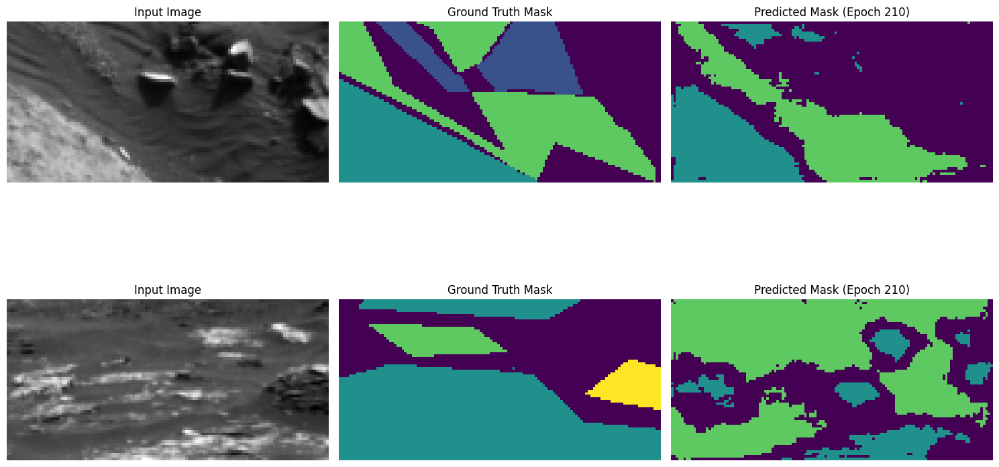

Epoch 211/250, Train Loss: 0.0555, Val Loss: 0.0619, Mean IoU: 0.3252
Class 0 IoU: 0.4493
Class 1 IoU: 0.2812
Class 2 IoU: 0.5429
Class 3 IoU: 0.0274


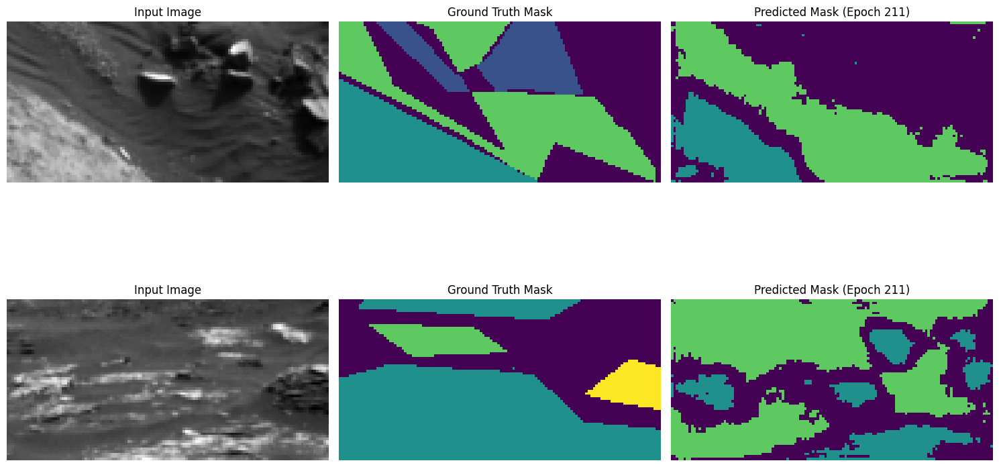

Epoch 212/250, Train Loss: 0.0561, Val Loss: 0.0613, Mean IoU: 0.3264
Class 0 IoU: 0.4454
Class 1 IoU: 0.2881
Class 2 IoU: 0.5414
Class 3 IoU: 0.0306


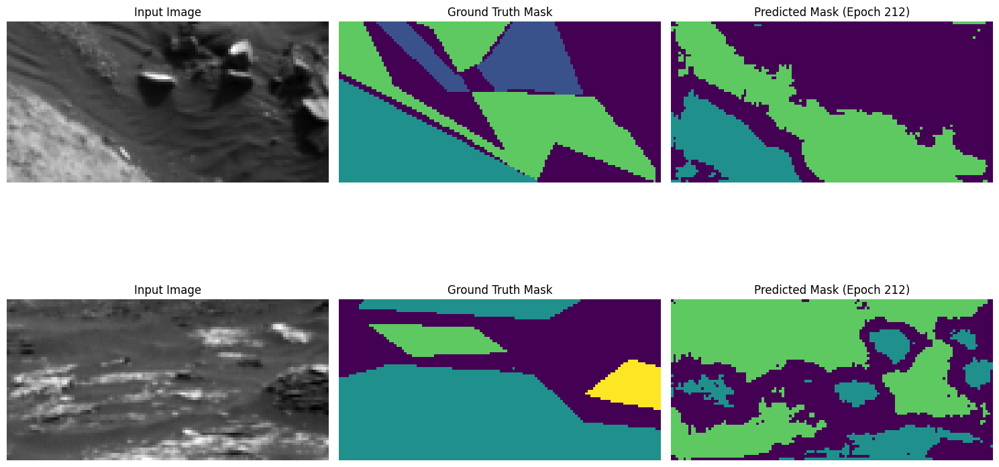

Epoch 213/250, Train Loss: 0.0588, Val Loss: 0.0601, Mean IoU: 0.3297
Class 0 IoU: 0.4493
Class 1 IoU: 0.2951
Class 2 IoU: 0.5295
Class 3 IoU: 0.0447


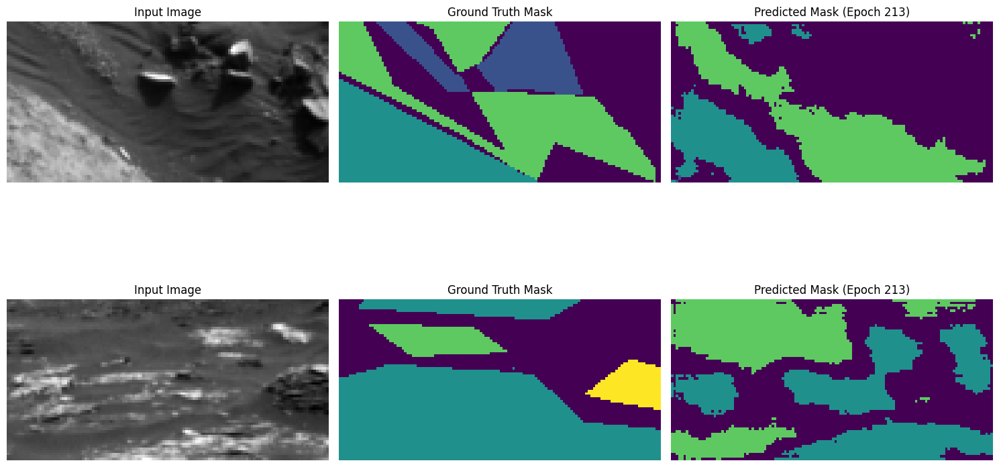

Epoch 214/250, Train Loss: 0.0585, Val Loss: 0.0585, Mean IoU: 0.3305
Class 0 IoU: 0.4368
Class 1 IoU: 0.2940
Class 2 IoU: 0.5350
Class 3 IoU: 0.0565


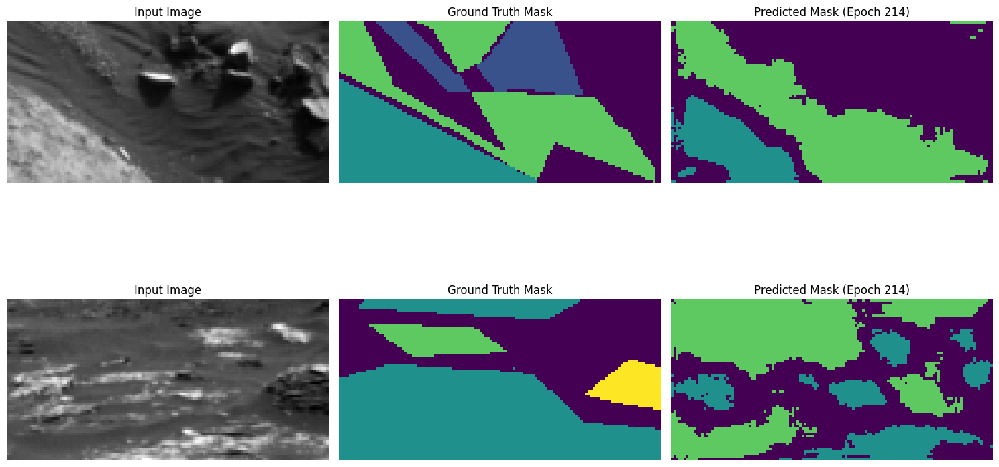

Epoch 215/250, Train Loss: 0.0579, Val Loss: 0.0626, Mean IoU: 0.3293
Class 0 IoU: 0.4574
Class 1 IoU: 0.2857
Class 2 IoU: 0.5458
Class 3 IoU: 0.0283


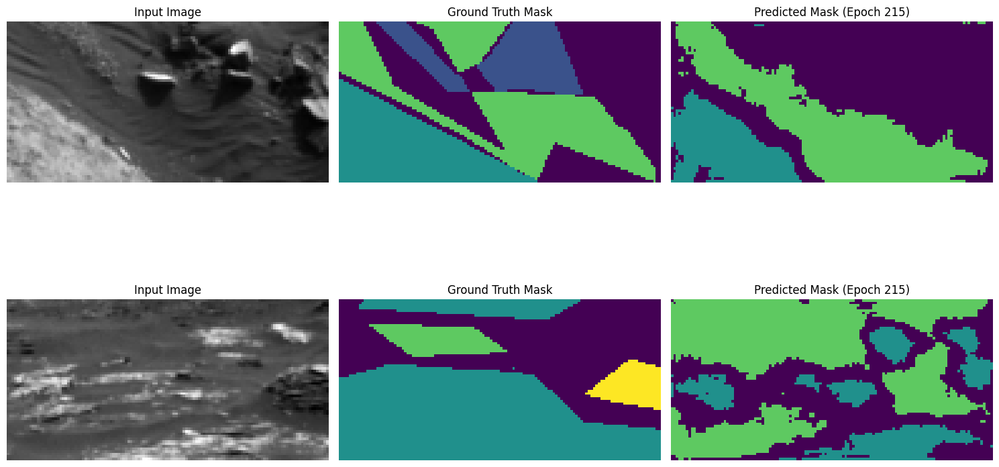

Epoch 216/250, Train Loss: 0.0542, Val Loss: 0.0630, Mean IoU: 0.3153
Class 0 IoU: 0.4276
Class 1 IoU: 0.2916
Class 2 IoU: 0.5175
Class 3 IoU: 0.0245


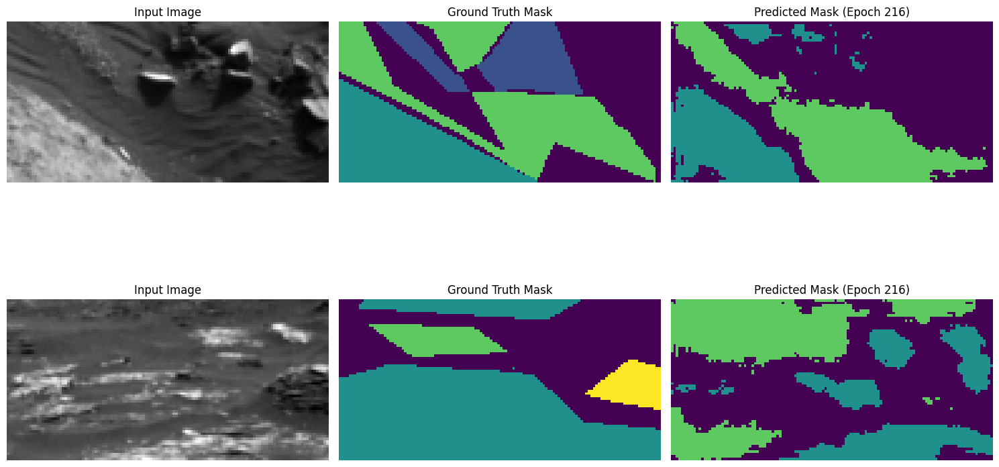

Epoch 217/250, Train Loss: 0.0556, Val Loss: 0.0640, Mean IoU: 0.3258
Class 0 IoU: 0.4573
Class 1 IoU: 0.2864
Class 2 IoU: 0.5417
Class 3 IoU: 0.0180


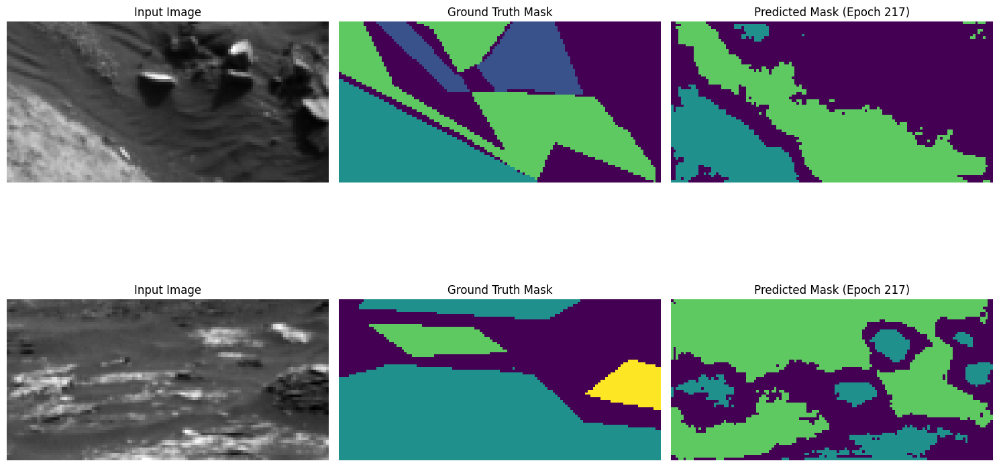

Epoch 218/250, Train Loss: 0.0564, Val Loss: 0.0587, Mean IoU: 0.3325
Class 0 IoU: 0.4500
Class 1 IoU: 0.2986
Class 2 IoU: 0.5290
Class 3 IoU: 0.0525


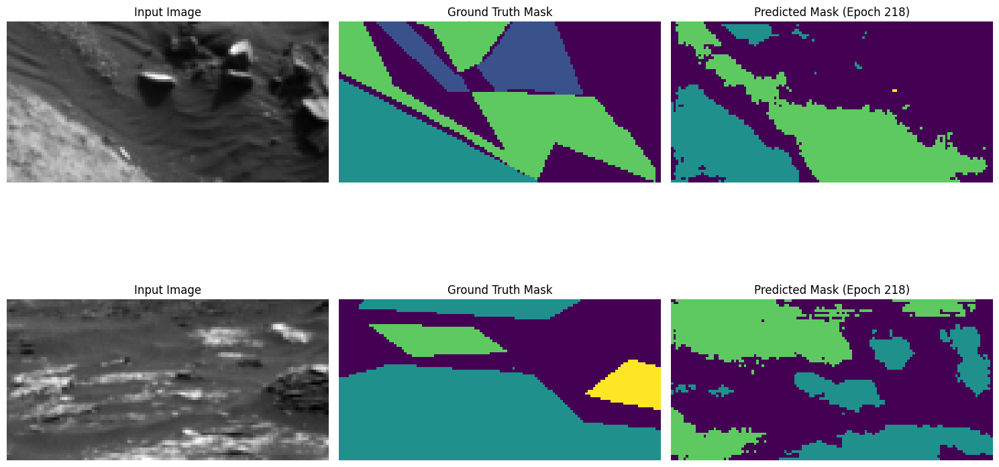

Epoch 219/250, Train Loss: 0.0548, Val Loss: 0.0599, Mean IoU: 0.3404
Class 0 IoU: 0.4757
Class 1 IoU: 0.2917
Class 2 IoU: 0.5379
Class 3 IoU: 0.0565


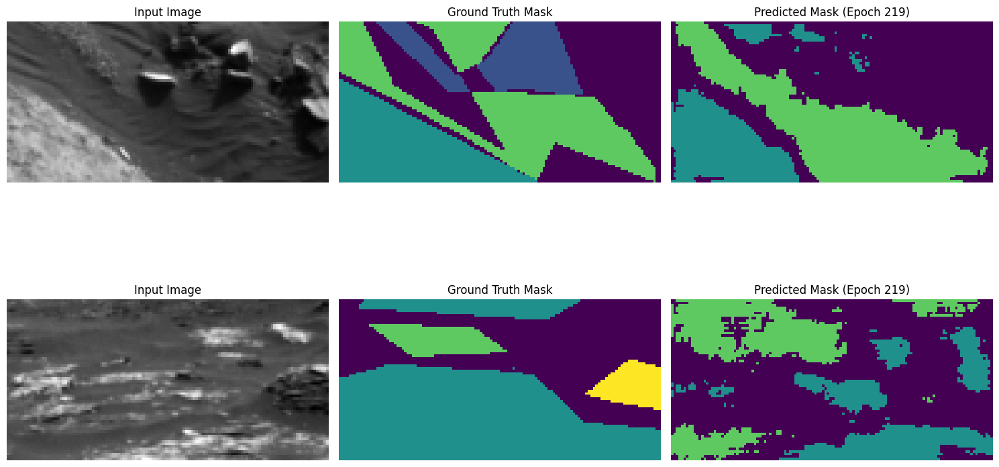

Epoch 220/250, Train Loss: 0.0544, Val Loss: 0.0603, Mean IoU: 0.3304
Class 0 IoU: 0.4640
Class 1 IoU: 0.2919
Class 2 IoU: 0.5329
Class 3 IoU: 0.0327


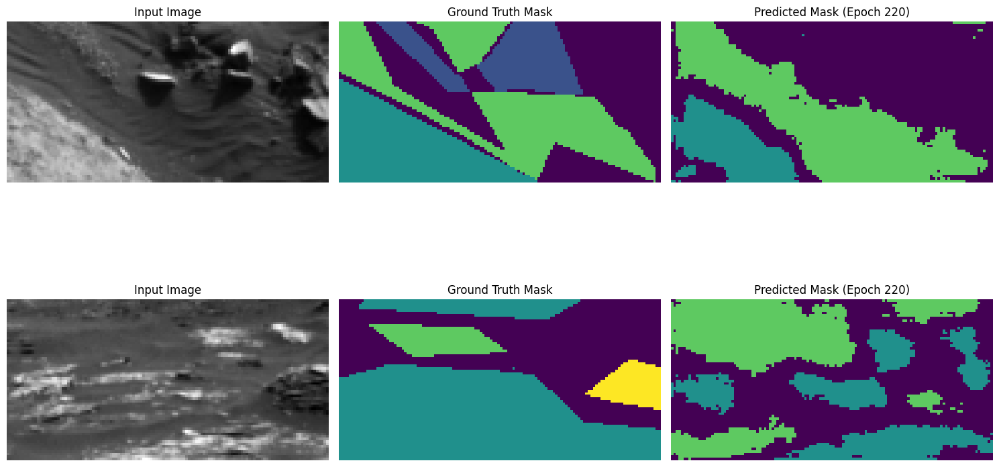

Epoch 221/250, Train Loss: 0.0541, Val Loss: 0.0617, Mean IoU: 0.3360
Class 0 IoU: 0.4588
Class 1 IoU: 0.3001
Class 2 IoU: 0.5386
Class 3 IoU: 0.0463


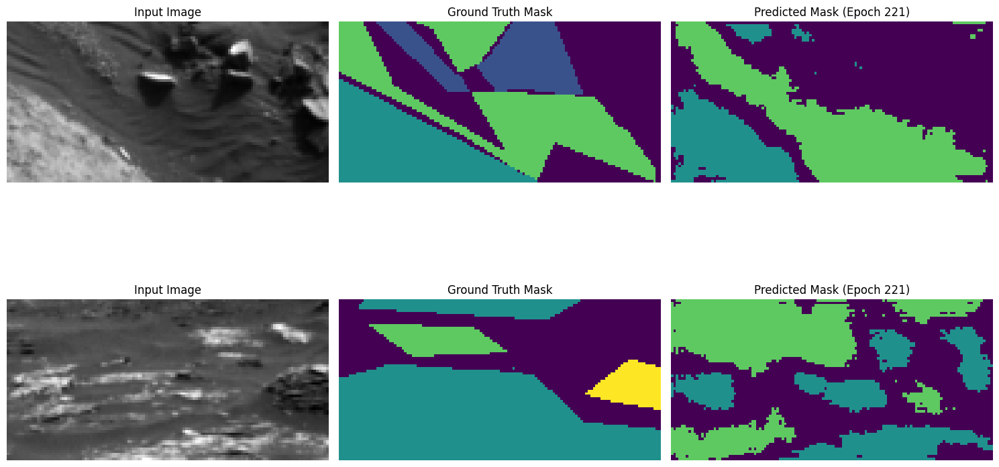

Epoch 222/250, Train Loss: 0.0543, Val Loss: 0.0616, Mean IoU: 0.3218
Class 0 IoU: 0.4475
Class 1 IoU: 0.2810
Class 2 IoU: 0.5307
Class 3 IoU: 0.0279


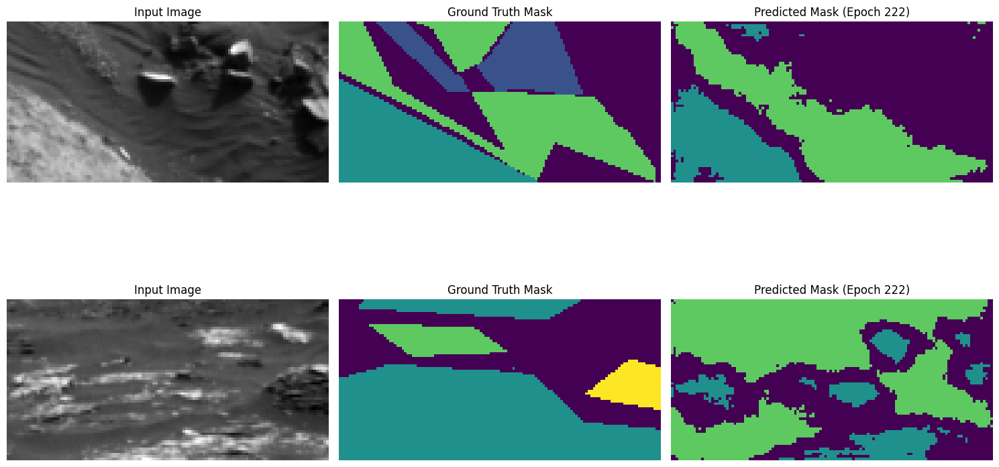

Epoch 223/250, Train Loss: 0.0547, Val Loss: 0.0588, Mean IoU: 0.3334
Class 0 IoU: 0.4550
Class 1 IoU: 0.2964
Class 2 IoU: 0.5338
Class 3 IoU: 0.0485


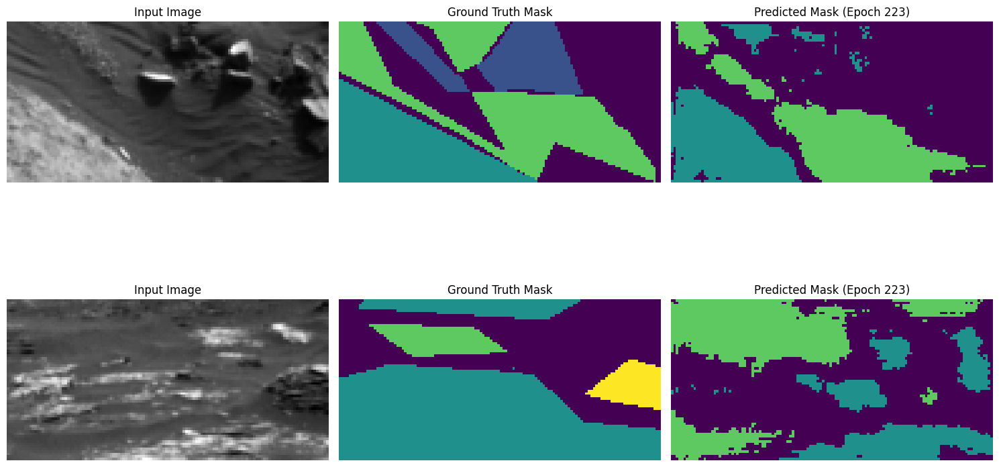

Epoch 224/250, Train Loss: 0.0571, Val Loss: 0.0642, Mean IoU: 0.3236
Class 0 IoU: 0.4652
Class 1 IoU: 0.2781
Class 2 IoU: 0.5278
Class 3 IoU: 0.0234


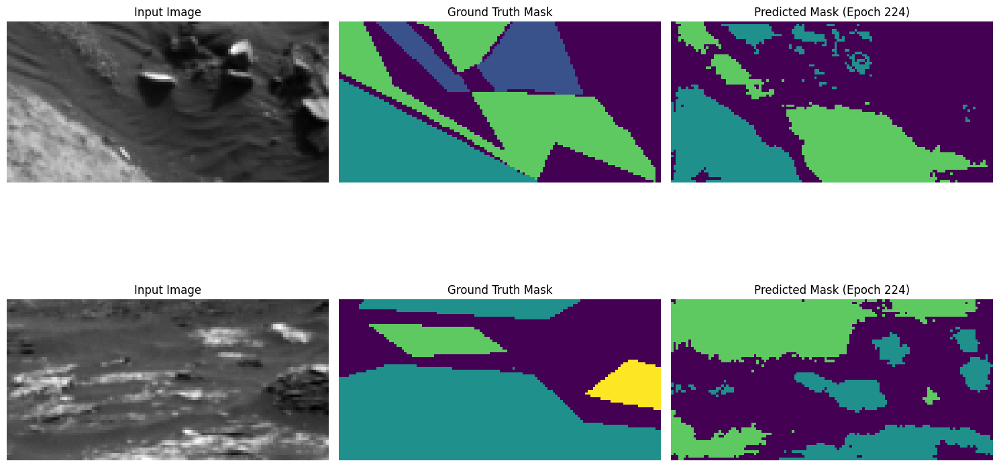

Epoch 225/250, Train Loss: 0.0562, Val Loss: 0.0613, Mean IoU: 0.3185
Class 0 IoU: 0.4245
Class 1 IoU: 0.2909
Class 2 IoU: 0.5302
Class 3 IoU: 0.0286


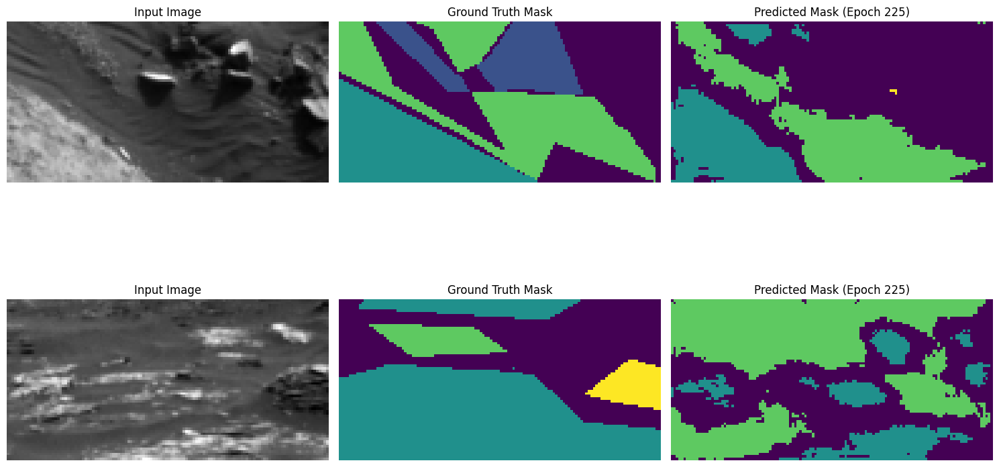

Epoch 226/250, Train Loss: 0.0583, Val Loss: 0.0628, Mean IoU: 0.3277
Class 0 IoU: 0.4592
Class 1 IoU: 0.2878
Class 2 IoU: 0.5363
Class 3 IoU: 0.0275


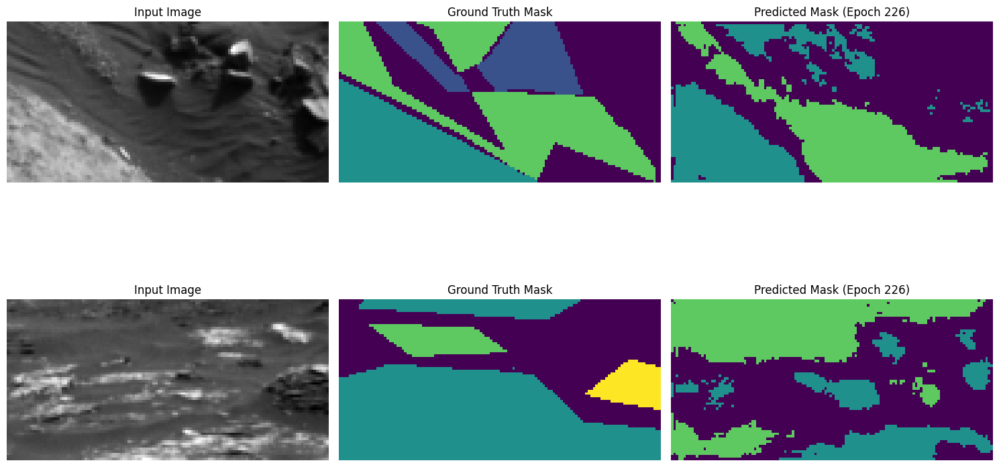

Epoch 227/250, Train Loss: 0.0566, Val Loss: 0.0633, Mean IoU: 0.3202
Class 0 IoU: 0.4348
Class 1 IoU: 0.2995
Class 2 IoU: 0.5294
Class 3 IoU: 0.0171


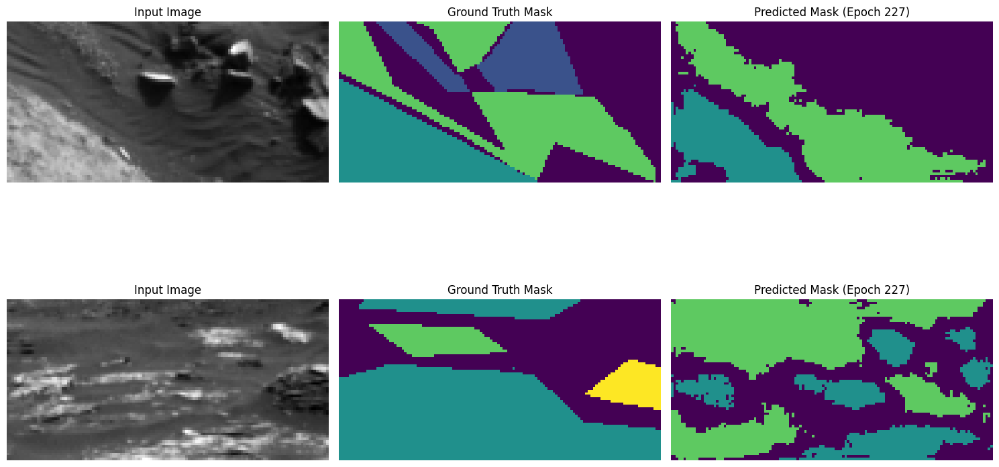

Epoch 228/250, Train Loss: 0.0555, Val Loss: 0.0605, Mean IoU: 0.3295
Class 0 IoU: 0.4425
Class 1 IoU: 0.2936
Class 2 IoU: 0.5356
Class 3 IoU: 0.0461


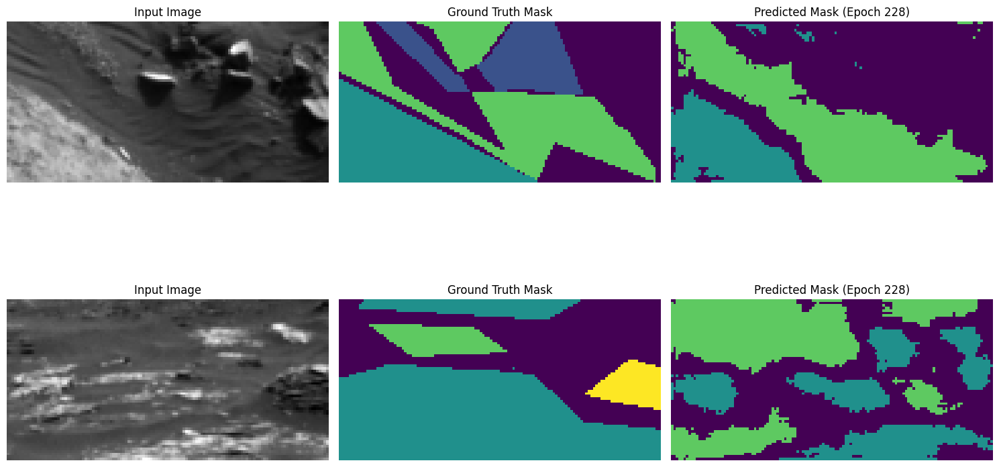

Epoch 229/250, Train Loss: 0.0574, Val Loss: 0.0636, Mean IoU: 0.3227
Class 0 IoU: 0.4531
Class 1 IoU: 0.2698
Class 2 IoU: 0.5463
Class 3 IoU: 0.0216


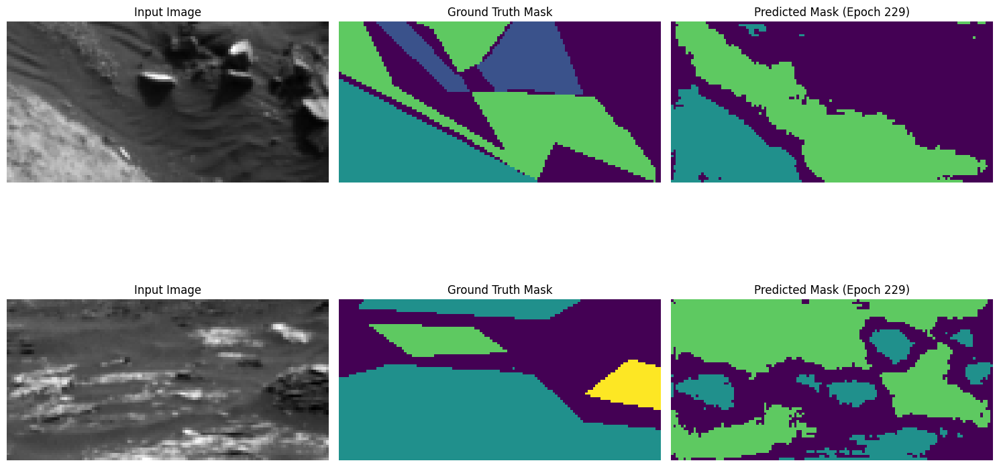

Epoch 230/250, Train Loss: 0.0531, Val Loss: 0.0612, Mean IoU: 0.3269
Class 0 IoU: 0.4453
Class 1 IoU: 0.2918
Class 2 IoU: 0.5355
Class 3 IoU: 0.0352


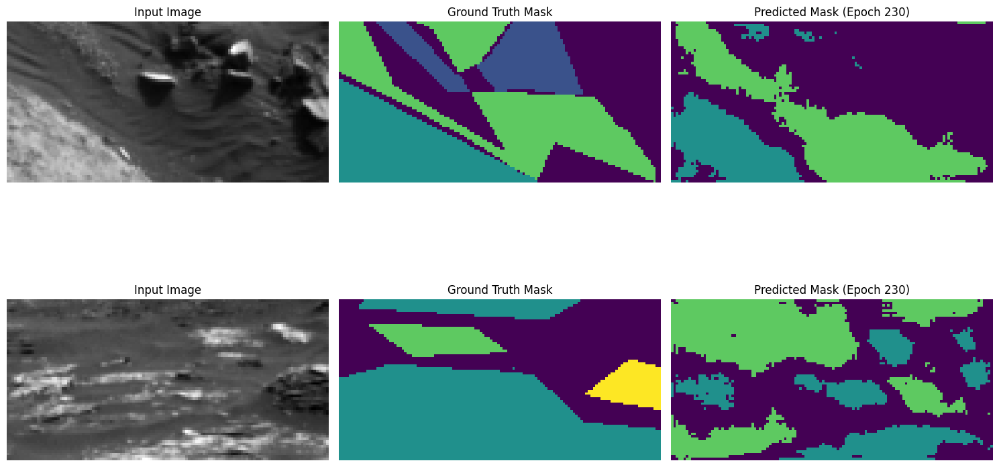

Epoch 231/250, Train Loss: 0.0561, Val Loss: 0.0672, Mean IoU: 0.3187
Class 0 IoU: 0.4514
Class 1 IoU: 0.2797
Class 2 IoU: 0.5371
Class 3 IoU: 0.0066


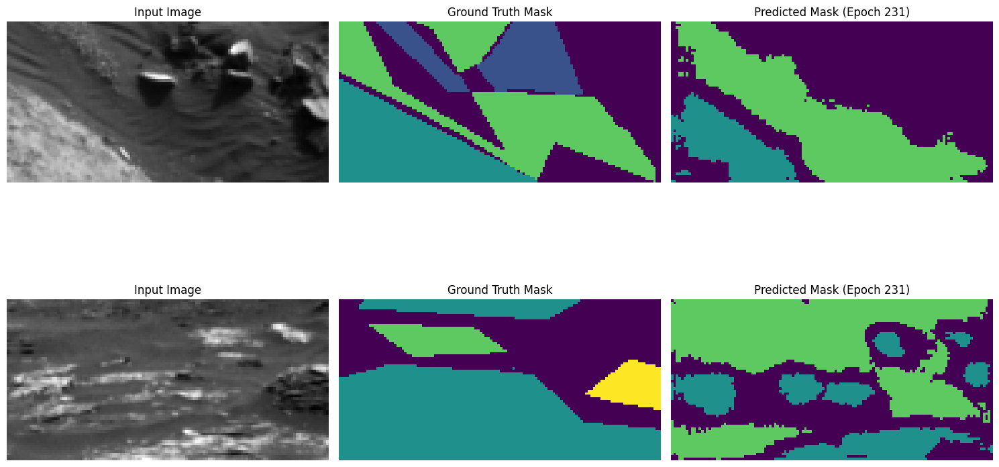

Epoch 232/250, Train Loss: 0.0558, Val Loss: 0.0614, Mean IoU: 0.3287
Class 0 IoU: 0.4356
Class 1 IoU: 0.2966
Class 2 IoU: 0.5291
Class 3 IoU: 0.0534


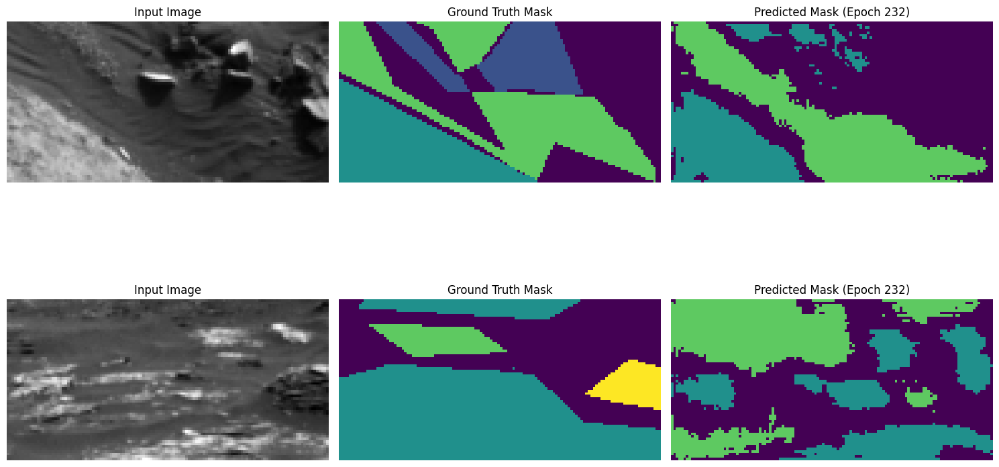

Epoch 233/250, Train Loss: 0.0541, Val Loss: 0.0645, Mean IoU: 0.3169
Class 0 IoU: 0.4355
Class 1 IoU: 0.2862
Class 2 IoU: 0.5292
Class 3 IoU: 0.0166


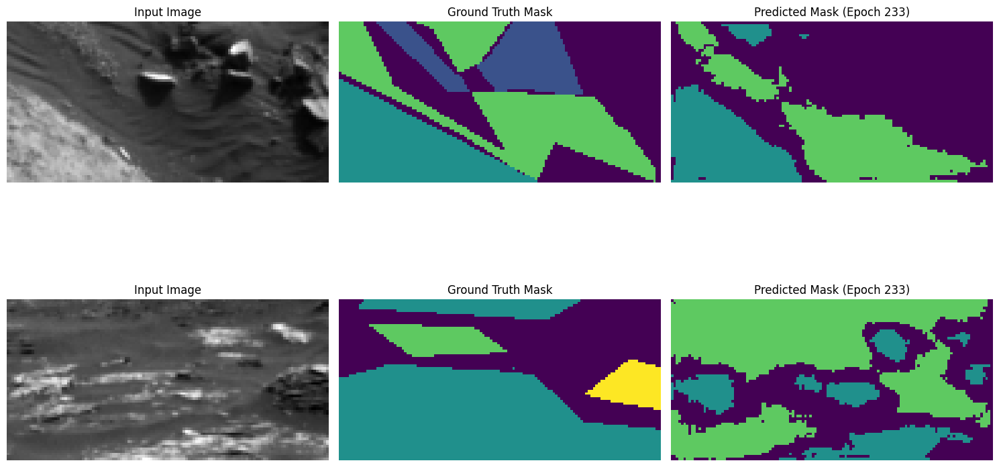

Epoch 234/250, Train Loss: 0.0529, Val Loss: 0.0640, Mean IoU: 0.3223
Class 0 IoU: 0.4479
Class 1 IoU: 0.2885
Class 2 IoU: 0.5343
Class 3 IoU: 0.0186


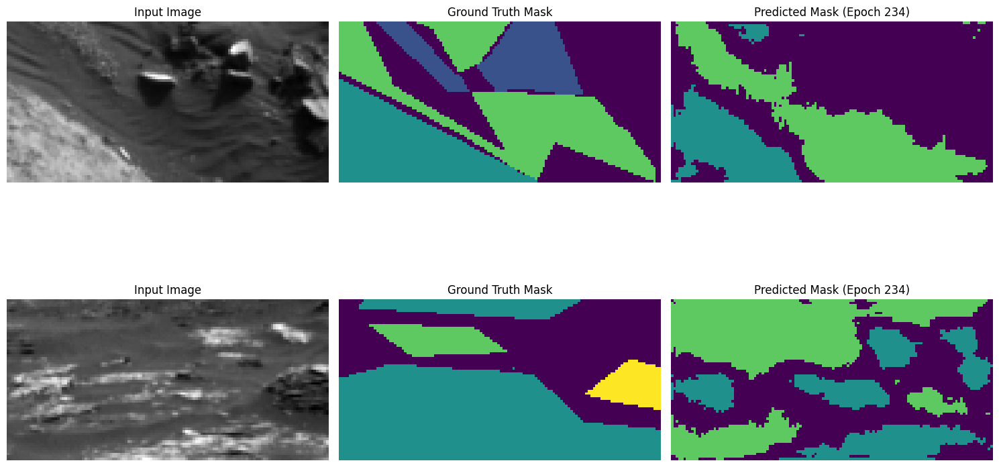

Epoch 235/250, Train Loss: 0.0575, Val Loss: 0.0599, Mean IoU: 0.3255
Class 0 IoU: 0.4303
Class 1 IoU: 0.2947
Class 2 IoU: 0.5199
Class 3 IoU: 0.0569


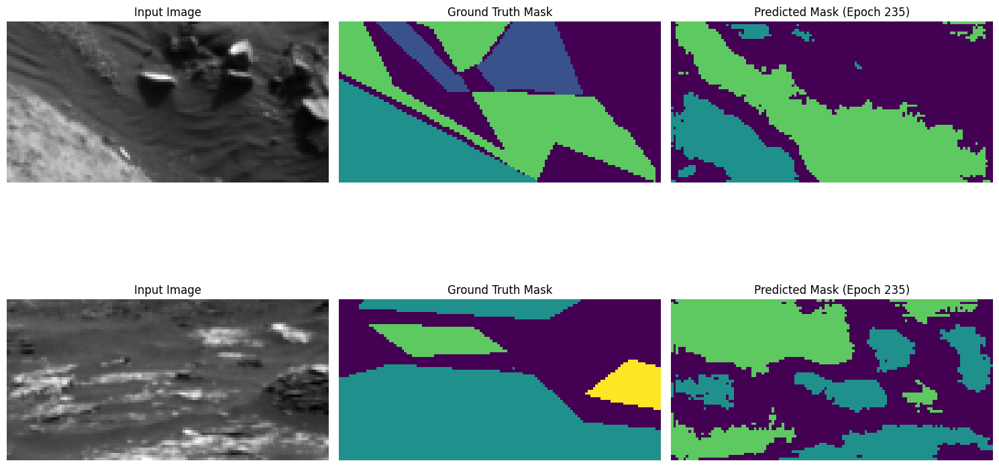

Epoch 236/250, Train Loss: 0.0563, Val Loss: 0.0578, Mean IoU: 0.3358
Class 0 IoU: 0.4645
Class 1 IoU: 0.2904
Class 2 IoU: 0.5274
Class 3 IoU: 0.0608


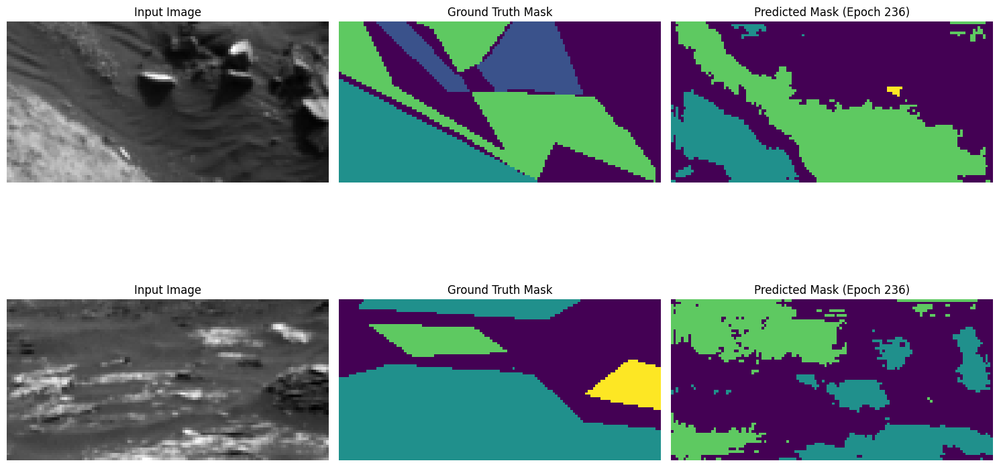

Epoch 237/250, Train Loss: 0.0581, Val Loss: 0.0596, Mean IoU: 0.3258
Class 0 IoU: 0.4482
Class 1 IoU: 0.2783
Class 2 IoU: 0.5358
Class 3 IoU: 0.0408


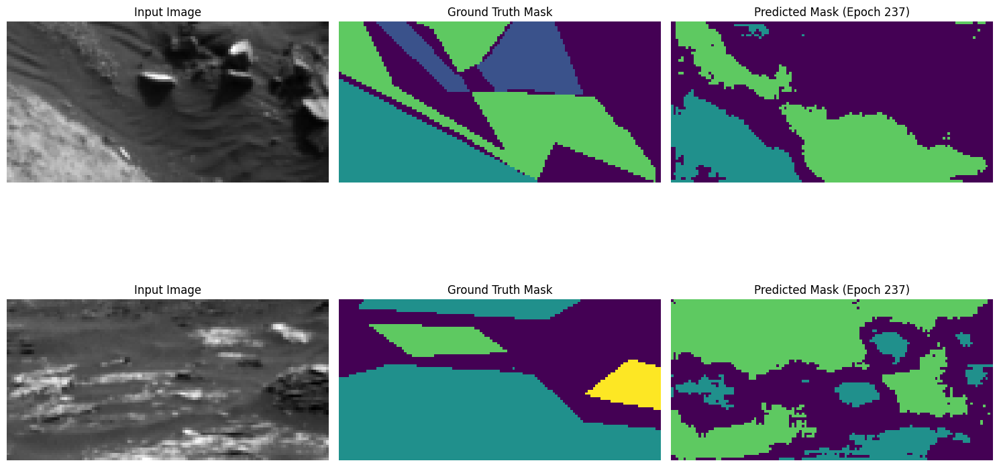

Epoch 238/250, Train Loss: 0.0570, Val Loss: 0.0644, Mean IoU: 0.3235
Class 0 IoU: 0.4445
Class 1 IoU: 0.2879
Class 2 IoU: 0.5411
Class 3 IoU: 0.0204


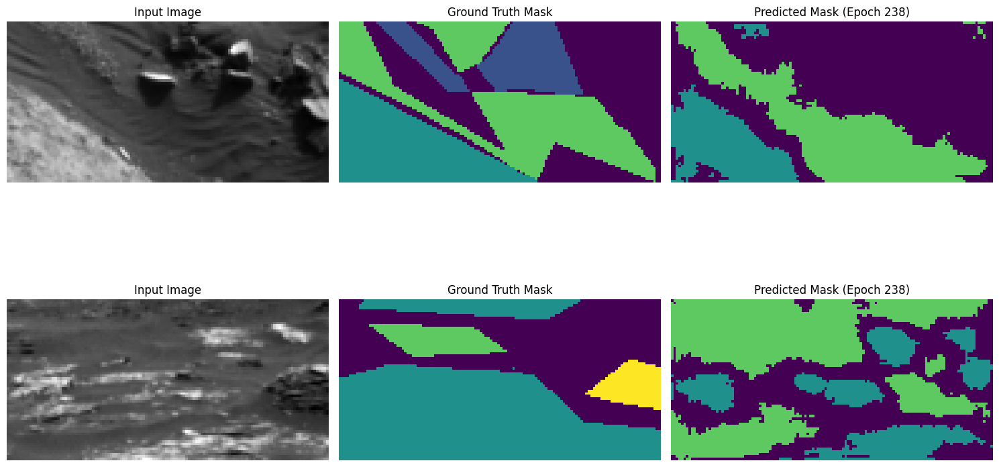

Epoch 239/250, Train Loss: 0.0566, Val Loss: 0.0602, Mean IoU: 0.3286
Class 0 IoU: 0.4500
Class 1 IoU: 0.2841
Class 2 IoU: 0.5410
Class 3 IoU: 0.0391


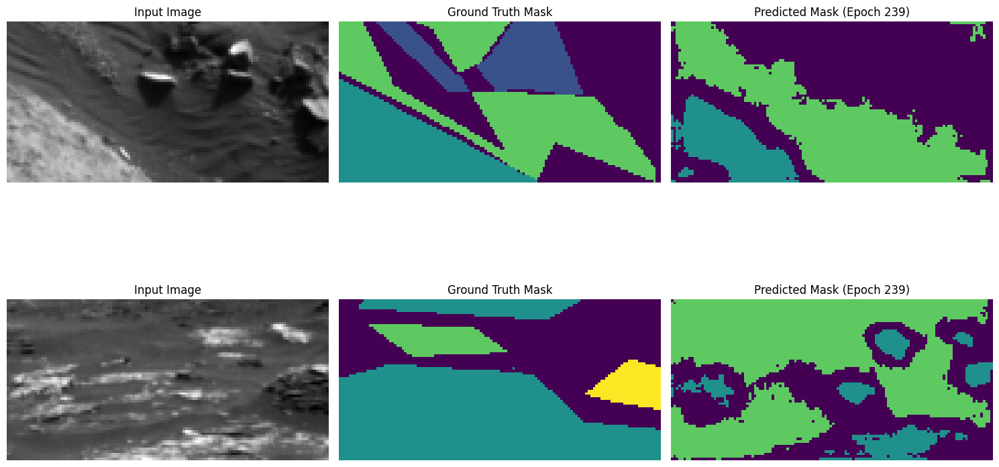

Epoch 240/250, Train Loss: 0.0539, Val Loss: 0.0625, Mean IoU: 0.3196
Class 0 IoU: 0.4382
Class 1 IoU: 0.2900
Class 2 IoU: 0.5264
Class 3 IoU: 0.0239


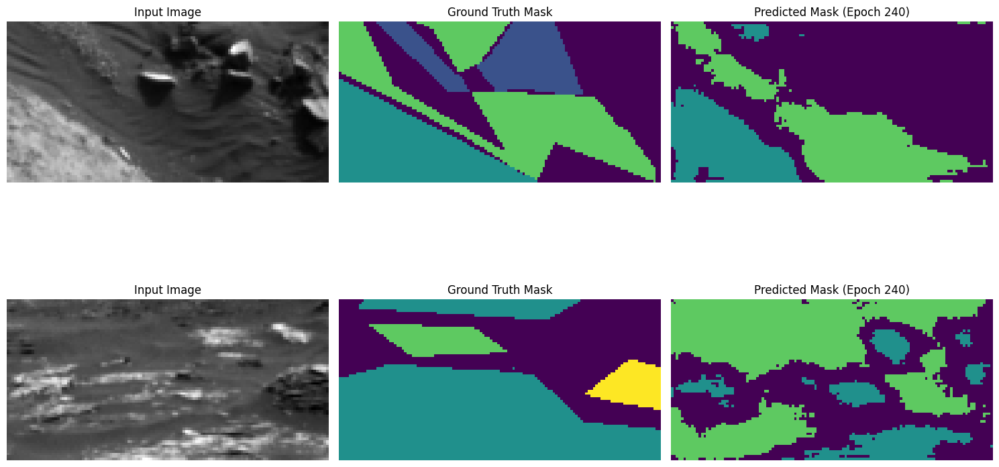

Epoch 241/250, Train Loss: 0.0553, Val Loss: 0.0619, Mean IoU: 0.3276
Class 0 IoU: 0.4549
Class 1 IoU: 0.2896
Class 2 IoU: 0.5284
Class 3 IoU: 0.0377


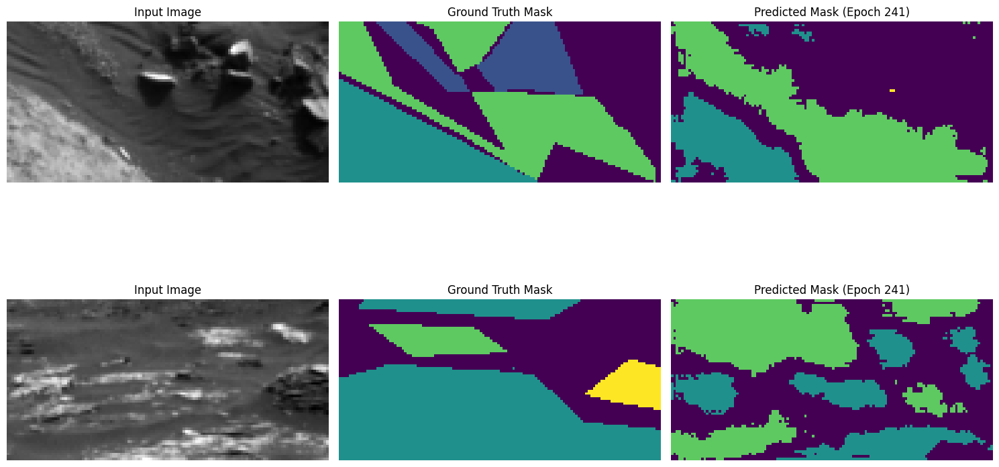

Epoch 242/250, Train Loss: 0.0526, Val Loss: 0.0652, Mean IoU: 0.3170
Class 0 IoU: 0.4417
Class 1 IoU: 0.2817
Class 2 IoU: 0.5281
Class 3 IoU: 0.0165


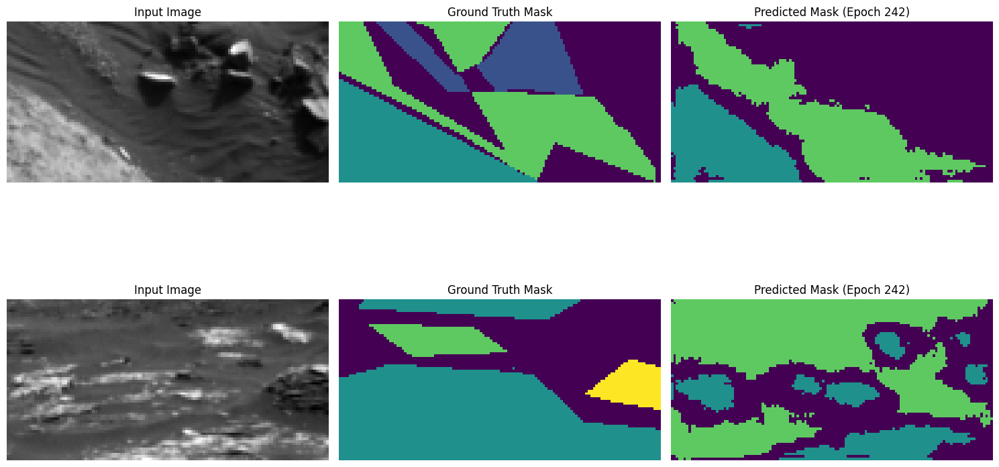

Epoch 243/250, Train Loss: 0.0581, Val Loss: 0.0585, Mean IoU: 0.3363
Class 0 IoU: 0.4497
Class 1 IoU: 0.2944
Class 2 IoU: 0.5342
Class 3 IoU: 0.0670


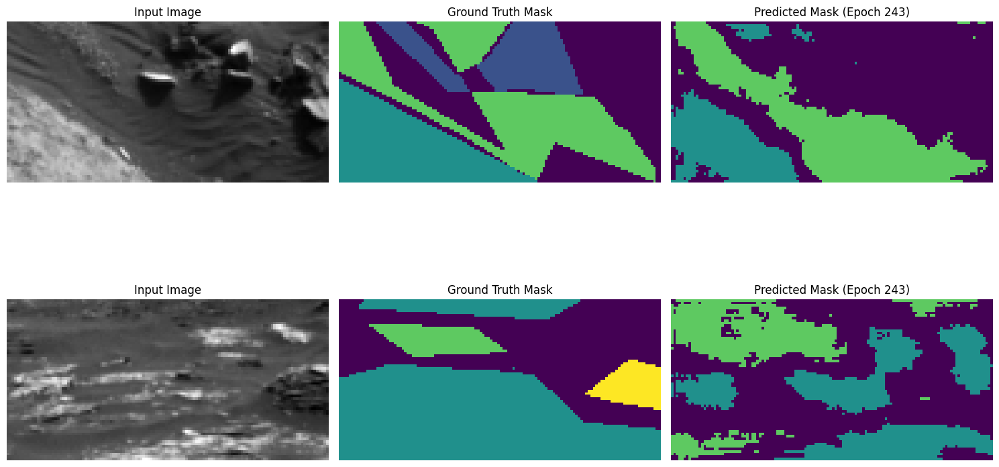

Epoch 244/250, Train Loss: 0.0561, Val Loss: 0.0585, Mean IoU: 0.3222
Class 0 IoU: 0.4242
Class 1 IoU: 0.2844
Class 2 IoU: 0.5277
Class 3 IoU: 0.0523


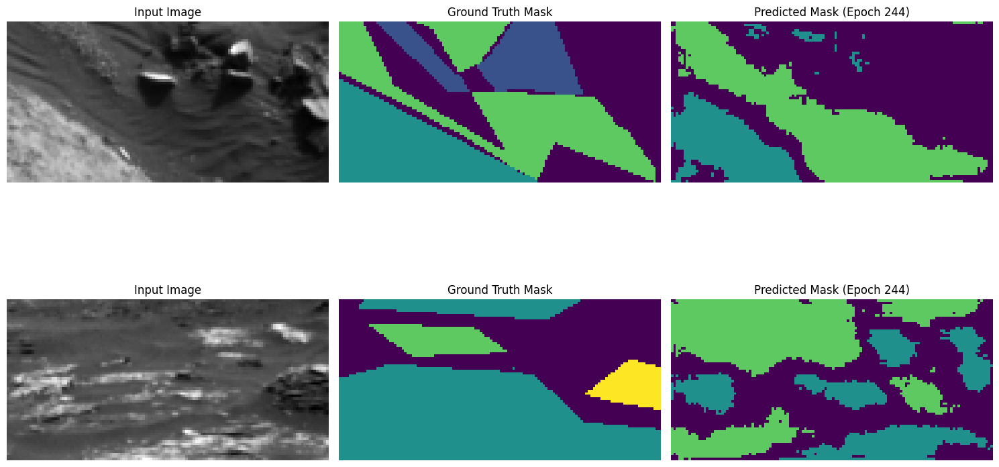

Epoch 245/250, Train Loss: 0.0541, Val Loss: 0.0641, Mean IoU: 0.3271
Class 0 IoU: 0.4625
Class 1 IoU: 0.2861
Class 2 IoU: 0.5381
Class 3 IoU: 0.0219


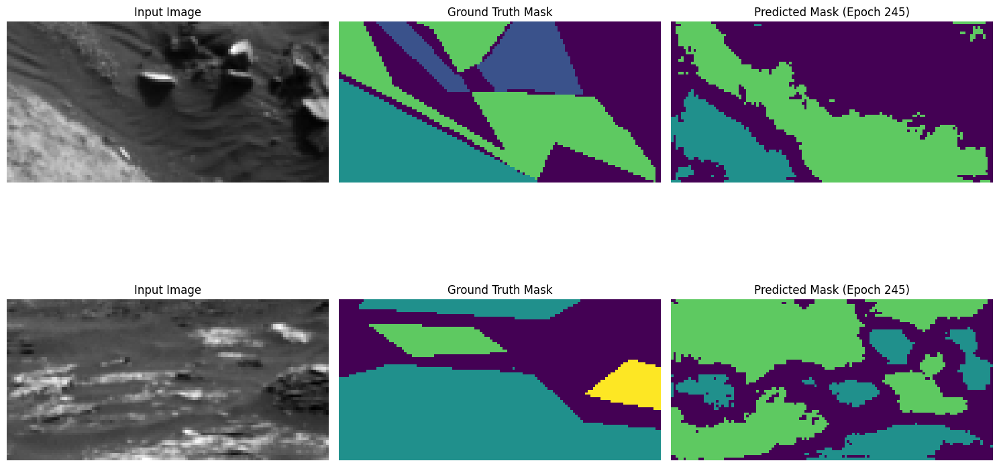

Epoch 246/250, Train Loss: 0.0569, Val Loss: 0.0615, Mean IoU: 0.3202
Class 0 IoU: 0.4346
Class 1 IoU: 0.2772
Class 2 IoU: 0.5311
Class 3 IoU: 0.0378


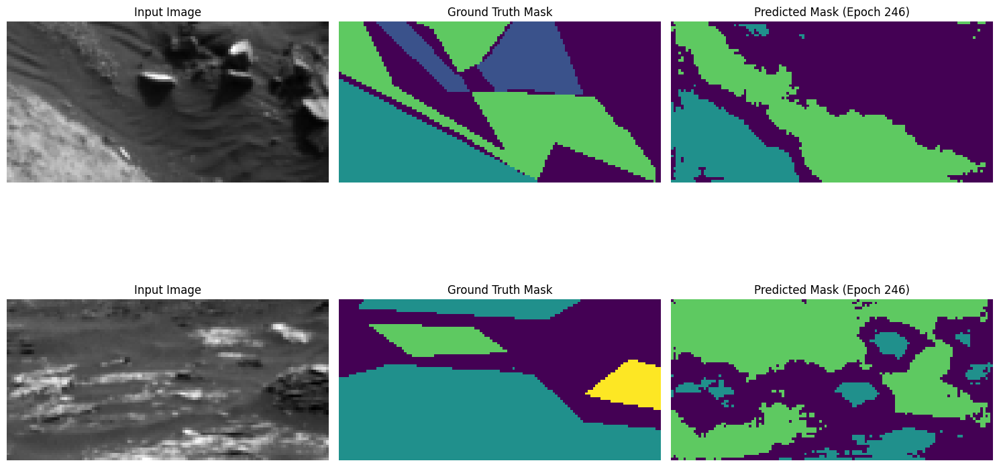

Epoch 247/250, Train Loss: 0.0548, Val Loss: 0.0608, Mean IoU: 0.3292
Class 0 IoU: 0.4321
Class 1 IoU: 0.2935
Class 2 IoU: 0.5440
Class 3 IoU: 0.0474


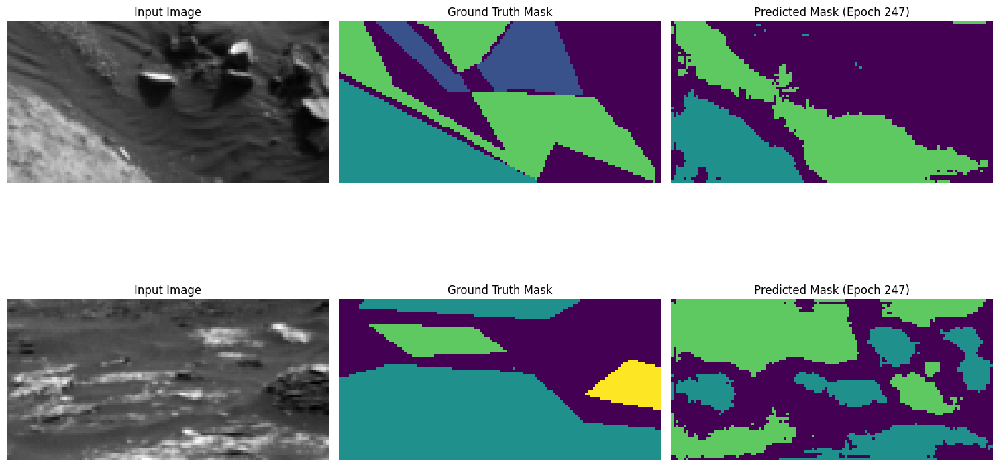

Epoch 248/250, Train Loss: 0.0544, Val Loss: 0.0663, Mean IoU: 0.3191
Class 0 IoU: 0.4533
Class 1 IoU: 0.2813
Class 2 IoU: 0.5311
Class 3 IoU: 0.0107


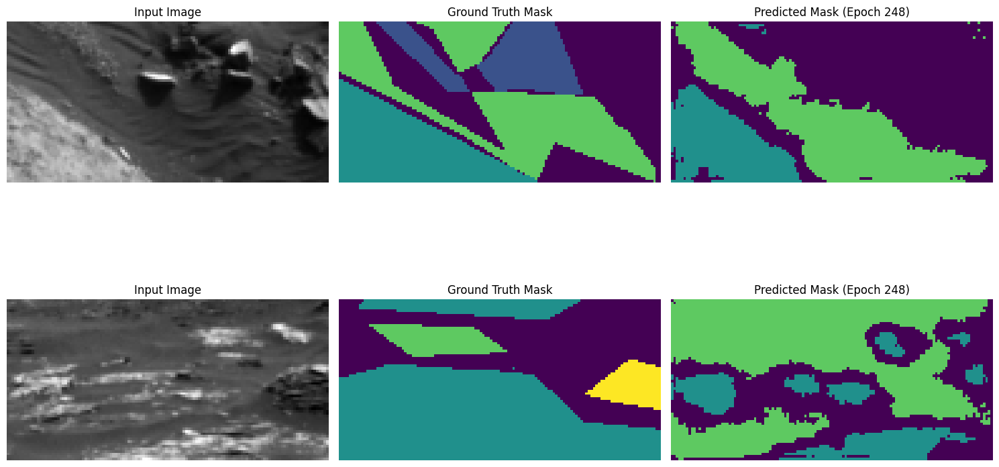

Epoch 249/250, Train Loss: 0.0543, Val Loss: 0.0634, Mean IoU: 0.3218
Class 0 IoU: 0.4371
Class 1 IoU: 0.2887
Class 2 IoU: 0.5368
Class 3 IoU: 0.0247


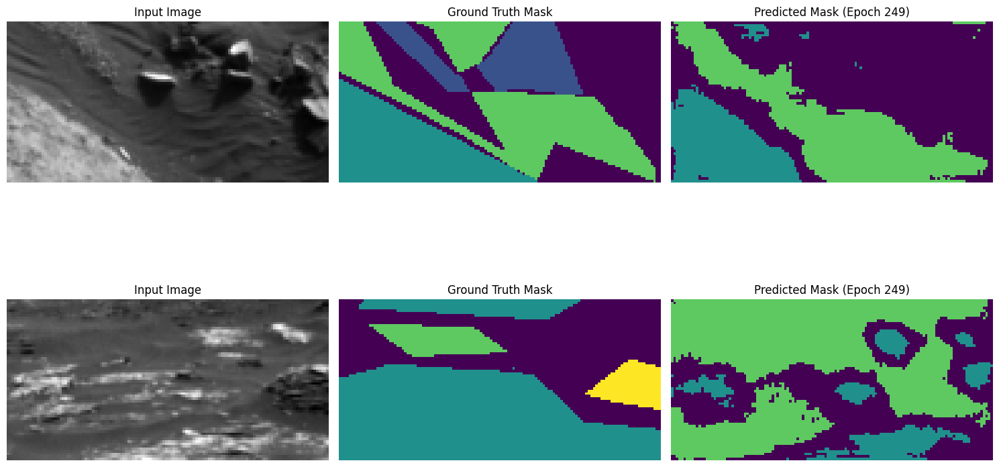

Epoch 250/250, Train Loss: 0.0545, Val Loss: 0.0617, Mean IoU: 0.3215
Class 0 IoU: 0.4365
Class 1 IoU: 0.2874
Class 2 IoU: 0.5343
Class 3 IoU: 0.0278


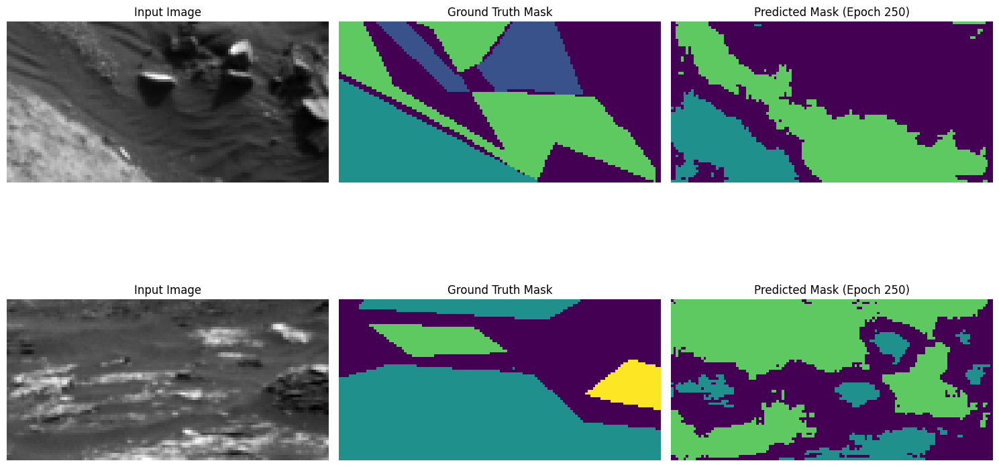

In [53]:
# Weighted Cross-Entropy Loss
class WeightedCrossEntropyLoss(nn.Module):
    def __init__(self, class_weights):
        super(WeightedCrossEntropyLoss, self).__init__()
        self.class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

    def forward(self, logits, targets):
        loss = F.cross_entropy(logits, targets, weight=self.class_weights)
        return loss

criterion = focal_loss

# Model initialization
def get_model():
    return smp.Unet(
        encoder_name=hyperparams["model"]["encoder_name"],
        encoder_weights=hyperparams["model"]["encoder_weights"],
        in_channels=hyperparams["model"]["input_channels"],
        classes=hyperparams["model"]["num_classes"],
    ).to(device)

model = get_model()
optimizer = torch.optim.Adam(model.parameters(), lr=hyperparams["training"]["learning_rate"])

# Add ReduceLROnPlateau scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, mode='min', factor=0.1, patience=50, min_lr=1e-6, verbose=True
)

# Function to calculate mean IoU
def calculate_mean_iou(y_true, y_pred, num_classes, ignore_class=0):
    ious = []
    for c in range(num_classes):
        if c == ignore_class:
            continue
        y_true_c = (y_true == c).astype(int)
        y_pred_c = (y_pred == c).astype(int)
        intersection = (y_true_c & y_pred_c).sum()
        union = (y_true_c | y_pred_c).sum()
        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)
    return np.mean(ious), ious

# Visualize predictions with at least 4 unique classes
def visualize_predictions(images, masks, predictions, epoch):
    # Filter images with at least 4 unique classes in the ground truth masks
    selected_indices = [i for i in range(len(masks)) if len(np.unique(masks[i])) >= 4]

    # Check if at least 2 such images exist
    if len(selected_indices) < 2:
        print("Not enough images with at least 4 unique classes for visualization.")
        return

    # Select the first 2 indices that satisfy the condition
    selected_indices = selected_indices[:2]

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    for idx, i in enumerate(selected_indices):  # Visualize 2 images
        axes[idx, 0].imshow(images[i].squeeze(), cmap="gray")
        axes[idx, 0].set_title("Input Image")
        axes[idx, 1].imshow(masks[i], cmap="viridis", vmin=0, vmax=4)
        axes[idx, 1].set_title("Ground Truth Mask")
        axes[idx, 2].imshow(predictions[i], cmap="viridis", vmin=0, vmax=4)
        axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
        axes[idx, 0].axis("off")
        axes[idx, 1].axis("off")
        axes[idx, 2].axis("off")
    plt.tight_layout()
    plt.show()
# Initialize DataLoaders
train_dataset = SegmentationDataset(X_train, y_train)
val_dataset = SegmentationDataset(X_val, y_val)
train_loader = DataLoader(train_dataset, batch_size=hyperparams["training"]["batch_size"], shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)

# Training loop
def train_model(model, train_loader, val_loader, hyperparams):
    best_val_loss = float("inf")
    best_val_mean_iou=0.0
    for epoch in range(hyperparams["training"]["num_epochs"]):
        model.train()
        train_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()

        # Validation step
        model.eval()
        val_loss = 0.0
        all_predictions = []
        all_masks = []
        all_images = []
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

                preds = torch.argmax(outputs, dim=1).cpu().numpy()
                all_predictions.extend(preds)
                all_masks.extend(masks.cpu().numpy())
                all_images.extend(images.cpu().numpy())

        # Calculate mean IoU
        mean_iou, per_class_ious = calculate_mean_iou(
            np.array(all_masks).flatten(),
            np.array(all_predictions).flatten(),
            num_classes=hyperparams["model"]["num_classes"],
            ignore_class=0,
        )

        print(f"Epoch {epoch+1}/{hyperparams['training']['num_epochs']}, "
              f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Mean IoU: {mean_iou:.4f}")

        # Per-class IoU
        for c, iou in enumerate(per_class_ious):
            print(f"Class {c} IoU: {iou:.4f}")

        # Visualization
        visualize_predictions(
            np.array(all_images),  # First 2 validation images
            np.array(all_masks),
            np.array(all_predictions),
            epoch,
        )

        # Update learning rate based on validation loss
        scheduler.step(val_loss)

        # Save best model based on mean IoU
        if mean_iou > best_val_mean_iou:
            best_val_mean_iou = mean_iou
            torch.save(model.state_dict(), "best_model.pth")
            print(f"Model saved with new best Mean IoU: {best_val_mean_iou:.4f}")

# Train the model
train_model(model, train_loader, val_loader, hyperparams)


In [54]:
# Predict on test set
def predict(model, test_loader):
    model.eval()
    predictions = []
    with torch.no_grad():
        for images in test_loader:
            images = images.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            predictions.extend(preds)
    return np.array(predictions)

test_dataset = SegmentationDataset(X_test)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
predictions = predict(model, test_loader)

# Save predictions to CSV
def save_predictions_to_csv(predictions, filename="submission.csv"):
    n_samples = predictions.shape[0]
    preds_flat = predictions.reshape(n_samples, -1)
    submission = pd.DataFrame(preds_flat)
    submission["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in submission.columns if col != "id"]
    submission = submission[cols]
    submission.to_csv(filename, index=False)
    print(f"Predictions saved to {filename}")

save_predictions_to_csv(predictions)

Predictions saved to submission.csv
